In [14]:
from IPython.display import display, HTML
display(HTML(data="""
<style>
    div#notebook-container { width: 95%;} div#menubar-container { width: 85%; } div#maintoolbar-container { width: 99%; } </style> """))
 
# %matplotlib inline

import os
import sys
import platform
import math
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import flopy
import flopy.utils.binaryfile as bf
from flopy.export.shapefile_utils import shp2recarray
from rasterio import Affine
from flopy.utils.reference import SpatialReference
from flopy.utils.postprocessing import get_transmissivities, get_water_table, get_gradients

import shapefile    # not used directly here but for some reason flopy needs this to do shapefile stuff and BTW its not import pyshp as you would think its import shapefile, dumb...
import pandas as pd
import fiona
from rasterio.features import rasterize
import rasterio
import rasterio.mask
import geopandas
from osgeo import gdal

#import simplekml
import ogr
from shapely.wkb import loads

from scipy.interpolate import interp2d
import scipy.optimize as opt


print(sys.version)
print('numpy version: {}'.format(np.__version__))
print('matplotlib version: {}'.format(mpl.__version__))
print('flopy version: {}'.format(flopy.__version__))

#Set name of MODFLOW exe
#  assumes executable is in users path statement
exe_name = 'mf2005'
if platform.system() == 'Windows':
    exe_name = 'mf2005.exe'

workspace = os.path.join("..", "..", 'RISA_yr6_GIT_ignored_files', 'Flo_py_wrkspace_3p2')
#make sure workspace directory exists
if not os.path.exists(workspace):
    os.makedirs(workspace)
    
figurespace = os.path.join(workspace, "Figures")
if not os.path.exists(figurespace):
    os.makedirs(figurespace)
    
WGS84UTM2S_string = 'PROJCS["WGS_1984_UTM_Zone_2S",GEOGCS["GCS_WGS_1984",DATUM["D_WGS_1984",SPHEROID["WGS_1984",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["Degree",0.017453292519943295]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-171],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["Meter",1]]'
pd.set_option('display.max_rows', 75)

# define the spatial reference object 
model_epsg = 32702   # epsg code specifying coordinate reference system: in this case, UTM zone 2S, WGS 84, A proj4 string has also been fetched from <spatialreference.org> using the supplied epsg code.

# in line plotting and saving options. Change these to plot or not to plot inline
Plotnsave_plot = True
Plotnsave_save = True

3.8.2 | packaged by conda-forge | (default, Feb 28 2020, 16:38:51) [MSC v.1916 64 bit (AMD64)]
numpy version: 1.18.1
matplotlib version: 3.1.3
flopy version: 3.3.0


# Model geometry notes


model boundaries square at 
X	Y
- 530200	8425825
- 537700	8425825
- 537700	8418325
- 530200	8418325

with length of 7500 m on both sides


next steps 
- try and just follow existing github model notebook 

Shapefile Boundaries: (530200.0, 8418325.0, 537700.0000000009, 8425825.000000002)
wrote ..\..\RISA_yr6_GIT_ignored_files\Flo_py_wrkspace_3p2\Model_polyarea.shp
wrote ..\..\RISA_yr6_GIT_ignored_files\Flo_py_wrkspace_3p2\Model_grid.shp


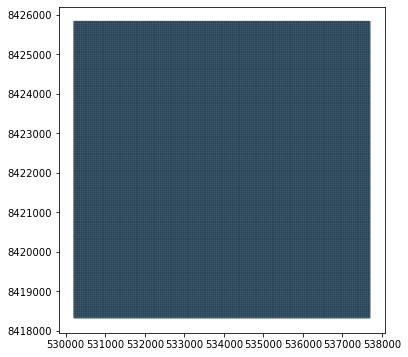

In [15]:
''' Define the number of layers, rows and columns.'''
# Note works at 100, 150, 300, 750
# Does not work at 600

ncol = 750
nrow = 750
nlay = 1

# model run times
nper = 1                     # Number of model stress periods (the default is 1)
perlen = [3650]              # An array of the stress period lengths in days separated by commas
nstp = [1]      # Number of time steps in each stress period (default is 1).
save_head = [3650]
steady = True
rotation = 0                             # rotation (positive counterclockwise)

# this cell inports the boundary shapefile to make the model around
ra = shp2recarray(os.path.join("..", "Data/Raw/GIS", 'model_square.shp'))
# these are the bondaries of the shapefile
shp_xmin = round(ra.geometry[0].bounds[0],1)
shp_ymin = round(ra.geometry[0].bounds[1],1)
shp_xmax = round(ra.geometry[0].bounds[2],1)
shp_ymax = round(ra.geometry[0].bounds[3],1)
print("Shapefile Boundaries: {}".format(ra.geometry[0].bounds))  

xll = int(shp_xmin)  # Lower left corner of model grid  
yll = int(shp_ymin)   # Lower left corner of model grid 


# grid spacing as a percentage of model x domain (in model units) note 10% buffer around boundary
delr = abs(int((shp_xmax-shp_xmin)/ncol))   # the width of each cell
delc = abs(int((shp_ymax-shp_ymin)/nrow))   # the height of eech cell
delr_4_sr  = np.ones(ncol, dtype=float) * delr    # This just puts the above into an array for the sr object 
delc_4_sr = np.ones(nrow, dtype=float) * delc   

# create the model boundary area polygon
sr = SpatialReference(delr=[delr_4_sr.sum()], delc=[delc_4_sr.sum()], xll=xll, yll=yll, rotation=rotation, proj4_str=WGS84UTM2S_string, lenuni=2) #  # model length units (1 for feet, 2 for meters (default)) (also calculeted uper left corner of model) 
sr.write_shapefile(os.path.join(workspace, 'Model_polyarea.shp'))          # write a shapefile of the model area for later use
prj = open(os.path.join(workspace, 'Model_polyarea.prj'), "w"); prj.write(WGS84UTM2S_string) ; prj.close()     # write the .prj file manually
#print("corners are at {}".format(sr.get_extent()))

# create the model boundary grid polygon   (NOTE THIS MUST OVERWRITE THe PREVIOUS sr. definition!)
sr = SpatialReference(delr=delr_4_sr, delc=delc_4_sr, xll=xll, yll=yll, rotation=rotation, proj4_str= '+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs' , lenuni=2) #  # model length units (1 for feet, 2 for meters (default)) (also calculeted uper left corner of model) 
sr.write_shapefile(os.path.join(workspace, 'Model_grid.shp'))          # write a shapefile of the model grid for later use
prj = open(os.path.join(workspace, 'Model_grid.prj'), "w"); prj.write(WGS84UTM2S_string) ; prj.close()   # write the .prj file manually

# output control parameters
spd = {(0, 0): ['print head', 'print budget', 'save head', 'save budget']}    

if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize=(12,6))
    Tutuila = geopandas.read_file(os.path.join("..", "Data/Raw/GIS", 'model_square.shp'))
    Grid = geopandas.read_file(os.path.join(workspace, 'Model_grid.shp'))
    Grid.plot(ax=ax, facecolor="white", edgecolor="Black", linewidth=.2)
    Tutuila.plot(ax=ax, linewidth=2, alpha = .3)

### Assign Layer elevations from a DEM

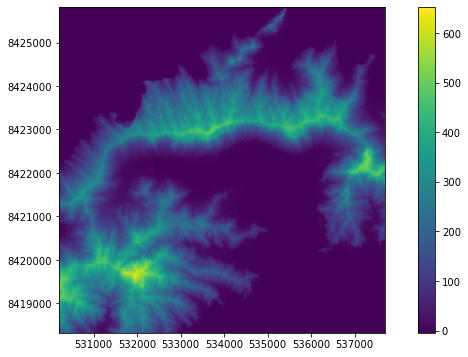

In [16]:
#Set model top to DEM
# Needed to clip the raster to appropriate dimensions, () https://rasterio.readthedocs.io/en/stable/topics/masking-by-shapefile.html)
Raster_2_Clip = os.path.join("..",  'Data/Raw/GIS/3m_DEM', '3m_dem_cp.tif')
Clipped_raster = os.path.join(workspace, "DEM_10m_clip.asc")

with fiona.open(os.path.join(workspace, 'Model_polyarea.shp'), "r") as shapefile:
    features = [feature["geometry"] for feature in shapefile]
    
with rasterio.open(Raster_2_Clip) as src:
    out_image, out_transform = rasterio.mask.mask(src, features,
                                                        crop=True)
out_meta = src.meta.copy()

out_meta.update({"driver": "AAIGrid",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})
with rasterio.open(Clipped_raster, "w", **out_meta) as dest:
    dest.write(out_image)
    
# Now disect the clipped .asc into a 
Top_raw = np.loadtxt(Clipped_raster, skiprows=7)   # the 7th row was a no data row for some reason not sure why, if another DEM is used might need to skiprows back to 6

y = np.linspace(0, np.shape(Top_raw)[0]-1, np.shape(Top_raw)[0])   
x = np.linspace(0, np.shape(Top_raw)[1]-1, np.shape(Top_raw)[1])

y2 = np.linspace(0, np.shape(y)[0], nrow)   # this defines the number of cells to resample to on the y direction, first number is the original height of the SWB2 recharge map, second number is going to be new height in # of cells
x2 = np.linspace(0, np.shape(x)[0], ncol)   # this defines the number of cells to resample to on the x direction, first number is the original width of the SWB2 recharge map, second number is going to be new width in # of cells

f = interp2d(x, y, Top_raw, kind='cubic')
top = f(x2, y2)

botm = -500    # this will clearly need to change to accomadate the Tutuila bathymetry
top = np.where(top <= botm, botm+10, top) # force top elevations to always be higher than bottom elevations

if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize = (12,6))
    qm = sr.plot_array(top, ax=ax)
    ax.set_aspect(1); plt.colorbar(qm)

Starting heads will be tricky.  Easiest might be to assign starting heads of 0.01 in ocean, then heads of 10 m less than top elevation in land surface areas, if optimization yields different starting heads then can modify. could also use the ending heads from the regional model. 


overall, I bound needs to be 

### starting heads

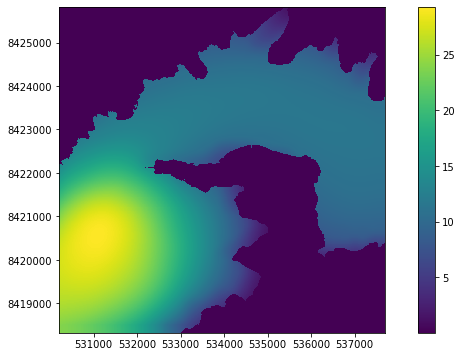

In [17]:
## First import regional heads from the regional model

Raster_2_Clip = os.path.join("..",  'Data/From_regional', 'PyPCGA_model_Heads_Clip.tif')
Clipped_raster = os.path.join(workspace, "PyPCGA_model_Heads_Clip.asc")

with fiona.open(os.path.join(workspace, 'Model_polyarea.shp'), "r") as shapefile:
    features = [feature["geometry"] for feature in shapefile]
    
with rasterio.open(Raster_2_Clip) as src:
    out_image, out_transform = rasterio.mask.mask(src, features,
                                                        crop=True)
out_meta = src.meta.copy()

out_meta.update({"driver": "AAIGrid",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})
with rasterio.open(Clipped_raster, "w", **out_meta) as dest:
    dest.write(out_image)
    
# Now disect the clipped .asc into a 
Top_raw = np.loadtxt(Clipped_raster, skiprows=7)   # the 7th row was a no data row for some reason not sure why, if another DEM is used might need to skiprows back to 6

y = np.linspace(0, np.shape(Top_raw)[0]-1, np.shape(Top_raw)[0])   
x = np.linspace(0, np.shape(Top_raw)[1]-1, np.shape(Top_raw)[1])

y2 = np.linspace(0, np.shape(y)[0], nrow)   # this defines the number of cells to resample to on the y direction, first number is the original height of the SWB2 recharge map, second number is going to be new height in # of cells
x2 = np.linspace(0, np.shape(x)[0], ncol)   # this defines the number of cells to resample to on the x direction, first number is the original width of the SWB2 recharge map, second number is going to be new width in # of cells

f = interp2d(x, y, Top_raw, kind='cubic')
regional_Heads = f(x2, y2)

#botm = -500    # this will clearly need to change to accomadate the Tutuila bathymetry
#top = np.where(top <= botm, botm+10, top) # force top elevations to always be higher than bottom elevations


# then explicitly say that the ocean area has a specified head, since the regional heads are fuzzy

with fiona.open(os.path.join("..",  'Data/Raw/GIS/ibounds/For_heads', 'Land_Ocean.shp')) as src:   #    read in Tutuila shapefile
    records = [r for r in src] 
geoms = [r['geometry'] for r in records]       # shapefile shape
attr = [r['properties'] for r in records]      # shapefile attributes
geoms = [(g, attr[i]['OceanCell'])for i, g in enumerate(geoms) ]              # select the attribute to map onto the raster grid
# affine: work with the geometry to change from raster to grid reference frame 
trans = Affine(delr, rotation, sr.xul, sr.rotation, -delc, sr.yul)
mask = rasterize(geoms, out_shape=(nrow, ncol), transform=trans) # the actual rasterization 

masked_heads = abs(regional_Heads)*mask                        # set ocean cells to a negative number through multoplication with -1
Ocean_starting_head = 0.01   # in meters 
start_heads = np.where(masked_heads < 0, Ocean_starting_head, masked_heads) # Set ocean cells (defined as any negative values in the array) to Ocean_starting_head value

if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize = (12,6))
    qm = sr.plot_array(start_heads, ax=ax)
    ax.set_aspect(1); plt.colorbar(qm)

### make new ibound and specified head 
- Negative ibound (-1) is constant head
- Ibound of (0) is inactive
- Any positive Ibound (1) is variable head (active) 

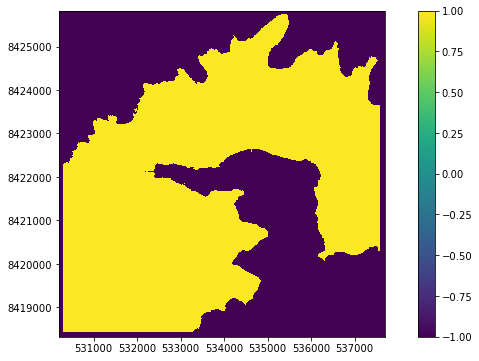

In [18]:
#### Use a Tutuila polygon to define the model active area as the island and the ghb cells as the offshore cells

with fiona.open(os.path.join("..", 'Data/Raw/GIS/ibounds', 'ibound_specHd_w_100m_buff.shp')) as src:   #    read in Tutuila shapefile
    records = [r for r in src] 
geoms = [r['geometry'] for r in records]       # shapefile shape
attr = [r['properties'] for r in records]      # shapefile attributes
geoms = [(g, attr[i]['ibound'])for i, g in enumerate(geoms) ]              # select the attribute to map onto the raster grid
# affine: work with the geometry to change from raster to grid reference frame 
trans = Affine(delr, rotation, sr.xul, sr.rotation, -delc, sr.yul)
ibound = rasterize(geoms, out_shape=(nrow, ncol), transform=trans) # the actual rasterization 

if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize = (12,6))
    qm = sr.plot_array(ibound, ax=ax)
    ax.set_aspect(1); plt.colorbar(qm)

### Create Drains 
this takes a minute

<ipython-input-19-bee9a9ac653a>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  intersections['RastVal'][intersections['RastVal'] > 3] = intersections['RastVal'] - 1
<ipython-input-19-bee9a9ac653a>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  intersections['RastVal'][intersections['RastVal'] == 0] = 0.1  #(will make pink box)


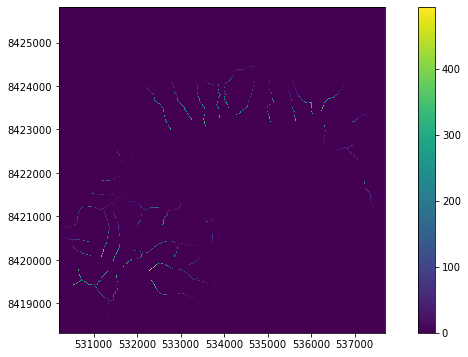

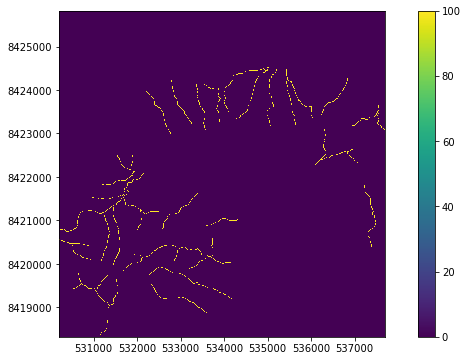

In [19]:
conductance_value = 3000

# Intersect streams with the grid cells using GEOPANDAS!! :)
lines = geopandas.GeoDataFrame.from_file(os.path.join("..", "Data/Raw/GIS", "Streams", 'Streams_Simplified_WGS2S.shp'))
poly = geopandas.GeoDataFrame.from_file(os.path.join(workspace, 'Model_grid.shp'))
# Do the spatial intersect to just pull out cells that hit streams
intersections= geopandas.sjoin(poly, lines, how="inner", op='intersects')
intersections["x"] = intersections.centroid.x # pull out the x coordiate
intersections["y"] = intersections.centroid.y # pull out the y coordiate
intersections["Cond"] = conductance_value
# Write the geopandas dataframe to a esri shapefile 
intersections.to_file(driver = 'ESRI Shapefile', filename = os.path.join(workspace, 'Stream_grid_intersects.shp'))          # write a shapefile of the model grid for later use
prj = open(os.path.join(workspace, 'Stream_grid_intersects.prj'), "w"); prj.write(WGS84UTM2S_string) ; prj.close()   # write the .prj file manually

# Extract elevation values to the points from the DEM
Clipped_DEM_raster = os.path.join(workspace, "DEM_10m_clip.asc")   # from the DEM used above
src = rasterio.open(Clipped_DEM_raster) 
coords = [(x,y) for x, y in zip(intersections["x"], intersections["y"])]  # This woll pull the cooordinate values out of the centrods of the intersections frame above
intersections['RastVal'] = [x[0] for x in src.sample(coords)]

# Modify elevations a bit
intersections['RastVal'][intersections['RastVal'] > 3] = intersections['RastVal'] - 1

# Reset any values that ended up as 0s
intersections['RastVal'][intersections['RastVal'] == 0] = 0.1  #(will make pink box)

# Write to shapefile 
intersections.to_file(driver = 'ESRI Shapefile', filename = os.path.join(workspace, 'Stream_grid_intersects_Elevations.shp'))          # write a shapefile of the model grid for later use
prj = open(os.path.join(workspace, 'Stream_grid_intersects_Elevations.prj'), "w"); prj.write(WGS84UTM2S_string) ; prj.close()   # write the .prj file manually


# Create a model square array with the point values elevation as the elevation 
with fiona.open(os.path.join(workspace, 'Stream_grid_intersects_Elevations.shp')) as src:   #    read in Tutuila shapefile
    records = [r for r in src] 
geoms = [r['geometry'] for r in records]       # shapefile shape
attr = [r['properties'] for r in records]      # shapefile attributes
geoms = [(g, attr[i]['RastVal'])for i, g in enumerate(geoms) ]              # select the attribute to map onto the raster grid
# affine: work with the geometry to change from raster to grid reference frame 
trans = Affine(delr, rotation, sr.xul, sr.rotation, -delc, sr.yul)
Stream_elev = rasterize(geoms, out_shape=(nrow, ncol), transform=trans) # the actual rasterization 

if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize = (12,6))
    qm = sr.plot_array(Stream_elev, ax=ax)
    ax.set_aspect(1); plt.colorbar(qm)

# Create a model square array with the point values conductance defined as whatever.
with fiona.open(os.path.join(workspace, 'Stream_grid_intersects_Elevations.shp')) as src:   #    read in Tutuila shapefile
    records = [r for r in src] 
geoms = [r['geometry'] for r in records]       # shapefile shape
attr = [r['properties'] for r in records]      # shapefile attributes
geoms = [(g, attr[i]['Cond'])for i, g in enumerate(geoms) ]              # select the attribute to map onto the raster grid
# affine: work with the geometry to change from raster to grid reference frame 
trans = Affine(delr, rotation, sr.xul, sr.rotation, -delc, sr.yul)
Stream_conductance = rasterize(geoms, out_shape=(nrow, ncol), transform=trans) # the actual rasterization 

if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize = (12,6))
    qm = sr.plot_array(Stream_conductance, ax=ax)
    ax.set_aspect(1); plt.colorbar(qm)

# Save in Flopy friendly format
drnElv_lst = pd.DataFrame({
                 'lay':  0,
                 'row':  np.nonzero(Stream_elev)[0], # + 1,
                 'col':  np.nonzero(Stream_elev)[1], # + 1,
                 'elv':  Stream_elev[np.nonzero(Stream_elev)],
                 'cond': Stream_conductance[np.nonzero(Stream_conductance)]}, 
             columns=['lay', 'row', 'col', 'elv', 'cond'])

# Convert the DataFrame into a list of lists for the drn constructor
stress_period_data = drnElv_lst.values.tolist()

# Create a dictionary, 1 entry for each of the stress periods.
stress_period_data_drain = {0: stress_period_data}    

### Pumping wells 
Using ASPA data and the average pumprates 2005-2017 based on ly last wells pumprate master sheet 

In [20]:
Pump_wells = pd.read_csv(os.path.join("..",  'Data/Raw/GIS/Pump_wells', 'ASPA_wells_clip_UTM2s.csv'))

Pump_wells['col_num'] = Pump_wells['x_utm'].apply(lambda x_utm_val: math.ceil((x_utm_val-xll)/delr) )          # this formula calculates the column number based on the x coordinate   Not sure why rows and cols are opposite what you think but they are
Pump_wells['row_num'] = Pump_wells['y_utm'].apply(lambda y_utm_val: (1+nrow)-math.ceil((y_utm_val-yll)/delc) )   # this formula calculates the row number based on the y coordinate 
Pump_wells['rowcol']  = list(zip(Pump_wells.row_num, Pump_wells.col_num)) 

# This takes obs wells that occupy the same cell and averages them! 
Unique_PumpWells = Pump_wells.groupby('rowcol', as_index=False).sum()                                               # Average the duplicate WLs that fall into a single cell, to get one "observed" water level for that cell 

# make new unique names for each obs point
Unique_PumpWells["name"] = "PumpWellCell_"+Unique_PumpWells.index.map(str)

# set layer values 
Unique_PumpWells["Layer"] = 0

# Convert GPM to m3/d
Unique_PumpWells["m3pd"] = Unique_PumpWells["PumpGMP"]*-5.45099

SP_frame = Unique_PumpWells[['Layer', 'row_num', 'col_num', 'm3pd']]

stress_period_data = SP_frame.values.tolist()
# Create a dictionary, 1 entry for each of the stress periods.
stress_period_data_PmpWells = {0: stress_period_data}

### Observation points

note need to cut out obs that are not within the model domain

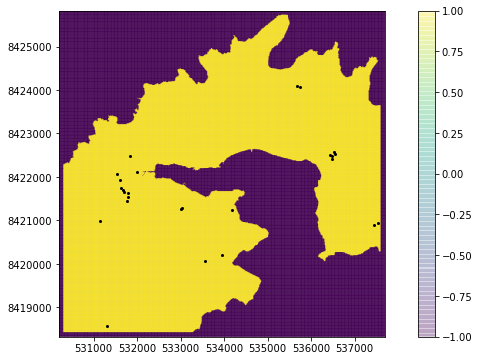

In [21]:
Pdevel_WLs = pd.read_csv(os.path.join("..",  'Data/Raw/Water_levels', 'Predevelop_WLs_MOD_vai183.csv'))

# Cut out observations that are outside of the model square (dont need the y's but could add those too for shoots and giggls
Pdevel_WLs = Pdevel_WLs[Pdevel_WLs['x_utm'] > shp_xmin]
Pdevel_WLs = Pdevel_WLs[Pdevel_WLs['x_utm'] < shp_xmax]

Pdevel_WLs['col_num'] = Pdevel_WLs['x_utm'].apply(lambda x_utm_val: math.ceil((x_utm_val-xll)/delr) )          # this formula calculates the column number based on the x coordinate   Not sure why rows and cols are opposite what you think but they are
Pdevel_WLs['row_num'] = Pdevel_WLs['y_utm'].apply(lambda y_utm_val: (1+nrow)-math.ceil((y_utm_val-yll)/delc) )   # this formula calculates the row number based on the y coordinate 
Pdevel_WLs['rowcol']  = list(zip(Pdevel_WLs.row_num, Pdevel_WLs.col_num))                                      # just make a tuplel of the row and col

# This takes obs wells that occupy the same cell and averages them! 
Unique_WLs = Pdevel_WLs.groupby('rowcol', as_index=False).mean()                                               # Average the duplicate WLs that fall into a single cell, to get one "observed" water level for that cell 

# make new unique names for each obs point
Unique_WLs["name"] = "Obs_"+Unique_WLs.index.map(str)

nobs = len(Unique_WLs['WL_m_MSL']) 
layervals = [0] * nobs
rowvals = list(Unique_WLs['row_num'].astype(int))
colvals = list(Unique_WLs['col_num'].astype(int))
obsvals = list(Unique_WLs['WL_m_MSL'])
obsnames = list(Unique_WLs["name"])

if Plotnsave_plot: 
    gdf = geopandas.GeoDataFrame(Unique_WLs, geometry=geopandas.points_from_xy(Unique_WLs.x_utm, Unique_WLs.y_utm))
    fig, ax = plt.subplots(figsize = (12,6))
    Grid.plot(ax=ax, facecolor="white", edgecolor="Black", linewidth=.2, alpha = .2)
    qm = sr.plot_array(ibound, ax=ax, alpha = .2)
    ax.set_aspect(1); plt.colorbar(qm)
    gdf.plot(ax=ax, color='black', markersize=4)

### Import Recharge .asc from SWB output into MODFLOW rech array
(note I am not sure what happens when the model area is bigger then the raster....)

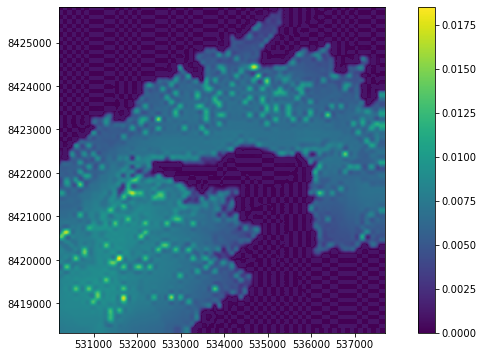

In [22]:
SWB_output_recharge = os.path.join("..",  'Data/Raw/GIS/Recharge','recharge_v1.asc')  

# Needed to clip the raster to appropriate dimensions, () https://rasterio.readthedocs.io/en/stable/topics/masking-by-shapefile.html)   
Raster_2_Clip = os.path.join(SWB_output_recharge)
Clipped_raster = os.path.join(workspace, "raw_net_infiltration_clip.asc")

with fiona.open(os.path.join(workspace, 'Model_polyarea.shp'), "r") as shapefile:
    features = [feature["geometry"] for feature in shapefile]
    
with rasterio.open(Raster_2_Clip) as src:
    out_image, out_transform = rasterio.mask.mask(src, features, crop=True)
    
out_meta = src.meta.copy()
out_meta.update({"driver": "AAIGrid",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open(Clipped_raster, "w", **out_meta) as dest:          # create the new clipped .asc file
    dest.write(out_image)
    
# Now disect the clipped .asc into a 
recharge_raw_SWB = np.loadtxt(Clipped_raster, skiprows=6)

y = np.linspace(0, np.shape(recharge_raw_SWB)[0]-1, np.shape(recharge_raw_SWB)[0])   
x = np.linspace(0, np.shape(recharge_raw_SWB)[1]-1, np.shape(recharge_raw_SWB)[1])

y2 = np.linspace(0, np.shape(y)[0], nrow)   # this defines the number of cells to resample to on the y direction, first number is the original height of the SWB2 recharge map, second number is going to be new height in # of cells
x2 = np.linspace(0, np.shape(x)[0], ncol)   # this defines the number of cells to resample to on the x direction, first number is the original width of the SWB2 recharge map, second number is going to be new width in # of cells

f = interp2d(x, y, recharge_raw_SWB, kind='cubic')
recharge_resampled = f(x2, y2)
recharge_converted =  recharge_resampled* (0.0254/365)   # recharge comes out of SWB in inches/year and needs to be converted to m/day

recharge_converted = np.where(recharge_converted < 0, 0.001, recharge_converted)   # Interpolation made some negative values, fix that issue by setting them to a positive value

rch_data = {0: recharge_converted}   # dictionary form to specify that it is only on first layer

if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize = (12,6))
    qm = sr.plot_array(recharge_converted, ax=ax)
    ax.set_aspect(1); plt.colorbar(qm)

### Hydraulic condictivty assigned based on zones as defined by shapefiles in a folder

The values at the top of this cell can be modified to change the conductivity in each zone

In [23]:
# Function to rasterize the HK zones: 
def rastah_zone(shp):
    with fiona.open(shp) as src:   #    read in Tutuila shapefile
            records = [r for r in src]   
    geoms = [r['geometry'] for r in records]       # shapefile shape
    attr = [r['properties'] for r in records]      # shapefile attributes
    geoms = [(g, attr[i]['par_code']) for i, g in enumerate(geoms)]              # select the attribute to map onto the raster grid
    # affine: work with the geometry to change from raster to grid reference frame 
    trans = Affine(delr, rotation, sr.xul, sr.rotation, -delc, sr.yul)
    Outrastah = rasterize(geoms, out_shape=(nrow, ncol), transform=trans) # the actual rasterization 
    return Outrastah

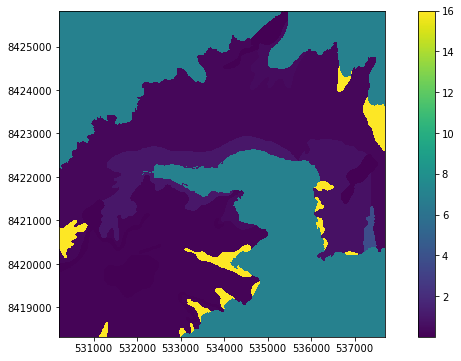

In [24]:
# set the  values this cell is set up for optimization
HK_raster = rastah_zone(os.path.join("..",  'Data/Raw/GIS/Geo_units/v2', 'NPS_simplified_geo_v2.shp'))

## Initial starting point before 3-4 rounds of calibration  was calgood = [ 5, 5, 5, 5, 5, 5, 0.2, .2, .2, .4, 0.5, 5]
#calgood =  [2.6, 39, 1, 14, 3.7, 1.2, 0.001, 0.37, 0.9, 0.7, 0.3, 1]

calgood = [0.7, 16, 16,  0.5, 1.0, 0.5, 0.002, 0.75, 0.17, 0.3, 0.0018, 3.75] 


Alluvium_Aua      = calgood[0]
Alluvium_Fagaalu  = calgood[1]
Alluvium_minor    = calgood[2]
Alluvium_Utulei   = calgood[3]
Alluvium_Vaipito  = calgood[4]
Alluvium_Vatia    = calgood[5]
Dikes             = calgood[6]
Pago_inner_E      = calgood[7]
Pago_inner_W      = calgood[8]
Pago_outer        = calgood[9]
Trachyte          = calgood[10]
Alluvium_Laulii   = calgood[11]


map_dic = {-12:Alluvium_Aua, 
           -14:Alluvium_Fagaalu, 
           -15:Alluvium_minor,
           -13:Alluvium_Utulei,
           -11:Alluvium_Vaipito,
           -10:Alluvium_Vatia,
           -50:Dikes,
           -30:Pago_inner_E,
           -40:Pago_inner_W,
           -20:Pago_outer,
           -60:Trachyte, 
           -16:Alluvium_Laulii}

for i in map_dic:
    HK_raster = np.where(HK_raster== i, map_dic[i], HK_raster)
    
HK_raster = np.where(HK_raster== 0, 7, HK_raster)   # this is for the areas not covered by HK zones, the number Should not actually maatter at all!

#HK_raster = np.where(HK_raster== -90, 1, HK_raster) # this is for the areas that get messed up somehow
#HK_raster = np.where(HK_raster== -70, 1, HK_raster) # this is for the areas that get messed up somehow

if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize = (12,6))
    qm = sr.plot_array(HK_raster, ax=ax)
    ax.set_aspect(1); plt.colorbar(qm)

'''Define the layers to be confined and define the horizontal and vertical 
hydraulic conductivity of the aquifer for the LPF package.'''

# lpf data
laytyp = 0
vka = 10


In [25]:
modelname = 'modelface'

ml = flopy.modflow.Modflow(modelname, version='mf2005', exe_name=exe_name, model_ws=workspace, verbose=False)

discret = flopy.modflow.ModflowDis(ml, nlay=nlay, nrow=nrow, ncol=ncol, laycbd=0,
                                   delr=delr, delc=delc, top=top, botm=botm,
                                   nper=nper, perlen=perlen, nstp=nstp)
bas = flopy.modflow.ModflowBas(ml, ibound=ibound, strt=start_heads)
lpf = flopy.modflow.ModflowLpf(ml, laytyp=laytyp, hk=HK_raster, vka=vka)
#### ghb = flopy.modflow.ModflowGhb(ml, stress_period_data=ghb_data)
rch = flopy.modflow.ModflowRch(ml, rech=rch_data)
oc = flopy.modflow.ModflowOc(ml, stress_period_data=spd)
pcg = flopy.modflow.ModflowPcg(ml, hclose=1.0e-6, rclose=3.0e-3, mxiter=100, iter1=50)
drn = flopy.modflow.ModflowDrn(ml, ipakcb=53, print_flows=True, stress_period_data=stress_period_data_drain)  # ipakcb=53, is flag for writing SFR output to cell-by-cell budget (on unit 53)
wel = flopy.modflow.ModflowWel(model = ml, stress_period_data=stress_period_data_PmpWells)

# water level observations
obs_data= []
for i in range(0,nobs):
    obs = flopy.modflow.HeadObservation(ml, obsname=obsnames[i], layer=layervals[i], row=rowvals[i], column=colvals[i], time_series_data=[[0,obsvals[i]]])
    obs_data.append(obs)
hob = flopy.modflow.ModflowHob(ml, iuhobsv = 7, hobdry=-999, obs_data = obs_data)

# Run model 

if needed: #### Model checker
https://notebook.community/brclark-usgs/flopy/examples/Notebooks/flopy3_ModelCheckerExample
- ml.check()

In [26]:
ml.write_input()
ml.run_model(silent=False)

FloPy is using the following  executable to run the model: .\mf2005.exe

                                  MODFLOW-2005     
    U.S. GEOLOGICAL SURVEY MODULAR FINITE-DIFFERENCE GROUND-WATER FLOW MODEL
                             Version 1.12.00 2/3/2017                        

 Using NAME file: modelface.nam 
 Run start date and time (yyyy/mm/dd hh:mm:ss): 2021/10/10  6:34:09

 Solving:  Stress period:     1    Time step:     1    Ground-Water Flow Eqn.
 Run end date and time (yyyy/mm/dd hh:mm:ss): 2021/10/10  6:34:17
 Elapsed run time:  8.303 Seconds

  Normal termination of simulation


(True, [])

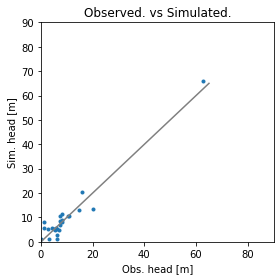

Mean Error: 0.35
Mean Absolute Error: 2.15
RMS Error: 2.95


In [27]:
# plot observations 
observations = np.loadtxt(os.path.join(workspace, '{}.hob.out'.format(modelname)), skiprows=1, usecols=[0,1])      # this block extracts observation data at each well field and determines what the maximum residual at any of the given points is
comp_obs = np.ravel(np.split(observations, 2, 1)[0]) # the computed hed values at the obspts
obs_obs = np.ravel(np.split(observations, 2, 1)[1]) # the observed hed values at the obspts

# note positive residuals means model is calculating too high negative is model calculates too low 
residuals = []
for idx, i in enumerate(observations):   
    r = observations[idx][0]-observations[idx][1]
    residuals.append(r)

Howd_we_do = pd.DataFrame({"Obs_hed_m":obs_obs,"Comp_hed_m":comp_obs,"Residual_m":residuals})

fig = plt.figure(figsize=(4,4))
plt.title('Observed. vs Simulated.')
plt.plot(Howd_we_do["Obs_hed_m"], Howd_we_do["Comp_hed_m"], '.')
#plt.axis('equal')
#plt.axis('square')
plt.xlabel("Obs. head [m]")
plt.ylabel('Sim. head [m]')
plt.ylim(0,90)
plt.xlim(0,90)

plt.plot([0,20,65],[0,20,65], color= "grey")
plt.tight_layout()
plt.savefig(os.path.join(figurespace, "calibration_result.pdf"))

plt.show()

me = np.mean(Howd_we_do.Residual_m)
mea = np.mean(np.abs(Howd_we_do.Residual_m))
rmse = np.sqrt(np.mean(Howd_we_do.Residual_m**2))
print ('Mean Error: {:.2f}\nMean Absolute Error: {:.2f}\nRMS Error: {:.2f}'.format(me, mea, rmse))

## Post process, map and extract results to heads raster file

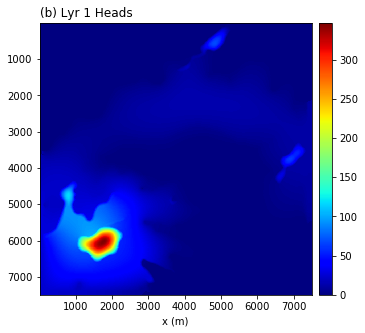

wrote ..\..\RISA_yr6_GIT_ignored_files\Flo_py_wrkspace_3p2\heads.asc


In [28]:
# develop geometry to plot heads as colormap
N = np.array([ncol, nrow, nlay])
dx = np.array([delc, delr, abs(botm)])
Lx = delc*ncol
Ly = delr*nrow
x = np.linspace(0. + dx[0] / 2., Lx - dx[0] / 2., N[0])
y = np.linspace(0. + dx[1] / 2., Ly - dx[1] / 2., N[1])
XX, YY = np.meshgrid(x, y)

# Extract heads data
hds = bf.HeadFile(os.path.join(workspace, '{}.hds'.format(modelname)))
times = hds.get_times() # simulation time, steady state
head = hds.get_data(totim=times[-1])
minv = 0
maxv = head.max()

# Plot em
fig, axes = plt.subplots(1, 1, figsize=(10, 5))
im1 = axes.pcolormesh(XX, YY, head[0], vmin=minv, vmax=maxv, cmap=plt.get_cmap('jet'))
axes.set_title('(b) Lyr 1 Heads', loc='left')
axes.set_xlabel('x (m)')
axes.set_aspect('equal')
axes.axis([XX.min(), XX.max(), YY.max(), YY.min()])
from mpl_toolkits.axes_grid1 import make_axes_locatable
divider = make_axes_locatable(axes)
cbar_ax = divider.append_axes("right", size="5%", pad=0.1)
fig.colorbar(im1, cax=cbar_ax)
plt.show()

# Write the heads layer(s) to a raster file
# export head rasters 
output_raster = os.path.join(workspace, 'heads.asc')   # if there are multiple layers exports based on each layer
grid = ml.modelgrid
flopy.export.utils.export_array(grid, output_raster, head[0])

# Project the output .asc into WGS84 space with manual  ASC header modification 
new_first = ('ncols {}\n'                        # these are the parameters for the .asc file
             'nrows {}\n'
             'xllcorner {}\n'
             'yllcorner {}\n'
             'cellsize {}\n'
             'NODATA_value -999.0'.format(ncol,nrow, xll, yll, np.mean([delc, delr]) ))

with open(os.path.join('.', output_raster), 'r') as fin:   # open file 
    data = fin.read().splitlines(True)
with open(os.path.join('.', output_raster), 'w') as fout:     # delete first line
    fout.writelines(data[6:])
    
with open(os.path.join('.', output_raster), 'r+') as file:                # add in new first line and save file  
    file_data = file.read()
    file. seek(0, 0)
    file. write(new_first + '\n' + file_data)

### Calculate Depth to water


wrote ..\..\RISA_yr6_GIT_ignored_files\Flo_py_wrkspace_3p2\dep2Wat.asc


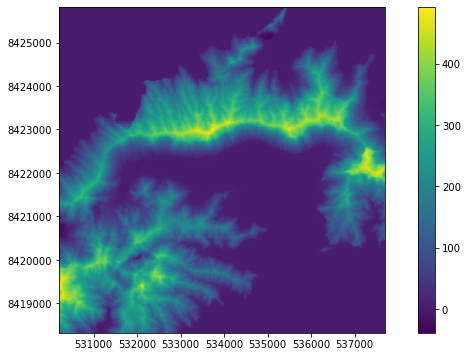

In [29]:
# Super basic depth to water calculation, Currently allows for negative depths (i.e. flooding)
Heads_raw = np.loadtxt(os.path.join(workspace, 'heads.asc'), skiprows=6)   # the 7th row was a no data row for some reason not sure why, if another DEM is used might need to skiprows back to 6
Dep_to_wat = top-Heads_raw

# Write the GIS asc raster from the NP array 
output_raster = os.path.join(workspace, 'dep2Wat.asc')   # if there are multiple layers exports based on each layer
grid = ml.modelgrid
flopy.export.utils.export_array(grid, output_raster, Dep_to_wat)

# Project the output .asc into WGS84 space with manual  ASC header modification 
new_first = ('ncols {}\n'                        # these are the parameters for the .asc file
             'nrows {}\n'
             'xllcorner {}\n'
             'yllcorner {}\n'
             'cellsize {}\n'
             'NODATA_value -999.0'.format(ncol,nrow, xll, yll, np.mean([delc, delr]) ))

with open(os.path.join('.', output_raster), 'r') as fin:   # open file 
    data = fin.read().splitlines(True)
with open(os.path.join('.', output_raster), 'w') as fout:     # delete first line
    fout.writelines(data[6:])
    
with open(os.path.join('.', output_raster), 'r+') as file:                # add in new first line and save file  
    file_data = file.read()
    file. seek(0, 0)
    file. write(new_first + '\n' + file_data)
    
    
if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize = (12,6))
    qm = sr.plot_array(Dep_to_wat, ax=ax)
    ax.set_aspect(1); plt.colorbar(qm)

## Run a basic zonal optimzation calibration

In [30]:
def plot_calibrateo(Howd_we_do):
    
    #Plot the OBS plot if want
    fig = plt.figure(figsize=(4,4))
    plt.title('Observed. vs Simulated.')
    plt.plot(Howd_we_do["Obs_hed_m"], Howd_we_do["Comp_hed_m"], '.')
    #plt.axis('equal')
    #plt.axis('square')
    plt.xlabel("Obs. head [m]")
    plt.ylabel('Sim. head [m]')
    plt.ylim(0,90)
    plt.xlim(0,90)
    plt.plot([0,30,65],[0,30,65], color= "grey")
    plt.tight_layout()
    plt.savefig("cal.pdf")
    plt.show()


def calibrateo(params):
    
    Alluvium_Aua, Alluvium_Fagaalu, Alluvium_minor, Alluvium_Utulei, Alluvium_Vaipito, Alluvium_Vatia, Dikes, Pago_inner_E, Pago_inner_W, Pago_outer, Trachyte, Alluvium_Laulii= params   
    
    # set the  values this cell is set up for optimization
    HK_raster = rastah_zone(os.path.join("..",  'Data/Raw/GIS/Geo_units/v2', 'NPS_simplified_geo_v2.shp'))

    map_dic = {-12:Alluvium_Aua, 
               -14:Alluvium_Fagaalu, 
               -15:Alluvium_minor,
               -13:Alluvium_Utulei,
               -11:Alluvium_Vaipito,
               -10:Alluvium_Vatia,
               -50:Dikes,
               -30:Pago_inner_E,
               -40:Pago_inner_W,
               -20:Pago_outer,
               -60:Trachyte,    
               -16:Alluvium_Laulii}

    for i in map_dic:
        HK_raster = np.where(HK_raster== i, map_dic[i], HK_raster)

    HK_raster = np.where(HK_raster== 0, 7, HK_raster)   # this is for the areas not covered by HK zones, Should not actually maatter at all!
    
    
    
    ############    Now generate the run the new model         
    modelname = 'model_pago_OPT'  
        
    ml = flopy.modflow.Modflow(modelname, version='mf2005', exe_name=exe_name, model_ws=workspace, verbose=False)
    
    discret = flopy.modflow.ModflowDis(ml, nlay=nlay, nrow=nrow, ncol=ncol, laycbd=0,
                                       delr=delr, delc=delc, top=top, botm=botm,
                                       nper=nper, perlen=perlen, nstp=nstp)
    
    bas = flopy.modflow.ModflowBas(ml, ibound=ibound, strt=start_heads)
    lpf = flopy.modflow.ModflowLpf(ml, laytyp=laytyp, hk=HK_raster, vka=vka)
    rch = flopy.modflow.ModflowRch(ml, rech=rch_data)
    oc = flopy.modflow.ModflowOc(ml, stress_period_data=spd)
    pcg = flopy.modflow.ModflowPcg(ml, hclose=1.0e-6, rclose=3.0e-3, mxiter=100, iter1=50)
    drn = flopy.modflow.ModflowDrn(ml, ipakcb=53, print_flows=True, stress_period_data=stress_period_data_drain)  # ipakcb=53, is flag for writing SFR output to cell-by-cell budget (on unit 53)
    wel = flopy.modflow.ModflowWel(model = ml, stress_period_data=stress_period_data_PmpWells)


    # water level observations
    obs_data= []
    for i in range(0,nobs):
        obs = flopy.modflow.HeadObservation(ml, obsname=obsnames[i], layer=layervals[i], row=rowvals[i], column=colvals[i], time_series_data=[[0,obsvals[i]]])
        obs_data.append(obs)
    hob = flopy.modflow.ModflowHob(ml, iuhobsv = 7, hobdry=-999, obs_data = obs_data)        
    
    
    # Run da model 
    ml.write_input()
    ml.run_model(silent=True)


    # post process observations 
    observations = np.loadtxt(os.path.join(workspace, '{}.hob.out'.format(modelname)), skiprows=1, usecols=[0,1])      # this block extracts observation data at each well field and determines what the maximum residual at any of the given points is
    comp_obs = np.ravel(np.split(observations, 2, 1)[0]) # the computed hed values at the obspts
    obs_obs = np.ravel(np.split(observations, 2, 1)[1]) # the observed hed values at the obspts

    # note positive residuals means model is calculating too high negative is model calculates too low 
    residuals = []
    for idx, i in enumerate(observations):   
        r = observations[idx][0]-observations[idx][1]
        residuals.append(r)

    Howd_we_do = pd.DataFrame({"Obs_hed_m":obs_obs,"Comp_hed_m":comp_obs,"Residual_m":residuals})
    # error metrics
    me = np.mean(Howd_we_do.Residual_m)
    mea = np.mean(np.abs(Howd_we_do.Residual_m))
    rmse = np.sqrt(np.mean(Howd_we_do.Residual_m**2))
    
    
    # Plot if want
    plot_calibrateo(Howd_we_do)

    print("Error is - {}".format(rmse))
    print("Params are - {}".format(params))
    return rmse






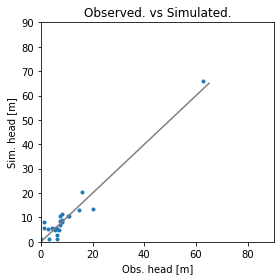

Error is - 2.94726441157809
Params are - [0.7, 16, 16, 0.5, 1.0, 0.5, 0.002, 0.75, 0.17, 0.3, 0.0018, 3.75]


2.94726441157809

In [31]:
# Run once 
# params = [4.6, 13.0, 0.1, 5.0, 2.6, 0.4, 0.3, 0.1, 0.5, 0.6, 0.3]
params = [2.6, 39, 1, 14, 3.7, 1.2, 0.001, 0.37, 0.9, 0.7, 0.3, 1]
params = [0.7, 32, 6.8, 1.9, 1.5, 5.0, 0.001, 1.0, 0.25, 0.2, 0.0015, 2.5] 
params = [0.7, 16, 16,  0.5, 1.0, 0.5, 0.002, 0.75, 0.17, 0.3, 0.0018, 3.75] 

calibrateo(params)

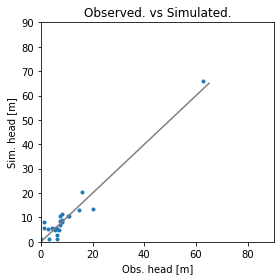

Error is - 2.94726441157809
Params are - [7.00e-01 1.60e+01 1.60e+01 5.00e-01 1.00e+00 5.00e-01 2.00e-03 7.50e-01
 1.70e-01 3.00e-01 1.80e-03 3.75e+00]


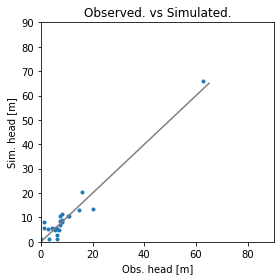

Error is - 2.94688569535576
Params are - [7.35e-01 1.60e+01 1.60e+01 5.00e-01 1.00e+00 5.00e-01 2.00e-03 7.50e-01
 1.70e-01 3.00e-01 1.80e-03 3.75e+00]


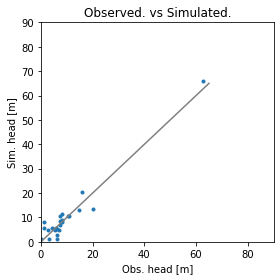

Error is - 2.9471809613065605
Params are - [7.00e-01 1.68e+01 1.60e+01 5.00e-01 1.00e+00 5.00e-01 2.00e-03 7.50e-01
 1.70e-01 3.00e-01 1.80e-03 3.75e+00]


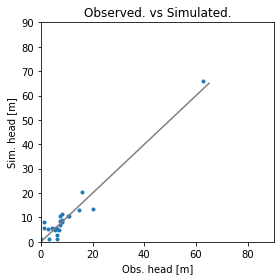

Error is - 2.9480609371562263
Params are - [7.00e-01 1.60e+01 1.68e+01 5.00e-01 1.00e+00 5.00e-01 2.00e-03 7.50e-01
 1.70e-01 3.00e-01 1.80e-03 3.75e+00]


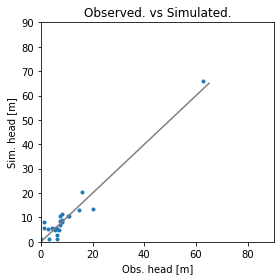

Error is - 2.9471392542982318
Params are - [7.00e-01 1.60e+01 1.60e+01 5.25e-01 1.00e+00 5.00e-01 2.00e-03 7.50e-01
 1.70e-01 3.00e-01 1.80e-03 3.75e+00]


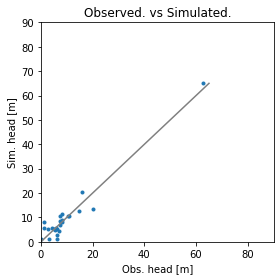

Error is - 2.925948119211083
Params are - [7.00e-01 1.60e+01 1.60e+01 5.00e-01 1.05e+00 5.00e-01 2.00e-03 7.50e-01
 1.70e-01 3.00e-01 1.80e-03 3.75e+00]


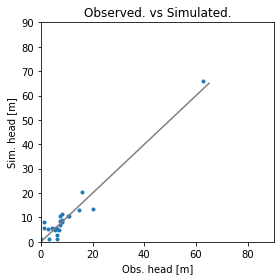

Error is - 2.9466030792211733
Params are - [7.00e-01 1.60e+01 1.60e+01 5.00e-01 1.00e+00 5.25e-01 2.00e-03 7.50e-01
 1.70e-01 3.00e-01 1.80e-03 3.75e+00]


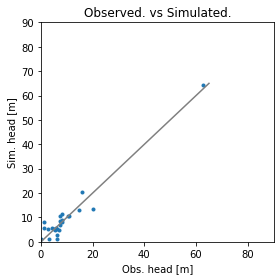

Error is - 2.8889294770935816
Params are - [7.00e-01 1.60e+01 1.60e+01 5.00e-01 1.00e+00 5.00e-01 2.10e-03 7.50e-01
 1.70e-01 3.00e-01 1.80e-03 3.75e+00]


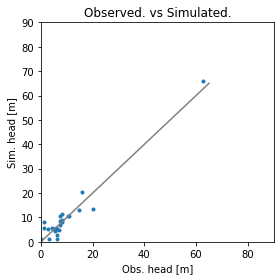

Error is - 2.947588746110361
Params are - [7.000e-01 1.600e+01 1.600e+01 5.000e-01 1.000e+00 5.000e-01 2.000e-03
 7.875e-01 1.700e-01 3.000e-01 1.800e-03 3.750e+00]


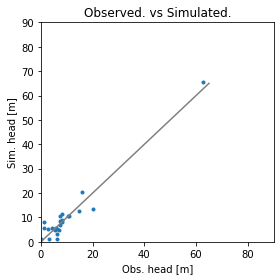

Error is - 2.933225298673847
Params are - [7.000e-01 1.600e+01 1.600e+01 5.000e-01 1.000e+00 5.000e-01 2.000e-03
 7.500e-01 1.785e-01 3.000e-01 1.800e-03 3.750e+00]


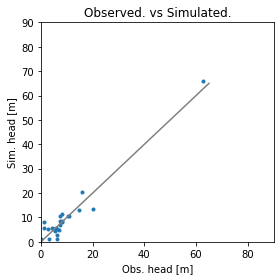

Error is - 2.941326973015047
Params are - [7.00e-01 1.60e+01 1.60e+01 5.00e-01 1.00e+00 5.00e-01 2.00e-03 7.50e-01
 1.70e-01 3.15e-01 1.80e-03 3.75e+00]


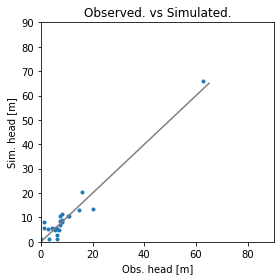

Error is - 2.9470697619863806
Params are - [7.00e-01 1.60e+01 1.60e+01 5.00e-01 1.00e+00 5.00e-01 2.00e-03 7.50e-01
 1.70e-01 3.00e-01 1.89e-03 3.75e+00]


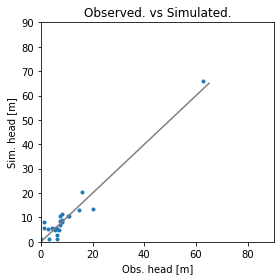

Error is - 2.9473108614180767
Params are - [7.0000e-01 1.6000e+01 1.6000e+01 5.0000e-01 1.0000e+00 5.0000e-01
 2.0000e-03 7.5000e-01 1.7000e-01 3.0000e-01 1.8000e-03 3.9375e+00]


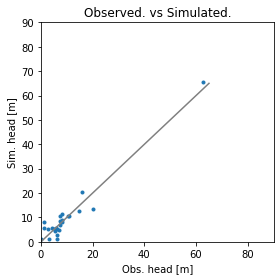

Error is - 2.9263682651380574
Params are - [7.05833333e-01 1.61333333e+01 1.52000000e+01 5.04166667e-01
 1.00833333e+00 5.04166667e-01 2.01666667e-03 7.56250000e-01
 1.71416667e-01 3.02500000e-01 1.81500000e-03 3.78125000e+00]


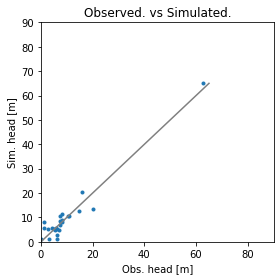

Error is - 2.923642855380003
Params are - [7.06805556e-01 1.61555556e+01 1.58666667e+01 5.04861111e-01
 1.00972222e+00 5.04861111e-01 2.01944444e-03 7.13541667e-01
 1.71652778e-01 3.02916667e-01 1.81750000e-03 3.78645833e+00]


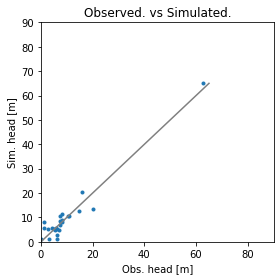

Error is - 2.9203658737077505
Params are - [7.07939815e-01 1.61814815e+01 1.58444444e+01 5.05671296e-01
 1.01134259e+00 5.05671296e-01 2.02268519e-03 7.44965278e-01
 1.71928241e-01 3.03402778e-01 1.82041667e-03 3.57378472e+00]


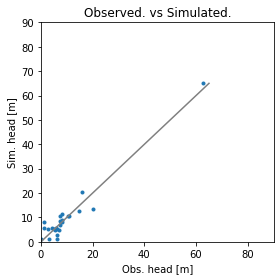

Error is - 2.9164091247705435
Params are - [7.09263117e-01 1.62117284e+01 1.58185185e+01 5.06616512e-01
 1.01323302e+00 5.06616512e-01 2.02646605e-03 7.44126157e-01
 1.72249614e-01 3.03969907e-01 1.82381944e-03 3.73191551e+00]


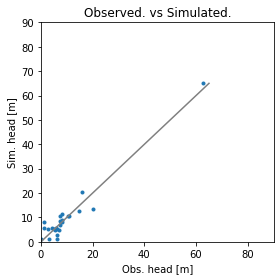

Error is - 2.9124754054961732
Params are - [7.10806970e-01 1.53136831e+01 1.57882716e+01 5.07719264e-01
 1.01543853e+00 5.07719264e-01 2.03087706e-03 7.43147184e-01
 1.72624550e-01 3.04631559e-01 1.82778935e-03 3.72890143e+00]


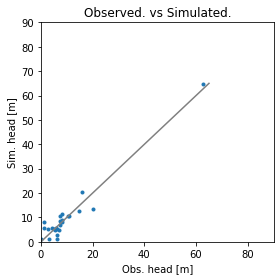

Error is - 2.9074120945483246
Params are - [7.12608132e-01 1.59992970e+01 1.57529835e+01 4.79839142e-01
 1.01801162e+00 5.09005808e-01 2.03602323e-03 7.42005048e-01
 1.73061975e-01 3.05403485e-01 1.83242091e-03 3.72538500e+00]


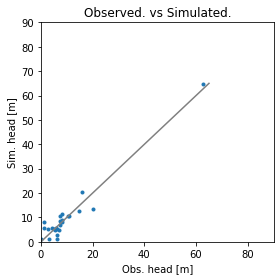

Error is - 2.9024223539020837
Params are - [7.14709487e-01 1.59991798e+01 1.57118141e+01 5.01478999e-01
 1.02101355e+00 5.10506777e-01 2.04202711e-03 7.40672556e-01
 1.73572304e-01 3.06304066e-01 1.73282440e-03 3.72128250e+00]


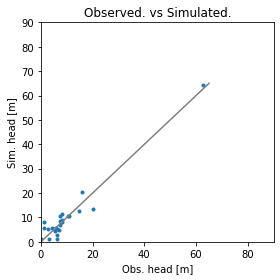

Error is - 2.896931294732335
Params are - [6.76327735e-01 1.59990431e+01 1.56637832e+01 5.01725499e-01
 1.02451581e+00 5.12257906e-01 2.04903162e-03 7.39117981e-01
 1.74167688e-01 3.07354744e-01 1.81162846e-03 3.71649625e+00]


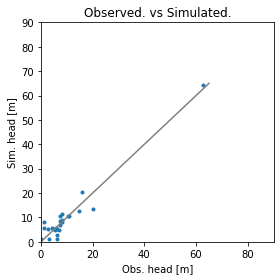

Error is - 2.8912212031939775
Params are - [7.07382358e-01 1.59988836e+01 1.56077470e+01 5.02013082e-01
 1.02860178e+00 4.85134224e-01 2.05720356e-03 7.37304312e-01
 1.74862303e-01 3.08580534e-01 1.81356654e-03 3.71091229e+00]


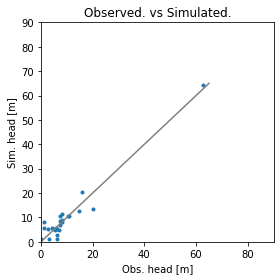

Error is - 2.8896499720527458
Params are - [7.08612750e-01 1.59986976e+01 1.55423715e+01 5.02348595e-01
 1.03336874e+00 5.07656594e-01 2.06673749e-03 7.35188364e-01
 1.75672686e-01 2.92510623e-01 1.81582763e-03 3.70439767e+00]


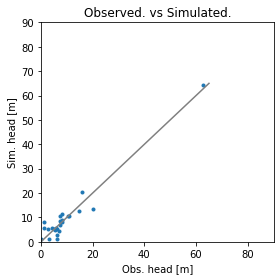

Error is - 2.8890813858956146
Params are - [7.10048209e-01 1.59984805e+01 1.54661001e+01 5.02740028e-01
 1.03893020e+00 5.08932693e-01 2.07786040e-03 7.32719758e-01
 1.66701468e-01 3.06262394e-01 1.81846557e-03 3.69679728e+00]


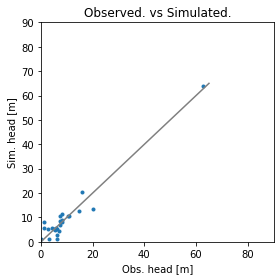

Error is - 2.88688700268542
Params are - [7.04917355e-01 1.58426717e+01 1.63104501e+01 4.98335588e-01
 1.03569635e+00 5.05560364e-01 2.07139269e-03 7.22548050e-01
 1.72998934e-01 3.04389459e-01 1.80404316e-03 3.65147183e+00]


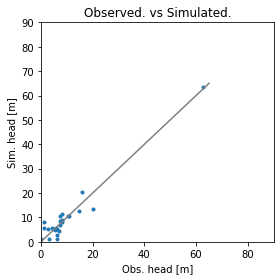

Error is - 2.876083097136918
Params are - [7.04459366e-01 1.56973409e+01 1.68656752e+01 4.95420049e-01
 1.04937785e+00 5.06257213e-01 2.09875570e-03 7.05697076e-01
 1.73790068e-01 3.05334189e-01 1.79856474e-03 3.58658275e+00]


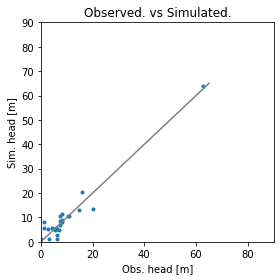

Error is - 2.8813652160935863
Params are - [7.11493916e-01 1.59255618e+01 1.56547293e+01 5.01738929e-01
 9.93925988e-01 5.10769900e-01 2.10451864e-03 7.21414230e-01
 1.75047279e-01 3.07778491e-01 1.81880395e-03 3.65548562e+00]


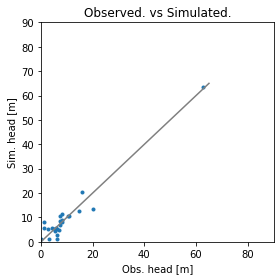

Error is - 2.8775074859127994
Params are - [7.05469754e-01 1.57316740e+01 1.57527397e+01 4.96357455e-01
 1.03157106e+00 5.06893587e-01 2.09925323e-03 7.59184657e-01
 1.73960252e-01 3.05672128e-01 1.80152128e-03 3.59719850e+00]


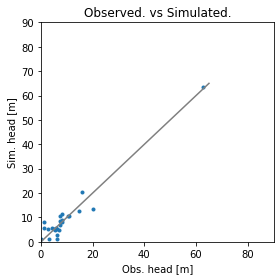

Error is - 2.8747566473979766
Params are - [7.03923817e-01 1.56307802e+01 1.57596779e+01 4.93994963e-01
 1.03332210e+00 5.06287117e-01 2.10877383e-03 7.30130942e-01
 1.74023457e-01 3.05564242e-01 1.79545538e-03 3.81377441e+00]


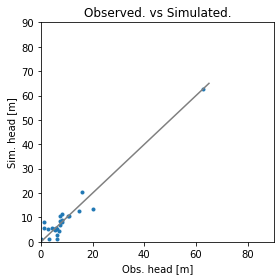

Error is - 2.868001790995996
Params are - [7.01915819e-01 1.53554295e+01 1.57172946e+01 4.88156796e-01
 1.04431186e+00 5.06595027e-01 2.15181816e-03 7.22713775e-01
 1.75071065e-01 3.06644974e-01 1.78297473e-03 3.93376925e+00]


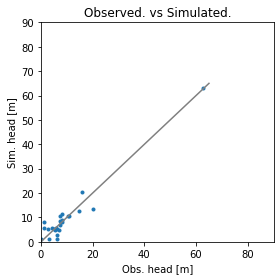

Error is - 2.8713106215069604
Params are - [7.01375965e-01 1.54578168e+01 1.57687331e+01 4.89973127e-01
 1.03661147e+00 5.05338320e-01 2.12588499e-03 7.27401332e-01
 1.74172325e-01 3.05442957e-01 1.78524515e-03 3.68928591e+00]


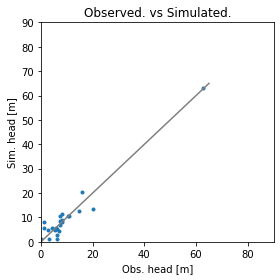

Error is - 2.869996119386414
Params are - [6.98260278e-01 1.63798843e+01 1.57957236e+01 4.85912686e-01
 1.03793479e+00 5.03838744e-01 2.13730863e-03 7.25755997e-01
 1.74055352e-01 3.04916539e-01 1.77418454e-03 3.68569741e+00]


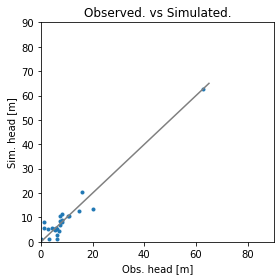

Error is - 2.8690876284471005
Params are - [6.94067807e-01 1.57577017e+01 1.58381350e+01 5.14805065e-01
 1.03868224e+00 5.01691022e-01 2.14904336e-03 7.24189959e-01
 1.73783490e-01 3.04063455e-01 1.75984692e-03 3.68259924e+00]


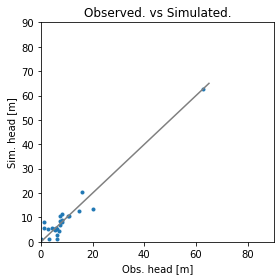

Error is - 2.8685896641644275
Params are - [6.88526172e-01 1.57175725e+01 1.59003579e+01 4.95386220e-01
 1.03862508e+00 4.98720762e-01 2.16087552e-03 7.22775351e-01
 1.73308359e-01 3.02789439e-01 1.86394719e-03 3.68025453e+00]


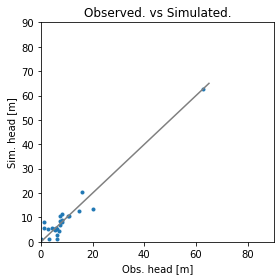

Error is - 2.868536826189448
Params are - [7.28940997e-01 1.56707974e+01 1.59878180e+01 4.94083173e-01
 1.03747437e+00 4.94713442e-01 2.17251166e-03 7.21606153e-01
 1.72569753e-01 3.00977877e-01 1.79386291e-03 3.67900050e+00]


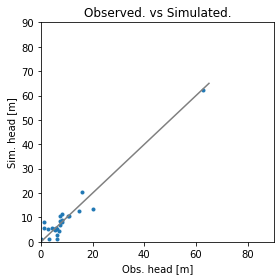

Error is - 2.8686547161606852
Params are - [7.01479481e-01 1.56162759e+01 1.61071993e+01 4.92473939e-01
 1.03486716e+00 5.23433660e-01 2.18355774e-03 7.20803464e-01
 1.71493047e-01 2.98484977e-01 1.78864089e-03 3.67926582e+00]


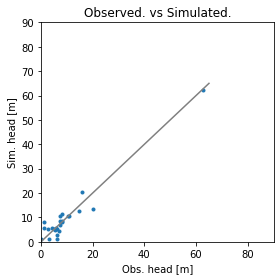

Error is - 2.867565318380716
Params are - [6.99060210e-01 1.55527250e+01 1.62667128e+01 4.90492649e-01
 1.03034993e+00 5.03540801e-01 2.19349385e-03 7.20521928e-01
 1.69986057e-01 3.15550613e-01 1.78184868e-03 3.68159180e+00]


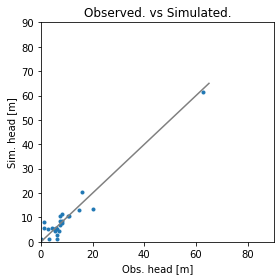

Error is - 2.8746144840422474
Params are - [6.94283940e-01 1.53297387e+01 1.66288835e+01 4.84564676e-01
 1.02884053e+00 5.01482904e-01 2.25687203e-03 7.13188711e-01
 1.67142742e-01 3.27070609e-01 1.76485921e-03 3.67018886e+00]


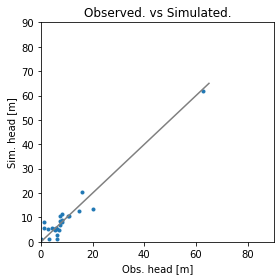

Error is - 2.8703252782905215
Params are - [6.95793419e-01 1.54786494e+01 1.64764197e+01 4.88059987e-01
 1.02335843e+00 5.01366053e-01 2.20164318e-03 7.20957563e-01
 1.79504707e-01 3.03346879e-01 1.77310793e-03 3.68665794e+00]


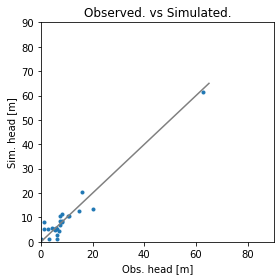

Error is - 2.8725990466944054
Params are - [7.05140531e-01 1.53902382e+01 1.60219231e+01 4.88810012e-01
 1.06618171e+00 5.10526422e-01 2.19644411e-03 6.98836914e-01
 1.77790292e-01 3.10167086e-01 1.78709149e-03 3.62289821e+00]


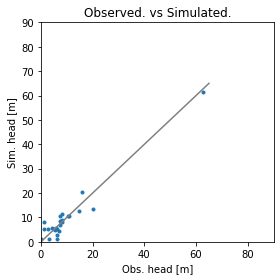

Error is - 2.8768242818324126
Params are - [6.92587717e-01 1.53754557e+01 1.64283927e+01 4.84916263e-01
 1.08429834e+00 4.99715942e-01 2.20724638e-03 7.23659798e-01
 1.73200182e-01 3.02786695e-01 1.76300212e-03 3.71198136e+00]


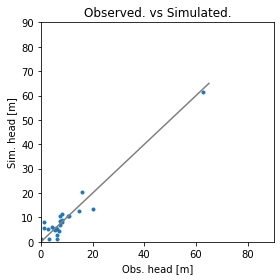

Error is - 2.876201362787072
Params are - [6.96464873e-01 1.55099739e+01 1.64429911e+01 4.88390873e-01
 1.05544114e+00 5.02395981e-01 2.23051064e-03 6.79968561e-01
 1.74160532e-01 3.04412152e-01 1.77386494e-03 3.78939895e+00]


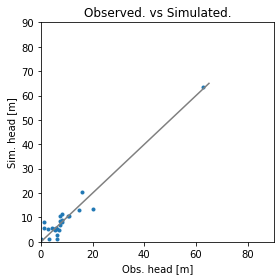

Error is - 2.874670371969171
Params are - [7.09993102e-01 1.58886118e+01 1.57697712e+01 5.00411166e-01
 9.97904335e-01 5.10020299e-01 2.12639488e-03 7.08211547e-01
 1.75080659e-01 3.07568495e-01 1.81419456e-03 3.68751903e+00]


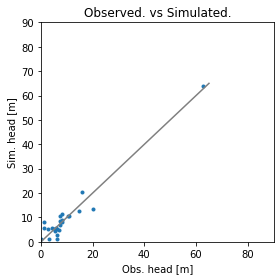

Error is - 2.8836348578224777
Params are - [7.08370651e-01 1.58172000e+01 1.56429695e+01 4.98939938e-01
 1.01717206e+00 5.08610980e-01 2.08577798e-03 7.56609948e-01
 1.74273664e-01 3.06469095e-01 1.81005335e-03 3.59312145e+00]


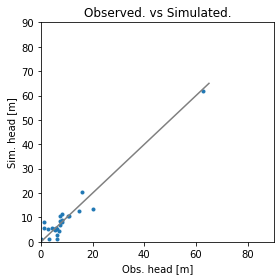

Error is - 2.869464731911773
Params are - [6.99441318e-01 1.55867804e+01 1.62429857e+01 4.91028139e-01
 1.04587387e+00 5.03949731e-01 2.19432748e-03 6.99128908e-01
 1.74188815e-01 3.04926388e-01 1.78291204e-03 3.74032958e+00]


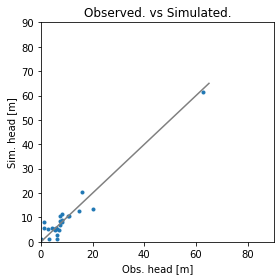

Error is - 2.871326638297154
Params are - [6.99539818e-01 1.56114063e+01 1.51165038e+01 4.91178778e-01
 1.02265136e+00 5.04365167e-01 2.23346155e-03 7.29786739e-01
 1.74710585e-01 3.05479091e-01 1.78274476e-03 3.82156213e+00]


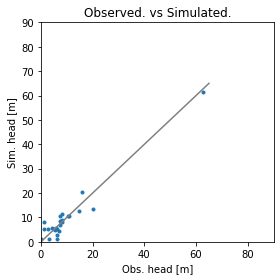

Error is - 2.8789524727571245
Params are - [6.92263867e-01 1.53739344e+01 1.61035299e+01 4.84648929e-01
 1.07824938e+00 4.99659560e-01 2.22366682e-03 7.30868133e-01
 1.73358316e-01 3.02896551e-01 1.76187331e-03 3.74296636e+00]


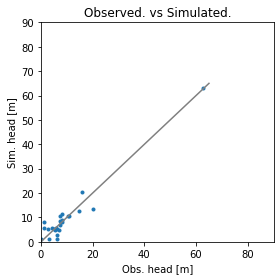

Error is - 2.8688624465858976
Params are - [7.05560793e-01 1.57599425e+01 1.58532109e+01 4.96470607e-01
 1.01799060e+00 5.07430114e-01 2.15071286e-03 7.13875694e-01
 1.74650073e-01 3.06400509e-01 1.80111425e-03 3.70138086e+00]


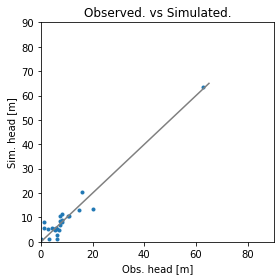

Error is - 2.8753537619530296
Params are - [6.97186482e-01 1.59339254e+01 1.58232594e+01 4.97526848e-01
 1.00194015e+00 4.98637385e-01 2.14599572e-03 7.42749230e-01
 1.70125312e-01 2.99670197e-01 1.79131351e-03 3.82066762e+00]


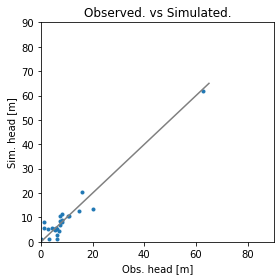

Error is - 2.8687721595773117
Params are - [7.03152018e-01 1.55261600e+01 1.59722571e+01 4.90989221e-01
 1.05012132e+00 5.07554163e-01 2.18383201e-03 7.09814993e-01
 1.75874047e-01 3.07542864e-01 1.78814699e-03 3.67234056e+00]


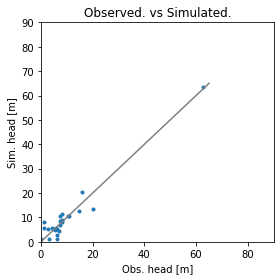

Error is - 2.875976307803796
Params are - [7.03389229e-01 1.56985496e+01 1.68713041e+01 4.95126490e-01
 1.05004883e+00 5.05330139e-01 2.10070669e-03 7.08470780e-01
 1.73398930e-01 3.04702154e-01 1.79656061e-03 3.59713344e+00]


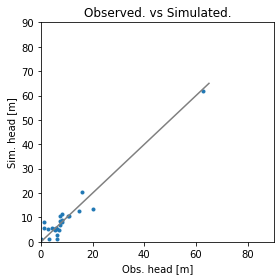

Error is - 2.868327416454708
Params are - [7.00502170e-01 1.56331921e+01 1.55552039e+01 4.92165706e-01
 1.02950072e+00 5.04606410e-01 2.20027283e-03 7.24457750e-01
 1.74382672e-01 3.05284857e-01 1.78619873e-03 3.76545495e+00]


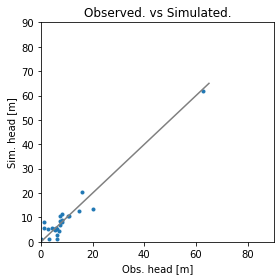

Error is - 2.8711020991781764
Params are - [7.01407449e-01 1.58813683e+01 1.61834866e+01 4.96697571e-01
 1.03490359e+00 5.04235002e-01 2.22068123e-03 7.10365590e-01
 1.73972247e-01 3.04711938e-01 1.79421915e-03 3.74210449e+00]


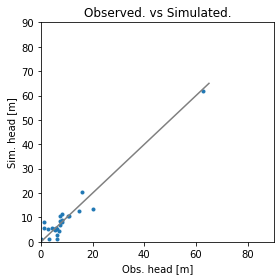

Error is - 2.8686722360569203
Params are - [7.01399578e-01 1.57754804e+01 1.60797983e+01 4.95016460e-01
 1.03533056e+00 5.04510831e-01 2.19698217e-03 7.14624526e-01
 1.74022267e-01 3.04894693e-01 1.79197565e-03 3.72889985e+00]


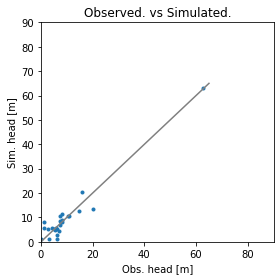

Error is - 2.8702251002438426
Params are - [7.07924355e-01 1.59100075e+01 1.54096965e+01 4.99770123e-01
 1.05015198e+00 5.08731398e-01 2.14414620e-03 7.15753853e-01
 1.67726126e-01 3.07065985e-01 1.80950099e-03 3.75177279e+00]


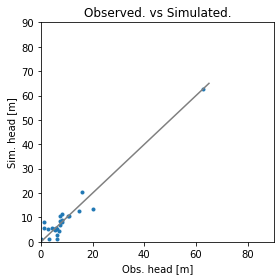

Error is - 2.8683596681103207
Params are - [7.04891621e-01 1.58021680e+01 1.56763773e+01 4.96842589e-01
 1.04345360e+00 5.06890062e-01 2.15852044e-03 7.17054781e-01
 1.70670771e-01 3.06136208e-01 1.80040273e-03 3.73549407e+00]


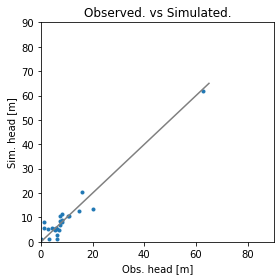

Error is - 2.869817889712591
Params are - [7.06562720e-01 1.49124866e+01 1.60705015e+01 5.03739075e-01
 1.03649542e+00 5.06767260e-01 2.21201605e-03 7.09505216e-01
 1.72611384e-01 3.05699603e-01 1.81279408e-03 3.76103276e+00]


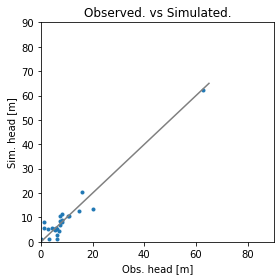

Error is - 2.8682959610625174
Params are - [7.04487109e-01 1.52793360e+01 1.60018070e+01 4.99282478e-01
 1.03685527e+00 5.06035131e-01 2.19333919e-03 7.13567911e-01
 1.72972376e-01 3.05503837e-01 1.80314169e-03 3.74219892e+00]


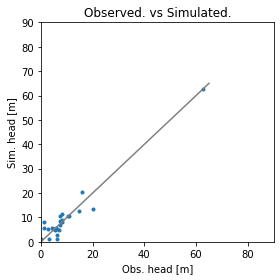

Error is - 2.868654484327536
Params are - [7.06222645e-01 1.56543497e+01 1.55830430e+01 4.99999345e-01
 1.02705324e+00 5.07003840e-01 2.15483249e-03 7.38538806e-01
 1.72275181e-01 3.05785996e-01 1.80743819e-03 3.70671215e+00]


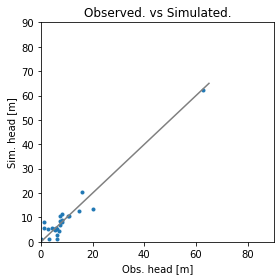

Error is - 2.8680220142264763
Params are - [7.13621962e-01 1.54662032e+01 1.59453783e+01 4.73754798e-01
 1.03230671e+00 5.10148018e-01 2.20108147e-03 7.15869230e-01
 1.72429121e-01 3.06936019e-01 1.83843519e-03 3.76846131e+00]


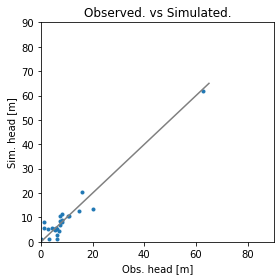

Error is - 2.871171340800716
Params are - [7.03472504e-01 1.54150058e+01 1.59456637e+01 4.88303289e-01
 1.05538437e+00 5.04861911e-01 2.20780672e-03 7.26515751e-01
 1.71192379e-01 3.04688217e-01 1.80338801e-03 3.76085976e+00]


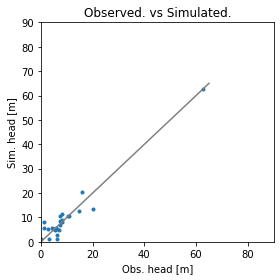

Error is - 2.867700938723593
Params are - [7.05038721e-01 1.56737083e+01 1.58763241e+01 4.94428777e-01
 1.02733904e+00 5.06788063e-01 2.16498633e-03 7.17035708e-01
 1.73785650e-01 3.05972436e-01 1.80168269e-03 3.71625059e+00]


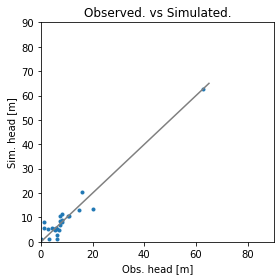

Error is - 2.869044153435086
Params are - [7.06195729e-01 1.56733797e+01 1.58106286e+01 4.94357933e-01
 1.01945661e+00 5.04610179e-01 2.17154663e-03 7.31779904e-01
 1.69620339e-01 3.03284124e-01 1.81861122e-03 3.79721839e+00]


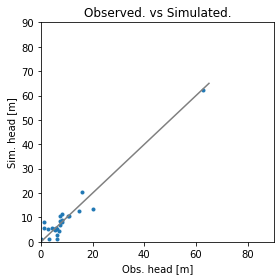

Error is - 2.8679349155778584
Params are - [7.03912946e-01 1.55629649e+01 1.59318500e+01 4.91831399e-01
 1.04245514e+00 5.06818167e-01 2.18076067e-03 7.15306221e-01
 1.74310620e-01 3.06478179e-01 1.79576305e-03 3.70356002e+00]


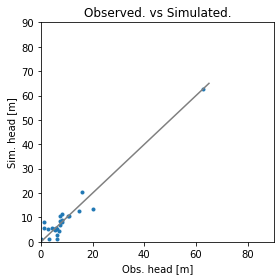

Error is - 2.8684817775789497
Params are - [7.08367064e-01 1.53886400e+01 1.56784295e+01 4.89799852e-01
 1.03543479e+00 5.08038066e-01 2.15569289e-03 7.27083987e-01
 1.71520178e-01 3.06196209e-01 1.81541379e-03 3.73643580e+00]


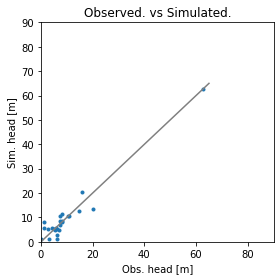

Error is - 2.866859803026748
Params are - [7.09435092e-01 1.55099052e+01 1.55795667e+01 4.91896691e-01
 1.03599280e+00 4.86549304e-01 2.16447318e-03 7.21951803e-01
 1.74053920e-01 3.13891131e-01 1.82321070e-03 3.79559816e+00]


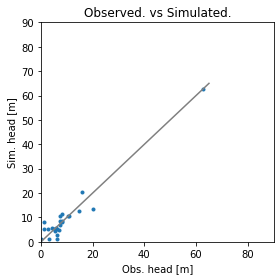

Error is - 2.866396870231174
Params are - [7.13412897e-01 1.54567199e+01 1.53157504e+01 4.91608068e-01
 1.03655561e+00 4.68107127e-01 2.15493090e-03 7.22525973e-01
 1.75334357e-01 3.21594208e-01 1.84049560e-03 3.85376433e+00]


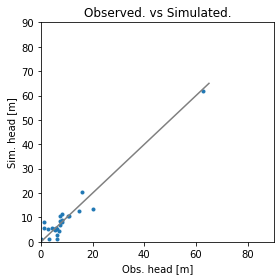

Error is - 2.868806232110307
Params are - [7.05890303e-01 1.54388930e+01 1.60591743e+01 4.82972740e-01
 1.04539045e+00 4.96496339e-01 2.19321483e-03 7.01547656e-01
 1.73781648e-01 3.09224813e-01 1.80992298e-03 3.79266053e+00]


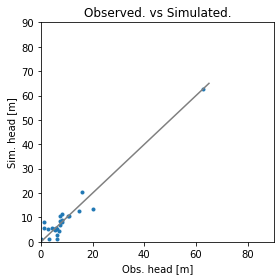

Error is - 2.8677384594565103
Params are - [7.06139560e-01 1.56004856e+01 1.57020758e+01 4.95742693e-01
 1.03163754e+00 5.04376965e-01 2.16442807e-03 7.29291018e-01
 1.72651798e-01 3.06645700e-01 1.80805938e-03 3.72819925e+00]


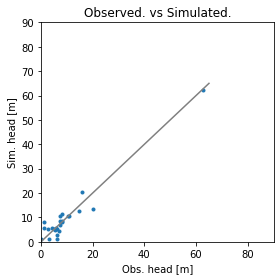

Error is - 2.8671835211553525
Params are - [7.26522341e-01 1.53561558e+01 1.57088124e+01 4.87645277e-01
 1.03265402e+00 5.05722118e-01 2.18776389e-03 7.18397055e-01
 1.72639044e-01 3.12864081e-01 1.74409934e-03 3.82710893e+00]


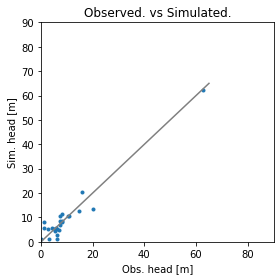

Error is - 2.8666647009842787
Params are - [6.85704406e-01 1.53504906e+01 1.55748513e+01 4.87875340e-01
 1.03300134e+00 5.11564217e-01 2.17866979e-03 7.19031403e-01
 1.73389198e-01 3.16656677e-01 1.80588969e-03 3.85304771e+00]


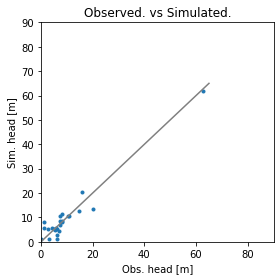

Error is - 2.868272327026538
Params are - [7.02501229e-01 1.56262898e+01 1.58669769e+01 4.91837910e-01
 1.03463534e+00 4.98827285e-01 2.19931804e-03 7.12211471e-01
 1.74750276e-01 3.13181756e-01 1.78275146e-03 3.81504772e+00]


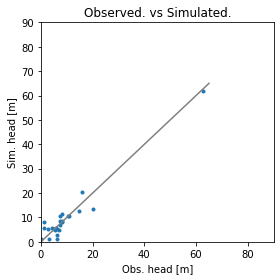

Error is - 2.8683623344617772
Params are - [7.05578274e-01 1.51834488e+01 1.59007956e+01 4.83961059e-01
 1.02514682e+00 4.98631493e-01 2.20329009e-03 7.21433460e-01
 1.76279601e-01 3.14416015e-01 1.79482065e-03 3.82924839e+00]


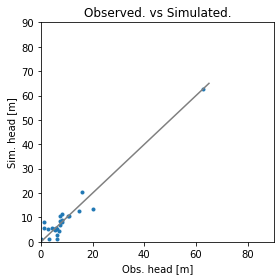

Error is - 2.8674714644508716
Params are - [7.05063284e-01 1.56474882e+01 1.57324819e+01 4.93622207e-01
 1.03887690e+00 5.04825420e-01 2.16971286e-03 7.18149450e-01
 1.72072979e-01 3.08206160e-01 1.79900721e-03 3.75893265e+00]


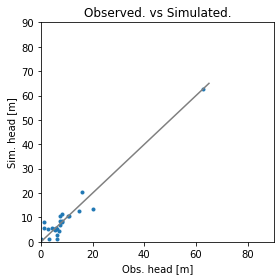

Error is - 2.867411631643417
Params are - [7.10727910e-01 1.53548074e+01 1.60515154e+01 4.88880693e-01
 1.04066239e+00 5.00951646e-01 2.15644437e-03 7.12979108e-01
 1.72182752e-01 3.15754250e-01 1.81115939e-03 3.79820046e+00]


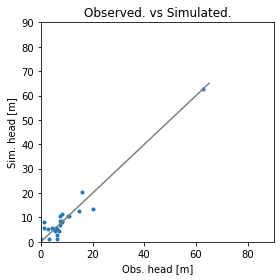

Error is - 2.8668650322143012
Params are - [7.07783105e-01 1.57212420e+01 1.56131969e+01 4.80030290e-01
 1.03394237e+00 4.98675678e-01 2.15722887e-03 7.23770812e-01
 1.73461444e-01 3.17243672e-01 1.79555271e-03 3.83079008e+00]


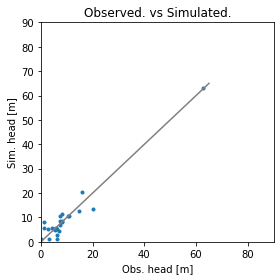

Error is - 2.8690254558814887
Params are - [7.10649298e-01 1.53901135e+01 1.57057305e+01 4.85506921e-01
 1.03604681e+00 5.05858256e-01 2.14423516e-03 7.27053809e-01
 1.71468738e-01 3.10242739e-01 1.81807649e-03 3.76056501e+00]


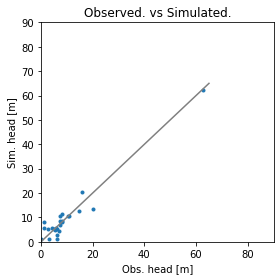

Error is - 2.8672521551660517
Params are - [7.04538246e-01 1.55672458e+01 1.58266653e+01 4.90255163e-01
 1.03498820e+00 5.00585028e-01 2.18554732e-03 7.15922056e-01
 1.73929892e-01 3.12447002e-01 1.79158271e-03 3.80142704e+00]


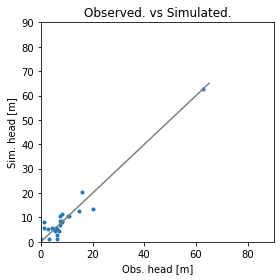

Error is - 2.8680769150394716
Params are - [6.98014612e-01 1.55670407e+01 1.56075435e+01 5.06340094e-01
 1.03882235e+00 4.92943691e-01 2.13988271e-03 7.23404854e-01
 1.74040021e-01 3.17406973e-01 1.75458401e-03 3.81264571e+00]


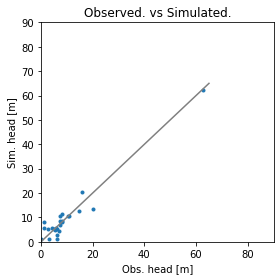

Error is - 2.867273685169671
Params are - [7.09720124e-01 1.54914125e+01 1.58609196e+01 4.81901122e-01
 1.03393562e+00 5.05846937e-01 2.18578178e-03 7.17753136e-01
 1.72831846e-01 3.09553758e-01 1.81747239e-03 3.77950741e+00]


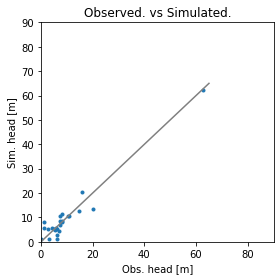

Error is - 2.866698940886203
Params are - [7.11021473e-01 1.57004782e+01 1.58595648e+01 4.90895484e-01
 1.02508783e+00 4.96372000e-01 2.19480663e-03 7.15733537e-01
 1.71024874e-01 3.18182815e-01 1.81579408e-03 3.62162746e+00]


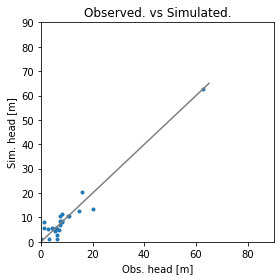

Error is - 2.866626954151562
Params are - [7.10209100e-01 1.55158616e+01 1.56329618e+01 4.87064895e-01
 1.02405000e+00 4.94407833e-01 2.16820511e-03 7.23212310e-01
 1.71237695e-01 3.20300383e-01 1.80634426e-03 3.83818126e+00]


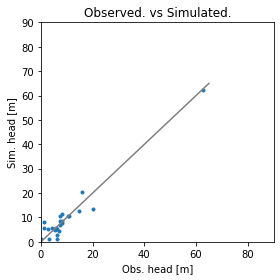

Error is - 2.8667123181295433
Params are - [7.08660743e-01 1.54642370e+01 1.58512170e+01 4.81707301e-01
 1.03360300e+00 4.95187513e-01 2.18516721e-03 7.08214394e-01
 1.72660833e-01 3.22408642e-01 1.79376208e-03 3.83187237e+00]


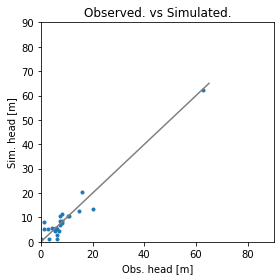

Error is - 2.8671466207075937
Params are - [7.10365252e-01 1.53561024e+01 1.56727842e+01 4.80900971e-01
 1.03894550e+00 4.90842990e-01 2.18797243e-03 7.18999486e-01
 1.71339512e-01 3.25821274e-01 1.79881867e-03 3.86309133e+00]


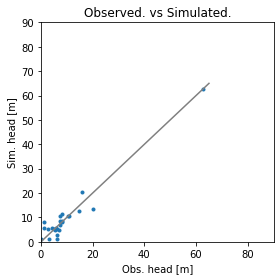

Error is - 2.8661873293407476
Params are - [7.18227937e-01 1.54443152e+01 1.51834073e+01 4.83238486e-01
 1.03736720e+00 4.91973950e-01 2.15854467e-03 7.15259525e-01
 1.75364681e-01 3.17954873e-01 1.82148101e-03 3.92800004e+00]


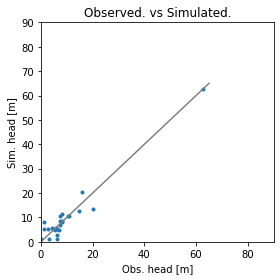

Error is - 2.866207553335232
Params are - [7.27811800e-01 1.53901104e+01 1.46417546e+01 4.79611404e-01
 1.04087583e+00 4.86190525e-01 2.14107009e-03 7.12628323e-01
 1.78053993e-01 3.19157003e-01 1.84129717e-03 4.05120416e+00]


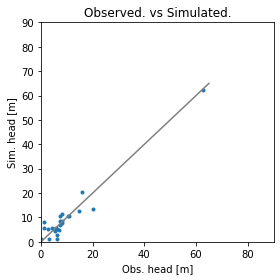

Error is - 2.8662207130827744
Params are - [7.14418972e-01 1.53156899e+01 1.56261258e+01 4.78378308e-01
 1.02858861e+00 4.88547420e-01 2.18046431e-03 7.17150348e-01
 1.73826376e-01 3.26924112e-01 1.80806812e-03 3.87883709e+00]


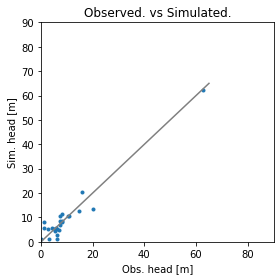

Error is - 2.8667185890634537
Params are - [7.09369523e-01 1.56018511e+01 1.52361941e+01 4.81369425e-01
 1.02479083e+00 4.90353822e-01 2.19773612e-03 7.23015898e-01
 1.73990540e-01 3.21237666e-01 1.79540072e-03 3.85300872e+00]


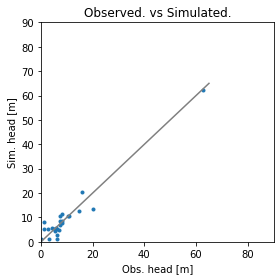

Error is - 2.865940758507795
Params are - [7.10318875e-01 1.54836524e+01 1.53226689e+01 4.88260379e-01
 1.02999346e+00 4.82876346e-01 2.17039110e-03 7.19118997e-01
 1.73534562e-01 3.29385476e-01 1.78540910e-03 3.88395199e+00]


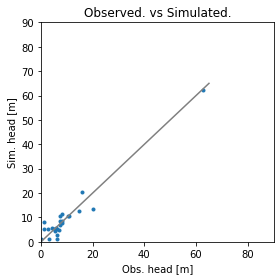

Error is - 2.8658945348841245
Params are - [7.10618250e-01 1.54797723e+01 1.50535436e+01 4.91440008e-01
 1.02802239e+00 4.71391051e-01 2.16269576e-03 7.19801927e-01
 1.73885919e-01 3.39301336e-01 1.76937746e-03 3.93617428e+00]


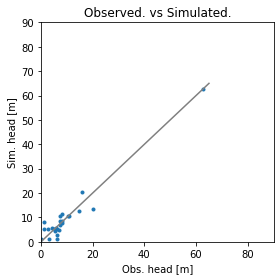

Error is - 2.8659313993318385
Params are - [7.16514087e-01 1.53932402e+01 1.52280697e+01 4.80103812e-01
 1.02777991e+00 4.83272592e-01 2.16681696e-03 7.21596722e-01
 1.72429187e-01 3.30967955e-01 1.80759791e-03 3.88449023e+00]


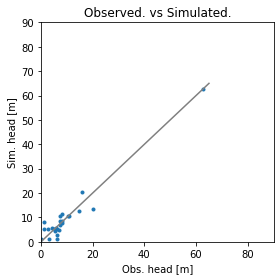

Error is - 2.865814763413483
Params are - [6.92861950e-01 1.56105109e+01 1.52657988e+01 4.81456788e-01
 1.02930175e+00 4.74393914e-01 2.16110924e-03 7.19655001e-01
 1.73685059e-01 3.33568188e-01 1.86566437e-03 3.86837188e+00]


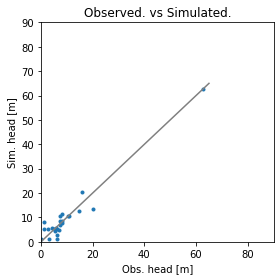

Error is - 2.8663258716499587
Params are - [6.76031755e-01 1.57376885e+01 1.50442920e+01 4.78362543e-01
 1.02762561e+00 4.58729812e-01 2.14778192e-03 7.20283974e-01
 1.74208066e-01 3.43920241e-01 1.92644689e-03 3.88900336e+00]


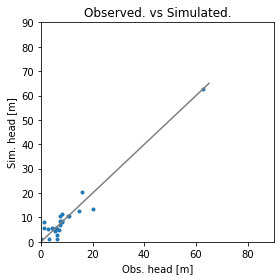

Error is - 2.8661842417825465
Params are - [7.06101821e-01 1.56529658e+01 1.52339961e+01 4.88293730e-01
 1.02140297e+00 4.86531530e-01 2.15642350e-03 7.19161823e-01
 1.75375515e-01 3.21902147e-01 1.82208600e-03 3.83326958e+00]


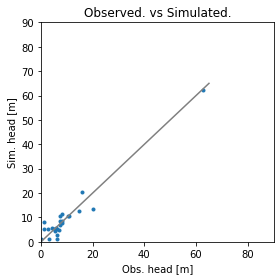

Error is - 2.8658936103026544
Params are - [7.08403755e-01 1.52764468e+01 1.52303832e+01 4.90541650e-01
 1.02431620e+00 4.76674817e-01 2.18703283e-03 7.13622331e-01
 1.73572595e-01 3.31256162e-01 1.82977417e-03 3.86598408e+00]


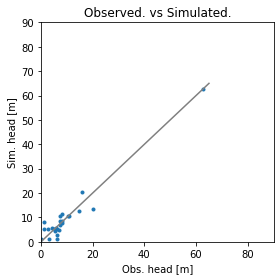

Error is - 2.867064343987364
Params are - [7.06656376e-01 1.53416036e+01 1.56064175e+01 4.90731220e-01
 1.03338864e+00 4.82716839e-01 2.14474170e-03 7.12811651e-01
 1.72973842e-01 3.28931917e-01 1.83565507e-03 3.84592800e+00]


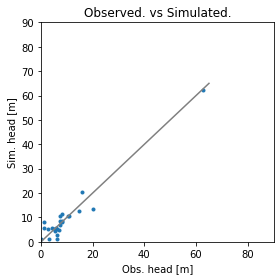

Error is - 2.866110697134466
Params are - [7.08691236e-01 1.55367892e+01 1.53287500e+01 4.83709874e-01
 1.02694028e+00 4.88444576e-01 2.18448751e-03 7.20464836e-01
 1.73736365e-01 3.23161229e-01 1.80546431e-03 3.85123854e+00]


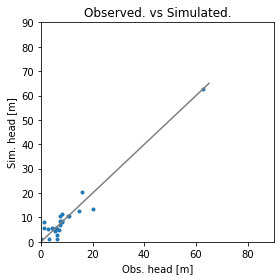

Error is - 2.8658196627097423
Params are - [7.07370237e-01 1.54913098e+01 1.49043169e+01 4.90727106e-01
 1.02346601e+00 4.76759325e-01 2.15719733e-03 7.29654895e-01
 1.74482804e-01 3.27886372e-01 1.83924408e-03 3.87029204e+00]


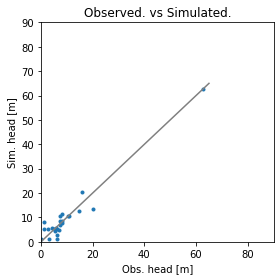

Error is - 2.8662934593021134
Params are - [7.04400968e-01 1.52202072e+01 1.47367610e+01 4.81510860e-01
 1.03171088e+00 4.72306058e-01 2.14128969e-03 7.24455979e-01
 1.76695084e-01 3.33729459e-01 1.82112042e-03 4.12198105e+00]


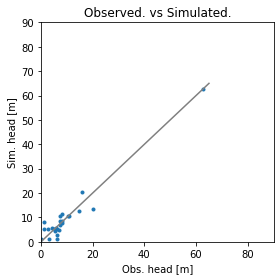

Error is - 2.8657002648568173
Params are - [7.32834129e-01 1.55484809e+01 1.48817928e+01 4.83470257e-01
 1.02358230e+00 4.50570815e-01 2.15119651e-03 7.22062209e-01
 1.74881741e-01 3.38101060e-01 1.83356326e-03 3.93538302e+00]


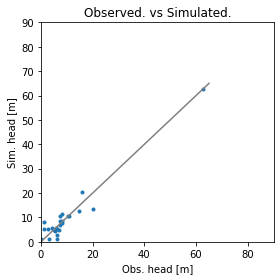

Error is - 2.8663012998326516
Params are - [7.56398990e-01 1.56474760e+01 1.45352635e+01 4.81267715e-01
 1.01887277e+00 4.20074113e-01 2.13745987e-03 7.23577613e-01
 1.75628013e-01 3.48823252e-01 1.84740004e-03 3.97655068e+00]


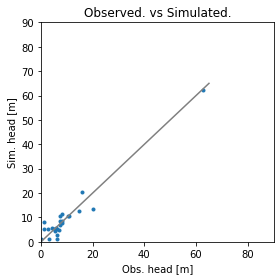

Error is - 2.865597829292159
Params are - [7.12100273e-01 1.53885464e+01 1.46984875e+01 4.83681597e-01
 1.03245569e+00 4.60421029e-01 2.15882642e-03 7.17689619e-01
 1.77640586e-01 3.37424134e-01 1.83764519e-03 3.96644976e+00]


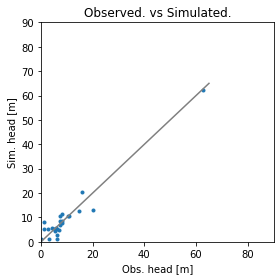

Error is - 2.866194671087836
Params are - [7.13045860e-01 1.53248888e+01 1.42312503e+01 4.81989948e-01
 1.03665854e+00 4.43427627e-01 2.15413708e-03 7.14928273e-01
 1.80842032e-01 3.45986009e-01 1.85329565e-03 4.03058401e+00]


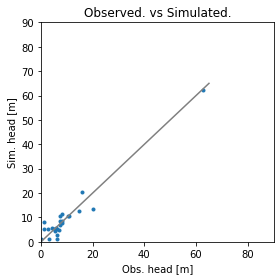

Error is - 2.8654971928395976
Params are - [7.08677706e-01 1.54363259e+01 1.49128217e+01 4.77817345e-01
 1.01926675e+00 4.85440720e-01 2.17274988e-03 7.17569896e-01
 1.73928295e-01 3.38768630e-01 1.80301878e-03 3.96964760e+00]


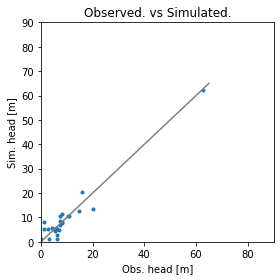

Error is - 2.8658469909364266
Params are - [7.06310110e-01 1.54261289e+01 1.47113573e+01 4.70921983e-01
 1.01062232e+00 4.94107516e-01 2.18165937e-03 7.15091858e-01
 1.73225265e-01 3.47355841e-01 1.78428037e-03 4.02758923e+00]


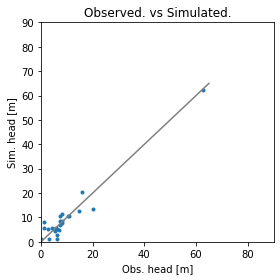

Error is - 2.8660060385900357
Params are - [7.18402424e-01 1.57088583e+01 1.55211545e+01 4.87298967e-01
 1.02203746e+00 4.83430898e-01 2.19163446e-03 7.14492210e-01
 1.72106436e-01 3.27473241e-01 1.81937702e-03 3.67604197e+00]


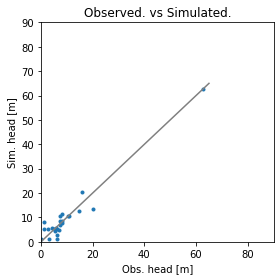

Error is - 2.865456309126373
Params are - [7.09048329e-01 1.56789038e+01 1.46142945e+01 4.91918295e-01
 1.02406787e+00 4.66336783e-01 2.15432154e-03 7.21354817e-01
 1.74688488e-01 3.34370108e-01 1.83431414e-03 3.88538675e+00]


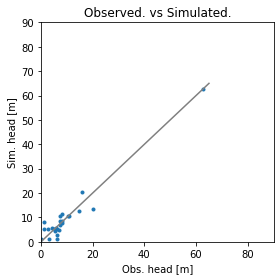

Error is - 2.8658801390395054
Params are - [7.06363008e-01 1.58605107e+01 1.41083788e+01 4.98688288e-01
 1.02180750e+00 4.55231465e-01 2.14125016e-03 7.23457052e-01
 1.75119544e-01 3.38093106e-01 1.84743715e-03 3.88866158e+00]


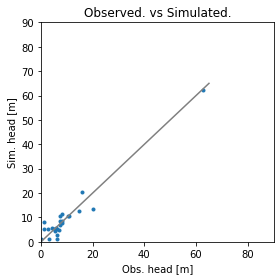

Error is - 2.865400540173212
Params are - [7.03709429e-01 1.55893765e+01 1.49621608e+01 4.88504752e-01
 1.01307273e+00 4.58637392e-01 2.17553731e-03 7.24261523e-01
 1.73037484e-01 3.46075220e-01 1.82304011e-03 3.82912158e+00]


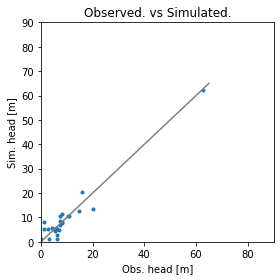

Error is - 2.8656996792062492
Params are - [6.96450175e-01 1.56619071e+01 1.48515376e+01 4.91137885e-01
 1.00092550e+00 4.41969112e-01 2.18403363e-03 7.28762522e-01
 1.71873886e-01 3.60135393e-01 1.82381966e-03 3.77968234e+00]


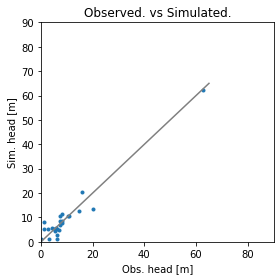

Error is - 2.866110201774671
Params are - [7.15436813e-01 1.53701277e+01 1.48662662e+01 4.83484678e-01
 1.02764858e+00 4.59430789e-01 2.18084413e-03 7.21209175e-01
 1.72636978e-01 3.46156792e-01 1.82259414e-03 3.92316071e+00]


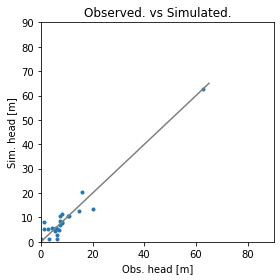

Error is - 2.8657778188053227
Params are - [7.13971661e-01 1.54585274e+01 1.46944317e+01 4.88031002e-01
 1.02222933e+00 4.52682111e-01 2.15217288e-03 7.20030218e-01
 1.74092897e-01 3.48730304e-01 1.84207080e-03 3.91717878e+00]


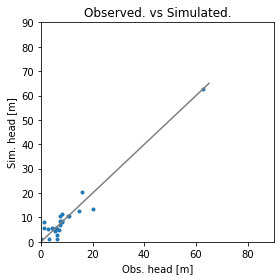

Error is - 2.8662064382128642
Params are - [7.06981892e-01 1.56399222e+01 1.51282764e+01 4.89013918e-01
 1.02061782e+00 4.80571119e-01 2.15103772e-03 7.19089386e-01
 1.75434937e-01 3.26163659e-01 1.82818708e-03 3.84425962e+00]


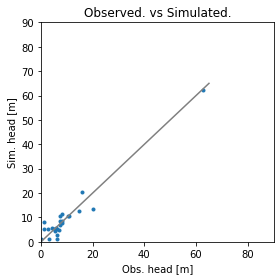

Error is - 2.865620410184497
Params are - [7.13323083e-01 1.54375763e+01 1.49317687e+01 4.84866988e-01
 1.02589089e+00 4.64715871e-01 2.17339253e-03 7.20679228e-01
 1.73336468e-01 3.41158509e-01 1.82399237e-03 3.90343544e+00]


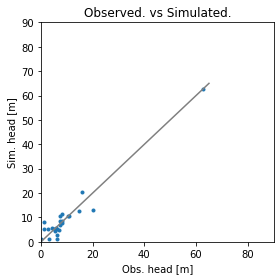

Error is - 2.866385141232201
Params are - [7.03169724e-01 1.52559779e+01 1.43751571e+01 4.84794300e-01
 1.02687117e+00 4.53451839e-01 2.13720707e-03 7.26837521e-01
 1.76170484e-01 3.47128089e-01 1.83217342e-03 4.12927727e+00]


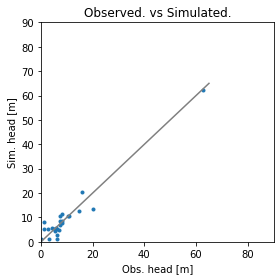

Error is - 2.8655659952678008
Params are - [7.14594249e-01 1.55956382e+01 1.52346552e+01 4.86672800e-01
 1.02324589e+00 4.75936133e-01 2.17802761e-03 7.17578538e-01
 1.73122448e-01 3.32386953e-01 1.82257612e-03 3.78935079e+00]


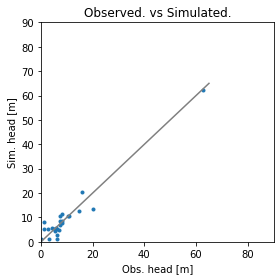

Error is - 2.8651292493333065
Params are - [7.04738088e-01 1.56053290e+01 1.46693395e+01 4.93084286e-01
 1.02037306e+00 4.52387402e-01 2.16389302e-03 7.19063312e-01
 1.75963277e-01 3.43869874e-01 1.84644890e-03 3.90497244e+00]


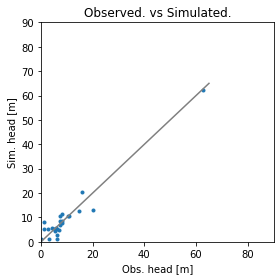

Error is - 2.865073909329216
Params are - [6.98850089e-01 1.57113733e+01 1.43899745e+01 4.99574522e-01
 1.01666963e+00 4.36944806e-01 2.16243104e-03 7.17796606e-01
 1.77730322e-01 3.50320834e-01 1.86587440e-03 3.91521354e+00]


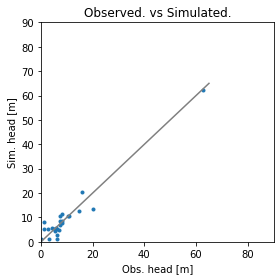

Error is - 2.8651274554206108
Params are - [7.08672565e-01 1.55573971e+01 1.47332708e+01 4.83103843e-01
 1.01823845e+00 4.58527902e-01 2.16797010e-03 7.20523887e-01
 1.75147279e-01 3.37373077e-01 1.90075217e-03 3.84979493e+00]


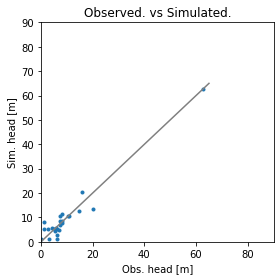

Error is - 2.86610698560608
Params are - [7.10931862e-01 1.58075476e+01 1.44735791e+01 4.82762565e-01
 1.02093168e+00 4.50219650e-01 2.14045591e-03 7.27853741e-01
 1.75723050e-01 3.46437736e-01 1.85218513e-03 3.91728694e+00]


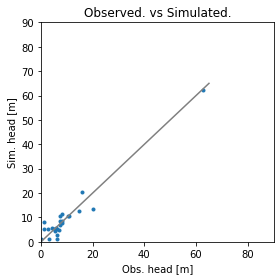

Error is - 2.8654334877422003
Params are - [7.09035782e-01 1.54092220e+01 1.50411822e+01 4.88596879e-01
 1.02347007e+00 4.70061025e-01 2.17538860e-03 7.17180184e-01
 1.74110209e-01 3.35051555e-01 1.83537691e-03 3.87880979e+00]


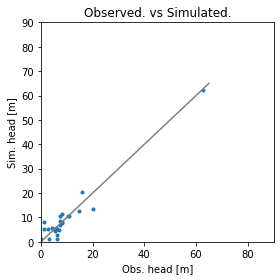

Error is - 2.8655487236156434
Params are - [7.12242970e-01 1.55790033e+01 1.48224563e+01 4.82222072e-01
 1.02178255e+00 4.49018759e-01 2.17332329e-03 7.09742059e-01
 1.74750742e-01 3.51001723e-01 1.84207069e-03 3.91439861e+00]


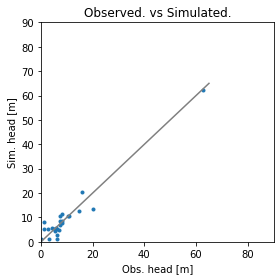

Error is - 2.865047601523401
Params are - [7.29981427e-01 1.54545509e+01 1.43870840e+01 4.91619938e-01
 1.01469361e+00 4.47154977e-01 2.17144705e-03 7.18089796e-01
 1.75726102e-01 3.48225497e-01 1.81171812e-03 3.92398988e+00]


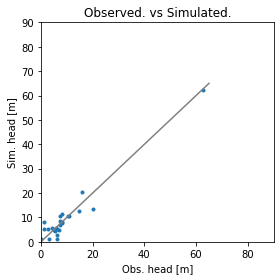

Error is - 2.865146299127903
Params are - [7.48541166e-01 1.53765709e+01 1.39477266e+01 4.96701513e-01
 1.00738954e+00 4.33535508e-01 2.17661595e-03 7.17307194e-01
 1.76746623e-01 3.55554152e-01 1.78474499e-03 3.95179888e+00]


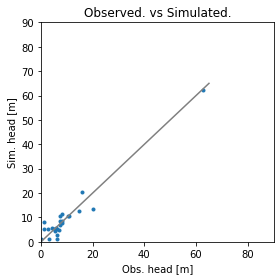

Error is - 2.8655264830012315
Params are - [7.11540011e-01 1.56058718e+01 1.49072264e+01 4.85643879e-01
 1.02051008e+00 4.67945591e-01 2.18359577e-03 7.17391176e-01
 1.75590464e-01 3.32979246e-01 1.83025291e-03 3.87631817e+00]


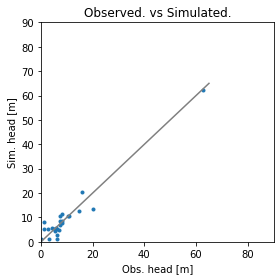

Error is - 2.8659568206212294
Params are - [6.89128523e-01 1.55254834e+01 1.47241043e+01 4.90566895e-01
 1.01864507e+00 4.72952683e-01 2.18997202e-03 7.14580679e-01
 1.74919740e-01 3.42754854e-01 1.83820873e-03 3.84826979e+00]


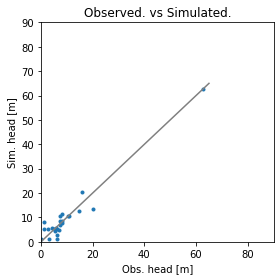

Error is - 2.8653027121744508
Params are - [7.21907727e-01 1.55427315e+01 1.48423707e+01 4.85244416e-01
 1.02234799e+00 4.56166282e-01 2.16089039e-03 7.20191827e-01
 1.74891241e-01 3.39264509e-01 1.83472463e-03 3.91360471e+00]


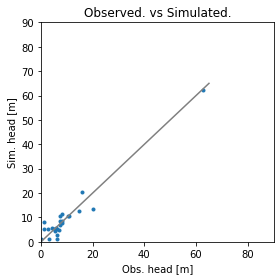

Error is - 2.864946679560347
Params are - [7.10070344e-01 1.56539138e+01 1.46592286e+01 4.89233068e-01
 1.01574599e+00 4.57382695e-01 2.16569230e-03 7.15882427e-01
 1.76724142e-01 3.39381739e-01 1.84956832e-03 3.88191225e+00]


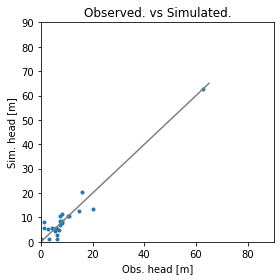

Error is - 2.864964606580336
Params are - [7.08443974e-01 1.57620825e+01 1.45229586e+01 4.91416108e-01
 1.01067355e+00 4.53716107e-01 2.16184219e-03 7.13484026e-01
 1.78417979e-01 3.38493354e-01 1.86235630e-03 3.87115066e+00]


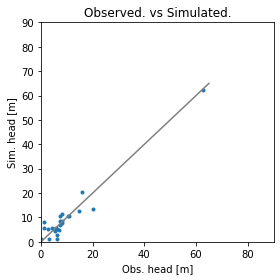

Error is - 2.864979838913626
Params are - [7.10954832e-01 1.57471716e+01 1.48859668e+01 4.91343705e-01
 1.00639625e+00 4.61171148e-01 2.18140272e-03 7.18570837e-01
 1.72267283e-01 3.43442381e-01 1.83790270e-03 3.80480834e+00]


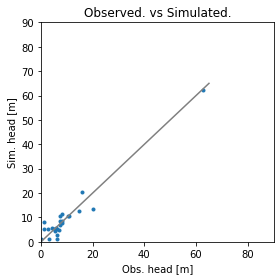

Error is - 2.8649070270219656
Params are - [7.07854286e-01 1.55653354e+01 1.42916844e+01 4.89130986e-01
 1.01279777e+00 4.43195213e-01 2.16276405e-03 7.18847301e-01
 1.76642894e-01 3.50322134e-01 1.85552619e-03 3.98448357e+00]


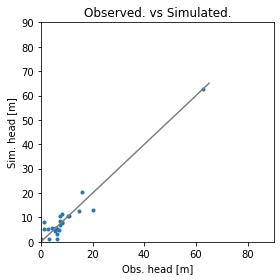

Error is - 2.865089965385933
Params are - [7.04484305e-01 1.55501839e+01 1.38201990e+01 4.90360078e-01
 1.00757371e+00 4.26824754e-01 2.15513227e-03 7.19481683e-01
 1.78403116e-01 3.59289724e-01 1.87200123e-03 4.08204995e+00]


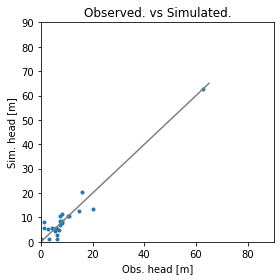

Error is - 2.865163329739124
Params are - [7.09474118e-01 1.55796923e+01 1.46154212e+01 4.94733199e-01
 1.01276365e+00 4.69141997e-01 2.16570851e-03 7.28201320e-01
 1.75329958e-01 3.31594098e-01 1.83827421e-03 3.87111658e+00]


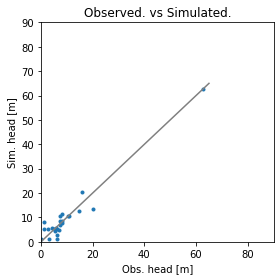

Error is - 2.865596695370889
Params are - [7.09832761e-01 1.55484606e+01 1.44820169e+01 4.92826279e-01
 1.01274505e+00 4.50414566e-01 2.15245482e-03 7.22353895e-01
 1.74446819e-01 3.49385718e-01 1.85142887e-03 3.90833008e+00]


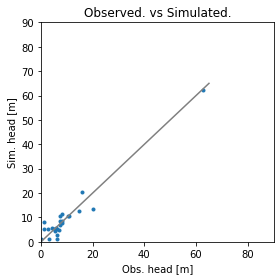

Error is - 2.8651479015557912
Params are - [7.11113198e-01 1.55915190e+01 1.48009240e+01 4.87439479e-01
 1.01856882e+00 4.63562835e-01 2.17581053e-03 7.18631855e-01
 1.75304553e-01 3.37080864e-01 1.83554690e-03 3.88432115e+00]


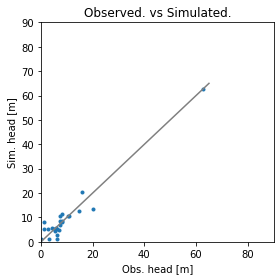

Error is - 2.864883205111357
Params are - [7.13100982e-01 1.57438720e+01 1.44577721e+01 5.02256502e-01
 1.01387206e+00 4.29273123e-01 2.16381081e-03 7.22352167e-01
 1.76338364e-01 3.43315040e-01 1.88408436e-03 3.80077958e+00]


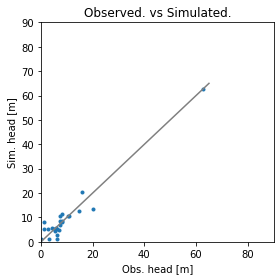

Error is - 2.865116795534249
Params are - [7.15312620e-01 1.58976450e+01 1.42302473e+01 5.14476081e-01
 1.01117471e+00 4.01189325e-01 2.15934127e-03 7.24743303e-01
 1.77543398e-01 3.45588245e-01 1.92461714e-03 3.71634557e+00]


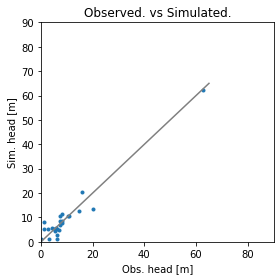

Error is - 2.8651582387228816
Params are - [7.13405801e-01 1.55121221e+01 1.47302122e+01 4.89878587e-01
 1.00737163e+00 4.42199783e-01 2.18382069e-03 7.18733471e-01
 1.75853150e-01 3.49204383e-01 1.86108403e-03 3.87093924e+00]


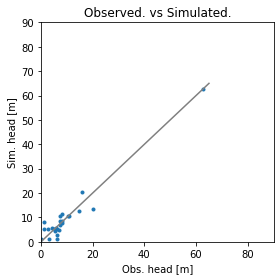

Error is - 2.8647730508131706
Params are - [7.14146685e-01 1.57989539e+01 1.42514962e+01 4.93413620e-01
 1.00528636e+00 4.33832000e-01 2.16415899e-03 7.23166986e-01
 1.76721920e-01 3.50881741e-01 1.86430578e-03 3.87620443e+00]


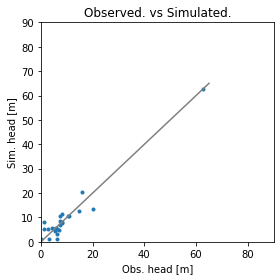

Error is - 2.8649648785523736
Params are - [7.16702136e-01 1.59938198e+01 1.38566532e+01 4.95821991e-01
 9.96194506e-01 4.15717488e-01 2.15854418e-03 7.26160387e-01
 1.78027775e-01 3.58796833e-01 1.87877021e-03 3.87490175e+00]


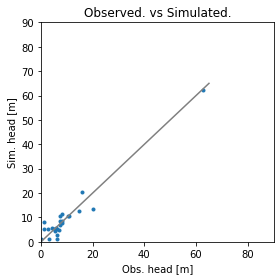

Error is - 2.864806334022598
Params are - [7.21212580e-01 1.56537290e+01 1.42120734e+01 4.94323892e-01
 1.01438597e+00 4.41121402e-01 2.16211388e-03 7.15903224e-01
 1.78408717e-01 3.40659163e-01 1.88352019e-03 3.93373979e+00]


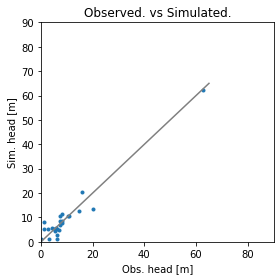

Error is - 2.8647148996882708
Params are - [7.02898424e-01 1.57188735e+01 1.42268140e+01 4.99097474e-01
 1.00378371e+00 4.41085032e-01 2.17696473e-03 7.19258153e-01
 1.77141206e-01 3.47702316e-01 1.87996827e-03 3.85261250e+00]


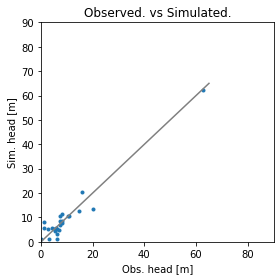

Error is - 2.8648749871432964
Params are - [6.93393772e-01 1.58069445e+01 1.39190357e+01 5.06024002e-01
 9.94501569e-01 4.33544407e-01 2.18500190e-03 7.18791316e-01
 1.78266189e-01 3.51921220e-01 1.90259009e-03 3.82211640e+00]


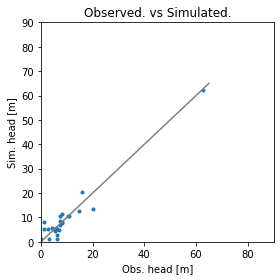

Error is - 2.8652168643515927
Params are - [7.14236084e-01 1.57051096e+01 1.43889956e+01 4.90336070e-01
 1.01187139e+00 4.23433156e-01 2.17402264e-03 7.09758132e-01
 1.77004364e-01 3.58057429e-01 1.88336770e-03 3.89201662e+00]


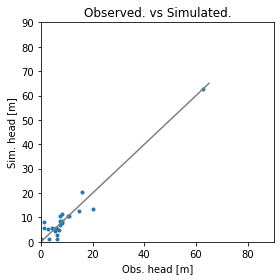

Error is - 2.864877743751557
Params are - [7.10664609e-01 1.56110466e+01 1.45588148e+01 4.93633917e-01
 1.01254059e+00 4.57714787e-01 2.16778704e-03 7.23590523e-01
 1.75748560e-01 3.38209931e-01 1.84954758e-03 3.87634159e+00]


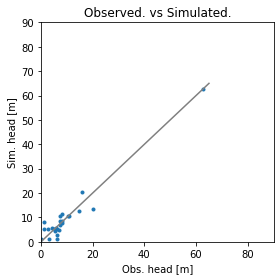

Error is - 2.865020468542196
Params are - [7.09847536e-01 1.57891672e+01 1.42456384e+01 4.95816571e-01
 1.01812490e+00 4.52961204e-01 2.15323818e-03 7.20035489e-01
 1.76463740e-01 3.38614736e-01 1.85863514e-03 3.89309436e+00]


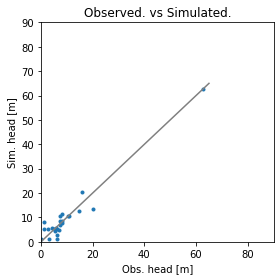

Error is - 2.8648430101973985
Params are - [7.11929195e-01 1.57427117e+01 1.40823789e+01 4.99651861e-01
 1.00685373e+00 4.29831214e-01 2.15748629e-03 7.20371044e-01
 1.77205535e-01 3.50993901e-01 1.88802030e-03 3.88117464e+00]


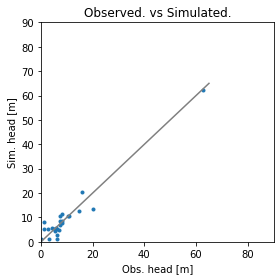

Error is - 2.8646994871178144
Params are - [7.14912600e-01 1.58077194e+01 1.40415502e+01 5.06745500e-01
 1.00528664e+00 4.30083365e-01 2.16357941e-03 7.18453539e-01
 1.77705852e-01 3.52971826e-01 1.82069305e-03 3.92093082e+00]


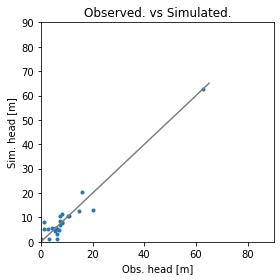

Error is - 2.864844160986206
Params are - [7.18032617e-01 1.59328806e+01 1.36956900e+01 5.18566328e-01
 9.98810733e-01 4.15861096e-01 2.16138407e-03 7.17418365e-01
 1.78985138e-01 3.60771200e-01 1.78066349e-03 3.95649876e+00]


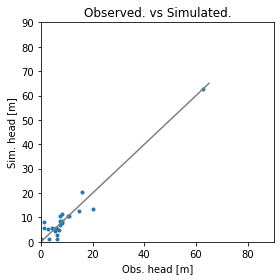

Error is - 2.8646437791257267
Params are - [7.27412161e-01 1.56698008e+01 1.43267758e+01 4.91469983e-01
 1.00495830e+00 4.50522887e-01 2.16930986e-03 7.21290308e-01
 1.75118730e-01 3.40465900e-01 1.84804060e-03 3.85646508e+00]


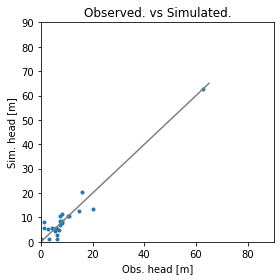

Error is - 2.864845896865852
Params are - [7.41693197e-01 1.56490146e+01 1.42951765e+01 4.87417714e-01
 9.99102642e-01 4.57311927e-01 2.17274927e-03 7.23037159e-01
 1.73812934e-01 3.35538433e-01 1.83912369e-03 3.82709085e+00]


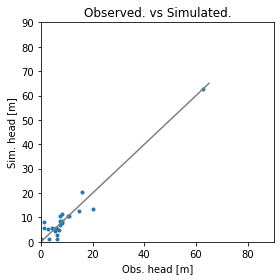

Error is - 2.8650489610508547
Params are - [6.95852611e-01 1.59624982e+01 1.43196150e+01 4.99399575e-01
 1.00531177e+00 4.40874035e-01 2.15993766e-03 7.21530537e-01
 1.77021722e-01 3.41267971e-01 1.90825063e-03 3.83643461e+00]


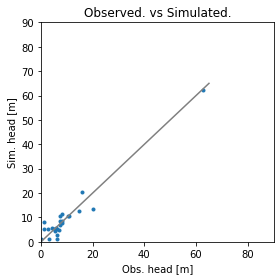

Error is - 2.8648003606721884
Params are - [7.21449223e-01 1.55815377e+01 1.43702167e+01 4.93564847e-01
 1.01234815e+00 4.45584741e-01 2.16856970e-03 7.18949981e-01
 1.76050007e-01 3.46486115e-01 1.83585125e-03 3.90210106e+00]


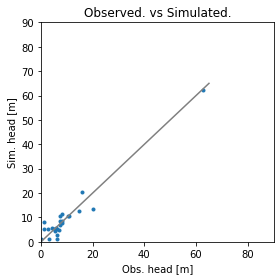

Error is - 2.8647812910331822
Params are - [7.17920117e-01 1.55932770e+01 1.44818236e+01 4.94827655e-01
 1.00091768e+00 4.33838397e-01 2.18070179e-03 7.19403926e-01
 1.76215129e-01 3.52190628e-01 1.85753630e-03 3.86883125e+00]


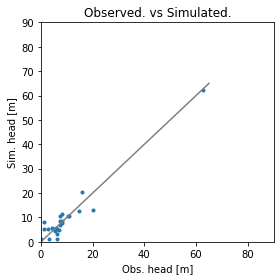

Error is - 2.865113486871104
Params are - [7.17973702e-01 1.56096236e+01 1.37741380e+01 4.99881179e-01
 1.01173325e+00 4.21072995e-01 2.15242042e-03 7.21007426e-01
 1.81069559e-01 3.48821024e-01 1.88154100e-03 3.96778775e+00]


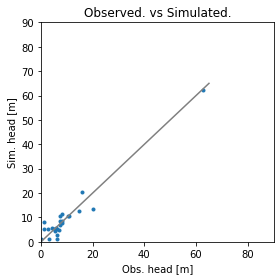

Error is - 2.86474485937282
Params are - [7.12709549e-01 1.57127846e+01 1.46080096e+01 4.93478073e-01
 1.00773050e+00 4.51146610e-01 2.17415715e-03 7.19179984e-01
 1.74467852e-01 3.44787042e-01 1.84881227e-03 3.84555319e+00]


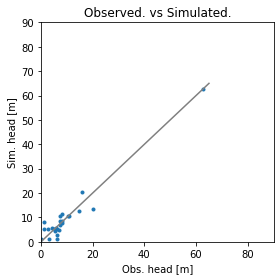

Error is - 2.8644864931339535
Params are - [7.19298058e-01 1.57126931e+01 1.39923396e+01 5.02699317e-01
 1.00104758e+00 4.23822100e-01 2.16954164e-03 7.24245430e-01
 1.76236652e-01 3.53782551e-01 1.86974937e-03 3.88462400e+00]


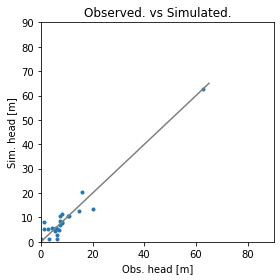

Error is - 2.8643797797400277
Params are - [7.23911915e-01 1.57420828e+01 1.36588951e+01 5.09432442e-01
 9.93698376e-01 4.07041802e-01 2.17146631e-03 7.28426931e-01
 1.75992907e-01 3.60982956e-01 1.87983989e-03 3.88597988e+00]


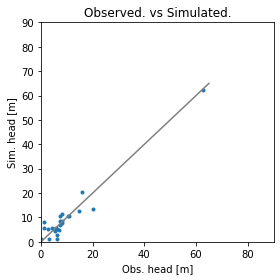

Error is - 2.864487682885331
Params are - [7.24190387e-01 1.58307295e+01 1.42544190e+01 5.06184975e-01
 1.00081257e+00 4.31984013e-01 2.17392027e-03 7.22877160e-01
 1.76209569e-01 3.44618959e-01 1.86784378e-03 3.76563540e+00]


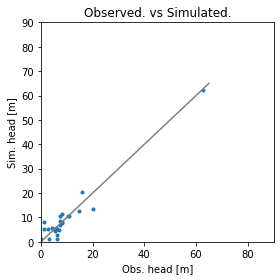

Error is - 2.8645984616834075
Params are - [7.20791925e-01 1.56666691e+01 1.40544392e+01 4.93714204e-01
 9.97561706e-01 4.46357919e-01 2.17455843e-03 7.19459793e-01
 1.76492634e-01 3.51843373e-01 1.83657885e-03 3.94348203e+00]


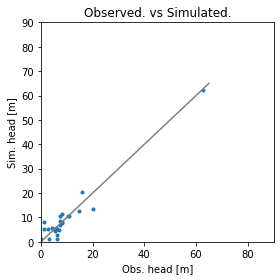

Error is - 2.864474090591891
Params are - [7.24916184e-01 1.58087649e+01 1.38693338e+01 5.02350171e-01
 9.96396694e-01 4.16023444e-01 2.17171076e-03 7.17532982e-01
 1.77206450e-01 3.59220722e-01 1.86895417e-03 3.87911009e+00]


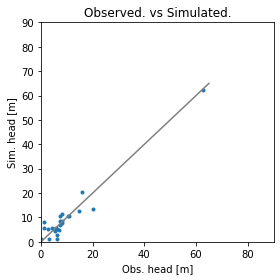

Error is - 2.8646328850964307
Params are - [7.25816097e-01 1.56881086e+01 1.43102622e+01 4.96781945e-01
 1.00034072e+00 4.41605722e-01 2.18438226e-03 7.20279451e-01
 1.75749627e-01 3.47807889e-01 1.82730376e-03 3.87393294e+00]


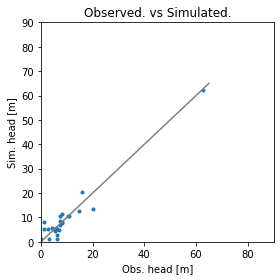

Error is - 2.8647335132128062
Params are - [7.17299965e-01 1.57828214e+01 1.41969325e+01 5.02519589e-01
 9.90467597e-01 4.30396253e-01 2.18346606e-03 7.25476642e-01
 1.74103263e-01 3.59334082e-01 1.82243447e-03 3.81139999e+00]


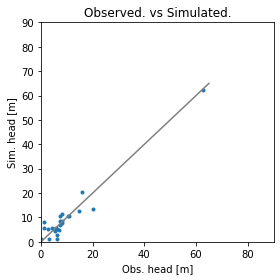

Error is - 2.8643802149677797
Params are - [7.16371778e-01 1.58885599e+01 1.40099085e+01 5.04771091e-01
 9.88858659e-01 4.23401499e-01 2.17949297e-03 7.23517661e-01
 1.76137516e-01 3.55648457e-01 1.86786729e-03 3.82792187e+00]


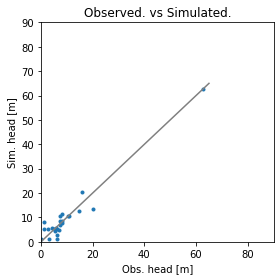

Error is - 2.864419164820284
Params are - [7.19642828e-01 1.59260344e+01 1.38196491e+01 5.05165523e-01
 9.98279289e-01 4.33408360e-01 2.16715941e-03 7.23749339e-01
 1.75959459e-01 3.50520249e-01 1.84790407e-03 3.85437345e+00]


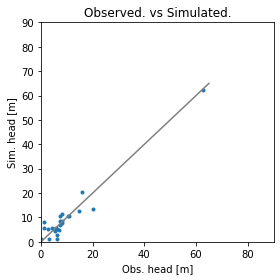

Error is - 2.864253636047192
Params are - [7.24332284e-01 1.57415376e+01 1.39780020e+01 5.08538208e-01
 9.92742766e-01 4.33344151e-01 2.18420229e-03 7.20083338e-01
 1.75325591e-01 3.51768888e-01 1.83840097e-03 3.84336178e+00]


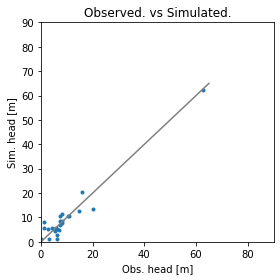

Error is - 2.8641582293598864
Params are - [7.29425084e-01 1.57128295e+01 1.38412550e+01 5.16100502e-01
 9.86470968e-01 4.33100226e-01 2.19422394e-03 7.18541514e-01
 1.74627427e-01 3.52212462e-01 1.82544856e-03 3.82694045e+00]


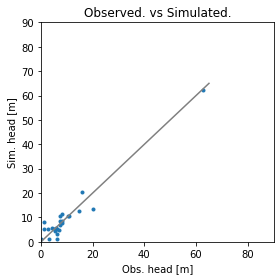

Error is - 2.864273328463035
Params are - [7.28555342e-01 1.58277144e+01 1.34936962e+01 5.12244160e-01
 9.86755375e-01 4.13021811e-01 2.17754859e-03 7.23963928e-01
 1.77606255e-01 3.59101157e-01 1.85000052e-03 3.87091089e+00]


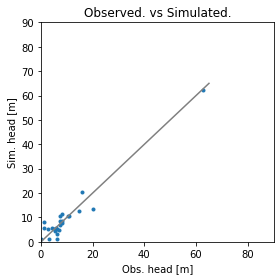

Error is - 2.8644364561400515
Params are - [7.25840823e-01 1.57651598e+01 1.37875672e+01 5.04823406e-01
 1.00339957e+00 4.30876427e-01 2.16725343e-03 7.17415151e-01
 1.78554675e-01 3.44515296e-01 1.88097267e-03 3.91498258e+00]


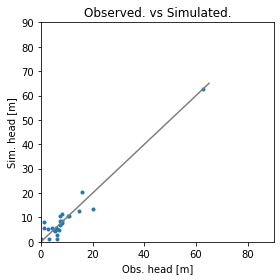

Error is - 2.8643378758086815
Params are - [7.44066097e-01 1.58368220e+01 1.36844779e+01 5.09199843e-01
 9.90019435e-01 4.18486214e-01 2.17213622e-03 7.23326473e-01
 1.75752311e-01 3.55615892e-01 1.82360626e-03 3.88416508e+00]


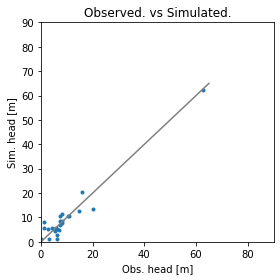

Error is - 2.864139297012484
Params are - [7.36910837e-01 1.57528265e+01 1.38102296e+01 5.01960875e-01
 9.85971971e-01 4.27555022e-01 2.18694766e-03 7.24943243e-01
 1.74862075e-01 3.50787060e-01 1.88336702e-03 3.80971914e+00]


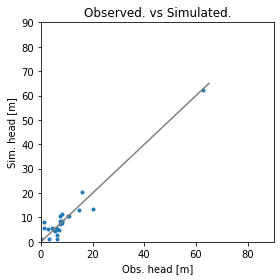

Error is - 2.8641678848277983
Params are - [7.47909956e-01 1.57253801e+01 1.36945693e+01 4.99568562e-01
 9.76314636e-01 4.26290851e-01 2.19863179e-03 7.28188095e-01
 1.73440187e-01 3.49694677e-01 1.91470400e-03 3.75411330e+00]


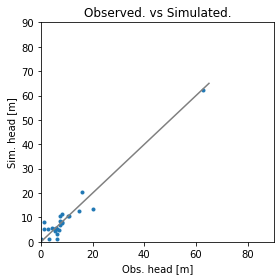

Error is - 2.864326192486563
Params are - [7.25994389e-01 1.59045827e+01 1.34389130e+01 5.18984873e-01
 9.83135919e-01 4.03287523e-01 2.18415685e-03 7.22715296e-01
 1.77406421e-01 3.65013179e-01 1.86190721e-03 3.86639389e+00]


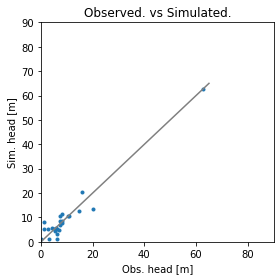

Error is - 2.8643366881082115
Params are - [7.27620168e-01 1.59223539e+01 1.33102017e+01 5.17373399e-01
 9.84886040e-01 4.05818322e-01 2.16904688e-03 7.24132128e-01
 1.77051656e-01 3.60538738e-01 1.88841129e-03 3.84766951e+00]


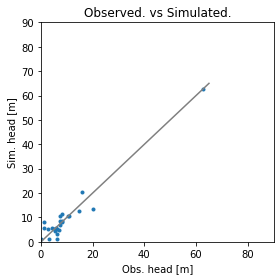

Error is - 2.864092611117275
Params are - [7.33782380e-01 1.59864076e+01 1.34419852e+01 5.24384339e-01
 9.85552439e-01 3.94309525e-01 2.17795212e-03 7.25730508e-01
 1.76401820e-01 3.57952481e-01 1.88777493e-03 3.76215168e+00]


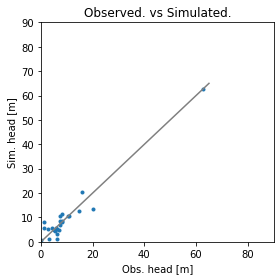

Error is - 2.8641992865463677
Params are - [7.40277607e-01 1.61462768e+01 1.31357582e+01 5.39719407e-01
 9.79547805e-01 3.68285328e-01 2.17964896e-03 7.28865866e-01
 1.76356413e-01 3.61007035e-01 1.91337297e-03 3.67148650e+00]


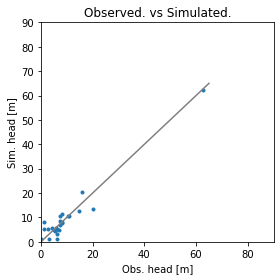

Error is - 2.864141534871747
Params are - [7.31982584e-01 1.58482936e+01 1.31065997e+01 5.14946795e-01
 9.79758217e-01 4.02404349e-01 2.17926225e-03 7.22788699e-01
 1.76716926e-01 3.67399149e-01 1.85983187e-03 3.93941768e+00]


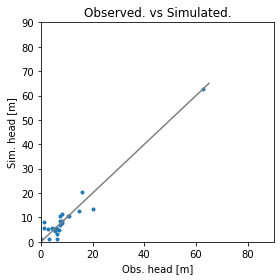

Error is - 2.8639643450266377
Params are - [7.32434520e-01 1.58768463e+01 1.33645625e+01 5.20881038e-01
 9.81401015e-01 4.16095070e-01 2.18273034e-03 7.29008830e-01
 1.75638458e-01 3.54160457e-01 1.85720109e-03 3.83599426e+00]


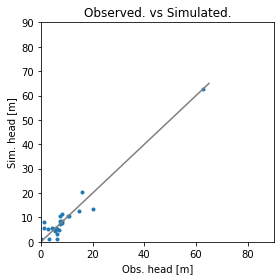

Error is - 2.863975497805363
Params are - [7.36193688e-01 1.59108870e+01 1.31121769e+01 5.30146471e-01
 9.73903175e-01 4.16130883e-01 2.18824013e-03 7.34746754e-01
 1.74854462e-01 3.51630325e-01 1.85132455e-03 3.81443634e+00]


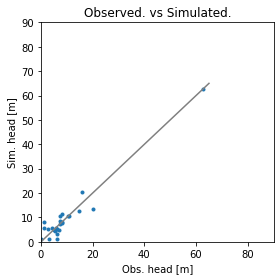

Error is - 2.864357540641426
Params are - [7.32608831e-01 1.59390658e+01 1.33758284e+01 5.21084074e-01
 9.70731713e-01 3.98778527e-01 2.18976716e-03 7.31058940e-01
 1.73804197e-01 3.70473410e-01 1.84122066e-03 3.78695705e+00]


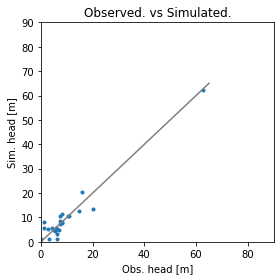

Error is - 2.8641584641018296
Params are - [7.40967826e-01 1.57803631e+01 1.32697763e+01 5.23395049e-01
 9.71260732e-01 3.90474955e-01 2.19362913e-03 7.25943020e-01
 1.76040202e-01 3.67793984e-01 1.87317536e-03 3.83633011e+00]


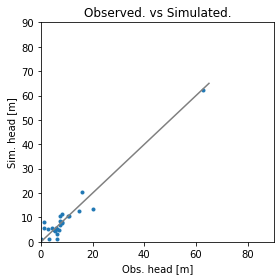

Error is - 2.863883534396393
Params are - [7.48338217e-01 1.57998049e+01 1.29561616e+01 5.26893473e-01
 9.77748374e-01 3.94994059e-01 2.18365161e-03 7.26578924e-01
 1.75845926e-01 3.64690031e-01 1.85409682e-03 3.86418306e+00]


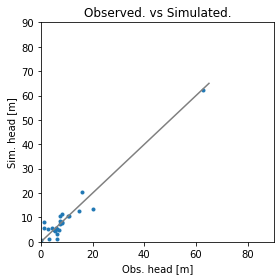

Error is - 2.8638354967871598
Params are - [7.64321437e-01 1.57554274e+01 1.24292881e+01 5.37954664e-01
 9.72193231e-01 3.80790338e-01 2.18573092e-03 7.28109556e-01
 1.75700131e-01 3.69210817e-01 1.84721159e-03 3.88231366e+00]


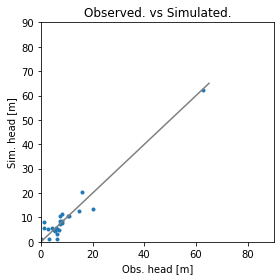

Error is - 2.8639907349274196
Params are - [7.47533000e-01 1.59485060e+01 1.31022405e+01 5.26985827e-01
 9.69324467e-01 4.06978511e-01 2.19405570e-03 7.21616758e-01
 1.75941739e-01 3.60726841e-01 1.83668617e-03 3.80551402e+00]


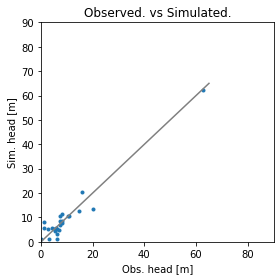

Error is - 2.8641174555242706
Params are - [7.41323446e-01 1.57530963e+01 1.33397092e+01 5.16317820e-01
 9.92056589e-01 4.16608450e-01 2.17646961e-03 7.17411052e-01
 1.78486707e-01 3.49611959e-01 1.87454965e-03 3.90762968e+00]


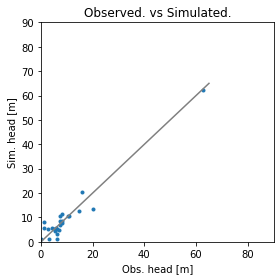

Error is - 2.86412541824971
Params are - [7.29409072e-01 1.58413859e+01 1.29735983e+01 5.29388380e-01
 9.73108392e-01 3.96587803e-01 2.19482278e-03 7.24157615e-01
 1.76994326e-01 3.63468822e-01 1.90065461e-03 3.81433241e+00]


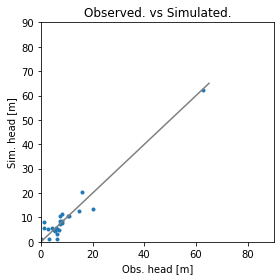

Error is - 2.8641394199928527
Params are - [7.46153152e-01 1.57423593e+01 1.32917739e+01 5.23217321e-01
 9.76278846e-01 4.07717276e-01 2.20220810e-03 7.23356209e-01
 1.75685425e-01 3.59034324e-01 1.83789015e-03 3.84527180e+00]


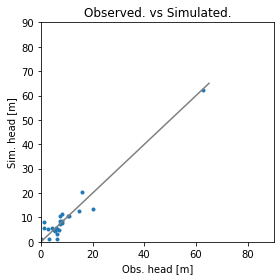

Error is - 2.863774968012412
Params are - [7.51138724e-01 1.57330932e+01 1.31385394e+01 5.22311255e-01
 9.76886122e-01 4.10986367e-01 2.19010668e-03 7.24879859e-01
 1.75043828e-01 3.53563407e-01 1.86039138e-03 3.82302708e+00]


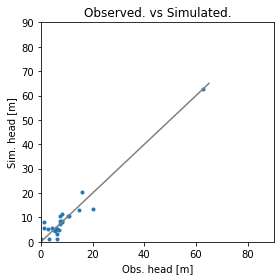

Error is - 2.8638711736456033
Params are - [7.63710892e-01 1.56473484e+01 1.29883527e+01 5.23974446e-01
 9.73761223e-01 4.14835788e-01 2.19308159e-03 7.25962141e-01
 1.73862532e-01 3.47838520e-01 1.85963346e-03 3.80134367e+00]


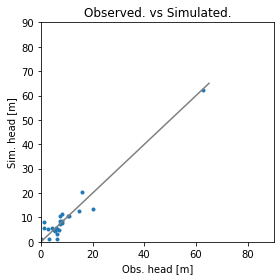

Error is - 2.863681410091915
Params are - [7.52341668e-01 1.57941914e+01 1.30245634e+01 5.30729818e-01
 9.71621789e-01 4.00912838e-01 2.19880795e-03 7.23783883e-01
 1.74416923e-01 3.58552470e-01 1.87402988e-03 3.81052944e+00]


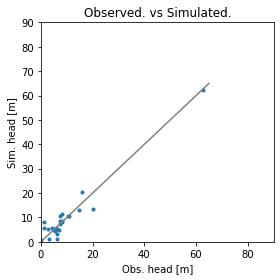

Error is - 2.863616748939468
Params are - [7.64234832e-01 1.57774298e+01 1.27899971e+01 5.39972647e-01
 9.64054997e-01 3.94858352e-01 2.20943763e-03 7.23693860e-01
 1.72822257e-01 3.58278127e-01 1.88604456e-03 3.78033871e+00]


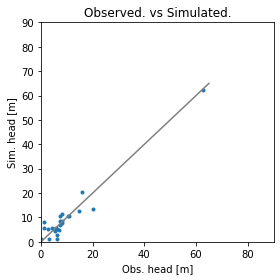

Error is - 2.863703128112779
Params are - [7.43807018e-01 1.58410538e+01 1.31685201e+01 5.22341862e-01
 9.85915476e-01 4.24190260e-01 2.18536215e-03 7.21429931e-01
 1.75446651e-01 3.48273668e-01 1.85299990e-03 3.83577832e+00]


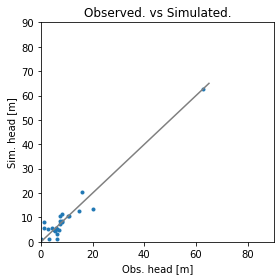

Error is - 2.864027466832413
Params are - [7.57746750e-01 1.59299581e+01 1.24849189e+01 5.30676635e-01
 9.70612659e-01 3.80079994e-01 2.18329039e-03 7.29312839e-01
 1.76995963e-01 3.63198723e-01 1.90531859e-03 3.84664096e+00]


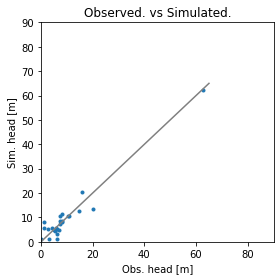

Error is - 2.863899935710283
Params are - [7.59483278e-01 1.58081048e+01 1.31159608e+01 5.34451982e-01
 9.75801150e-01 4.07055146e-01 2.19892343e-03 7.26153011e-01
 1.74952971e-01 3.47311965e-01 1.87851641e-03 3.71870094e+00]


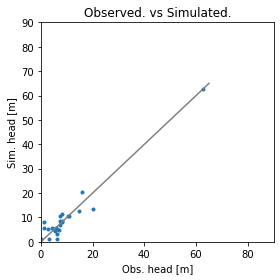

Error is - 2.8641038652359456
Params are - [7.47534397e-01 1.59249967e+01 1.29014844e+01 5.28053899e-01
 9.79200905e-01 4.01631864e-01 2.17543013e-03 7.26051635e-01
 1.75862396e-01 3.53723064e-01 1.90722917e-03 3.79175168e+00]


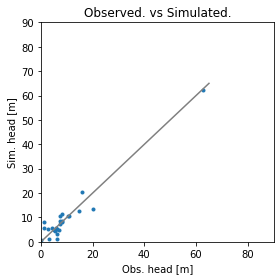

Error is - 2.863744755440177
Params are - [7.58547305e-01 1.59432244e+01 1.22315711e+01 5.53659183e-01
 9.68379269e-01 3.77473591e-01 2.18877098e-03 7.24649333e-01
 1.76852466e-01 3.62459662e-01 1.86572932e-03 3.82430976e+00]


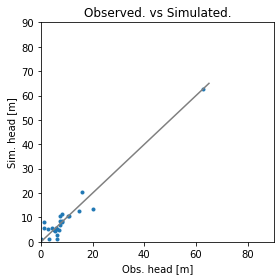

Error is - 2.86396893936839
Params are - [7.70905443e-01 1.58716382e+01 1.29445313e+01 5.30276812e-01
 9.80454661e-01 4.05255108e-01 2.17988723e-03 7.25516913e-01
 1.74696572e-01 3.49609706e-01 1.84262085e-03 3.82135937e+00]


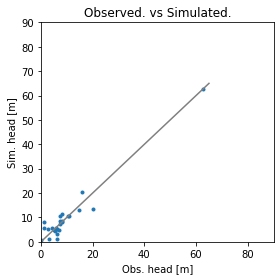

Error is - 2.8639080138642106
Params are - [7.63921401e-01 1.59796847e+01 1.25125574e+01 5.45673871e-01
 9.59572810e-01 3.83342237e-01 2.19881001e-03 7.33614454e-01
 1.72572502e-01 3.63466194e-01 1.86340434e-03 3.71368373e+00]


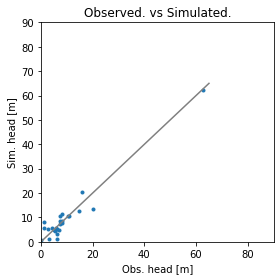

Error is - 2.863871692804604
Params are - [7.60441617e-01 1.58168990e+01 1.28859610e+01 5.36874453e-01
 9.69157144e-01 3.95270553e-01 2.20374613e-03 7.26234340e-01
 1.74648497e-01 3.60978944e-01 1.82342068e-03 3.81655040e+00]


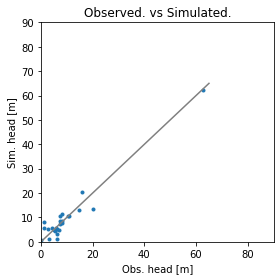

Error is - 2.863807683949848
Params are - [7.78636841e-01 1.57272367e+01 1.22527895e+01 5.42625699e-01
 9.60073062e-01 4.02753063e-01 2.20552315e-03 7.26639439e-01
 1.73816852e-01 3.57253938e-01 1.83214921e-03 3.85521685e+00]


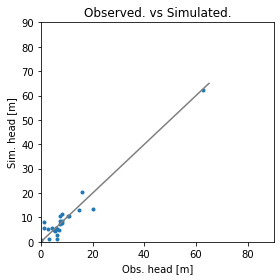

Error is - 2.8638047679127747
Params are - [7.58154153e-01 1.57498992e+01 1.31711675e+01 5.38324914e-01
 9.73256242e-01 4.20761438e-01 2.20389034e-03 7.22611542e-01
 1.72692858e-01 3.51016898e-01 1.80241066e-03 3.77215689e+00]


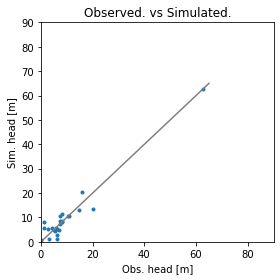

Error is - 2.8635810308642897
Params are - [7.70138094e-01 1.56982503e+01 1.25653338e+01 5.43905569e-01
 9.75199730e-01 3.96160076e-01 2.19476414e-03 7.30473420e-01
 1.73205601e-01 3.51870456e-01 1.86533049e-03 3.80772431e+00]


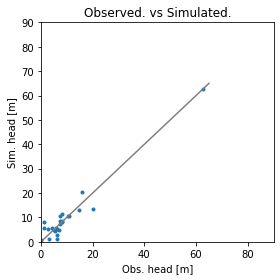

Error is - 2.8638030324260875
Params are - [7.81440642e-01 1.55731224e+01 1.22968805e+01 5.52365441e-01
 9.78137361e-01 3.90750858e-01 2.19511836e-03 7.34901751e-01
 1.71837532e-01 3.47442263e-01 1.87965265e-03 3.80882945e+00]


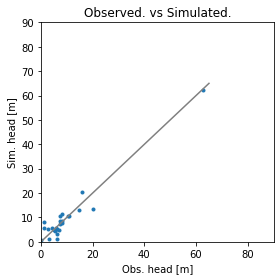

Error is - 2.8638468972513396
Params are - [7.46637761e-01 1.57462201e+01 1.26598435e+01 5.42886044e-01
 9.63193713e-01 3.96367640e-01 2.21141209e-03 7.27399349e-01
 1.74202273e-01 3.63364383e-01 1.86318076e-03 3.78960644e+00]


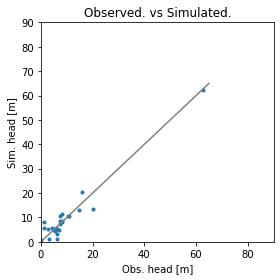

Error is - 2.8636769917855407
Params are - [7.87475890e-01 1.57192410e+01 1.21223590e+01 5.55949320e-01
 9.59212809e-01 3.82239773e-01 2.21334927e-03 7.23639186e-01
 1.73021023e-01 3.60347619e-01 1.84959713e-03 3.76724026e+00]


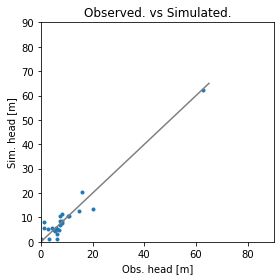

Error is - 2.8638515458896063
Params are - [7.59914757e-01 1.55729952e+01 1.29093311e+01 5.32869061e-01
 9.80981014e-01 4.14808862e-01 2.19969280e-03 7.17371017e-01
 1.76161733e-01 3.50522120e-01 1.84109267e-03 3.89847687e+00]


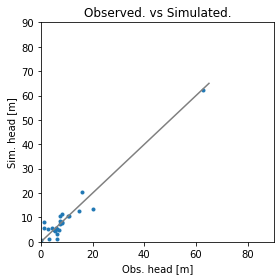

Error is - 2.8636676923608837
Params are - [7.64424794e-01 1.57053902e+01 1.22714894e+01 5.43827130e-01
 9.65615985e-01 3.92388240e-01 2.19970762e-03 7.23368795e-01
 1.73982724e-01 3.67211374e-01 1.81974332e-03 3.92342232e+00]


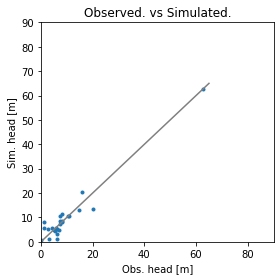

Error is - 2.86348974317359
Params are - [7.64130317e-01 1.56780112e+01 1.23990773e+01 5.42563438e-01
 9.71669798e-01 4.03692447e-01 2.19421183e-03 7.22809874e-01
 1.74176236e-01 3.54583134e-01 1.87422615e-03 3.84338484e+00]


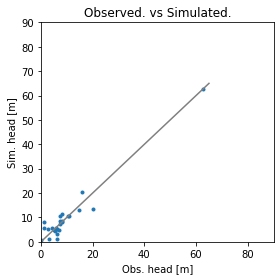

Error is - 2.8635818650808775
Params are - [7.65974667e-01 1.56085673e+01 1.21556355e+01 5.45407931e-01
 9.72926124e-01 4.07903395e-01 2.18944468e-03 7.21097641e-01
 1.73940105e-01 3.51385229e-01 1.89962888e-03 3.85680206e+00]


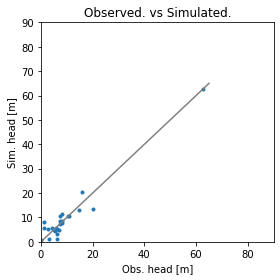

Error is - 2.863905539961284
Params are - [7.65359770e-01 1.59394177e+01 1.22906649e+01 5.48184560e-01
 9.58294058e-01 3.82301402e-01 2.19735166e-03 7.32579674e-01
 1.72332084e-01 3.65716794e-01 1.86207641e-03 3.75227637e+00]


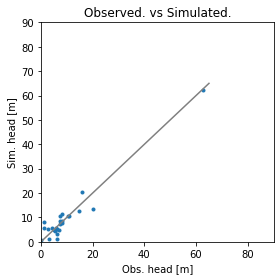

Error is - 2.86362872283394
Params are - [7.61276011e-01 1.56646008e+01 1.27546646e+01 5.36697936e-01
 9.75309275e-01 4.06681997e-01 2.19910752e-03 7.21173181e-01
 1.75204320e-01 3.54320788e-01 1.84633860e-03 3.86192675e+00]


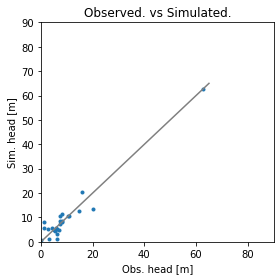

Error is - 2.8637152477301475
Params are - [7.81076475e-01 1.57525896e+01 1.25559561e+01 5.37136225e-01
 9.78100619e-01 4.02461684e-01 2.18358162e-03 7.21513647e-01
 1.74458552e-01 3.51367265e-01 1.83718129e-03 3.87320018e+00]


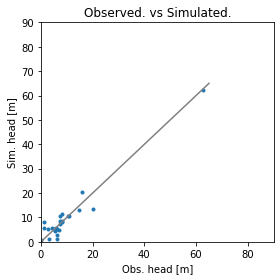

Error is - 2.8637001636133914
Params are - [7.66185306e-01 1.57429094e+01 1.28076227e+01 5.41931199e-01
 9.70085666e-01 4.21650876e-01 2.20890456e-03 7.19704122e-01
 1.72753764e-01 3.42546905e-01 1.85147874e-03 3.77897405e+00]


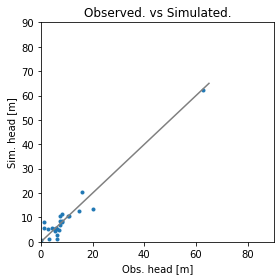

Error is - 2.8635467674487507
Params are - [7.49794646e-01 1.57737121e+01 1.30765935e+01 5.37144414e-01
 9.83874603e-01 4.02837787e-01 2.18967591e-03 7.20018353e-01
 1.74459861e-01 3.52052613e-01 1.86976271e-03 3.79336372e+00]


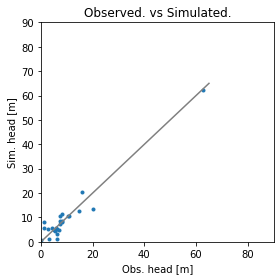

Error is - 2.863651323483754
Params are - [7.68884083e-01 1.57550184e+01 1.21424532e+01 5.41248449e-01
 9.72461150e-01 3.81842137e-01 2.18893964e-03 7.23614052e-01
 1.75878356e-01 3.58462272e-01 1.91072661e-03 3.87995815e+00]


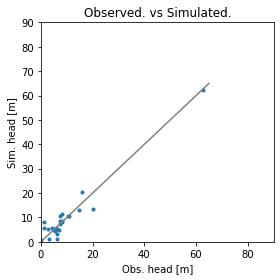

Error is - 2.8633178179828054
Params are - [7.78857071e-01 1.57754787e+01 1.20090669e+01 5.60418307e-01
 9.68093774e-01 3.86759837e-01 2.20252880e-03 7.21134766e-01
 1.73666474e-01 3.56732241e-01 1.86113509e-03 3.83857648e+00]


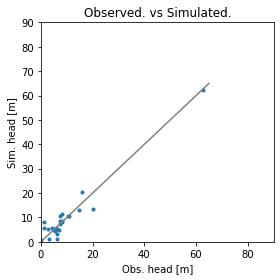

Error is - 2.8633234265826957
Params are - [7.92716244e-01 1.57966714e+01 1.14443306e+01 5.79471833e-01
 9.63697601e-01 3.74646572e-01 2.20873986e-03 7.19262220e-01
 1.72977797e-01 3.58316658e-01 1.86150695e-03 3.84635119e+00]


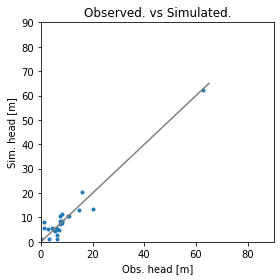

Error is - 2.8635557840064347
Params are - [7.74833451e-01 1.55373898e+01 1.28789511e+01 5.30196900e-01
 9.76553044e-01 4.21820320e-01 2.20615746e-03 7.20779531e-01
 1.71326837e-01 3.46881415e-01 1.85503144e-03 3.83967159e+00]


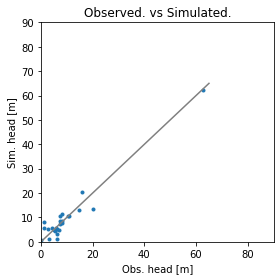

Error is - 2.8636732446578317
Params are - [7.51263777e-01 1.56921580e+01 1.26083987e+01 5.45563303e-01
 9.66573765e-01 4.00058667e-01 2.21510947e-03 7.23792865e-01
 1.73198799e-01 3.57226170e-01 1.88655450e-03 3.78519307e+00]


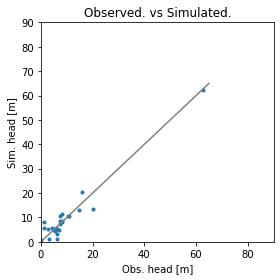

Error is - 2.86360750448704
Params are - [7.89776027e-01 1.55788778e+01 1.19024812e+01 5.64227907e-01
 9.55535290e-01 3.74308158e-01 2.21828682e-03 7.24270403e-01
 1.71836058e-01 3.61811852e-01 1.87632832e-03 3.81418406e+00]


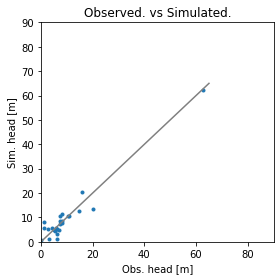

Error is - 2.8635730107552595
Params are - [7.71329526e-01 1.56496837e+01 1.21125216e+01 5.48354688e-01
 9.68940037e-01 3.68957089e-01 2.19630812e-03 7.26757259e-01
 1.74375994e-01 3.70749438e-01 1.88199108e-03 3.87685666e+00]


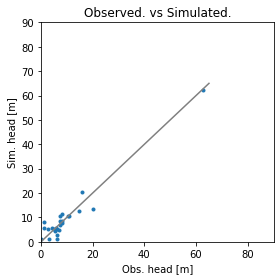

Error is - 2.863488789821834
Params are - [7.47347881e-01 1.56617592e+01 1.27961457e+01 5.33070795e-01
 9.81434099e-01 4.06154411e-01 2.18902322e-03 7.23341874e-01
 1.74334563e-01 3.54682361e-01 1.88927168e-03 3.90685985e+00]


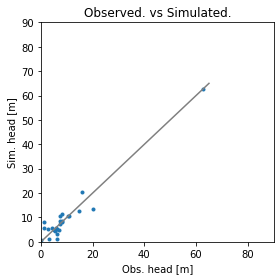

Error is - 2.8636181670025773
Params are - [7.82907345e-01 1.56837757e+01 1.23413972e+01 5.41374727e-01
 9.76549865e-01 3.89351475e-01 2.18291531e-03 7.23113030e-01
 1.74346081e-01 3.57379842e-01 1.85276718e-03 3.90918484e+00]


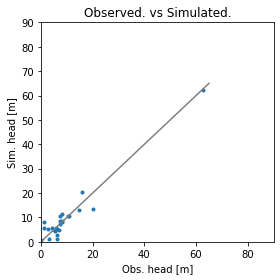

Error is - 2.863790915672431
Params are - [7.72826753e-01 1.56669410e+01 1.26899577e+01 5.42702166e-01
 9.79329958e-01 3.96515775e-01 2.19551845e-03 7.23494473e-01
 1.73622716e-01 3.45756049e-01 1.92508233e-03 3.76858268e+00]


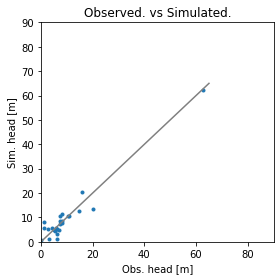

Error is - 2.86347966469679
Params are - [7.66525284e-01 1.56957779e+01 1.23761065e+01 5.43545889e-01
 9.69044478e-01 3.93420124e-01 2.19866032e-03 7.23400214e-01
 1.73892722e-01 3.61847543e-01 1.84607807e-03 3.88471241e+00]


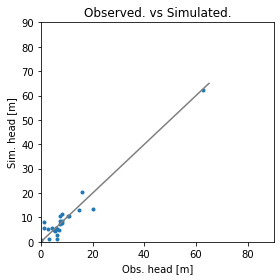

Error is - 2.8636089925512938
Params are - [7.67974331e-01 1.56074394e+01 1.28579362e+01 5.45663753e-01
 9.71915349e-01 4.08991542e-01 2.20790654e-03 7.23213576e-01
 1.71396145e-01 3.55069363e-01 1.82332429e-03 3.81283922e+00]


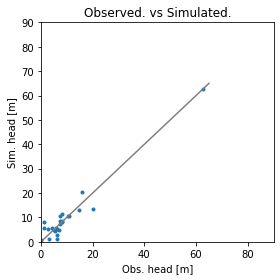

Error is - 2.863434983102653
Params are - [7.76698790e-01 1.56883301e+01 1.22629368e+01 5.51708570e-01
 9.68501569e-01 3.84536606e-01 2.19920516e-03 7.25994512e-01
 1.71435484e-01 3.59335609e-01 1.88387657e-03 3.82268937e+00]


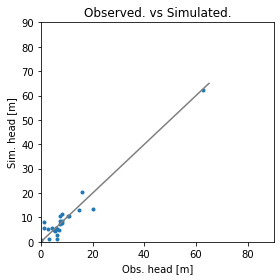

Error is - 2.8635942131002743
Params are - [7.54032696e-01 1.56699143e+01 1.26631274e+01 5.48754086e-01
 9.65919596e-01 4.01064650e-01 2.21811234e-03 7.24534911e-01
 1.71808624e-01 3.56602517e-01 1.88263290e-03 3.76101537e+00]


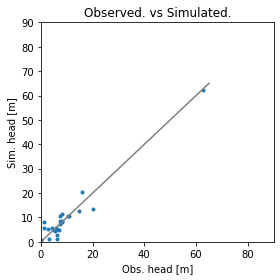

Error is - 2.863335814068425
Params are - [7.71004854e-01 1.55583409e+01 1.21933826e+01 5.51619739e-01
 9.78725231e-01 3.96592156e-01 2.19303582e-03 7.24094256e-01
 1.73163509e-01 3.55424963e-01 1.84878691e-03 3.88664094e+00]


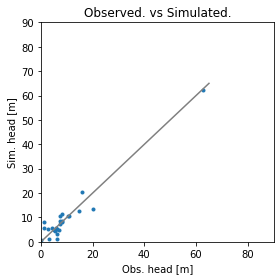

Error is - 2.86353391926855
Params are - [7.67770442e-01 1.57201482e+01 1.20146845e+01 5.46921297e-01
 9.71999860e-01 3.80392402e-01 2.19208845e-03 7.24721320e-01
 1.74884183e-01 3.58692994e-01 1.91575095e-03 3.86644072e+00]


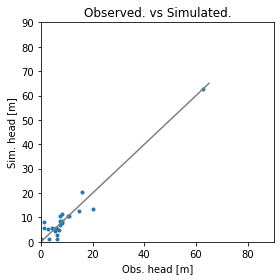

Error is - 2.863685821586059
Params are - [7.42301149e-01 1.57722549e+01 1.29888401e+01 5.25472709e-01
 9.91124014e-01 4.16089826e-01 2.17734178e-03 7.23739645e-01
 1.74952290e-01 3.51430696e-01 1.86931735e-03 3.87380532e+00]


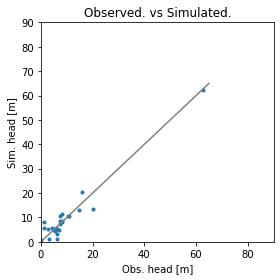

Error is - 2.8634342793793426
Params are - [7.77907307e-01 1.56272221e+01 1.21740709e+01 5.54539107e-01
 9.64432471e-01 3.84753575e-01 2.20805056e-03 7.24137714e-01
 1.72615116e-01 3.59216563e-01 1.87457558e-03 3.82908937e+00]


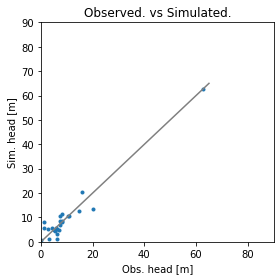

Error is - 2.8636991090346
Params are - [7.82023581e-01 1.56741031e+01 1.21466844e+01 5.41910700e-01
 9.80491853e-01 3.86614822e-01 2.17583929e-03 7.23408938e-01
 1.75114139e-01 3.57075705e-01 1.86166989e-03 3.93831968e+00]


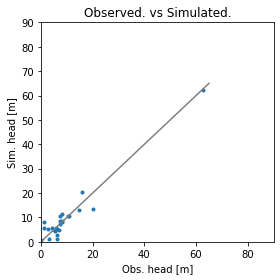

Error is - 2.8634249905454787
Params are - [7.61030417e-01 1.56709615e+01 1.25340167e+01 5.47043239e-01
 9.69562660e-01 3.97452193e-01 2.20754408e-03 7.24253418e-01
 1.72635003e-01 3.56720814e-01 1.87739215e-03 3.80534144e+00]


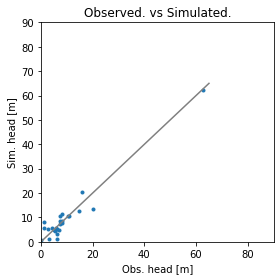

Error is - 2.863274215851564
Params are - [7.64400237e-01 1.56412190e+01 1.22392585e+01 5.47282161e-01
 9.70272207e-01 3.91734749e-01 2.20131749e-03 7.16433762e-01
 1.73622063e-01 3.62616159e-01 1.88098257e-03 3.89121359e+00]


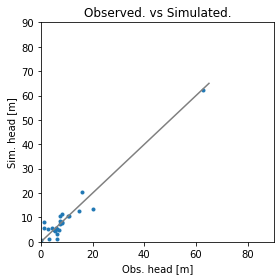

Error is - 2.863309716167294
Params are - [7.61531308e-01 1.56127033e+01 1.20762208e+01 5.48970457e-01
 9.67808446e-01 3.89522085e-01 2.20459416e-03 7.09413933e-01
 1.73830293e-01 3.67989010e-01 1.88880861e-03 3.93295824e+00]


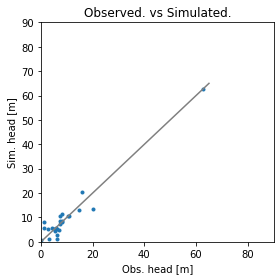

Error is - 2.8634726631509966
Params are - [7.62053923e-01 1.56883748e+01 1.27131936e+01 5.42654288e-01
 9.76753928e-01 4.22734012e-01 2.20060840e-03 7.18429340e-01
 1.72326015e-01 3.42381630e-01 1.86415390e-03 3.82447406e+00]


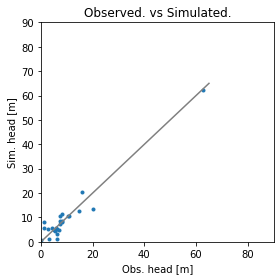

Error is - 2.8634862992654164
Params are - [7.56420077e-01 1.58258328e+01 1.19191378e+01 5.62888308e-01
 9.69174402e-01 3.70023063e-01 2.18983421e-03 7.24015369e-01
 1.75541701e-01 3.65499689e-01 1.89263395e-03 3.85912621e+00]


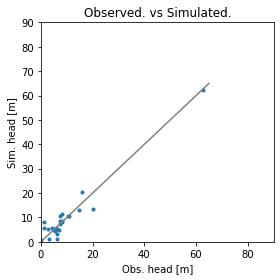

Error is - 2.863457500297504
Params are - [7.82563121e-01 1.55981973e+01 1.15285861e+01 5.60231442e-01
 9.59402810e-01 3.83536475e-01 2.20634215e-03 7.25442717e-01
 1.72588984e-01 3.62569670e-01 1.88171455e-03 3.91639450e+00]


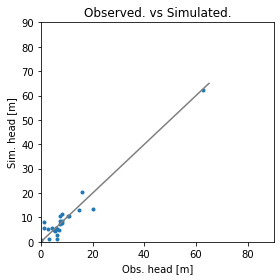

Error is - 2.8634230420086686
Params are - [7.67052772e-01 1.56314360e+01 1.25094787e+01 5.52672917e-01
 9.69178045e-01 4.06505873e-01 2.20630522e-03 7.20859983e-01
 1.71782129e-01 3.56575402e-01 1.83005358e-03 3.85164313e+00]


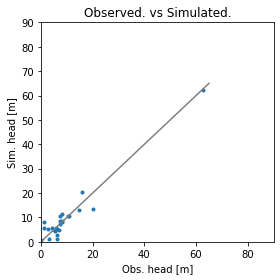

Error is - 2.863194778157769
Params are - [7.71179972e-01 1.56658105e+01 1.21434861e+01 5.58715689e-01
 9.69092815e-01 3.83674732e-01 2.20619741e-03 7.22446447e-01
 1.72091058e-01 3.61017306e-01 1.86421629e-03 3.87607538e+00]


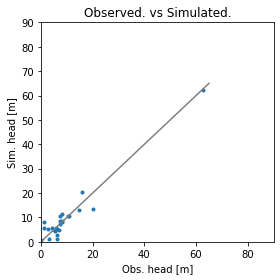

Error is - 2.863169967929776
Params are - [7.74704799e-01 1.56597101e+01 1.20156906e+01 5.66791815e-01
 9.67804324e-01 3.73665874e-01 2.21219020e-03 7.22264733e-01
 1.71048469e-01 3.64234393e-01 1.85921136e-03 3.89242065e+00]


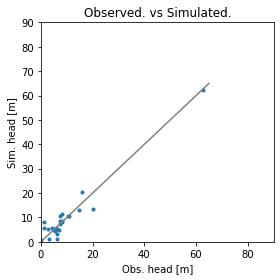

Error is - 2.8634705219010326
Params are - [7.92521895e-01 1.56817210e+01 1.16163419e+01 5.73828502e-01
 9.57056885e-01 3.75798012e-01 2.21524718e-03 7.21734923e-01
 1.71385048e-01 3.62510085e-01 1.84416070e-03 3.81019384e+00]


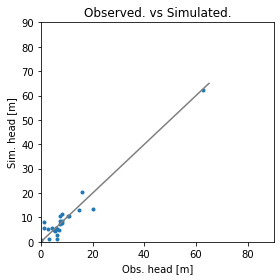

Error is - 2.8636325076486724
Params are - [7.89466668e-01 1.54936287e+01 1.24428838e+01 5.45834355e-01
 9.67296995e-01 4.12891851e-01 2.21867168e-03 7.20681354e-01
 1.69485135e-01 3.51194490e-01 1.83271956e-03 3.84977209e+00]


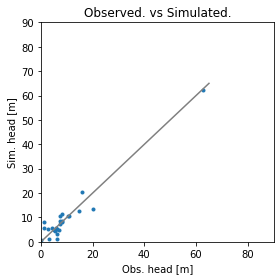

Error is - 2.86332617781924
Params are - [7.64681725e-01 1.57427818e+01 1.20500743e+01 5.58624820e-01
 9.68705050e-01 3.80740260e-01 2.19704358e-03 7.23181865e-01
 1.74027560e-01 3.61923389e-01 1.87765535e-03 3.85678768e+00]


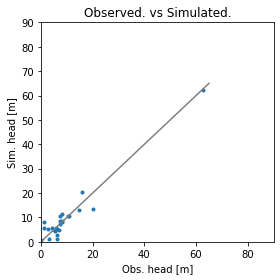

Error is - 2.863261760044803
Params are - [7.79054202e-01 1.56315176e+01 1.19315764e+01 5.67689929e-01
 9.67370347e-01 3.87381480e-01 2.20957611e-03 7.21260117e-01
 1.71156587e-01 3.54859277e-01 1.88453832e-03 3.81953177e+00]


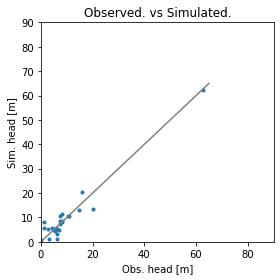

Error is - 2.8634770224383987
Params are - [7.86358942e-01 1.56294445e+01 1.14642198e+01 5.72754137e-01
 9.58096967e-01 3.52175503e-01 2.20912266e-03 7.26702788e-01
 1.72528390e-01 3.76404797e-01 1.86985989e-03 3.87894640e+00]


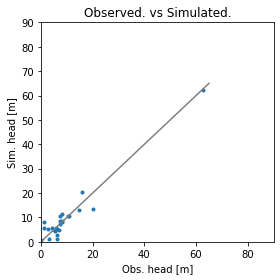

Error is - 2.8633044908697984
Params are - [7.68130178e-01 1.56736422e+01 1.24009501e+01 5.50179250e-01
 9.72089688e-01 4.05094385e-01 2.20273696e-03 7.20497702e-01
 1.72376608e-01 3.50887422e-01 1.86558040e-03 3.83809215e+00]


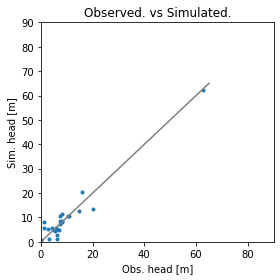

Error is - 2.8634039989971383
Params are - [7.51825684e-01 1.56347519e+01 1.26918395e+01 5.37638381e-01
 9.80299478e-01 4.03994232e-01 2.19239884e-03 7.23191001e-01
 1.73634616e-01 3.54339232e-01 1.89342304e-03 3.89787634e+00]


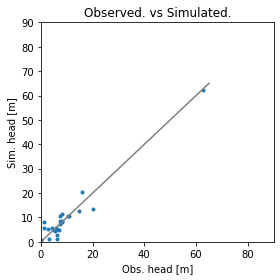

Error is - 2.8633978819497448
Params are - [7.56661552e-01 1.57243680e+01 1.29734709e+01 5.47469930e-01
 9.81436331e-01 3.99665395e-01 2.19897999e-03 7.19107921e-01
 1.72604952e-01 3.52907907e-01 1.85782060e-03 3.78858932e+00]


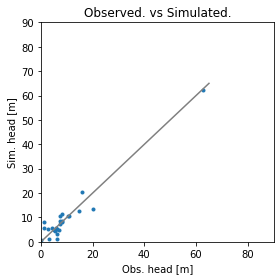

Error is - 2.863349544822344
Params are - [7.59186343e-01 1.56402415e+01 1.23575426e+01 5.55286363e-01
 9.74493366e-01 4.01186729e-01 2.20607944e-03 7.17408361e-01
 1.73953363e-01 3.55070684e-01 1.85131592e-03 3.87661111e+00]


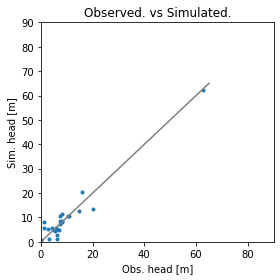

Error is - 2.863161693290483
Params are - [7.54857665e-01 1.57035194e+01 1.24769871e+01 5.52580368e-01
 9.80239280e-01 4.03708619e-01 2.19690553e-03 7.18143600e-01
 1.72996773e-01 3.54498751e-01 1.85674030e-03 3.87813140e+00]


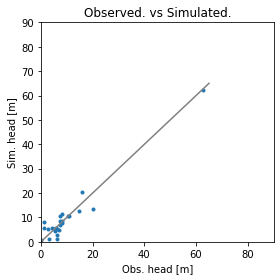

Error is - 2.863193174161468
Params are - [7.43332844e-01 1.57416681e+01 1.26284451e+01 5.51600998e-01
 9.88142684e-01 4.13186140e-01 2.19133302e-03 7.15146544e-01
 1.73187602e-01 3.52139845e-01 1.84782266e-03 3.90265241e+00]


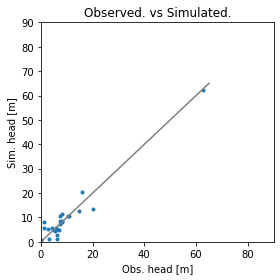

Error is - 2.863102331968075
Params are - [7.70705763e-01 1.56652064e+01 1.21075363e+01 5.60999091e-01
 9.76888527e-01 3.92052738e-01 2.19563892e-03 7.17009593e-01
 1.73037181e-01 3.56624156e-01 1.85048176e-03 3.91401098e+00]


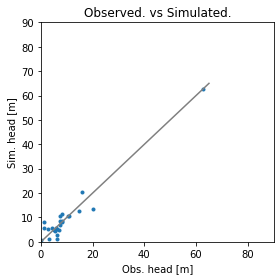

Error is - 2.8630673680837977
Params are - [7.75543435e-01 1.56623288e+01 1.18942962e+01 5.67977016e-01
 9.80551460e-01 3.89353011e-01 2.18968634e-03 7.13387681e-01
 1.73238270e-01 3.56575827e-01 1.83702657e-03 3.96834575e+00]


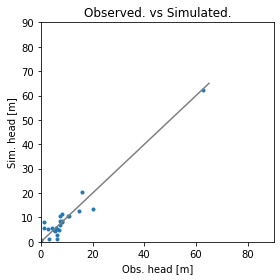

Error is - 2.8632493400850554
Params are - [7.66098519e-01 1.57098806e+01 1.20295439e+01 5.57920096e-01
 9.79168711e-01 3.80140248e-01 2.19410796e-03 7.19157645e-01
 1.74132745e-01 3.56769639e-01 1.89898249e-03 3.88715974e+00]


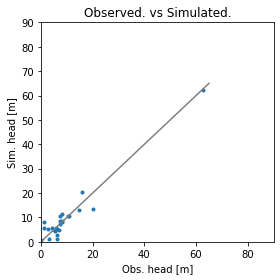

Error is - 2.863213106749281
Params are - [7.83704412e-01 1.57190863e+01 1.17368005e+01 5.76334918e-01
 9.67858817e-01 3.78676225e-01 2.20829919e-03 7.16154400e-01
 1.72363279e-01 3.59410876e-01 1.83653961e-03 3.83914042e+00]


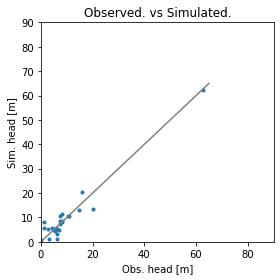

Error is - 2.8632360965126167
Params are - [7.83375688e-01 1.56285898e+01 1.12490574e+01 5.71314200e-01
 9.64459045e-01 3.79506867e-01 2.20327125e-03 7.19745227e-01
 1.73352665e-01 3.61926030e-01 1.86859521e-03 3.95685262e+00]


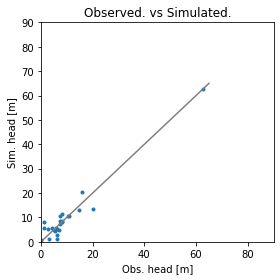

Error is - 2.8632517085836278
Params are - [7.84882455e-01 1.57107743e+01 1.16802382e+01 5.66169074e-01
 9.69729623e-01 3.74372223e-01 2.19570376e-03 7.21834265e-01
 1.71904137e-01 3.60905810e-01 1.87797978e-03 3.88220442e+00]


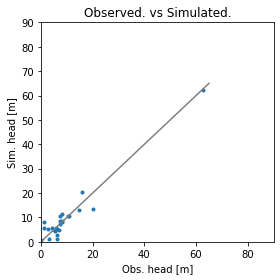

Error is - 2.863086356528569
Params are - [7.75376877e-01 1.58180805e+01 1.17588740e+01 5.72260586e-01
 9.63998490e-01 3.75263474e-01 2.20919205e-03 7.14771705e-01
 1.72484096e-01 3.61465006e-01 1.88537426e-03 3.87143518e+00]


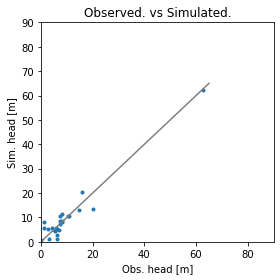

Error is - 2.863033151366132
Params are - [7.83482531e-01 1.56461894e+01 1.18536490e+01 5.67528134e-01
 9.73234244e-01 3.90202572e-01 2.20720903e-03 7.14282402e-01
 1.71362801e-01 3.54890182e-01 1.85779231e-03 3.90372968e+00]


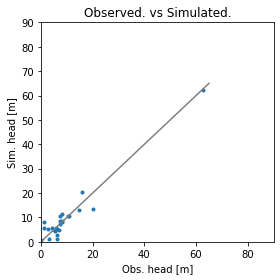

Error is - 2.8630682953219195
Params are - [7.92882935e-01 1.55978932e+01 1.17554363e+01 5.71979791e-01
 9.75498841e-01 3.94933728e-01 2.21229175e-03 7.09832670e-01
 1.70030422e-01 3.51373579e-01 1.84786079e-03 3.92720068e+00]


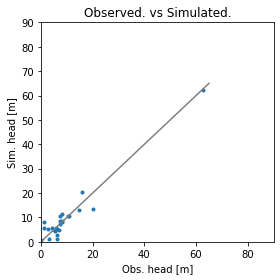

Error is - 2.8629120153309238
Params are - [7.70078096e-01 1.55919444e+01 1.18687534e+01 5.66919618e-01
 9.74702265e-01 3.84756784e-01 2.20250385e-03 7.15187440e-01
 1.71339942e-01 3.59774321e-01 1.87375544e-03 3.93279974e+00]


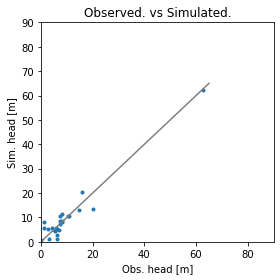

Error is - 2.86283748535481
Params are - [7.65688608e-01 1.55001772e+01 1.17985967e+01 5.70170273e-01
 9.78006510e-01 3.83755257e-01 2.20249137e-03 7.12213777e-01
 1.70176675e-01 3.61295361e-01 1.88006561e-03 3.97991137e+00]


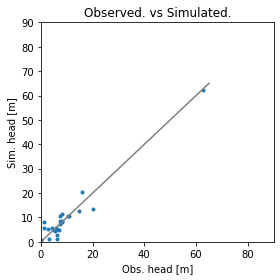

Error is - 2.862921794415385
Params are - [7.80398060e-01 1.56648699e+01 1.13764779e+01 5.80490511e-01
 9.71692488e-01 3.62865715e-01 2.20225475e-03 7.14443850e-01
 1.72263152e-01 3.67353796e-01 1.87172433e-03 3.95692062e+00]


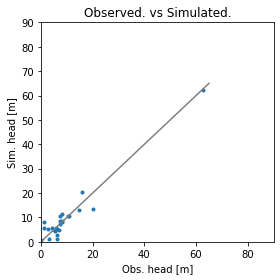

Error is - 2.8631192999791217
Params are - [7.86794305e-01 1.57012350e+01 1.13943728e+01 5.88922325e-01
 9.73746683e-01 3.71413845e-01 2.20383044e-03 7.18176139e-01
 1.70791212e-01 3.56414666e-01 1.85477912e-03 3.91475034e+00]


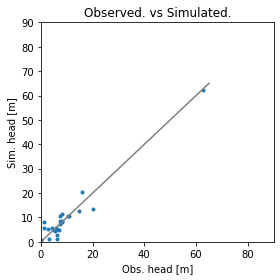

Error is - 2.8629260603141073
Params are - [7.73430358e-01 1.57225560e+01 1.16125209e+01 5.72053291e-01
 9.77711265e-01 3.73105841e-01 2.19461420e-03 7.12835787e-01
 1.73195792e-01 3.64430779e-01 1.84626351e-03 4.00230193e+00]


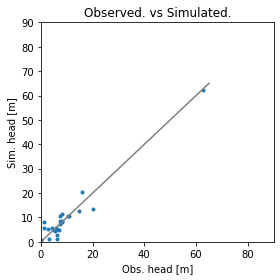

Error is - 2.863049159384857
Params are - [7.65693422e-01 1.56452629e+01 1.18525730e+01 5.74554849e-01
 9.76682263e-01 3.85904035e-01 2.20830496e-03 7.10761893e-01
 1.72663518e-01 3.58971741e-01 1.84753600e-03 3.95964553e+00]


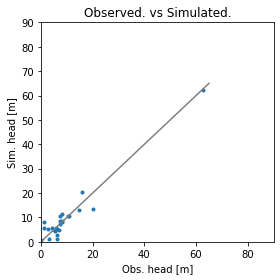

Error is - 2.8630225001886327
Params are - [7.84409841e-01 1.56353869e+01 1.14737721e+01 5.85576285e-01
 9.66828767e-01 3.81096641e-01 2.21226692e-03 7.12039221e-01
 1.70190039e-01 3.63474929e-01 1.81795888e-03 3.96677118e+00]


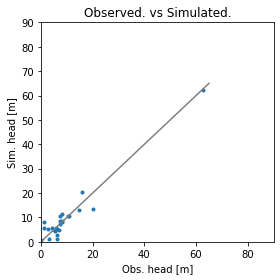

Error is - 2.863016659670242
Params are - [7.67305031e-01 1.57178106e+01 1.22917111e+01 5.74559195e-01
 9.81933387e-01 3.81994984e-01 2.20460291e-03 7.10167304e-01
 1.70443015e-01 3.58576688e-01 1.83990676e-03 3.89873139e+00]


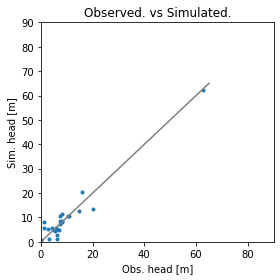

Error is - 2.862788156675726
Params are - [7.64243077e-01 1.56271015e+01 1.18964531e+01 5.69242523e-01
 9.80879377e-01 3.83378753e-01 2.19895892e-03 7.12760282e-01
 1.71112356e-01 3.60952810e-01 1.87252356e-03 4.02637541e+00]


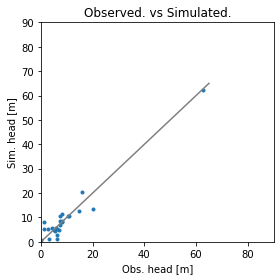

Error is - 2.8628390171725955
Params are - [7.54512409e-01 1.55811092e+01 1.19762794e+01 5.65696325e-01
 9.87389656e-01 3.85730017e-01 2.19428879e-03 7.11063223e-01
 1.70486894e-01 3.61723777e-01 1.89051554e-03 4.11999291e+00]


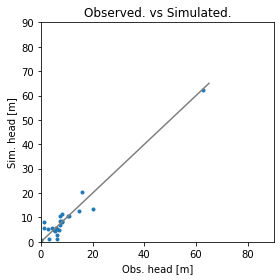

Error is - 2.8627850361344063
Params are - [7.71499069e-01 1.56810429e+01 1.15976901e+01 5.79194078e-01
 9.83113045e-01 3.90007918e-01 2.19286270e-03 7.05065874e-01
 1.72437814e-01 3.55582363e-01 1.85207051e-03 3.99542098e+00]


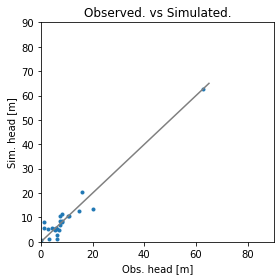

Error is - 2.8628004811750865
Params are - [7.69896204e-01 1.56917093e+01 1.13886898e+01 5.85395210e-01
 9.90767406e-01 3.98178940e-01 2.18319895e-03 6.96466445e-01
 1.73132487e-01 3.51256349e-01 1.84850008e-03 4.04692114e+00]


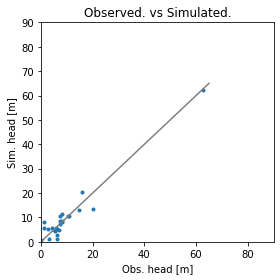

Error is - 2.862856016313437
Params are - [7.94119771e-01 1.56334875e+01 1.09898441e+01 5.97841143e-01
 9.71157050e-01 3.57681723e-01 2.20747357e-03 7.07007386e-01
 1.70396350e-01 3.65498607e-01 1.85376327e-03 4.02925850e+00]


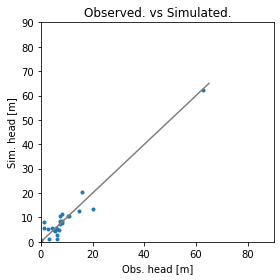

Error is - 2.8628789849031397
Params are - [7.63404041e-01 1.56244807e+01 1.20050369e+01 5.62985655e-01
 9.77218042e-01 3.87687809e-01 2.20115585e-03 7.05113388e-01
 1.72536101e-01 3.65096683e-01 1.85555515e-03 4.01172425e+00]


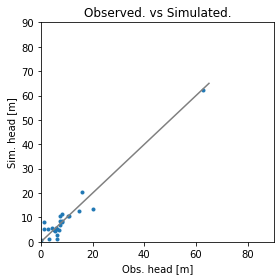

Error is - 2.862996483396099
Params are - [7.72825997e-01 1.54753685e+01 1.16815628e+01 5.78101572e-01
 9.89169493e-01 3.85908903e-01 2.19445487e-03 7.06908103e-01
 1.70851885e-01 3.60651622e-01 1.81999015e-03 4.07842092e+00]


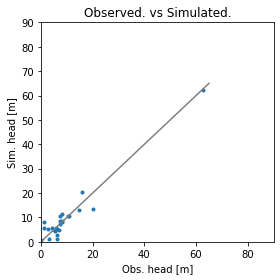

Error is - 2.862830657771255
Params are - [7.72206532e-01 1.55999602e+01 1.15106851e+01 5.84072569e-01
 9.74052862e-01 3.71245347e-01 2.21475534e-03 7.07212197e-01
 1.69699980e-01 3.66220100e-01 1.86549844e-03 3.99985621e+00]


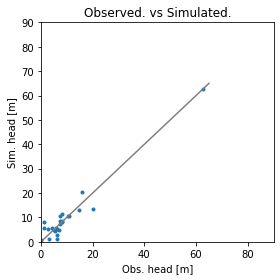

Error is - 2.8628544940593987
Params are - [7.83142064e-01 1.56094757e+01 1.14954270e+01 5.79081023e-01
 9.77483826e-01 3.72251209e-01 2.19721178e-03 7.09246369e-01
 1.69780809e-01 3.65032246e-01 1.85798274e-03 4.01525821e+00]


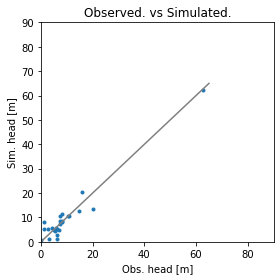

Error is - 2.8627350147059225
Params are - [7.65296210e-01 1.56024302e+01 1.14346473e+01 5.88033219e-01
 9.81640108e-01 3.64960778e-01 2.19664150e-03 7.04886521e-01
 1.70817860e-01 3.70804149e-01 1.84775818e-03 4.08976215e+00]


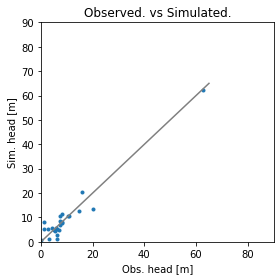

Error is - 2.8628136440088707
Params are - [7.56203049e-01 1.55805506e+01 1.12251465e+01 5.98285762e-01
 9.85843040e-01 3.52339882e-01 2.19135774e-03 7.00188581e-01
 1.70545389e-01 3.78761132e-01 1.84274111e-03 4.18277838e+00]


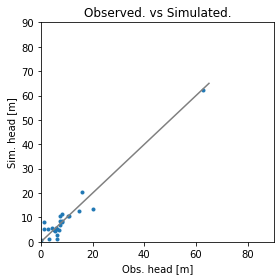

Error is - 2.8628660280744445
Params are - [7.61183295e-01 1.56077400e+01 1.18080034e+01 5.70394557e-01
 9.90514142e-01 3.71377398e-01 2.18897937e-03 7.05937585e-01
 1.72095260e-01 3.63440938e-01 1.89255816e-03 4.04721914e+00]


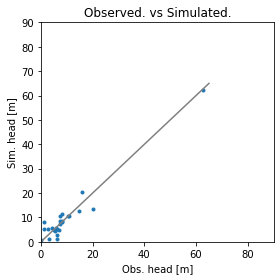

Error is - 2.862815383266016
Params are - [7.77267816e-01 1.55069711e+01 1.09094465e+01 5.80717541e-01
 9.76839648e-01 3.68709457e-01 2.19403946e-03 7.07104549e-01
 1.72117657e-01 3.69149888e-01 1.87938550e-03 4.14000689e+00]


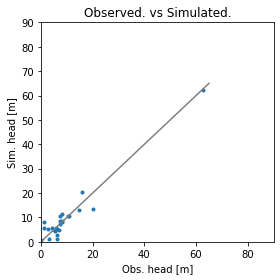

Error is - 2.862846365027203
Params are - [7.72487153e-01 1.57546803e+01 1.13909087e+01 5.77611158e-01
 9.67548567e-01 3.61928965e-01 2.20411826e-03 7.10396492e-01
 1.71919749e-01 3.68491331e-01 1.90920135e-03 3.97058169e+00]


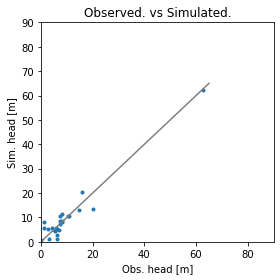

Error is - 2.862671088816305
Params are - [7.71725592e-01 1.55128469e+01 1.14230152e+01 5.84585751e-01
 9.77313012e-01 3.72869213e-01 2.20554295e-03 7.04062258e-01
 1.69363168e-01 3.65388933e-01 1.89341762e-03 4.04141397e+00]


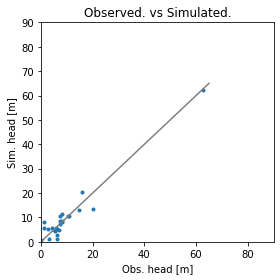

Error is - 2.8627612696801794
Params are - [7.70873208e-01 1.54079924e+01 1.13282623e+01 5.90851981e-01
 9.77113886e-01 3.72750899e-01 2.21100732e-03 6.99675494e-01
 1.67446856e-01 3.65868009e-01 1.91699468e-03 4.06096999e+00]


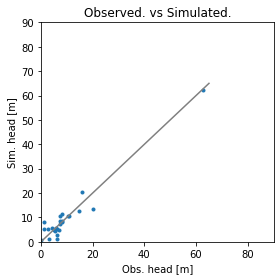

Error is - 2.862635965518818
Params are - [7.63312478e-01 1.55451958e+01 1.16668144e+01 5.76831070e-01
 9.84268543e-01 3.84776590e-01 2.19845043e-03 7.00723929e-01
 1.69812478e-01 3.62138438e-01 1.87157235e-03 4.10087751e+00]


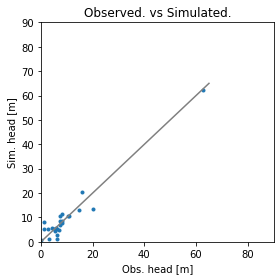

Error is - 2.8627364036064855
Params are - [7.54769687e-01 1.54853587e+01 1.18119826e+01 5.75001350e-01
 9.90556570e-01 3.95732027e-01 2.19654826e-03 6.93863969e-01
 1.68587142e-01 3.59530760e-01 1.87149635e-03 4.17285595e+00]


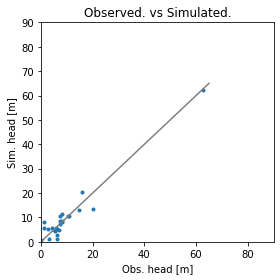

Error is - 2.86288014928071
Params are - [7.80291236e-01 1.55723709e+01 1.09818850e+01 5.96643496e-01
 9.79918073e-01 3.59469293e-01 2.19909843e-03 7.09322815e-01
 1.69085592e-01 3.63902512e-01 1.89041107e-03 4.06093276e+00]


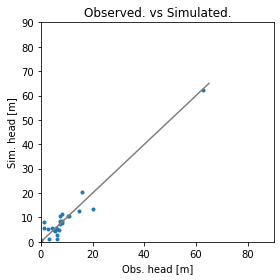

Error is - 2.8627336571513418
Params are - [7.67625840e-01 1.56114532e+01 1.17492489e+01 5.71400115e-01
 9.77893050e-01 3.80633180e-01 2.20064149e-03 7.06165745e-01
 1.71673474e-01 3.64798140e-01 1.86426913e-03 4.02402637e+00]


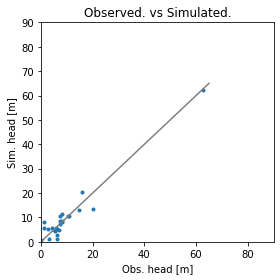

Error is - 2.8628713806504207
Params are - [7.83585740e-01 1.55897305e+01 1.11691261e+01 5.89402187e-01
 9.64518458e-01 3.77322333e-01 2.21321859e-03 7.08536645e-01
 1.69456136e-01 3.65784456e-01 1.84869322e-03 4.02157240e+00]


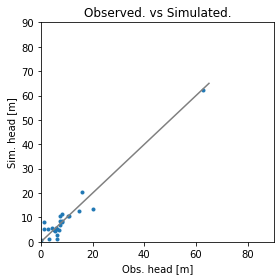

Error is - 2.862738067183944
Params are - [7.66783906e-01 1.56032376e+01 1.16482841e+01 5.75146464e-01
 9.84015221e-01 3.72863632e-01 2.19503918e-03 7.06587350e-01
 1.71435479e-01 3.64026818e-01 1.88159192e-03 4.04080746e+00]


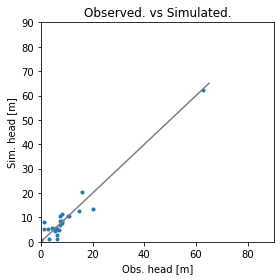

Error is - 2.8629023440277823
Params are - [7.46093287e-01 1.55589413e+01 1.20970254e+01 5.58173154e-01
 9.86018578e-01 3.93548327e-01 2.19265200e-03 7.07396838e-01
 1.71328233e-01 3.63481489e-01 1.89212621e-03 4.04145787e+00]


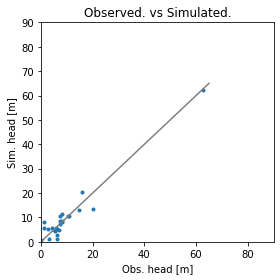

Error is - 2.8627189392732113
Params are - [7.82113150e-01 1.56148510e+01 1.12666394e+01 5.87924146e-01
 9.74872432e-01 3.66648374e-01 2.20376817e-03 7.07104749e-01
 1.70629321e-01 3.64994328e-01 1.86335401e-03 4.03230834e+00]


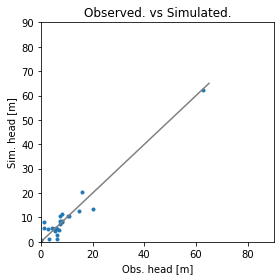

Error is - 2.8627752684273697
Params are - [7.56899507e-01 1.55838490e+01 1.15533113e+01 5.78407128e-01
 9.79256570e-01 3.78045035e-01 2.20400651e-03 7.04800918e-01
 1.72085193e-01 3.63941530e-01 1.88880195e-03 4.05829985e+00]


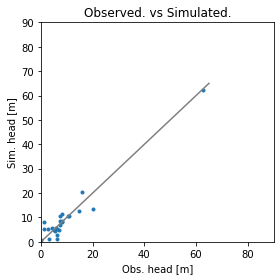

Error is - 2.8629487377699125
Params are - [7.64956478e-01 1.54101725e+01 1.16848966e+01 5.80009655e-01
 9.91143162e-01 3.91053291e-01 2.19708141e-03 7.02718200e-01
 1.69973827e-01 3.59724145e-01 1.83418345e-03 4.11759607e+00]


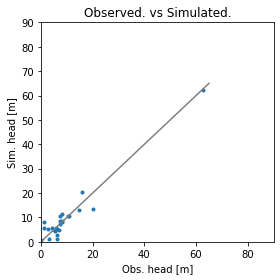

Error is - 2.8627200827936616
Params are - [7.70604484e-01 1.56685533e+01 1.14644057e+01 5.78210782e-01
 9.73447216e-01 3.69210046e-01 2.20235905e-03 7.08476919e-01
 1.71433269e-01 3.66299535e-01 1.89044687e-03 4.00733528e+00]


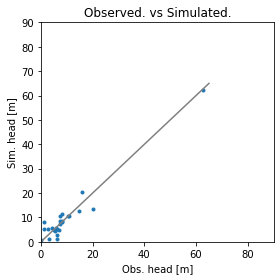

Error is - 2.862592427479336
Params are - [7.72574335e-01 1.56927383e+01 1.12215101e+01 5.88790625e-01
 9.79925337e-01 3.66802797e-01 2.19868625e-03 7.00278105e-01
 1.71926333e-01 3.67754145e-01 1.86504940e-03 4.11283703e+00]


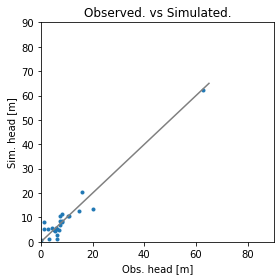

Error is - 2.86261995334854
Params are - [7.76017199e-01 1.57890188e+01 1.09329668e+01 5.98100801e-01
 9.80884751e-01 3.58326566e-01 2.19678368e-03 6.94310269e-01
 1.72801161e-01 3.70983537e-01 1.85754129e-03 4.17929986e+00]


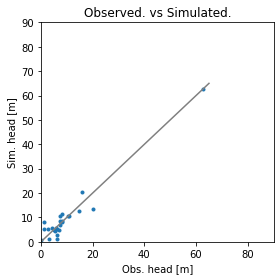

Error is - 2.862782269671129
Params are - [7.66117712e-01 1.56084182e+01 1.14612259e+01 5.75674672e-01
 9.84857731e-01 3.78572282e-01 2.18374410e-03 7.04124003e-01
 1.72774087e-01 3.63085079e-01 1.87954173e-03 4.11172233e+00]


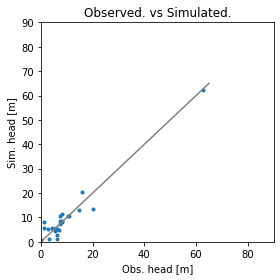

Error is - 2.862748792172057
Params are - [7.59198077e-01 1.57183152e+01 1.21544278e+01 5.78189222e-01
 9.83407292e-01 3.82751975e-01 2.20274408e-03 7.03734893e-01
 1.70465815e-01 3.59144490e-01 1.86568070e-03 3.96685755e+00]


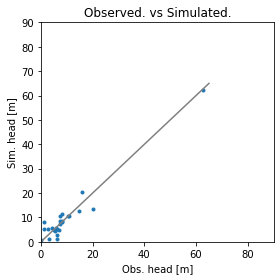

Error is - 2.862523145450561
Params are - [7.71381983e-01 1.56133871e+01 1.12104169e+01 5.91155356e-01
 9.79788883e-01 3.67978217e-01 2.19845548e-03 6.96574929e-01
 1.71363359e-01 3.67040181e-01 1.87140216e-03 4.07056939e+00]


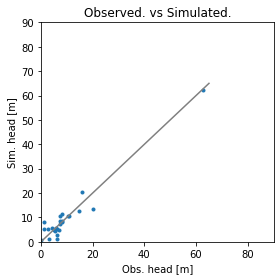

Error is - 2.8624696970240215
Params are - [7.74951437e-01 1.56065298e+01 1.08673989e+01 6.02111773e-01
 9.79243637e-01 3.60277949e-01 2.19820376e-03 6.88482252e-01
 1.71488861e-01 3.70083867e-01 1.87084146e-03 4.09266638e+00]


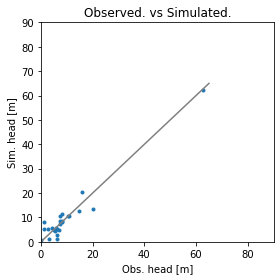

Error is - 2.8626455140825615
Params are - [7.64701386e-01 1.55470268e+01 1.13874647e+01 5.85023417e-01
 9.76910313e-01 3.56394058e-01 2.20544188e-03 7.01505400e-01
 1.69879742e-01 3.74827545e-01 1.89498371e-03 4.11773139e+00]


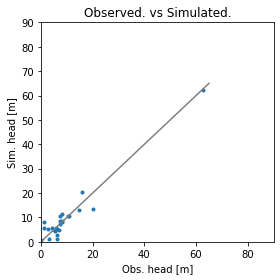

Error is - 2.8628144099455426
Params are - [7.69846688e-01 1.56094196e+01 1.15116354e+01 5.90100947e-01
 9.73841057e-01 3.64133323e-01 2.21817677e-03 7.02010837e-01
 1.69061078e-01 3.69281907e-01 1.87008615e-03 4.00243155e+00]


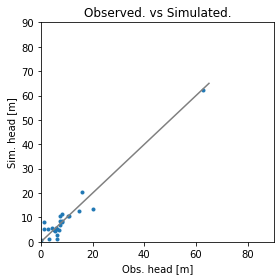

Error is - 2.8626497229150125
Params are - [7.67049956e-01 1.56086686e+01 1.14738283e+01 5.79281241e-01
 9.82103563e-01 3.74962542e-01 2.19235227e-03 7.03595712e-01
 1.71845835e-01 3.64634286e-01 1.87717783e-03 4.08439964e+00]


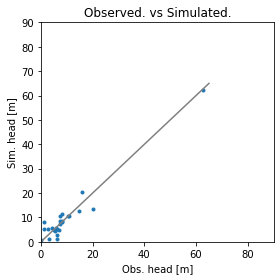

Error is - 2.8626812702594733
Params are - [7.80756634e-01 1.56381255e+01 1.14063029e+01 5.87514176e-01
 9.79916717e-01 3.64146821e-01 2.19597198e-03 7.01133054e-01
 1.69710079e-01 3.68540915e-01 1.85888858e-03 4.06020400e+00]


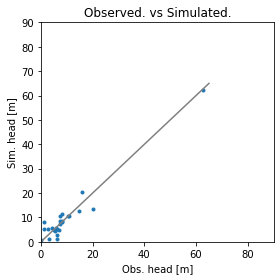

Error is - 2.8627654035695147
Params are - [7.82051158e-01 1.54902943e+01 1.06804989e+01 5.89286242e-01
 9.75184232e-01 3.56339021e-01 2.19610573e-03 7.01765439e-01
 1.71203502e-01 3.74904026e-01 1.88087781e-03 4.16720403e+00]


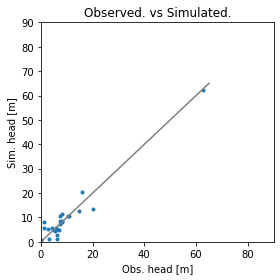

Error is - 2.862636663922613
Params are - [7.64911347e-01 1.56613100e+01 1.17859455e+01 5.80963477e-01
 9.81351527e-01 3.76148737e-01 2.20108449e-03 7.03242530e-01
 1.70650236e-01 3.63084374e-01 1.86947998e-03 4.01694417e+00]


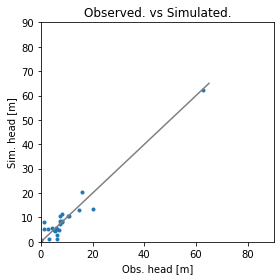

Error is - 2.862528150406905
Params are - [7.74153235e-01 1.56150507e+01 1.12095862e+01 5.93298501e-01
 9.74132355e-01 3.66774882e-01 2.20481819e-03 6.98355512e-01
 1.70102964e-01 3.69864625e-01 1.86294793e-03 4.08927692e+00]


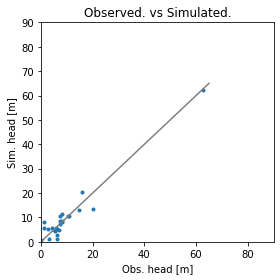

Error is - 2.862580929682414
Params are - [7.77117102e-01 1.56179614e+01 1.13857127e+01 5.81289293e-01
 9.75256176e-01 3.74980086e-01 2.20457865e-03 6.98967840e-01
 1.70601433e-01 3.62930706e-01 1.89931330e-03 4.04024135e+00]


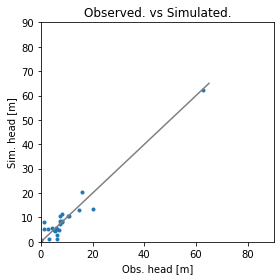

Error is - 2.86252444822147
Params are - [7.76369349e-01 1.56100231e+01 1.10105217e+01 5.99570593e-01
 9.78563755e-01 3.58365503e-01 2.20123485e-03 6.96488965e-01
 1.69567146e-01 3.68625476e-01 1.88864305e-03 4.10867962e+00]


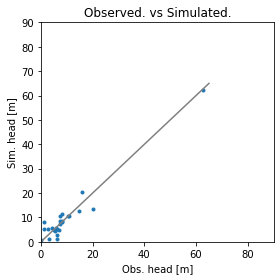

Error is - 2.862544783719493
Params are - [7.74351516e-01 1.55431680e+01 1.12197177e+01 5.96319895e-01
 9.83862345e-01 3.67981212e-01 2.19932993e-03 6.92179799e-01
 1.69496331e-01 3.67511738e-01 1.86216466e-03 4.14226144e+00]


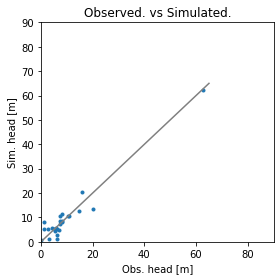

Error is - 2.8624713760538323
Params are - [7.61549245e-01 1.55849232e+01 1.14096636e+01 5.88005822e-01
 9.83935448e-01 3.70765024e-01 2.19718110e-03 6.91064477e-01
 1.70111447e-01 3.69236514e-01 1.88905930e-03 4.13561389e+00]


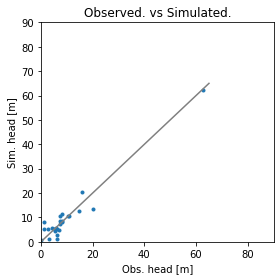

Error is - 2.862590259565087
Params are - [7.59704529e-01 1.55527816e+01 1.12705603e+01 5.88497734e-01
 9.79560952e-01 3.74369612e-01 2.20517880e-03 6.95358076e-01
 1.71097583e-01 3.65805859e-01 1.89855319e-03 4.12028656e+00]


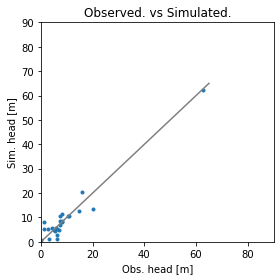

Error is - 2.862440710624302
Params are - [7.66732061e-01 1.56847159e+01 1.12284388e+01 5.92078155e-01
 9.82539313e-01 3.65897285e-01 2.19554715e-03 6.90978174e-01
 1.71733563e-01 3.69027329e-01 1.86488007e-03 4.15222201e+00]


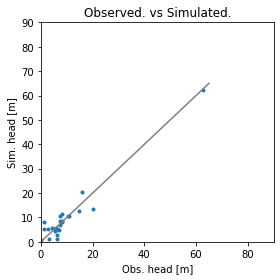

Error is - 2.862459137264784
Params are - [7.64235296e-01 1.57706505e+01 1.11311507e+01 5.95824357e-01
 9.85152463e-01 3.62411321e-01 2.19054925e-03 6.84436132e-01
 1.72918761e-01 3.70846528e-01 1.85061130e-03 4.20762603e+00]


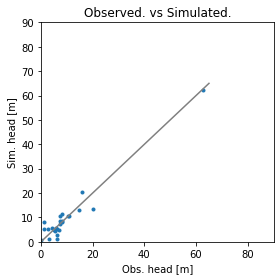

Error is - 2.8624389085337905
Params are - [7.71354714e-01 1.56015688e+01 1.11367275e+01 5.99515485e-01
 9.77821387e-01 3.62293080e-01 2.20927031e-03 6.89341798e-01
 1.69232185e-01 3.70514150e-01 1.87907023e-03 4.12054008e+00]


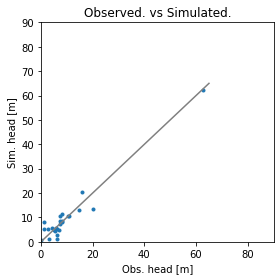

Error is - 2.8625072812029493
Params are - [7.73507093e-01 1.55980190e+01 1.09681771e+01 6.09632607e-01
 9.75680300e-01 3.55958349e-01 2.21772933e-03 6.82214841e-01
 1.67925359e-01 3.73454082e-01 1.88001643e-03 4.13861030e+00]


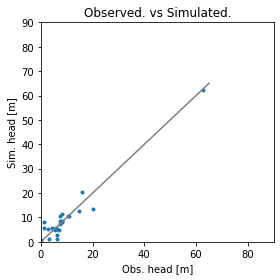

Error is - 2.8624620492754485
Params are - [7.74812172e-01 1.56723009e+01 1.11813015e+01 5.96188654e-01
 9.83166483e-01 3.81844735e-01 2.19681878e-03 6.89404843e-01
 1.71090351e-01 3.59601992e-01 1.85861211e-03 4.08767643e+00]


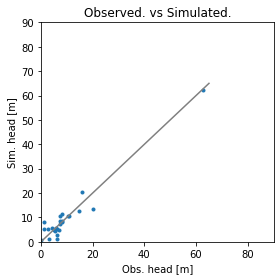

Error is - 2.8624204629259857
Params are - [7.76252348e-01 1.55598496e+01 1.06820467e+01 6.02786123e-01
 9.79027761e-01 3.63039389e-01 2.20046520e-03 6.85361432e-01
 1.70393209e-01 3.70764766e-01 1.88230453e-03 4.20025236e+00]


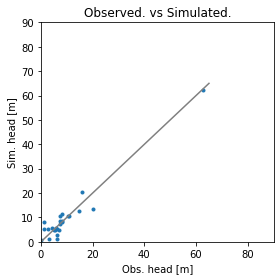

Error is - 2.862490241270634
Params are - [7.81922849e-01 1.55091194e+01 1.01300973e+01 6.13697447e-01
 9.77865878e-01 3.56484715e-01 2.20015556e-03 6.76420883e-01
 1.70264696e-01 3.74604962e-01 1.88871681e-03 4.29190646e+00]


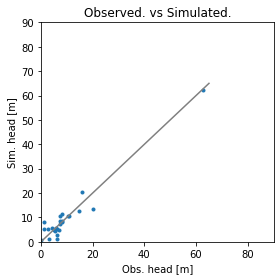

Error is - 2.8624661082222906
Params are - [7.80007863e-01 1.56784061e+01 1.06370499e+01 6.11244372e-01
 9.75237282e-01 3.50788669e-01 2.20343507e-03 6.85319616e-01
 1.71327756e-01 3.73148423e-01 1.88200086e-03 4.13288150e+00]


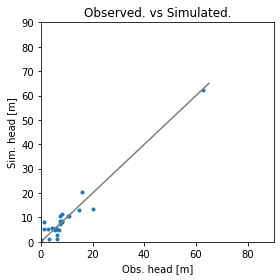

Error is - 2.862363455574786
Params are - [7.71984927e-01 1.55284749e+01 1.09849441e+01 6.03027108e-01
 9.78799145e-01 3.66093441e-01 2.20399072e-03 6.83272359e-01
 1.69114139e-01 3.68431763e-01 1.89134905e-03 4.12426273e+00]


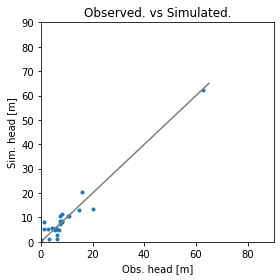

Error is - 2.8623774459666933
Params are - [7.71690222e-01 1.54463433e+01 1.08666611e+01 6.10145350e-01
 9.78236049e-01 3.65738763e-01 2.20664296e-03 6.74769486e-01
 1.67708042e-01 3.68770572e-01 1.90449888e-03 4.12997558e+00]


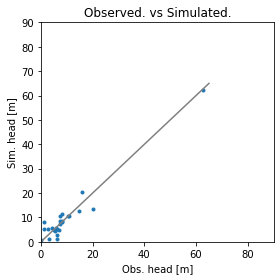

Error is - 2.8624660085847156
Params are - [7.86901466e-01 1.56643805e+01 1.08882913e+01 6.05741562e-01
 9.79036563e-01 3.57147264e-01 2.19730015e-03 6.86178103e-01
 1.69612314e-01 3.70817699e-01 1.85664457e-03 4.11747590e+00]


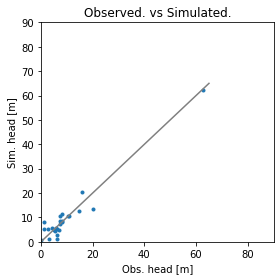

Error is - 2.8624886727729413
Params are - [7.71119620e-01 1.56069372e+01 1.06902353e+01 6.17025381e-01
 9.83971403e-01 3.53564653e-01 2.19668722e-03 6.80436715e-01
 1.69943611e-01 3.75007351e-01 1.84877301e-03 4.21039352e+00]


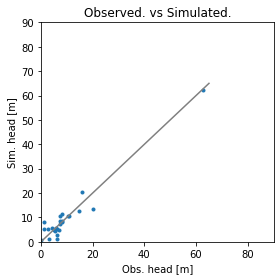

Error is - 2.862369046334715
Params are - [7.73346557e-01 1.56923588e+01 1.07679833e+01 6.05445694e-01
 9.75383410e-01 3.58160767e-01 2.20149549e-03 6.85267576e-01
 1.71123260e-01 3.71675587e-01 1.88368970e-03 4.11972879e+00]


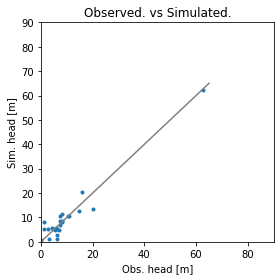

Error is - 2.862378423075595
Params are - [7.73410392e-01 1.56333608e+01 1.07045143e+01 6.10491620e-01
 9.85321909e-01 3.57931411e-01 2.19545344e-03 6.76910540e-01
 1.70686676e-01 3.69624528e-01 1.88636340e-03 4.17778862e+00]


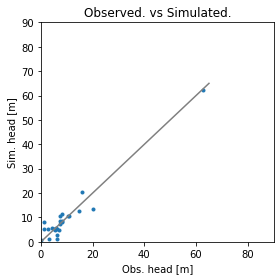

Error is - 2.862336258285748
Params are - [7.70701118e-01 1.56422780e+01 1.08525775e+01 6.06039698e-01
 9.82016868e-01 3.66268442e-01 2.19807321e-03 6.75514016e-01
 1.71409083e-01 3.71030185e-01 1.86028834e-03 4.16990408e+00]


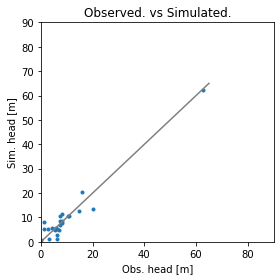

Error is - 2.862388598368438
Params are - [7.67867002e-01 1.56584054e+01 1.07736053e+01 6.09274251e-01
 9.83743425e-01 3.70219912e-01 2.19649239e-03 6.65026541e-01
 1.72330051e-01 3.72232540e-01 1.84611098e-03 4.20051631e+00]


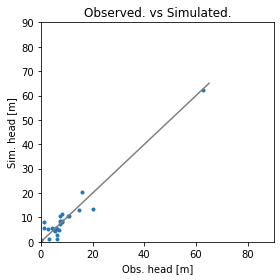

Error is - 2.8624760834427816
Params are - [7.75881097e-01 1.56512541e+01 1.11999210e+01 5.86753963e-01
 9.76283465e-01 3.73186590e-01 2.20285184e-03 6.90745816e-01
 1.71276863e-01 3.63985450e-01 1.90207760e-03 4.06144194e+00]


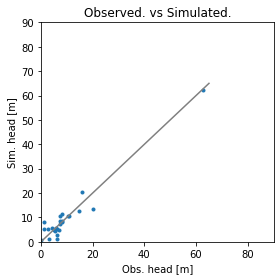

Error is - 2.862402888549027
Params are - [7.74690727e-01 1.56401749e+01 1.10724995e+01 5.94321818e-01
 9.78205449e-01 3.68281106e-01 2.20131069e-03 6.88168541e-01
 1.70943550e-01 3.66740925e-01 1.88875145e-03 4.09867984e+00]


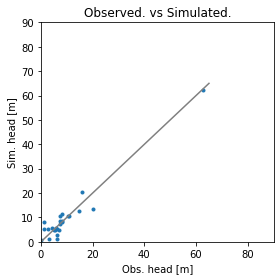

Error is - 2.8624766066146266
Params are - [7.87641719e-01 1.56824767e+01 1.04242986e+01 6.16826188e-01
 9.75364420e-01 3.55572232e-01 2.20304623e-03 6.79635398e-01
 1.71247711e-01 3.69340355e-01 1.86173999e-03 4.13006589e+00]


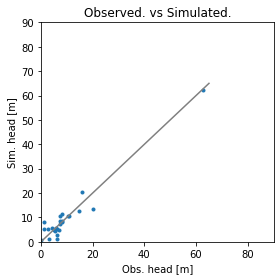

Error is - 2.862393183865174
Params are - [7.68072363e-01 1.56093116e+01 1.11633224e+01 5.95210914e-01
 9.81792691e-01 3.66966826e-01 2.19864738e-03 6.88207207e-01
 1.70395513e-01 3.69262474e-01 1.88222948e-03 4.13422689e+00]


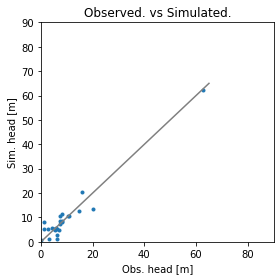

Error is - 2.862270977255577
Params are - [7.73093015e-01 1.56613337e+01 1.10158839e+01 6.01570094e-01
 9.80481073e-01 3.67174120e-01 2.20209751e-03 6.82171782e-01
 1.69688073e-01 3.68356103e-01 1.88185584e-03 4.17994016e+00]


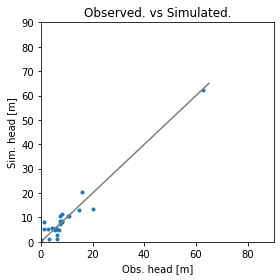

Error is - 2.862226713751998
Params are - [7.72163804e-01 1.56887356e+01 1.10901265e+01 6.01299255e-01
 9.81099792e-01 3.70622206e-01 2.20404438e-03 6.79016547e-01
 1.68787679e-01 3.67492222e-01 1.88736302e-03 4.22357705e+00]


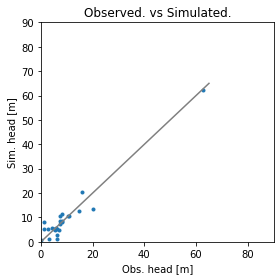

Error is - 2.8623942859783624
Params are - [7.66729245e-01 1.55911790e+01 1.13217457e+01 5.90779976e-01
 9.85464514e-01 3.79968990e-01 2.19696775e-03 6.84283906e-01
 1.69425831e-01 3.64348847e-01 1.87159013e-03 4.15484096e+00]


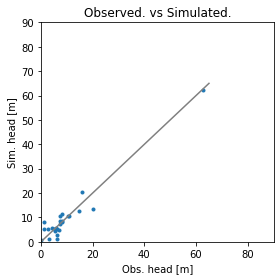

Error is - 2.8624396130982936
Params are - [7.56473605e-01 1.55930043e+01 1.11427467e+01 5.93789188e-01
 9.82736558e-01 3.77414015e-01 2.20304727e-03 6.83109721e-01
 1.71110192e-01 3.65601429e-01 1.89943735e-03 4.17647408e+00]


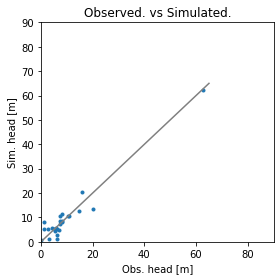

Error is - 2.8623794986873734
Params are - [7.65506471e-01 1.55718678e+01 1.08433106e+01 6.02942185e-01
 9.78534983e-01 3.51978091e-01 2.20456672e-03 6.78833793e-01
 1.69635462e-01 3.77817042e-01 1.90427401e-03 4.22107315e+00]


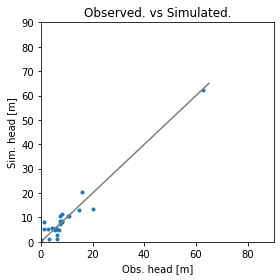

Error is - 2.8623383916911784
Params are - [7.73382318e-01 1.55406447e+01 1.07319853e+01 6.08863355e-01
 9.78494765e-01 3.65605676e-01 2.20734161e-03 6.75236398e-01
 1.68642567e-01 3.69856657e-01 1.90457171e-03 4.16800276e+00]


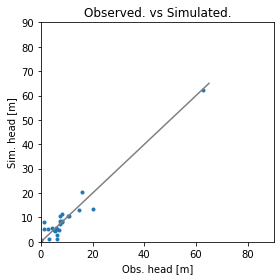

Error is - 2.8623963630935543
Params are - [7.86458892e-01 1.56236298e+01 1.07492172e+01 6.09664684e-01
 9.77590555e-01 3.52120889e-01 2.20055721e-03 6.81792631e-01
 1.68854667e-01 3.73991762e-01 1.87087016e-03 4.14233881e+00]


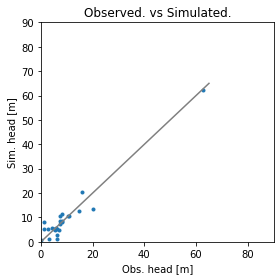

Error is - 2.862295414429453
Params are - [7.74095146e-01 1.56187421e+01 1.06906513e+01 6.05629920e-01
 9.82467253e-01 3.65546459e-01 2.19288199e-03 6.74302359e-01
 1.70669755e-01 3.69658643e-01 1.88987060e-03 4.20190593e+00]


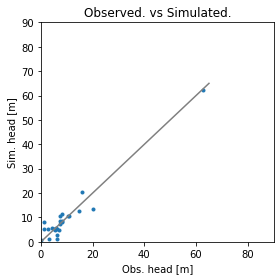

Error is - 2.862225822028022
Params are - [7.68837978e-01 1.56702767e+01 1.11467662e+01 6.02833248e-01
 9.81834128e-01 3.65217995e-01 2.20042323e-03 6.76439547e-01
 1.69554821e-01 3.69223674e-01 1.88789731e-03 4.12246924e+00]


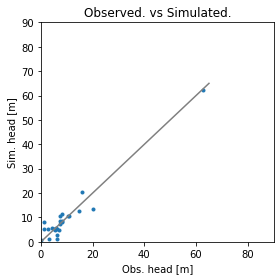

Error is - 2.86219000101827
Params are - [7.65130793e-01 1.57254903e+01 1.13791260e+01 6.02856810e-01
 9.83237312e-01 3.66307298e-01 2.20040224e-03 6.71978604e-01
 1.69135626e-01 3.68453128e-01 1.89069370e-03 4.08357767e+00]


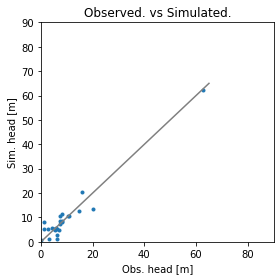

Error is - 2.86224781507824
Params are - [7.68806277e-01 1.56041707e+01 1.08074178e+01 6.12720052e-01
 9.83495084e-01 3.59647310e-01 2.19942633e-03 6.70934116e-01
 1.68703159e-01 3.73532881e-01 1.88177410e-03 4.22152474e+00]


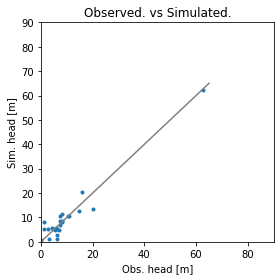

Error is - 2.8623186842183053
Params are - [7.54096009e-01 1.56174726e+01 1.11404003e+01 5.97886414e-01
 9.85094066e-01 3.77061931e-01 2.19999133e-03 6.75500272e-01
 1.70766792e-01 3.66205564e-01 1.90147271e-03 4.19106342e+00]


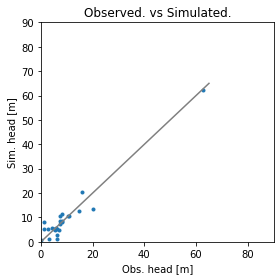

Error is - 2.8623225888303963
Params are - [7.71720117e-01 1.56543057e+01 1.05376476e+01 6.17955528e-01
 9.77158366e-01 3.48729320e-01 2.20408472e-03 6.71545058e-01
 1.70419121e-01 3.76157932e-01 1.90573317e-03 4.18459834e+00]


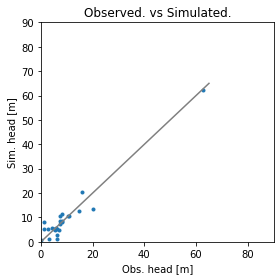

Error is - 2.8621843265383387
Params are - [7.70984958e-01 1.56436721e+01 1.05917917e+01 6.17315360e-01
 9.80057801e-01 3.58691899e-01 2.20331132e-03 6.64844732e-01
 1.69453374e-01 3.72393548e-01 1.89901111e-03 4.21360765e+00]


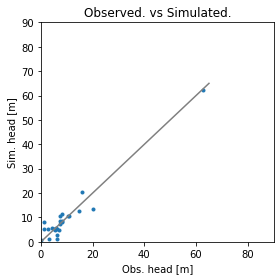

Error is - 2.862162963750589
Params are - [7.72441255e-01 1.56608524e+01 1.03060264e+01 6.28367583e-01
 9.79190357e-01 3.54554436e-01 2.20564329e-03 6.53163495e-01
 1.68982304e-01 3.73959085e-01 1.90740192e-03 4.25329803e+00]


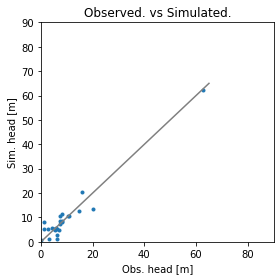

Error is - 2.8621921068548173
Params are - [7.74706648e-01 1.56959467e+01 1.08222560e+01 6.13821654e-01
 9.83424738e-01 3.74110025e-01 2.19757140e-03 6.69939764e-01
 1.70104565e-01 3.63195987e-01 1.87748789e-03 4.13213221e+00]


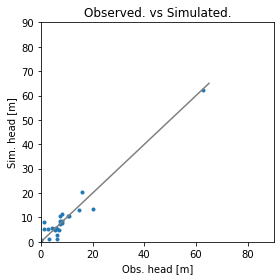

Error is - 2.862128144786819
Params are - [7.67018770e-01 1.56448846e+01 1.09806760e+01 6.06827226e-01
 9.76321617e-01 3.70853141e-01 2.20703768e-03 6.70701221e-01
 1.68956332e-01 3.70317078e-01 1.89391926e-03 4.16780734e+00]


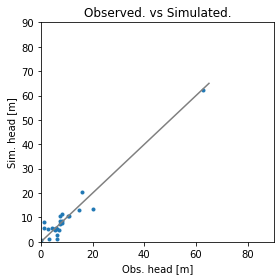

Error is - 2.862109041438296
Params are - [7.63822959e-01 1.56506464e+01 1.11187569e+01 6.04995029e-01
 9.71821470e-01 3.77314005e-01 2.21282980e-03 6.67596562e-01
 1.68091159e-01 3.70663352e-01 1.89769719e-03 4.16281669e+00]


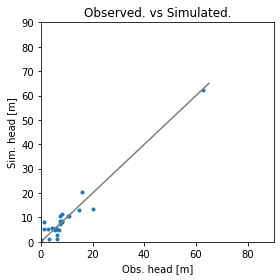

Error is - 2.8621800386213465
Params are - [7.65495338e-01 1.55789345e+01 1.09756693e+01 6.11798041e-01
 9.85666459e-01 3.73815991e-01 2.20288468e-03 6.59399016e-01
 1.68014398e-01 3.68097313e-01 1.89892753e-03 4.23304849e+00]


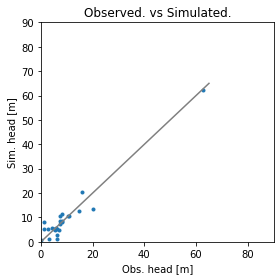

Error is - 2.8620531862805323
Params are - [7.65775370e-01 1.57512284e+01 1.07571627e+01 6.15678449e-01
 9.83395277e-01 3.67170409e-01 2.20020511e-03 6.57415342e-01
 1.69840229e-01 3.71285395e-01 1.89253126e-03 4.24664551e+00]


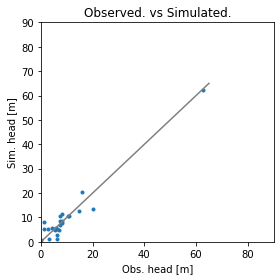

Error is - 2.8619911938657783
Params are - [7.62670592e-01 1.58626051e+01 1.06432719e+01 6.22004119e-01
 9.85693343e-01 3.67708893e-01 2.19831231e-03 6.44486833e-01
 1.70203274e-01 3.72712212e-01 1.89312237e-03 4.30783690e+00]


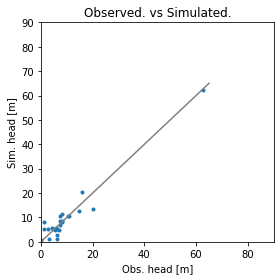

Error is - 2.862007832840311
Params are - [7.62592692e-01 1.57927186e+01 1.09953360e+01 6.12032329e-01
 9.84899419e-01 3.68008710e-01 2.19534934e-03 6.60326376e-01
 1.70571919e-01 3.70336427e-01 1.87740038e-03 4.22621117e+00]


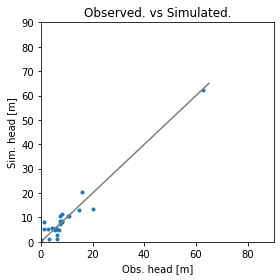

Error is - 2.8621032766573777
Params are - [7.63922487e-01 1.57161588e+01 1.08985369e+01 6.15854757e-01
 9.81857742e-01 3.67635989e-01 2.20416376e-03 6.57517484e-01
 1.67665876e-01 3.69047273e-01 1.92453576e-03 4.23369436e+00]


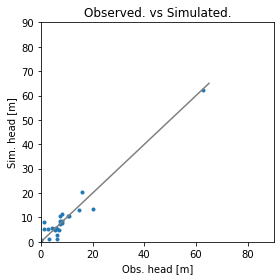

Error is - 2.8621182439559236
Params are - [7.61603883e-01 1.57144399e+01 1.12736150e+01 6.03588799e-01
 9.87499473e-01 3.88326222e-01 2.19816542e-03 6.59148513e-01
 1.68196964e-01 3.62734416e-01 1.88222469e-03 4.22718277e+00]


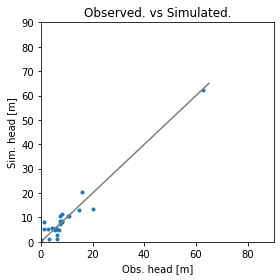

Error is - 2.8620224799101823
Params are - [7.80479303e-01 1.57674342e+01 1.06930647e+01 6.24608311e-01
 9.79964674e-01 3.61870993e-01 2.20195449e-03 6.52468006e-01
 1.67420988e-01 3.72108259e-01 1.88327715e-03 4.22673758e+00]


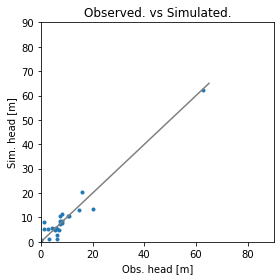

Error is - 2.862031075155419
Params are - [7.61544192e-01 1.57909468e+01 1.11432159e+01 6.20027870e-01
 9.82174391e-01 3.72773888e-01 2.21057592e-03 6.50026860e-01
 1.66976564e-01 3.69063449e-01 1.89378035e-03 4.22003368e+00]


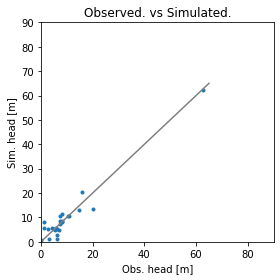

Error is - 2.8619033049730986
Params are - [7.65622714e-01 1.58366475e+01 1.10824158e+01 6.14155707e-01
 9.80926445e-01 3.80860799e-01 2.20588984e-03 6.49910561e-01
 1.68655393e-01 3.64444305e-01 1.90387789e-03 4.20016637e+00]


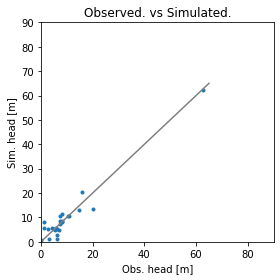

Error is - 2.861837941126899
Params are - [7.64030933e-01 1.59528859e+01 1.12199148e+01 6.14873535e-01
 9.79642125e-01 3.91467544e-01 2.20912159e-03 6.39398784e-01
 1.68631510e-01 3.59900017e-01 1.91492979e-03 4.18948718e+00]


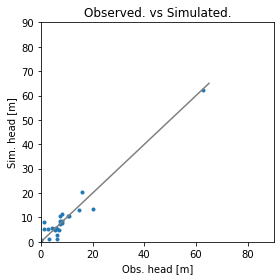

Error is - 2.8618672397898055
Params are - [7.60909709e-01 1.57961077e+01 1.08213385e+01 6.27838884e-01
 9.83078792e-01 3.73360126e-01 2.20211799e-03 6.35225170e-01
 1.68544846e-01 3.69219598e-01 1.90288343e-03 4.19243240e+00]


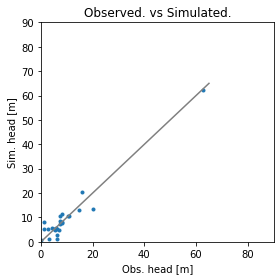

Error is - 2.861942277291886
Params are - [7.56067375e-01 1.58055901e+01 1.10890560e+01 6.17652690e-01
 9.80696188e-01 3.69747324e-01 2.20934873e-03 6.38516187e-01
 1.66968007e-01 3.74519768e-01 1.91699115e-03 4.29392728e+00]


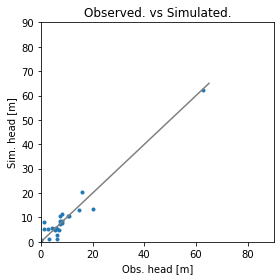

Error is - 2.861908160970317
Params are - [7.64132660e-01 1.57893965e+01 1.04838411e+01 6.31083514e-01
 9.80460094e-01 3.78123389e-01 2.20800898e-03 6.30900276e-01
 1.67575675e-01 3.70273734e-01 1.90816825e-03 4.37754008e+00]


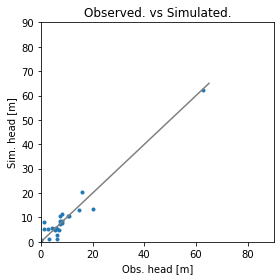

Error is - 2.8617407911086437
Params are - [7.63541002e-01 1.59710292e+01 1.08053263e+01 6.25356529e-01
 9.77163219e-01 3.71332595e-01 2.20638059e-03 6.38730075e-01
 1.68623783e-01 3.70992285e-01 1.90147454e-03 4.25215120e+00]


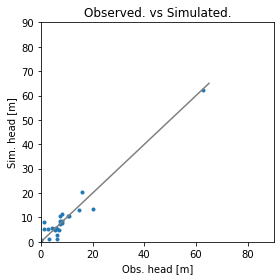

Error is - 2.861613025968446
Params are - [7.62563834e-01 1.61670766e+01 1.07201548e+01 6.32135773e-01
 9.72911598e-01 3.70090897e-01 2.20812854e-03 6.28395604e-01
 1.68928476e-01 3.72439772e-01 1.90274804e-03 4.26170255e+00]


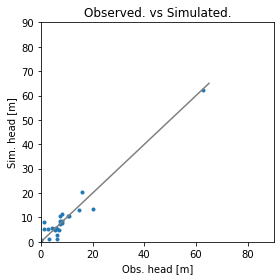

Error is - 2.861882944729044
Params are - [7.54948848e-01 1.59734820e+01 1.15439907e+01 6.09415019e-01
 9.82592862e-01 3.93183561e-01 2.20403619e-03 6.40837614e-01
 1.67646905e-01 3.64877294e-01 1.89222450e-03 4.23330241e+00]


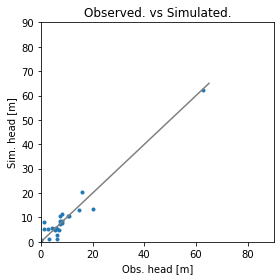

Error is - 2.8617561529294844
Params are - [7.64677048e-01 1.59630682e+01 1.06214647e+01 6.35164839e-01
 9.73465977e-01 3.60221331e-01 2.21249252e-03 6.31800779e-01
 1.68340569e-01 3.76459110e-01 1.91906837e-03 4.26043762e+00]


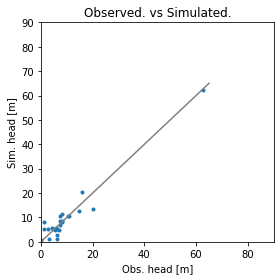

Error is - 2.8618338129842864
Params are - [7.62600320e-01 1.60789320e+01 1.06934407e+01 6.38786911e-01
 9.89418064e-01 3.68384769e-01 2.19777193e-03 6.17386767e-01
 1.68487942e-01 3.69496133e-01 1.90715774e-03 4.34107384e+00]


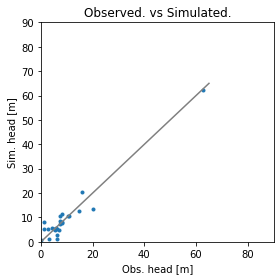

Error is - 2.861640609660163
Params are - [7.62280430e-01 1.60738818e+01 1.08794781e+01 6.31749208e-01
 9.80641846e-01 3.78187582e-01 2.20537266e-03 6.20777392e-01
 1.69050237e-01 3.71187023e-01 1.87742283e-03 4.28809276e+00]


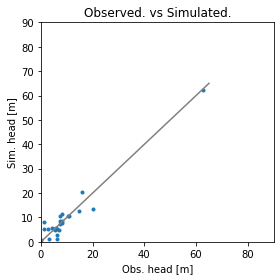

Error is - 2.8616820048422555
Params are - [7.64781432e-01 1.60462497e+01 1.05908428e+01 6.29529652e-01
 9.80069773e-01 3.73951965e-01 2.19809329e-03 6.23393105e-01
 1.70085161e-01 3.71524775e-01 1.90545198e-03 4.31309661e+00]


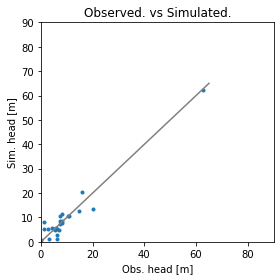

Error is - 2.8618248797472385
Params are - [7.43230009e-01 1.61162315e+01 1.10239570e+01 6.25769435e-01
 9.82297006e-01 3.86868355e-01 2.20607119e-03 6.16106142e-01
 1.70084766e-01 3.68382718e-01 1.91965099e-03 4.32078588e+00]


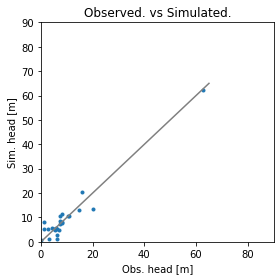

Error is - 2.8617325206294413
Params are - [7.57889507e-01 1.61448659e+01 1.07264559e+01 6.40634934e-01
 9.76928525e-01 3.83873912e-01 2.21446331e-03 6.00877733e-01
 1.66852642e-01 3.69828932e-01 1.93256953e-03 4.33707475e+00]


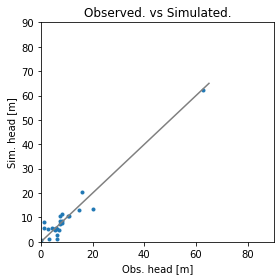

Error is - 2.8616659037309935
Params are - [7.57014759e-01 1.61220229e+01 1.10923839e+01 6.33768280e-01
 9.74673799e-01 3.86867900e-01 2.21419218e-03 6.09449092e-01
 1.66662848e-01 3.66972600e-01 1.92342207e-03 4.26032200e+00]


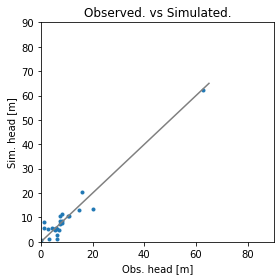

Error is - 2.8616442436380094
Params are - [7.63775873e-01 1.62317767e+01 1.06471545e+01 6.40805641e-01
 9.78667222e-01 3.87682897e-01 2.20396300e-03 6.10575223e-01
 1.69847256e-01 3.63907183e-01 1.90062510e-03 4.26863074e+00]


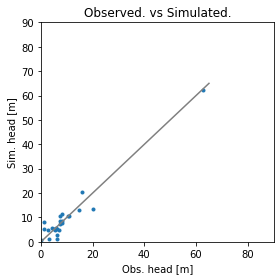

Error is - 2.861616443790143
Params are - [7.55651123e-01 1.63217003e+01 1.12795883e+01 6.28995171e-01
 9.78604504e-01 3.80900085e-01 2.20462842e-03 6.14803624e-01
 1.69618185e-01 3.67092125e-01 1.90819081e-03 4.16686637e+00]


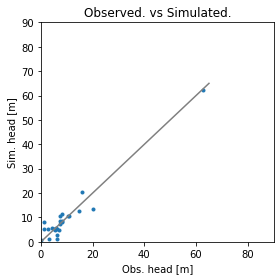

Error is - 2.861772672709747
Params are - [7.64951981e-01 1.61956511e+01 1.01753716e+01 6.53927025e-01
 9.75807010e-01 3.63792666e-01 2.20869991e-03 6.00527288e-01
 1.69875501e-01 3.72857704e-01 1.92679561e-03 4.30003137e+00]


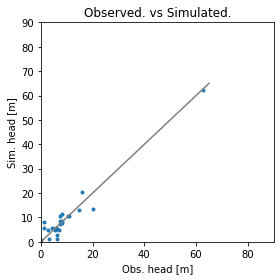

Error is - 2.8615743229368142
Params are - [7.59664833e-01 1.64396161e+01 1.07903627e+01 6.39851183e-01
 9.74109116e-01 3.82021525e-01 2.21171510e-03 6.00356753e-01
 1.69199336e-01 3.69121751e-01 1.92012204e-03 4.35883454e+00]


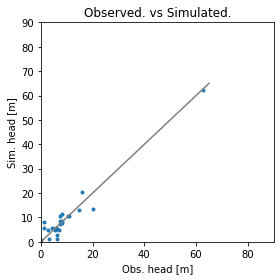

Error is - 2.861665589013355
Params are - [7.59042395e-01 1.67613703e+01 1.07748748e+01 6.45857333e-01
 9.69624279e-01 3.86352224e-01 2.21651365e-03 5.82922544e-01
 1.69526582e-01 3.69072828e-01 1.92874135e-03 4.44203561e+00]


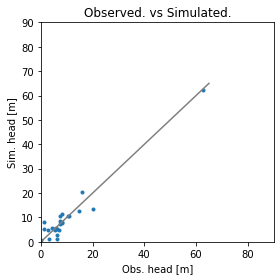

Error is - 2.8616524720743217
Params are - [7.55815925e-01 1.63639595e+01 1.03201944e+01 6.56979474e-01
 9.76623615e-01 3.62339770e-01 2.20514375e-03 5.89676133e-01
 1.69207310e-01 3.79978287e-01 1.90894106e-03 4.39000433e+00]


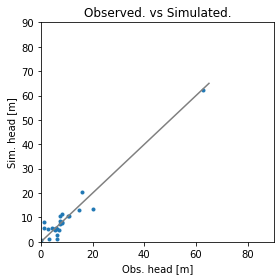

Error is - 2.861648277321202
Params are - [7.56115806e-01 1.62854181e+01 1.07844607e+01 6.36098192e-01
 9.64715268e-01 3.84415045e-01 2.21772205e-03 6.07069711e-01
 1.69470772e-01 3.72129197e-01 1.91701033e-03 4.24657274e+00]


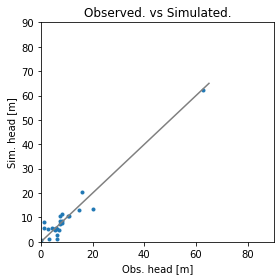

Error is - 2.8615240473698
Params are - [7.77633749e-01 1.62763164e+01 1.04140285e+01 6.50837127e-01
 9.68906036e-01 3.65522574e-01 2.21136460e-03 6.06844265e-01
 1.67771617e-01 3.73867025e-01 1.90407697e-03 4.25449185e+00]


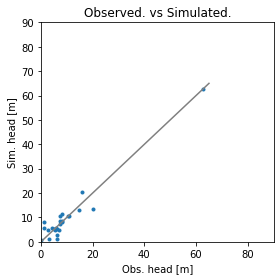

Error is - 2.8616231538489445
Params are - [7.94835619e-01 1.63563588e+01 1.01090642e+01 6.63370974e-01
 9.62210551e-01 3.54849684e-01 2.21401131e-03 6.02213326e-01
 1.66615042e-01 3.76609178e-01 1.89628996e-03 4.22134483e+00]


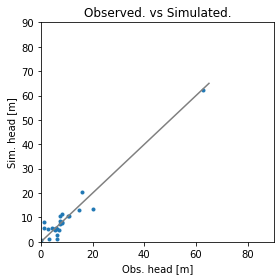

Error is - 2.86162440628196
Params are - [7.58025405e-01 1.62103409e+01 1.13023899e+01 6.22164554e-01
 9.74245870e-01 3.88886581e-01 2.20918000e-03 6.23475948e-01
 1.67630234e-01 3.69560260e-01 1.89314591e-03 4.26765644e+00]


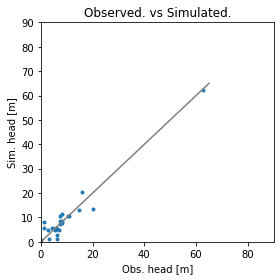

Error is - 2.861559454904155
Params are - [7.57191731e-01 1.64841359e+01 1.09697844e+01 6.38760026e-01
 9.76716885e-01 3.97235458e-01 2.20483529e-03 5.90814984e-01
 1.69046776e-01 3.64809045e-01 1.89655275e-03 4.30845333e+00]


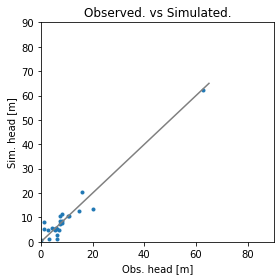

Error is - 2.8615266320123314
Params are - [7.63862977e-01 1.63588832e+01 1.09053480e+01 6.32977446e-01
 9.73219064e-01 3.75809801e-01 2.20125983e-03 6.20060906e-01
 1.70900392e-01 3.70602575e-01 1.87704879e-03 4.22704596e+00]


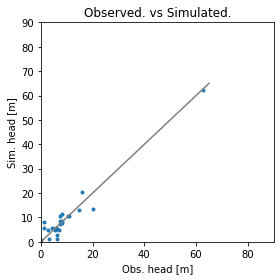

Error is - 2.8615469677614125
Params are - [7.56817976e-01 1.65096051e+01 1.10933786e+01 6.44657360e-01
 9.68936031e-01 3.86041387e-01 2.21815761e-03 5.96990168e-01
 1.67803746e-01 3.68753032e-01 1.89943247e-03 4.23668232e+00]


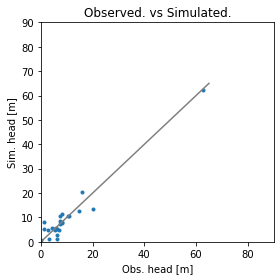

Error is - 2.861618397272435
Params are - [7.64551852e-01 1.64984289e+01 1.05920032e+01 6.42233579e-01
 9.73375711e-01 3.72987701e-01 2.20271963e-03 6.08857693e-01
 1.71416208e-01 3.73601946e-01 1.87746411e-03 4.28551699e+00]


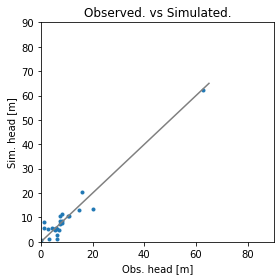

Error is - 2.861676378971359
Params are - [7.67206673e-01 1.62789038e+01 1.14094942e+01 6.16564736e-01
 9.70884577e-01 3.99290485e-01 2.21136403e-03 6.31827578e-01
 1.69239896e-01 3.59533536e-01 1.88669897e-03 4.13842010e+00]


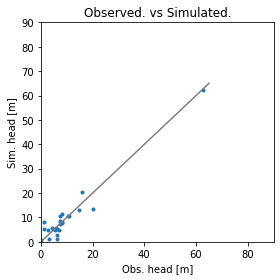

Error is - 2.861548514352672
Params are - [7.58663612e-01 1.63426956e+01 1.05925194e+01 6.46875789e-01
 9.75188855e-01 3.71577449e-01 2.20669882e-03 6.00213995e-01
 1.69215456e-01 3.74867099e-01 1.90338054e-03 4.32710827e+00]


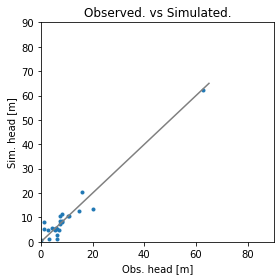

Error is - 2.8616222235704845
Params are - [7.67331427e-01 1.63669915e+01 1.09132377e+01 6.39242285e-01
 9.84538522e-01 3.75075611e-01 2.19694853e-03 6.13291381e-01
 1.68933881e-01 3.67838942e-01 1.87635806e-03 4.29527428e+00]


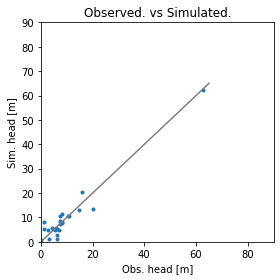

Error is - 2.861455135396176
Params are - [7.60263952e-01 1.64431687e+01 1.10948911e+01 6.34274276e-01
 9.71565118e-01 3.69706544e-01 2.20953851e-03 6.10238562e-01
 1.68405168e-01 3.76716249e-01 1.88869879e-03 4.27765687e+00]


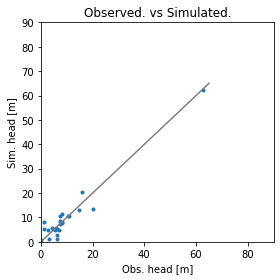

Error is - 2.8614840015487757
Params are - [7.58507992e-01 1.65488648e+01 1.13187594e+01 6.31008594e-01
 9.68014066e-01 3.60718368e-01 2.21232627e-03 6.10070232e-01
 1.67684123e-01 3.83120783e-01 1.88273563e-03 4.28216994e+00]


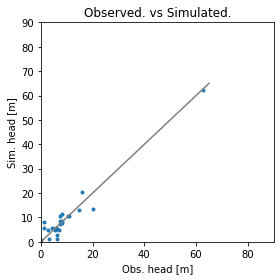

Error is - 2.861504431534149
Params are - [7.61423315e-01 1.66626114e+01 1.08984696e+01 6.43751553e-01
 9.68077706e-01 3.77788353e-01 2.20882315e-03 5.98279922e-01
 1.69094676e-01 3.70357948e-01 1.91378039e-03 4.25645554e+00]


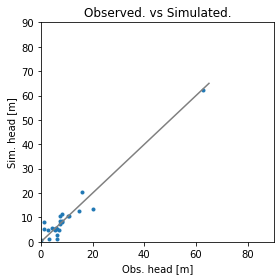

Error is - 2.8616382718651057
Params are - [7.66244659e-01 1.66015307e+01 1.04082378e+01 6.56934041e-01
 9.73445655e-01 3.65239650e-01 2.20495635e-03 5.91382028e-01
 1.70758752e-01 3.72117659e-01 1.90149638e-03 4.27502504e+00]


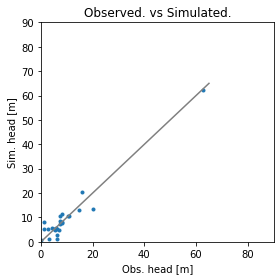

Error is - 2.8615237464114007
Params are - [7.60080218e-01 1.63081383e+01 1.10788519e+01 6.30856926e-01
 9.74045816e-01 3.82974848e-01 2.20812408e-03 6.15452468e-01
 1.68412363e-01 3.70199610e-01 1.89523353e-03 4.26949859e+00]


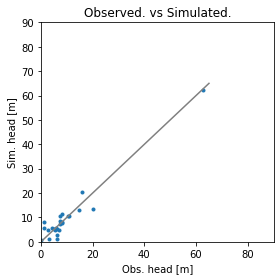

Error is - 2.8616229305690877
Params are - [7.55730102e-01 1.64350712e+01 1.08249924e+01 6.38458750e-01
 9.61404219e-01 3.80367160e-01 2.21905040e-03 6.01926776e-01
 1.69368185e-01 3.74232421e-01 1.92143014e-03 4.24311126e+00]


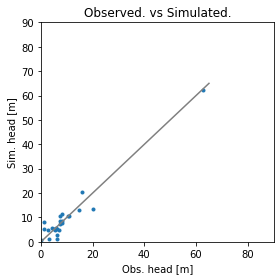

Error is - 2.8615219800083294
Params are - [7.64431096e-01 1.63840114e+01 1.08911764e+01 6.39046401e-01
 9.78754946e-01 3.76398498e-01 2.20247400e-03 6.10450230e-01
 1.69042457e-01 3.69437312e-01 1.88762608e-03 4.28223352e+00]


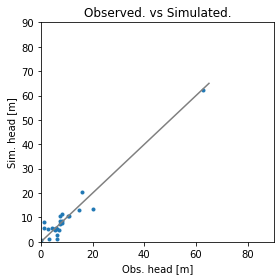

Error is - 2.861628215546547
Params are - [7.58489551e-01 1.62845643e+01 1.11960890e+01 6.34936260e-01
 9.73463569e-01 3.83023536e-01 2.21323837e-03 6.06625887e-01
 1.66490233e-01 3.67775312e-01 1.92201775e-03 4.25232129e+00]


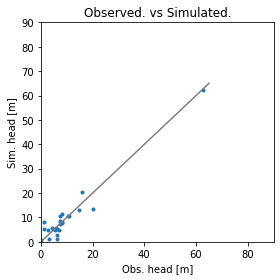

Error is - 2.861521842297401
Params are - [7.63036277e-01 1.64449627e+01 1.07430247e+01 6.40409249e-01
 9.73397675e-01 3.75496660e-01 2.20534931e-03 6.08299741e-01
 1.70184714e-01 3.72145287e-01 1.88860252e-03 4.27721807e+00]


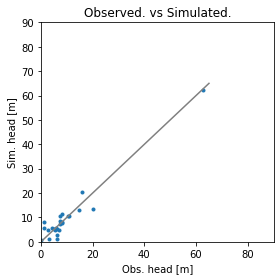

Error is - 2.8614762320555416
Params are - [7.68621138e-01 1.64818366e+01 1.04190767e+01 6.50077014e-01
 9.67366970e-01 3.74210581e-01 2.21144973e-03 5.99595975e-01
 1.68382678e-01 3.75127325e-01 1.88802634e-03 4.38936386e+00]


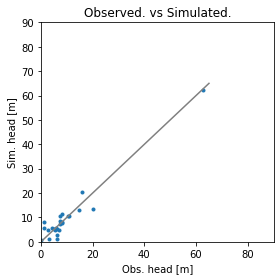

Error is - 2.861459395672918
Params are - [7.62717978e-01 1.66889203e+01 1.09283305e+01 6.49926619e-01
 9.72135772e-01 3.85706383e-01 2.20850314e-03 5.81204057e-01
 1.68981421e-01 3.70227605e-01 1.89101549e-03 4.31580457e+00]


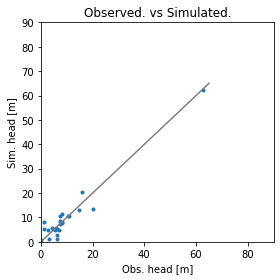

Error is - 2.8615064829607078
Params are - [7.66125837e-01 1.64579315e+01 1.08811173e+01 6.43890448e-01
 9.70609363e-01 3.74389898e-01 2.20438125e-03 6.06050793e-01
 1.68674241e-01 3.73729934e-01 1.86879040e-03 4.21150091e+00]


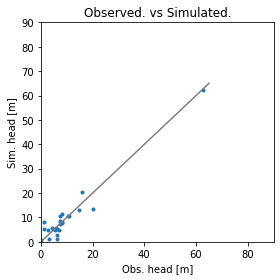

Error is - 2.861469925040073
Params are - [7.70087956e-01 1.64090443e+01 1.06869177e+01 6.45836676e-01
 9.66983673e-01 3.55368371e-01 2.21118538e-03 6.18131863e-01
 1.68764712e-01 3.79529455e-01 1.88773264e-03 4.24572339e+00]


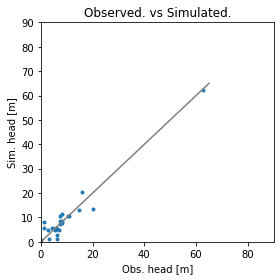

Error is - 2.8614664487017936
Params are - [7.70520133e-01 1.65615427e+01 1.10799158e+01 6.37547727e-01
 9.67144173e-01 3.78324867e-01 2.21006961e-03 6.11719164e-01
 1.68520908e-01 3.70248461e-01 1.87829686e-03 4.21350430e+00]


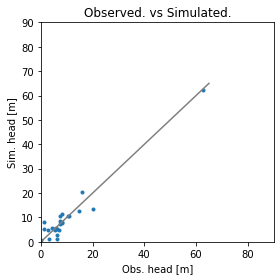

Error is - 2.861528188406514
Params are - [7.74649462e-01 1.64032895e+01 1.05768127e+01 6.38581217e-01
 9.73098354e-01 3.62574843e-01 2.19726282e-03 6.17397823e-01
 1.70052145e-01 3.76611765e-01 1.87872233e-03 4.30006725e+00]


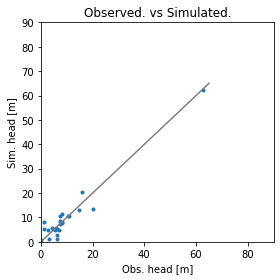

Error is - 2.861459708683177
Params are - [7.70191591e-01 1.64298684e+01 1.07059542e+01 6.40100253e-01
 9.72057774e-01 3.68441479e-01 2.20248652e-03 6.12295909e-01
 1.69490046e-01 3.74647082e-01 1.88389987e-03 4.28422102e+00]


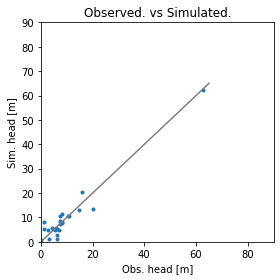

Error is - 2.8614868974762526
Params are - [7.68659230e-01 1.65658422e+01 1.07316111e+01 6.51448266e-01
 9.68621773e-01 3.71578375e-01 2.21436505e-03 5.93032919e-01
 1.66720441e-01 3.75436307e-01 1.90224786e-03 4.31923279e+00]


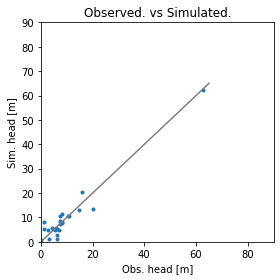

Error is - 2.8615206791322123
Params are - [7.53392704e-01 1.66966634e+01 1.12758610e+01 6.33690440e-01
 9.72887424e-01 3.82874902e-01 2.20476035e-03 6.03947669e-01
 1.69674021e-01 3.72433404e-01 1.87491482e-03 4.30257706e+00]


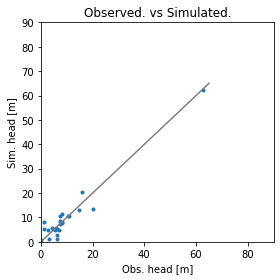

Error is - 2.8614091190394335
Params are - [7.69831649e-01 1.67295956e+01 1.06438724e+01 6.54142894e-01
 9.67554578e-01 3.65405971e-01 2.20744025e-03 5.93422000e-01
 1.69243550e-01 3.76473119e-01 1.88037181e-03 4.29308339e+00]


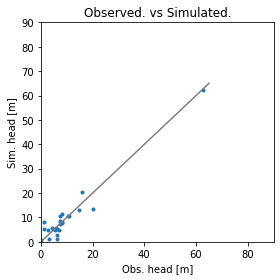

Error is - 2.8614807488814358
Params are - [7.74707365e-01 1.69403243e+01 1.04263827e+01 6.65785879e-01
 9.64308959e-01 3.56621532e-01 2.20709833e-03 5.82406766e-01
 1.69659144e-01 3.79609873e-01 1.87294096e-03 4.30487580e+00]


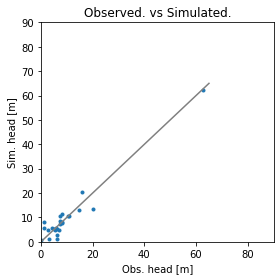

Error is - 2.861442806044707
Params are - [7.66380865e-01 1.67113199e+01 1.07903306e+01 6.48469502e-01
 9.60978721e-01 3.70150233e-01 2.21391804e-03 5.95586199e-01
 1.68646972e-01 3.78408051e-01 1.88677022e-03 4.28215677e+00]


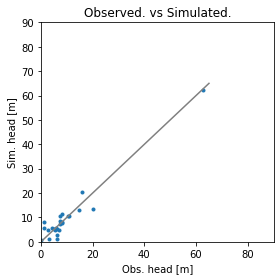

Error is - 2.8614289738461713
Params are - [7.68333115e-01 1.66947615e+01 1.09463666e+01 6.48450029e-01
 9.64266165e-01 3.70161000e-01 2.21247085e-03 5.95617764e-01
 1.67248425e-01 3.76743870e-01 1.88548839e-03 4.28799535e+00]


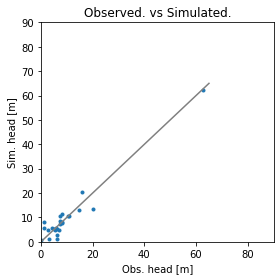

Error is - 2.861488941432436
Params are - [7.80466756e-01 1.64427438e+01 1.03586146e+01 6.57628769e-01
 9.63339541e-01 3.60663774e-01 2.21434489e-03 5.98581519e-01
 1.67354852e-01 3.77174163e-01 1.90093835e-03 4.26020607e+00]


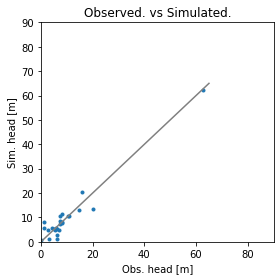

Error is - 2.8614349348418378
Params are - [7.70123776e-01 1.66789444e+01 1.06662746e+01 6.49718482e-01
 9.64405964e-01 3.66861090e-01 2.21638460e-03 5.95233516e-01
 1.68134734e-01 3.76451671e-01 1.91242077e-03 4.35939974e+00]


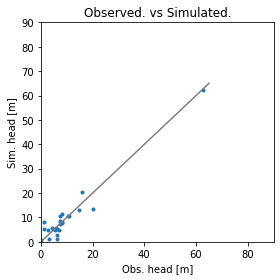

Error is - 2.8614664683512987
Params are - [7.76276375e-01 1.64769867e+01 1.06102230e+01 6.50851864e-01
 9.66325665e-01 3.61641425e-01 2.21320294e-03 6.02496652e-01
 1.67554309e-01 3.80839278e-01 1.86720418e-03 4.33160248e+00]


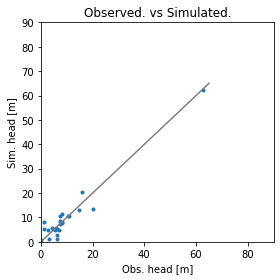

Error is - 2.8614923105172543
Params are - [7.56534537e-01 1.67025614e+01 1.11920128e+01 6.35845164e-01
 9.71561517e-01 3.78928946e-01 2.20749087e-03 6.02847578e-01
 1.69327375e-01 3.74633916e-01 1.87442385e-03 4.33975135e+00]


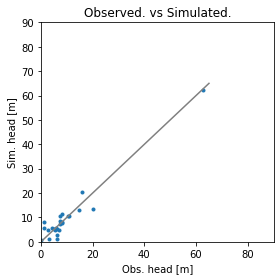

Error is - 2.8614245350605723
Params are - [7.74483701e-01 1.65076982e+01 1.05669641e+01 6.52182868e-01
 9.65395035e-01 3.65230067e-01 2.21263139e-03 5.99648033e-01
 1.67847983e-01 3.76539101e-01 1.89430973e-03 4.28009239e+00]


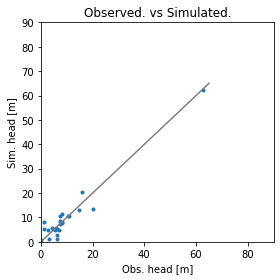

Error is - 2.8614312898885306
Params are - [7.69312808e-01 1.65697723e+01 1.07915751e+01 6.42148101e-01
 9.65741495e-01 3.66956293e-01 2.20718178e-03 6.09498697e-01
 1.70149710e-01 3.76555571e-01 1.87179132e-03 4.27420123e+00]


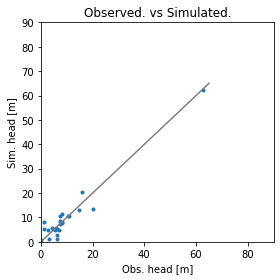

Error is - 2.8613975583807307
Params are - [7.69466178e-01 1.66684339e+01 1.11661926e+01 6.42197868e-01
 9.66725385e-01 3.63115040e-01 2.20938577e-03 6.04586094e-01
 1.68781978e-01 3.77102593e-01 1.88330700e-03 4.18487639e+00]


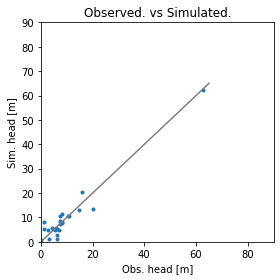

Error is - 2.861490015805928
Params are - [7.69888698e-01 1.67617326e+01 1.15397506e+01 6.38258295e-01
 9.66404592e-01 3.57567269e-01 2.20835380e-03 6.07081154e-01
 1.68981628e-01 3.78090227e-01 1.88094733e-03 4.08263265e+00]


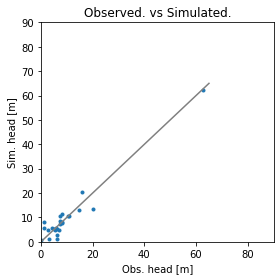

Error is - 2.8614203708412
Params are - [7.67895730e-01 1.67844578e+01 1.09782307e+01 6.45831738e-01
 9.67065634e-01 3.83248361e-01 2.20935019e-03 5.83792579e-01
 1.68402821e-01 3.72295987e-01 1.88286310e-03 4.31837569e+00]


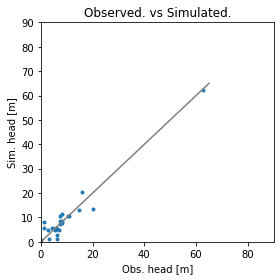

Error is - 2.8615194128010257
Params are - [7.60310538e-01 1.67677606e+01 1.11162601e+01 6.39979862e-01
 9.67846971e-01 3.80576463e-01 2.20669050e-03 5.96310443e-01
 1.69754644e-01 3.69562281e-01 1.90600138e-03 4.23029214e+00]


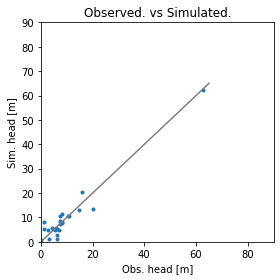

Error is - 2.8613969680734206
Params are - [7.72284915e-01 1.65496802e+01 1.07367323e+01 6.48133863e-01
 9.66705991e-01 3.66375184e-01 2.21157483e-03 6.00950100e-01
 1.68104392e-01 3.78020029e-01 1.87690348e-03 4.30627490e+00]


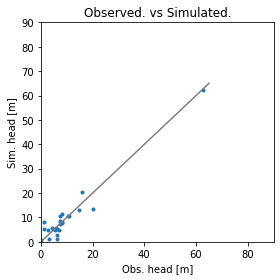

Error is - 2.861391953581958
Params are - [7.66360910e-01 1.66812275e+01 1.05893700e+01 6.55048356e-01
 9.66955432e-01 3.61901407e-01 2.21007470e-03 5.85293088e-01
 1.68718625e-01 3.81448361e-01 1.89467647e-03 4.36385208e+00]


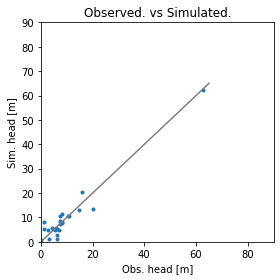

Error is - 2.8614752073100185
Params are - [7.64281299e-01 1.67410698e+01 1.03440972e+01 6.63798670e-01
 9.66861062e-01 3.53689676e-01 2.21007725e-03 5.72080050e-01
 1.68817484e-01 3.87048311e-01 1.90286627e-03 4.43902597e+00]


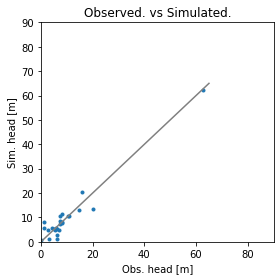

Error is - 2.861428219208991
Params are - [7.66051006e-01 1.68547950e+01 1.09439009e+01 6.54987180e-01
 9.61191442e-01 3.70694783e-01 2.21892249e-03 5.80215872e-01
 1.67620918e-01 3.78183286e-01 1.89086956e-03 4.30640721e+00]


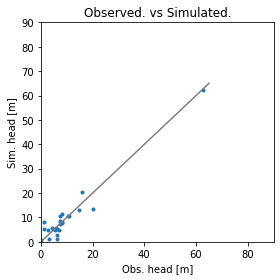

Error is - 2.8614232407334406
Params are - [7.74080123e-01 1.66233888e+01 1.07241197e+01 6.46004240e-01
 9.59289389e-01 3.50927946e-01 2.21464243e-03 6.11143027e-01
 1.67902792e-01 3.83928710e-01 1.88372962e-03 4.27325744e+00]


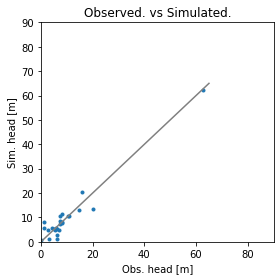

Error is - 2.8614510600820466
Params are - [7.78836844e-01 1.68991771e+01 1.04957639e+01 6.63611577e-01
 9.57814087e-01 3.63798018e-01 2.21445771e-03 5.82259266e-01
 1.68395316e-01 3.78642142e-01 1.88521813e-03 4.31067189e+00]


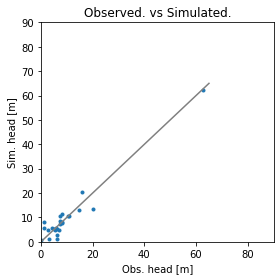

Error is - 2.8613986154447617
Params are - [7.74193621e-01 1.67851750e+01 1.06455457e+01 6.56277252e-01
 9.61251845e-01 3.65275150e-01 2.21322791e-03 5.89254090e-01
 1.68397779e-01 3.78160669e-01 1.88608829e-03 4.30241814e+00]


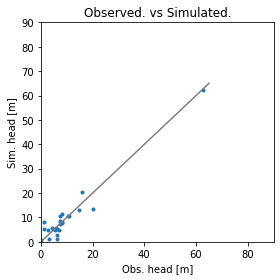

Error is - 2.861342542489192
Params are - [7.74022058e-01 1.66433351e+01 1.07761935e+01 6.50717644e-01
 9.68446005e-01 3.62541816e-01 2.20996316e-03 5.95856277e-01
 1.68111979e-01 3.76909110e-01 1.88703304e-03 4.30954888e+00]


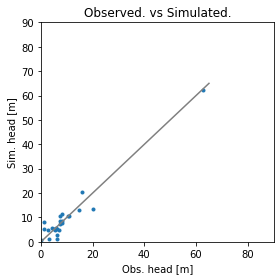

Error is - 2.861356782791747
Params are - [7.77842654e-01 1.66093428e+01 1.07691250e+01 6.51841715e-01
 9.72179648e-01 3.58737607e-01 2.20798572e-03 5.95991317e-01
 1.67844482e-01 3.76159640e-01 1.88716445e-03 4.32324494e+00]


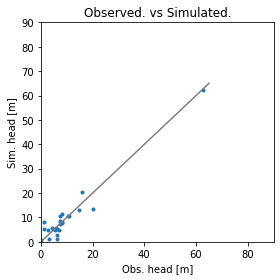

Error is - 2.8614789602188004
Params are - [7.70928860e-01 1.66697758e+01 1.09185694e+01 6.49635191e-01
 9.65692102e-01 3.65111079e-01 2.20642636e-03 5.96312754e-01
 1.68620425e-01 3.78941730e-01 1.85715120e-03 4.22399744e+00]


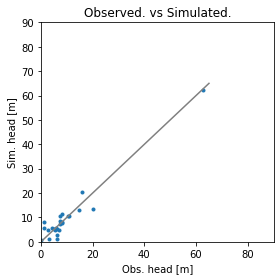

Error is - 2.8613946885187476
Params are - [7.70325047e-01 1.66766522e+01 1.07293483e+01 6.49697659e-01
 9.64727499e-01 3.66423588e-01 2.21389504e-03 5.95503326e-01
 1.68256156e-01 3.77074186e-01 1.89860338e-03 4.32554917e+00]


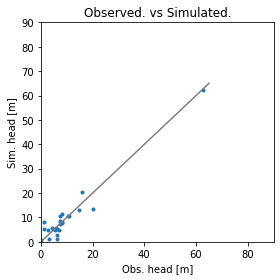

Error is - 2.861466552405199
Params are - [7.71908534e-01 1.67967612e+01 1.07828977e+01 6.58463830e-01
 9.64187572e-01 3.64927092e-01 2.21674806e-03 5.79715012e-01
 1.66289856e-01 3.78924266e-01 1.90224932e-03 4.31775394e+00]


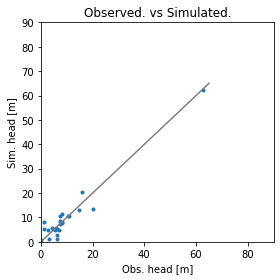

Error is - 2.8613775901246155
Params are - [7.69961740e-01 1.66265195e+01 1.07894058e+01 6.46227034e-01
 9.65353014e-01 3.66448993e-01 2.20957335e-03 6.02052775e-01
 1.69184746e-01 3.77147745e-01 1.87940582e-03 4.28508941e+00]


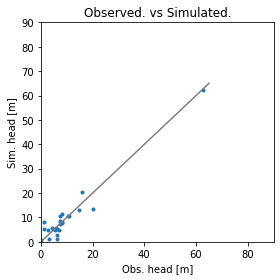

Error is - 2.8614008505503956
Params are - [7.73159665e-01 1.66603984e+01 1.06019461e+01 6.51791404e-01
 9.65844043e-01 3.61103717e-01 2.21097607e-03 5.94668446e-01
 1.69513862e-01 3.78803280e-01 1.88753849e-03 4.30347550e+00]


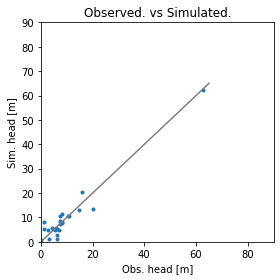

Error is - 2.861451591888357
Params are - [7.76626550e-01 1.64679654e+01 1.05474193e+01 6.44721623e-01
 9.69694200e-01 3.58971423e-01 2.20320003e-03 6.12479100e-01
 1.69456860e-01 3.77467196e-01 1.88160214e-03 4.28457502e+00]


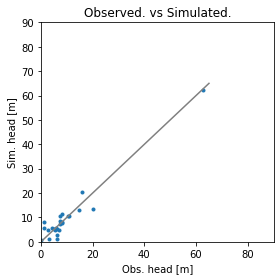

Error is - 2.8613819941951695
Params are - [7.68694892e-01 1.67580876e+01 1.08447805e+01 6.52420791e-01
 9.63317131e-01 3.67763943e-01 2.21499187e-03 5.88281679e-01
 1.68079903e-01 3.78004263e-01 1.88855271e-03 4.30094916e+00]


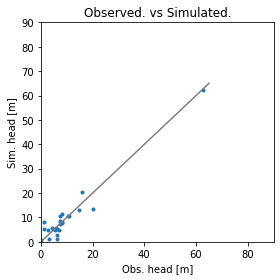

Error is - 2.8613735708397834
Params are - [7.67229054e-01 1.68567938e+01 1.09706588e+01 6.47565589e-01
 9.65144290e-01 3.64858452e-01 2.20988454e-03 5.91152547e-01
 1.69268448e-01 3.79355574e-01 1.87720247e-03 4.31436597e+00]


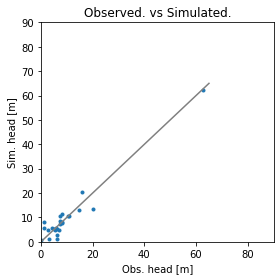

Error is - 2.8614445180759263
Params are - [7.66490787e-01 1.67800039e+01 1.08545931e+01 6.54004442e-01
 9.72225753e-01 3.81482324e-01 2.20708052e-03 5.76325807e-01
 1.69441248e-01 3.71203776e-01 1.88669473e-03 4.32805234e+00]


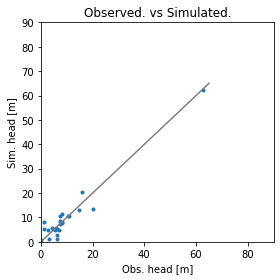

Error is - 2.8613807505506457
Params are - [7.72182789e-01 1.66625426e+01 1.07567381e+01 6.48004291e-01
 9.62523480e-01 3.58566541e-01 2.21275195e-03 6.02438722e-01
 1.68287406e-01 3.80747477e-01 1.88447089e-03 4.28695616e+00]


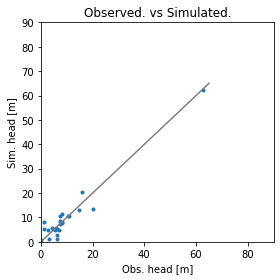

Error is - 2.861426720289779
Params are - [7.73389689e-01 1.65986157e+01 1.05635666e+01 6.54539036e-01
 9.63692482e-01 3.45048273e-01 2.21293972e-03 6.06783945e-01
 1.68921983e-01 3.84245081e-01 1.88782921e-03 4.27769750e+00]


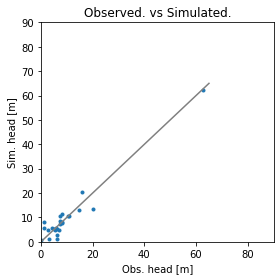

Error is - 2.861378094209046
Params are - [7.69269220e-01 1.67379973e+01 1.08745647e+01 6.48008562e-01
 9.66222346e-01 3.73698339e-01 2.21024757e-03 5.89540420e-01
 1.68532612e-01 3.75283260e-01 1.88410463e-03 4.30820614e+00]


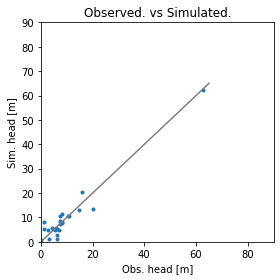

Error is - 2.861349298123371
Params are - [7.71360032e-01 1.66548782e+01 1.09363736e+01 6.45205491e-01
 9.62981499e-01 3.64272724e-01 2.21531755e-03 5.96507595e-01
 1.67962764e-01 3.79869639e-01 1.89094263e-03 4.30551026e+00]


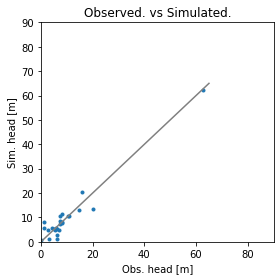

Error is - 2.8614039390703723
Params are - [7.67732078e-01 1.67231555e+01 1.10340379e+01 6.46459329e-01
 9.64214943e-01 3.69103145e-01 2.21250530e-03 5.95567673e-01
 1.67433936e-01 3.77717205e-01 1.88434331e-03 4.29545727e+00]


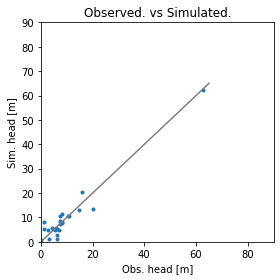

Error is - 2.861370043656798
Params are - [7.71802768e-01 1.66760876e+01 1.07099690e+01 6.50458385e-01
 9.65436768e-01 3.63103574e-01 2.21135838e-03 5.94893253e-01
 1.68993880e-01 3.78531761e-01 1.88673970e-03 4.30147095e+00]


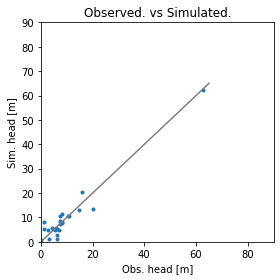

Error is - 2.8613725775633463
Params are - [7.66299646e-01 1.65801976e+01 1.10011755e+01 6.41003670e-01
 9.69504628e-01 3.64569784e-01 2.20994188e-03 6.01921889e-01
 1.68649370e-01 3.78421664e-01 1.88590208e-03 4.29635677e+00]


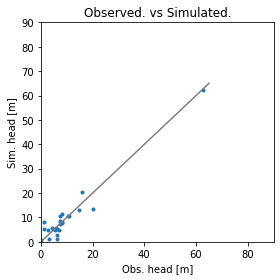

Error is - 2.8614092710090016
Params are - [7.70499334e-01 1.66822326e+01 1.04530257e+01 6.54884021e-01
 9.64494296e-01 3.66972351e-01 2.21387670e-03 5.86145851e-01
 1.68243069e-01 3.79699585e-01 1.88911588e-03 4.43247859e+00]


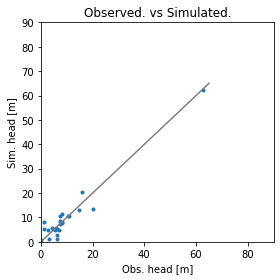

Error is - 2.8613668256592772
Params are - [7.69724467e-01 1.66718836e+01 1.09879009e+01 6.45369406e-01
 9.66167613e-01 3.64079367e-01 2.21050851e-03 5.99976033e-01
 1.68647251e-01 3.77751841e-01 1.88475922e-03 4.24677694e+00]


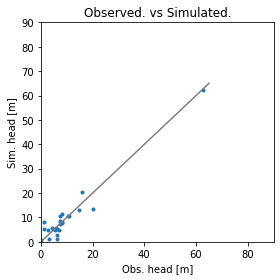

Error is - 2.861373988646296
Params are - [7.67253855e-01 1.68213536e+01 1.09243475e+01 6.48487283e-01
 9.64423960e-01 3.63329570e-01 2.21150992e-03 5.89619501e-01
 1.69011131e-01 3.78737451e-01 1.89682869e-03 4.30116375e+00]


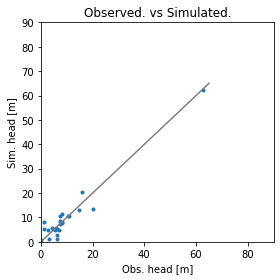

Error is - 2.861354246971306
Params are - [7.68701858e-01 1.67184984e+01 1.09642314e+01 6.46721758e-01
 9.66351862e-01 3.62765497e-01 2.20879219e-03 5.94085638e-01
 1.68985196e-01 3.79960505e-01 1.87483301e-03 4.27782525e+00]


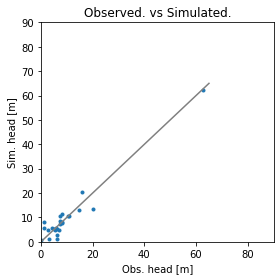

Error is - 2.86140907671264
Params are - [7.73056153e-01 1.67201350e+01 1.11666865e+01 6.39983295e-01
 9.64023334e-01 3.67431693e-01 2.21239877e-03 6.05761300e-01
 1.68567156e-01 3.75338354e-01 1.87545269e-03 4.22518453e+00]


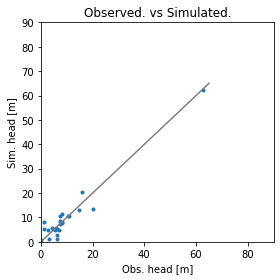

Error is - 2.8613635119751586
Params are - [7.68034721e-01 1.66909544e+01 1.07336992e+01 6.51282090e-01
 9.66222408e-01 3.63283978e-01 2.21065572e-03 5.90410141e-01
 1.68680758e-01 3.79920859e-01 1.88987052e-03 4.32918519e+00]


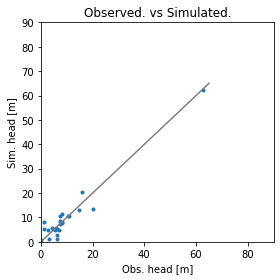

Error is - 2.861349761278013
Params are - [7.70612142e-01 1.66320860e+01 1.08927625e+01 6.42421076e-01
 9.68145847e-01 3.60822496e-01 2.20675891e-03 6.03127453e-01
 1.69306020e-01 3.79101885e-01 1.88179608e-03 4.29279345e+00]


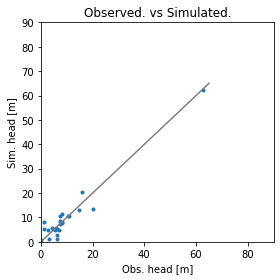

Error is - 2.8613578717111388
Params are - [7.66862471e-01 1.67225549e+01 1.10034757e+01 6.45907041e-01
 9.69876560e-01 3.70395891e-01 2.20799999e-03 5.89085199e-01
 1.69268287e-01 3.76084406e-01 1.88543209e-03 4.30775933e+00]


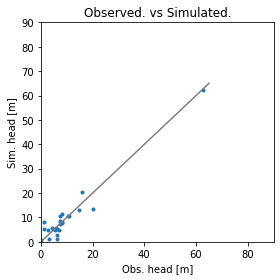

Error is - 2.861351729951658
Params are - [7.69374915e-01 1.66445265e+01 1.09071342e+01 6.45552515e-01
 9.66786730e-01 3.54713685e-01 2.21012978e-03 6.01907630e-01
 1.69145693e-01 3.81682147e-01 1.88601960e-03 4.28643488e+00]


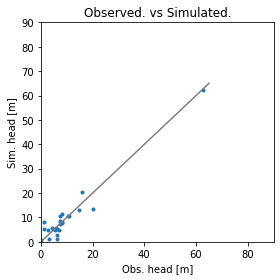

Error is - 2.861339812658922
Params are - [7.68584592e-01 1.67590054e+01 1.10119146e+01 6.47221624e-01
 9.67895014e-01 3.60007146e-01 2.21089674e-03 5.89371084e-01
 1.68487050e-01 3.80573396e-01 1.89182070e-03 4.30977586e+00]


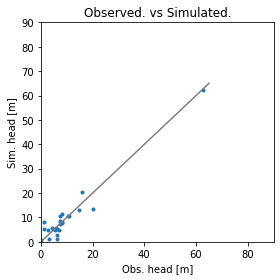

Error is - 2.8613674168223184
Params are - [7.67896018e-01 1.68252484e+01 1.11231689e+01 6.47718920e-01
 9.69166014e-01 3.56786223e-01 2.21155843e-03 5.83030238e-01
 1.68138201e-01 3.82286221e-01 1.89802814e-03 4.32211909e+00]


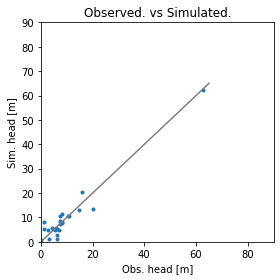

Error is - 2.8613752365391893
Params are - [7.71514266e-01 1.65537800e+01 1.08915673e+01 6.44750432e-01
 9.69402578e-01 3.62572832e-01 2.20885797e-03 6.01762956e-01
 1.68573318e-01 3.79289680e-01 1.87356316e-03 4.29513687e+00]


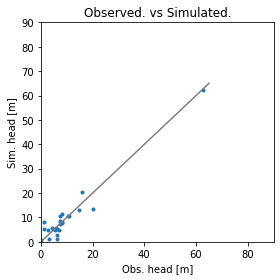

Error is - 2.8613543352513213
Params are - [7.68318958e-01 1.67544602e+01 1.09161525e+01 6.47553070e-01
 9.65668614e-01 3.63140386e-01 2.21084693e-03 5.92655365e-01
 1.68901678e-01 3.78875508e-01 1.89101231e-03 4.29965703e+00]


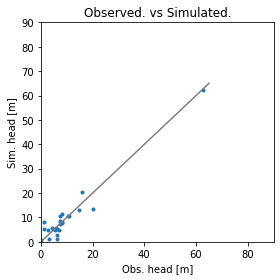

Error is - 2.8613506924822283
Params are - [7.71720718e-01 1.65012843e+01 1.08361716e+01 6.45670039e-01
 9.68769635e-01 3.60757605e-01 2.21064375e-03 6.00480379e-01
 1.68254873e-01 3.78591546e-01 1.89549102e-03 4.27948316e+00]


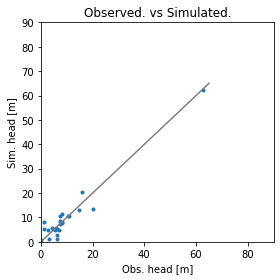

Error is - 2.8613335870867234
Params are - [7.73553637e-01 1.67647282e+01 1.07781543e+01 6.53009687e-01
 9.64286797e-01 3.60410911e-01 2.21070339e-03 5.89470785e-01
 1.68808202e-01 3.79553770e-01 1.88838958e-03 4.29468009e+00]


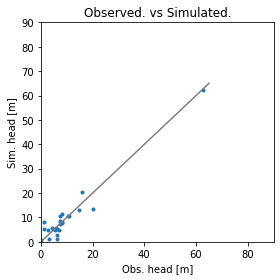

Error is - 2.8613508400393495
Params are - [7.77180633e-01 1.68569935e+01 1.06666436e+01 6.59012695e-01
 9.61677882e-01 3.58331474e-01 2.21108415e-03 5.83245233e-01
 1.68887618e-01 3.80119822e-01 1.88963332e-03 4.29384175e+00]


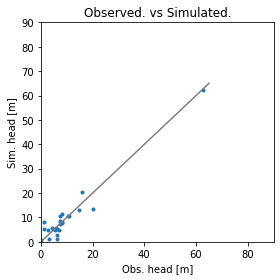

Error is - 2.861325961725402
Params are - [7.68342327e-01 1.66836116e+01 1.10807250e+01 6.43980188e-01
 9.68162996e-01 3.61428343e-01 2.20917772e-03 5.95595677e-01
 1.68432745e-01 3.79614008e-01 1.88782694e-03 4.28843411e+00]


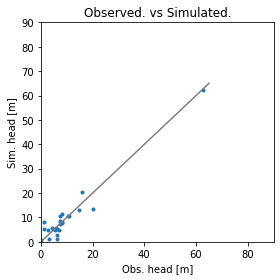

Error is - 2.861343583628985
Params are - [7.66612106e-01 1.66873736e+01 1.12661029e+01 6.40741090e-01
 9.69526110e-01 3.60590727e-01 2.20808739e-03 5.95946889e-01
 1.68152177e-01 3.80155131e-01 1.88837056e-03 4.28191569e+00]


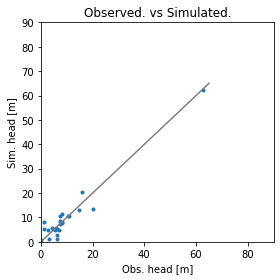

Error is - 2.8613110019420085
Params are - [7.70190271e-01 1.66897703e+01 1.08182638e+01 6.48837631e-01
 9.67764715e-01 3.60010712e-01 2.20980580e-03 5.89782837e-01
 1.68743623e-01 3.80704289e-01 1.89031870e-03 4.35007098e+00]


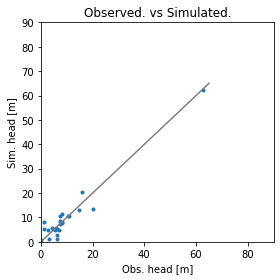

Error is - 2.8613066521282535
Params are - [7.70423173e-01 1.66987136e+01 1.07334452e+01 6.50571744e-01
 9.68563267e-01 3.57976385e-01 2.20945445e-03 5.84686239e-01
 1.68791810e-01 3.82180512e-01 1.89309844e-03 4.40171800e+00]


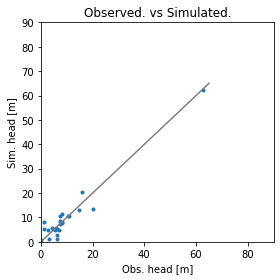

Error is - 2.8613067384457525
Params are - [7.72278093e-01 1.66719927e+01 1.10724232e+01 6.42806556e-01
 9.68100064e-01 3.59921503e-01 2.20945837e-03 5.98394745e-01
 1.68728625e-01 3.78911879e-01 1.88574539e-03 4.27975152e+00]


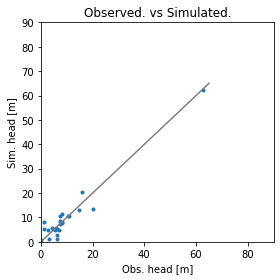

Error is - 2.861328467016847
Params are - [7.74352946e-01 1.66319651e+01 1.08141379e+01 6.47664858e-01
 9.64149828e-01 3.51063858e-01 2.21235716e-03 6.01271279e-01
 1.68051152e-01 3.83219578e-01 1.89023603e-03 4.29650942e+00]


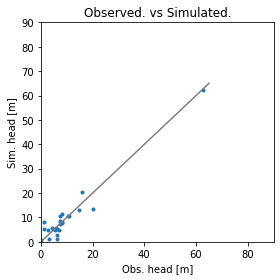

Error is - 2.8613036960942497
Params are - [7.73902124e-01 1.65796440e+01 1.08844587e+01 6.46037460e-01
 9.68104643e-01 3.56306609e-01 2.20976193e-03 5.99137099e-01
 1.68276007e-01 3.81152488e-01 1.88452643e-03 4.30408712e+00]


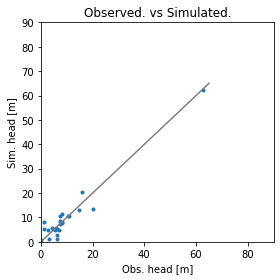

Error is - 2.8613131316903537
Params are - [7.76693707e-01 1.64922360e+01 1.08686118e+01 6.45279655e-01
 9.69322658e-01 3.52889721e-01 2.20921943e-03 6.02377966e-01
 1.67963172e-01 3.82290977e-01 1.88128349e-03 4.30630216e+00]


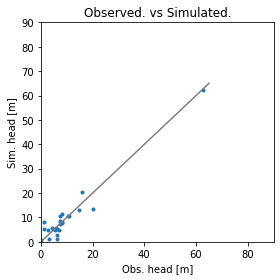

Error is - 2.861323211633141
Params are - [7.74385934e-01 1.65924634e+01 1.08230843e+01 6.46754722e-01
 9.67713525e-01 3.55605016e-01 2.21197829e-03 5.98548736e-01
 1.68074291e-01 3.80266154e-01 1.90232130e-03 4.33029588e+00]


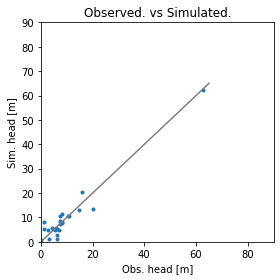

Error is - 2.861313876095802
Params are - [7.74548047e-01 1.66577581e+01 1.08661732e+01 6.48124333e-01
 9.67433124e-01 3.63805384e-01 2.21094879e-03 5.90166928e-01
 1.67735226e-01 3.78308514e-01 1.89385166e-03 4.32899641e+00]


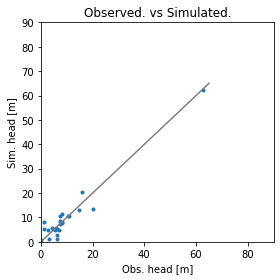

Error is - 2.861298526652495
Params are - [7.72673466e-01 1.68270794e+01 1.09421360e+01 6.48415858e-01
 9.65227467e-01 3.58269426e-01 2.21048566e-03 5.89875270e-01
 1.68539439e-01 3.81351943e-01 1.88410701e-03 4.34420034e+00]


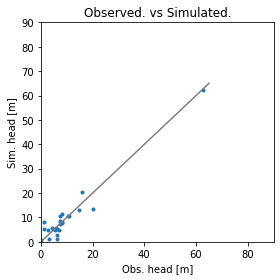

Error is - 2.861313329814539
Params are - [7.73149841e-01 1.69899769e+01 1.09951182e+01 6.49788767e-01
 9.63456382e-01 3.57025337e-01 2.21040662e-03 5.84572716e-01
 1.68681721e-01 3.82732141e-01 1.87841501e-03 4.37655892e+00]


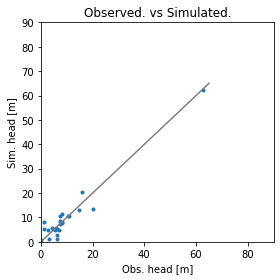

Error is - 2.8613005437584063
Params are - [7.74125596e-01 1.67287765e+01 1.08937741e+01 6.52663951e-01
 9.65364858e-01 3.57779024e-01 2.21499162e-03 5.85019499e-01
 1.67360528e-01 3.81216614e-01 1.89818711e-03 4.33945786e+00]


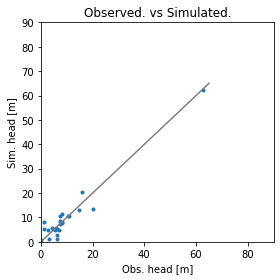

Error is - 2.8613081193979077
Params are - [7.73838633e-01 1.67183007e+01 1.08430630e+01 6.51122613e-01
 9.70926433e-01 3.53246513e-01 2.20637867e-03 5.89724675e-01
 1.68603411e-01 3.80673355e-01 1.89024797e-03 4.33239899e+00]


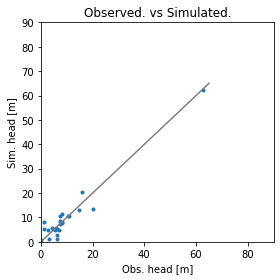

Error is - 2.8612890043123835
Params are - [7.71146037e-01 1.67423380e+01 1.10143880e+01 6.45677955e-01
 9.65875330e-01 3.53428204e-01 2.21113564e-03 5.89354059e-01
 1.68536102e-01 3.84261258e-01 1.89469339e-03 4.33216872e+00]


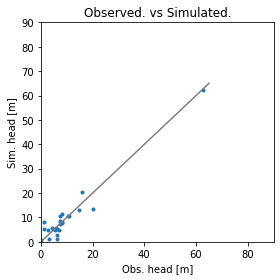

Error is - 2.861304368101533
Params are - [7.69708027e-01 1.67918394e+01 1.11334853e+01 6.43158111e-01
 9.64589993e-01 3.48871398e-01 2.21172188e-03 5.86102949e-01
 1.68748163e-01 3.87937332e-01 1.89852356e-03 4.34347863e+00]


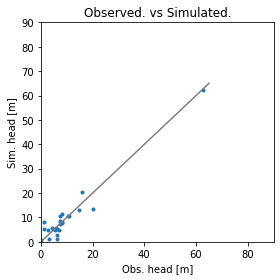

Error is - 2.86127527071072
Params are - [7.77010411e-01 1.66238898e+01 1.07790792e+01 6.48916697e-01
 9.66089708e-01 3.54866383e-01 2.21024188e-03 5.95836415e-01
 1.68169206e-01 3.81211617e-01 1.89038451e-03 4.33567388e+00]


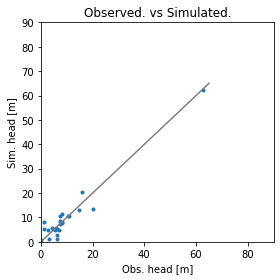

Error is - 2.861275052310171
Params are - [7.81223320e-01 1.65563320e+01 1.06626616e+01 6.49764233e-01
 9.65187055e-01 3.52296002e-01 2.20991445e-03 5.99069080e-01
 1.68010285e-01 3.81530727e-01 1.88966641e-03 4.34862289e+00]


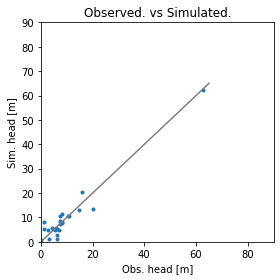

Error is - 2.8612977371160806
Params are - [7.73319646e-01 1.65834343e+01 1.09935907e+01 6.42587725e-01
 9.69847967e-01 3.53110134e-01 2.21030374e-03 5.97336429e-01
 1.67715068e-01 3.82560735e-01 1.89402844e-03 4.35976012e+00]


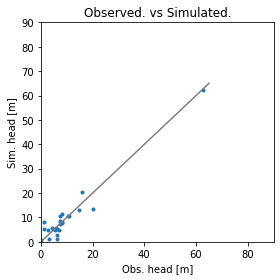

Error is - 2.8612841306927956
Params are - [7.72348120e-01 1.67081089e+01 1.09875159e+01 6.47086365e-01
 9.70934627e-01 3.62798232e-01 2.20830773e-03 5.84880127e-01
 1.68416104e-01 3.78785120e-01 1.89281405e-03 4.36847257e+00]


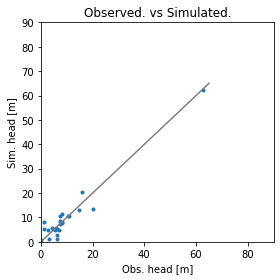

Error is - 2.861256996670424
Params are - [7.79026372e-01 1.66605454e+01 1.07053940e+01 6.51288731e-01
 9.67383397e-01 3.52662062e-01 2.21134217e-03 5.88769804e-01
 1.68031738e-01 3.82252542e-01 1.89605433e-03 4.38988763e+00]


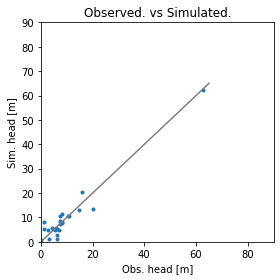

Error is - 2.8612541219900502
Params are - [7.84368394e-01 1.66490122e+01 1.05177285e+01 6.54943002e-01
 9.66993597e-01 3.48278922e-01 2.21242439e-03 5.85356868e-01
 1.67831234e-01 3.83571810e-01 1.90016802e-03 4.44061439e+00]


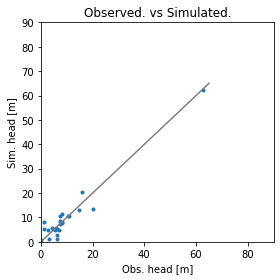

Error is - 2.8612402161258284
Params are - [7.74646507e-01 1.67611184e+01 1.09121421e+01 6.49878910e-01
 9.67712880e-01 3.57264373e-01 2.20861594e-03 5.83618101e-01
 1.68349682e-01 3.82151338e-01 1.88120109e-03 4.36641228e+00]


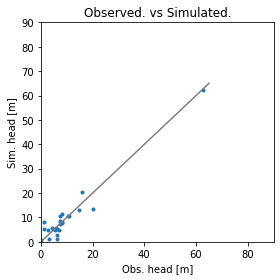

Error is - 2.8612751317218907
Params are - [7.74776794e-01 1.68454459e+01 1.09566709e+01 6.51441004e-01
 9.67712557e-01 3.58094052e-01 2.20693477e-03 5.76152783e-01
 1.68487378e-01 3.83093930e-01 1.87064098e-03 4.38447048e+00]


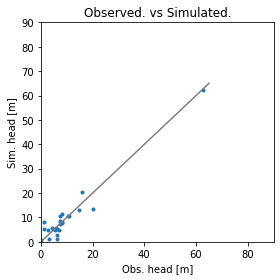

Error is - 2.861250424710557
Params are - [7.74500804e-01 1.67130503e+01 1.08767147e+01 6.48801729e-01
 9.68039907e-01 3.47973838e-01 2.20925664e-03 5.90908437e-01
 1.68791156e-01 3.84749449e-01 1.88756229e-03 4.37394772e+00]


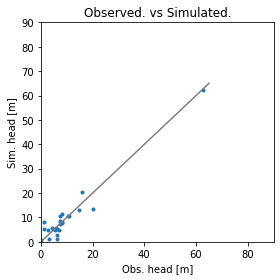

Error is - 2.861261563120604
Params are - [7.75320580e-01 1.66516327e+01 1.09054334e+01 6.45416635e-01
 9.64065511e-01 3.57653929e-01 2.21430643e-03 5.91547984e-01
 1.67954262e-01 3.83063957e-01 1.89071837e-03 4.37746993e+00]


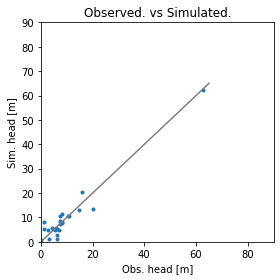

Error is - 2.8612458226034176
Params are - [7.77388202e-01 1.66945473e+01 1.06482416e+01 6.54167705e-01
 9.66219455e-01 3.50601010e-01 2.21203473e-03 5.81736787e-01
 1.67699988e-01 3.85517446e-01 1.89604979e-03 4.44640380e+00]


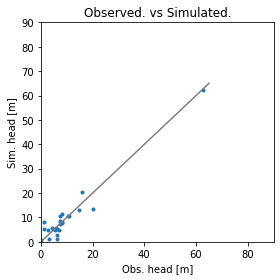

Error is - 2.861247837985344
Params are - [7.80403960e-01 1.66671320e+01 1.09730190e+01 6.47001845e-01
 9.65365616e-01 3.51316899e-01 2.21246870e-03 5.94953718e-01
 1.67454833e-01 3.82804968e-01 1.88918863e-03 4.33188496e+00]


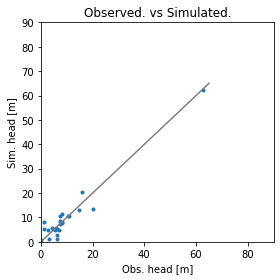

Error is - 2.8612123182125786
Params are - [7.78008648e-01 1.68007830e+01 1.08367656e+01 6.51696859e-01
 9.65367735e-01 3.52155056e-01 2.21261235e-03 5.79805627e-01
 1.67833773e-01 3.84108407e-01 1.89853767e-03 4.43414881e+00]


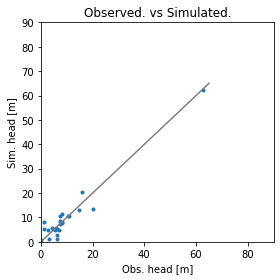

Error is - 2.8611912949158316
Params are - [7.80061910e-01 1.69113524e+01 1.08129191e+01 6.54526558e-01
 9.63999281e-01 3.50079280e-01 2.21403756e-03 5.70139892e-01
 1.67612656e-01 3.85586366e-01 1.90554329e-03 4.49917966e+00]


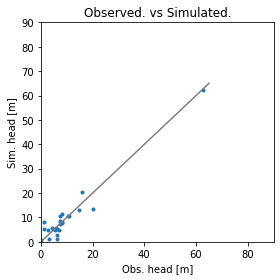

Error is - 2.8612079646315003
Params are - [7.78774562e-01 1.66820799e+01 1.08139744e+01 6.45380802e-01
 9.67879925e-01 3.49399350e-01 2.20722365e-03 5.91443292e-01
 1.68791274e-01 3.84772572e-01 1.88610302e-03 4.42539836e+00]


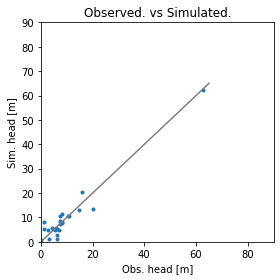

Error is - 2.8611999019099397
Params are - [7.81243541e-01 1.65596104e+01 1.07442522e+01 6.49123053e-01
 9.68459392e-01 3.47430602e-01 2.21118594e-03 5.86848859e-01
 1.67654335e-01 3.85207348e-01 1.90051578e-03 4.43418889e+00]


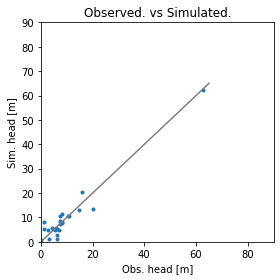

Error is - 2.86119863223435
Params are - [7.81918011e-01 1.67992848e+01 1.06512410e+01 6.56040407e-01
 9.63607462e-01 3.51643307e-01 2.21151490e-03 5.77639771e-01
 1.68468584e-01 3.84439658e-01 1.89167558e-03 4.43103391e+00]


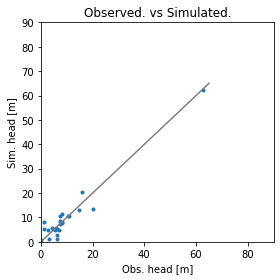

Error is - 2.861192683863291
Params are - [7.85886948e-01 1.66498722e+01 1.05699192e+01 6.54677252e-01
 9.67202120e-01 3.51027753e-01 2.21074620e-03 5.83669761e-01
 1.67636297e-01 3.82768868e-01 1.89050767e-03 4.47510284e+00]


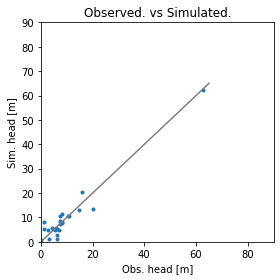

Error is - 2.861193542068296
Params are - [7.86941336e-01 1.66743952e+01 1.05271919e+01 6.54533990e-01
 9.61520740e-01 3.39695979e-01 2.21398053e-03 5.87941964e-01
 1.67626327e-01 3.88908965e-01 1.89200261e-03 4.45657070e+00]


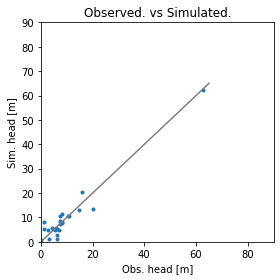

Error is - 2.861210111399573
Params are - [7.79019139e-01 1.68458493e+01 1.08294679e+01 6.52651082e-01
 9.66657259e-01 3.48098205e-01 2.21305149e-03 5.71898492e-01
 1.67968153e-01 3.87393064e-01 1.89553961e-03 4.49441168e+00]


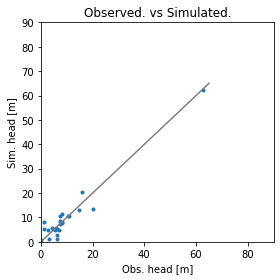

Error is - 2.8611811496645503
Params are - [7.85538306e-01 1.67829180e+01 1.05740351e+01 6.58204421e-01
 9.68210761e-01 3.41147657e-01 2.20845035e-03 5.76144673e-01
 1.68026491e-01 3.86581352e-01 1.89529119e-03 4.48505494e+00]


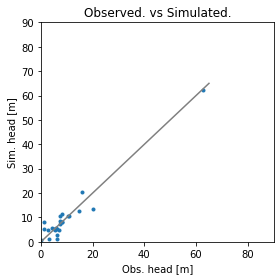

Error is - 2.8612101355499697
Params are - [7.90647169e-01 1.68485607e+01 1.04083360e+01 6.64598315e-01
 9.70283387e-01 3.32894521e-01 2.20552231e-03 5.68443018e-01
 1.68062606e-01 3.88340049e-01 1.89757760e-03 4.53884744e+00]


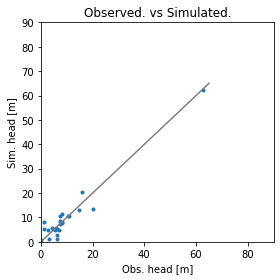

Error is - 2.861171581131442
Params are - [7.76685477e-01 1.68078561e+01 1.09711245e+01 6.49221624e-01
 9.65485536e-01 3.49334120e-01 2.20967005e-03 5.80800423e-01
 1.68182062e-01 3.86575089e-01 1.88502874e-03 4.42931724e+00]


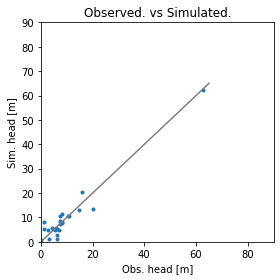

Error is - 2.861204954440358
Params are - [7.72844018e-01 1.68872781e+01 1.11978225e+01 6.46360935e-01
 9.64731505e-01 3.49861720e-01 2.20829288e-03 5.78522201e-01
 1.68357475e-01 3.88076729e-01 1.87745909e-03 4.42366866e+00]


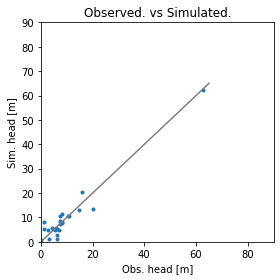

Error is - 2.8611685869192542
Params are - [7.86917179e-01 1.67596190e+01 1.06278733e+01 6.55432879e-01
 9.64013497e-01 3.49865919e-01 2.21290670e-03 5.73564185e-01
 1.67120624e-01 3.85701724e-01 1.89721220e-03 4.50521215e+00]


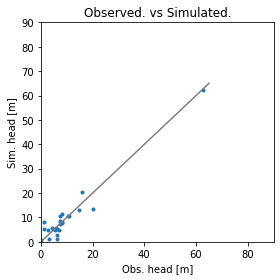

Error is - 2.8611942678320132
Params are - [7.93125366e-01 1.67829034e+01 1.05034527e+01 6.58748454e-01
 9.62000292e-01 3.50811959e-01 2.21473173e-03 5.64892059e-01
 1.66285358e-01 3.86177861e-01 1.90203716e-03 4.57084437e+00]


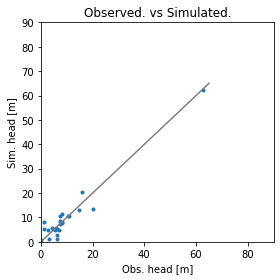

Error is - 2.8611942437808544
Params are - [7.82099560e-01 1.68209518e+01 1.04740447e+01 6.58637936e-01
 9.66462435e-01 3.46281027e-01 2.20976763e-03 5.65953982e-01
 1.68401246e-01 3.88128997e-01 1.89692313e-03 4.57616279e+00]


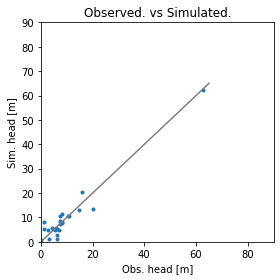

Error is - 2.861112260606043
Params are - [7.85900544e-01 1.68146040e+01 1.07697893e+01 6.52217114e-01
 9.65649093e-01 3.46276918e-01 2.20982376e-03 5.76540446e-01
 1.68272967e-01 3.85851778e-01 1.89020753e-03 4.48327044e+00]


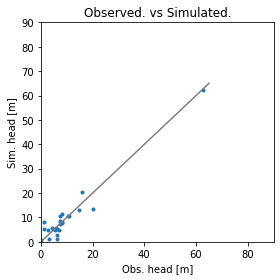

Error is - 2.8610585710684564
Params are - [7.90156715e-01 1.68746323e+01 1.08305631e+01 6.51241818e-01
 9.65363913e-01 3.44114872e-01 2.20871827e-03 5.73942276e-01
 1.68559457e-01 3.86018944e-01 1.88728640e-03 4.50170377e+00]


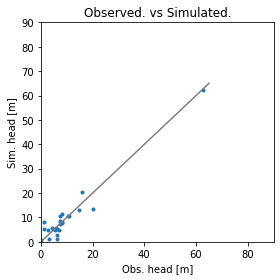

Error is - 2.8611165309400843
Params are - [7.91227273e-01 1.67669519e+01 1.04922923e+01 6.56733061e-01
 9.63764174e-01 3.37421972e-01 2.21325960e-03 5.73046494e-01
 1.67658235e-01 3.89862486e-01 1.90607045e-03 4.58581054e+00]


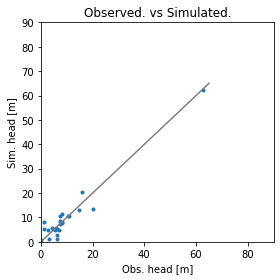

Error is - 2.8611633146290885
Params are - [7.88889331e-01 1.66690713e+01 1.05187705e+01 6.54641218e-01
 9.64337613e-01 3.44808768e-01 2.20885874e-03 5.84957436e-01
 1.67988111e-01 3.85032331e-01 1.89348706e-03 4.47304428e+00]


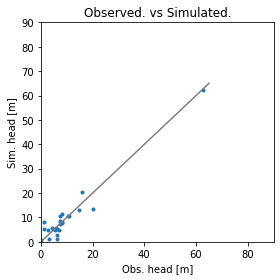

Error is - 2.861131787044826
Params are - [7.90819702e-01 1.68306727e+01 1.04850634e+01 6.63454901e-01
 9.62524563e-01 3.42742525e-01 2.21495910e-03 5.64331660e-01
 1.67031131e-01 3.87696116e-01 1.90415433e-03 4.54999859e+00]


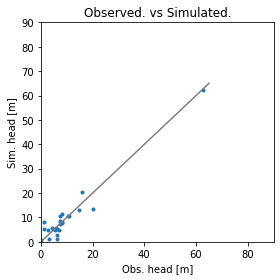

Error is - 2.8611474932804515
Params are - [7.89946751e-01 1.69983193e+01 1.05115875e+01 6.62101291e-01
 9.60955957e-01 3.43929927e-01 2.21162567e-03 5.65173228e-01
 1.68064202e-01 3.87676134e-01 1.89034799e-03 4.56050967e+00]


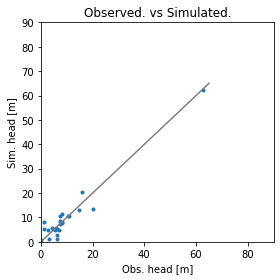

Error is - 2.861103373862838
Params are - [7.90610404e-01 1.67918173e+01 1.05813231e+01 6.56194085e-01
 9.65365970e-01 3.38431660e-01 2.21131517e-03 5.72304558e-01
 1.67182556e-01 3.88983237e-01 1.89896693e-03 4.58524395e+00]


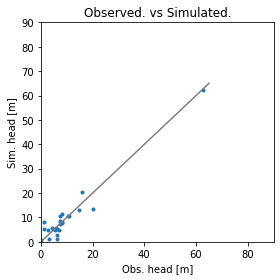

Error is - 2.8611424062262083
Params are - [7.91847329e-01 1.67652945e+01 1.07763992e+01 6.53189247e-01
 9.62328252e-01 3.42485712e-01 2.21332036e-03 5.85048776e-01
 1.67046779e-01 3.85436272e-01 1.89406001e-03 4.44162860e+00]


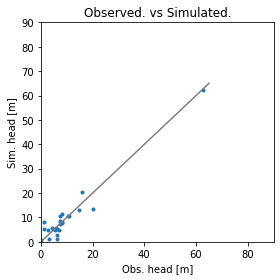

Error is - 2.861114687904676
Params are - [7.87823218e-01 1.69270010e+01 1.07647865e+01 6.57069069e-01
 9.67404533e-01 3.49535716e-01 2.20899744e-03 5.62578596e-01
 1.67725106e-01 3.84077522e-01 1.89932344e-03 4.55873034e+00]


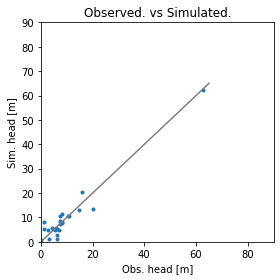

Error is - 2.861071684282372
Params are - [7.89200317e-01 1.69977121e+01 1.07545371e+01 6.57324443e-01
 9.61756888e-01 3.37955268e-01 2.21194030e-03 5.63335606e-01
 1.67729938e-01 3.90435727e-01 1.90228767e-03 4.55413611e+00]


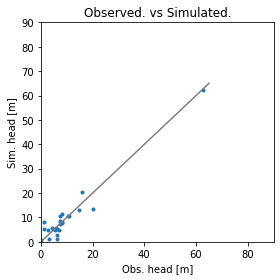

Error is - 2.861071428368515
Params are - [7.96548423e-01 1.67506251e+01 1.05018069e+01 6.57941451e-01
 9.64585995e-01 3.36883073e-01 2.20829939e-03 5.75731427e-01
 1.67773126e-01 3.88426456e-01 1.88670945e-03 4.53921870e+00]


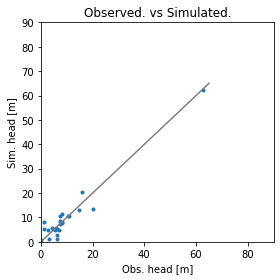

Error is - 2.8610577389901115
Params are - [7.92907047e-01 1.68736774e+01 1.07286528e+01 6.54219760e-01
 9.59770387e-01 3.45103932e-01 2.21386145e-03 5.69657771e-01
 1.67317063e-01 3.87738988e-01 1.89553126e-03 4.56237072e+00]


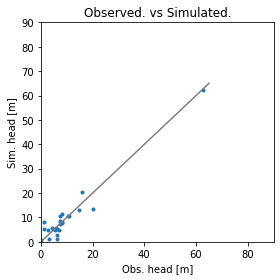

Error is - 2.861047282218643
Params are - [7.96591418e-01 1.69190571e+01 1.08059616e+01 6.52227429e-01
 9.55550199e-01 3.47082069e-01 2.21656699e-03 5.66414320e-01
 1.66962350e-01 3.88317806e-01 1.89565129e-03 4.60102862e+00]


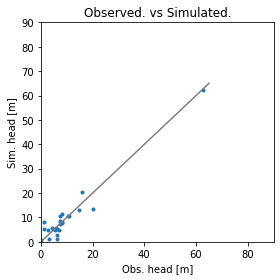

Error is - 2.8610969757057148
Params are - [8.05077533e-01 1.68672728e+01 1.03040363e+01 6.63703525e-01
 9.60839723e-01 3.36542126e-01 2.21379124e-03 5.62604337e-01
 1.66958208e-01 3.88035703e-01 1.90756414e-03 4.64672699e+00]


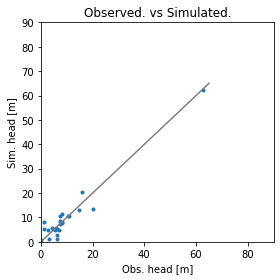

Error is - 2.8610133888700116
Params are - [7.97872557e-01 1.69334522e+01 1.05933146e+01 6.58870711e-01
 9.61782800e-01 3.33789696e-01 2.21070201e-03 5.68013934e-01
 1.67992576e-01 3.89298066e-01 1.89710599e-03 4.59441787e+00]


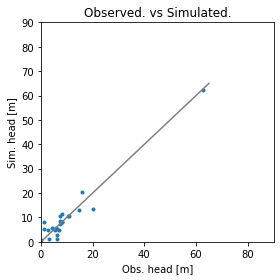

Error is - 2.860970015347512
Params are - [8.03350246e-01 1.70203688e+01 1.05760352e+01 6.60589626e-01
 9.60667451e-01 3.25751585e-01 2.20959967e-03 5.65238809e-01
 1.68428552e-01 3.91096237e-01 1.89705288e-03 4.63902074e+00]


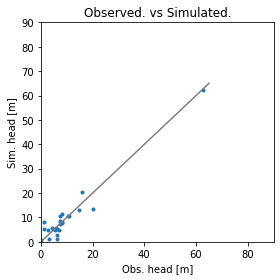

Error is - 2.8610148641963224
Params are - [7.98310558e-01 1.70825495e+01 1.07119615e+01 6.60653773e-01
 9.60846990e-01 3.35670650e-01 2.21487346e-03 5.53334245e-01
 1.67198495e-01 3.90978109e-01 1.90142543e-03 4.65424849e+00]


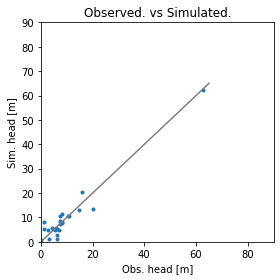

Error is - 2.8609929791703133
Params are - [7.98647105e-01 1.67673399e+01 1.07525402e+01 6.52952447e-01
 9.64210485e-01 3.35172944e-01 2.21264783e-03 5.71145290e-01
 1.66978120e-01 3.88884635e-01 1.90641075e-03 4.58240623e+00]


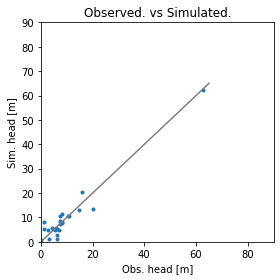

Error is - 2.8610108564196133
Params are - [7.97879824e-01 1.70007056e+01 1.04837520e+01 6.61825024e-01
 9.63151895e-01 3.35398365e-01 2.21084105e-03 5.48952493e-01
 1.67984100e-01 3.91699225e-01 1.90475718e-03 4.72475024e+00]


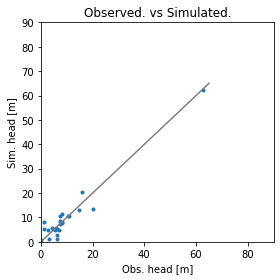

Error is - 2.8609600903423384
Params are - [8.00084137e-01 1.69636662e+01 1.07748692e+01 6.51287725e-01
 9.63060140e-01 3.33917525e-01 2.20851597e-03 5.67106415e-01
 1.68158577e-01 3.90106566e-01 1.89476333e-03 4.64550553e+00]


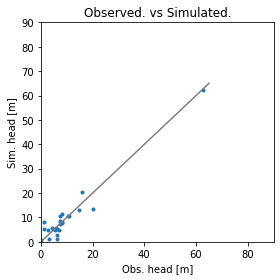

Error is - 2.860926938833607
Params are - [8.04716354e-01 1.70301629e+01 1.09197721e+01 6.45204136e-01
 9.63327929e-01 3.29505024e-01 2.20529440e-03 5.68493792e-01
 1.68722300e-01 3.91311790e-01 1.89006783e-03 4.69325900e+00]


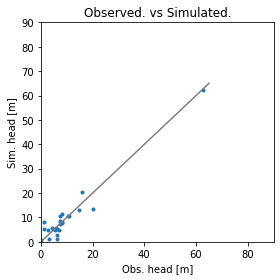

Error is - 2.860963030813095
Params are - [8.01924746e-01 1.70712555e+01 1.08388869e+01 6.56088077e-01
 9.61747821e-01 3.37918587e-01 2.20888794e-03 5.57632797e-01
 1.67708816e-01 3.88181746e-01 1.89018012e-03 4.62760165e+00]


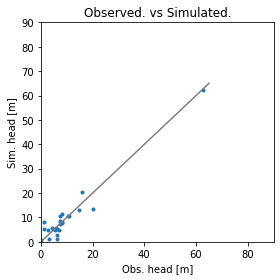

Error is - 2.860923257328588
Params are - [8.07679056e-01 1.69352488e+01 1.05787428e+01 6.55588570e-01
 9.57164677e-01 3.23868655e-01 2.21313185e-03 5.67276395e-01
 1.67639230e-01 3.94650748e-01 1.89540324e-03 4.66616041e+00]


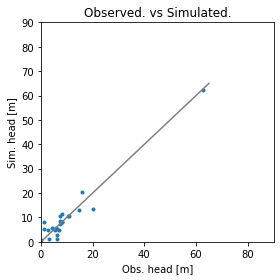

Error is - 2.8608892316329895
Params are - [8.17606975e-01 1.69393727e+01 1.04857209e+01 6.54848320e-01
 9.52044749e-01 3.11035125e-01 2.21519906e-03 5.69625295e-01
 1.67596292e-01 3.99937360e-01 1.89344315e-03 4.71987544e+00]


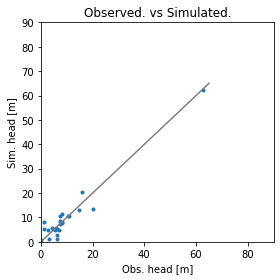

Error is - 2.86089505550048
Params are - [8.09391298e-01 1.70950251e+01 1.07462725e+01 6.56239260e-01
 9.56983036e-01 3.30406621e-01 2.21146143e-03 5.57103890e-01
 1.68250736e-01 3.91570719e-01 1.89483912e-03 4.66208538e+00]


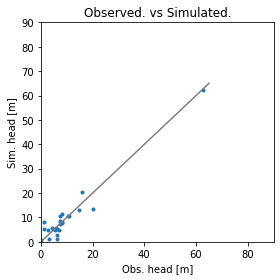

Error is - 2.8609316299946275
Params are - [7.95643130e-01 1.70575283e+01 1.10972654e+01 6.47485776e-01
 9.60866502e-01 3.31273571e-01 2.20859706e-03 5.65887369e-01
 1.68690506e-01 3.93107423e-01 1.88412108e-03 4.60316208e+00]


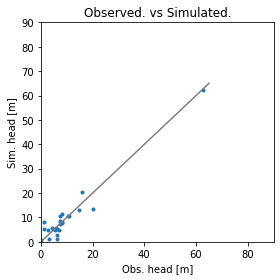

Error is - 2.8608572260763663
Params are - [8.12594148e-01 1.69370584e+01 1.07038860e+01 6.52225080e-01
 9.59800940e-01 3.28746813e-01 2.20989079e-03 5.65581394e-01
 1.68078870e-01 3.91152681e-01 1.88636977e-03 4.70392394e+00]


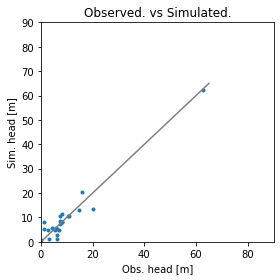

Error is - 2.8608208410506513
Params are - [8.24291063e-01 1.69067315e+01 1.06785604e+01 6.49675398e-01
 9.58822966e-01 3.24142585e-01 2.20886604e-03 5.66704289e-01
 1.68253336e-01 3.91511158e-01 1.87841082e-03 4.77881786e+00]


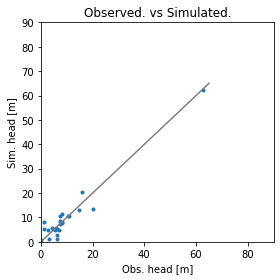

Error is - 2.8608457299927657
Params are - [8.09869815e-01 1.72101630e+01 1.09860751e+01 6.50230397e-01
 9.56011327e-01 3.27695593e-01 2.21362614e-03 5.51681050e-01
 1.68115717e-01 3.93676069e-01 1.90056489e-03 4.75877454e+00]


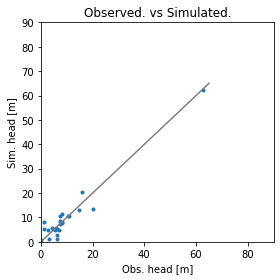

Error is - 2.8607990179415532
Params are - [8.19547041e-01 1.71420777e+01 1.06832376e+01 6.56761459e-01
 9.53674646e-01 3.17727248e-01 2.21402524e-03 5.49759997e-01
 1.67255430e-01 3.97359769e-01 1.90220102e-03 4.83913461e+00]


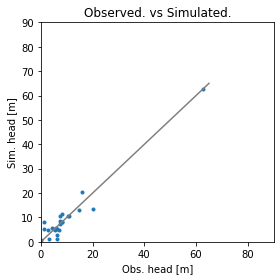

Error is - 2.860746890230235
Params are - [8.34242203e-01 1.72758004e+01 1.06095748e+01 6.59521280e-01
 9.47830012e-01 3.04533435e-01 2.21667872e-03 5.37668858e-01
 1.66603416e-01 4.03030182e-01 1.90965833e-03 5.00785004e+00]


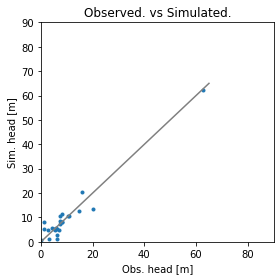

Error is - 2.8608351206083644
Params are - [8.19387468e-01 1.71571101e+01 1.06751079e+01 6.56991490e-01
 9.62201661e-01 3.07668612e-01 2.20619514e-03 5.52497043e-01
 1.68792715e-01 3.97512969e-01 1.89617064e-03 4.80761333e+00]


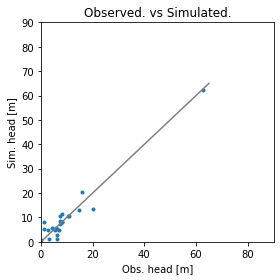

Error is - 2.8608036373056276
Params are - [8.21181147e-01 1.70060445e+01 1.07629657e+01 6.47954766e-01
 9.57130649e-01 3.14413025e-01 2.20644229e-03 5.65437584e-01
 1.68822273e-01 3.95941810e-01 1.88952070e-03 4.77995427e+00]


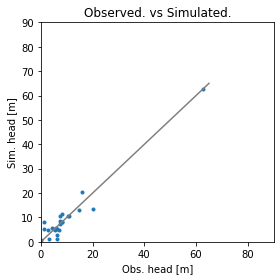

Error is - 2.8608519950697224
Params are - [8.25495435e-01 1.70887782e+01 1.10377108e+01 6.44471805e-01
 9.53822203e-01 3.11187753e-01 2.20974156e-03 5.72566851e-01
 1.68176363e-01 3.95927792e-01 1.88364954e-03 4.71865319e+00]


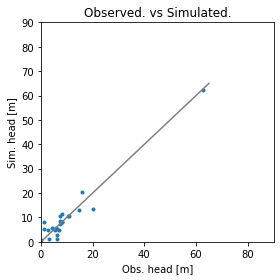

Error is - 2.8608486713618286
Params are - [8.29202875e-01 1.73757169e+01 1.08164511e+01 6.51930942e-01
 9.51032233e-01 3.07415642e-01 2.20745041e-03 5.50610981e-01
 1.69382050e-01 3.99916241e-01 1.87820244e-03 4.88370502e+00]


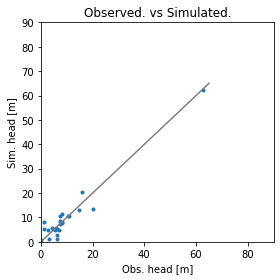

Error is - 2.8607402211783852
Params are - [8.28808506e-01 1.71819128e+01 1.10330254e+01 6.42850648e-01
 9.52969397e-01 3.13781011e-01 2.21014036e-03 5.54079491e-01
 1.68090535e-01 3.99174640e-01 1.88441856e-03 4.86787123e+00]


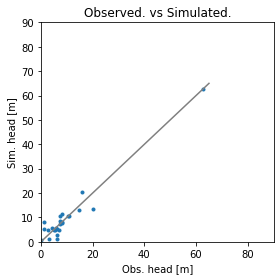

Error is - 2.860753137893807
Params are - [8.41537636e-01 1.72626848e+01 1.12615205e+01 6.33981159e-01
 9.49120370e-01 3.07795724e-01 2.21041071e-03 5.48499833e-01
 1.67921527e-01 4.03213842e-01 1.87810140e-03 4.98229648e+00]


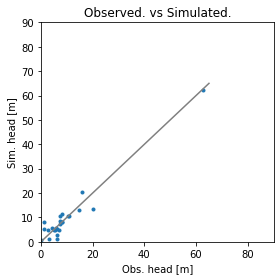

Error is - 2.8607560908605794
Params are - [8.34714633e-01 1.71494689e+01 1.08025301e+01 6.45145959e-01
 9.50425956e-01 2.97591080e-01 2.21106083e-03 5.61093285e-01
 1.68873890e-01 4.03921280e-01 1.89033106e-03 4.91933524e+00]


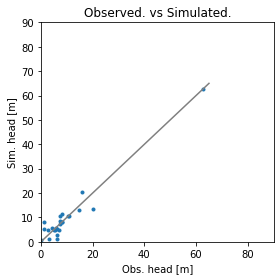

Error is - 2.860825105051908
Params are - [8.47508165e-01 1.71785195e+01 1.04950291e+01 6.53358291e-01
 9.49567185e-01 2.98622347e-01 2.21176234e-03 5.52039699e-01
 1.67922764e-01 4.00797912e-01 1.89742510e-03 4.99647035e+00]


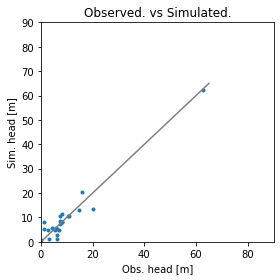

Error is - 2.8607070240028607
Params are - [8.45566910e-01 1.72306111e+01 1.06017319e+01 6.56998956e-01
 9.44812301e-01 2.95243781e-01 2.21614299e-03 5.46690928e-01
 1.67757715e-01 4.04174565e-01 1.89270456e-03 4.95690864e+00]


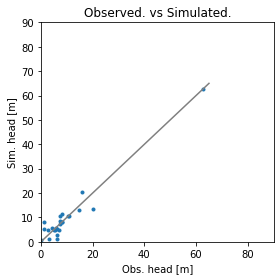

Error is - 2.8607304483692406
Params are - [8.65992188e-01 1.73308352e+01 1.04427118e+01 6.62896366e-01
 9.35554487e-01 2.78113159e-01 2.22156728e-03 5.35789496e-01
 1.67275422e-01 4.10605952e-01 1.89402292e-03 5.08873347e+00]


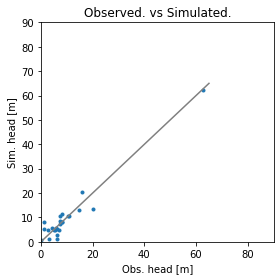

Error is - 2.860740189797745
Params are - [8.46921234e-01 1.71883465e+01 1.07511414e+01 6.46090448e-01
 9.49128737e-01 2.88481710e-01 2.21075622e-03 5.56345336e-01
 1.68147108e-01 4.06016277e-01 1.88757751e-03 5.03721948e+00]


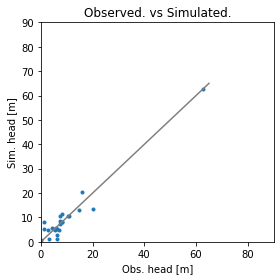

Error is - 2.86073769880323
Params are - [8.43591267e-01 1.73854945e+01 1.10559297e+01 6.46021743e-01
 9.53581022e-01 3.04094304e-01 2.20627811e-03 5.41610604e-01
 1.68893355e-01 3.98662789e-01 1.88799588e-03 5.03232009e+00]


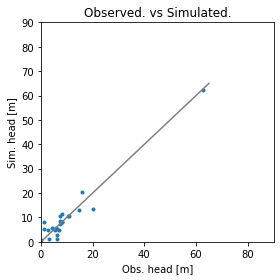

Error is - 2.860710963406263
Params are - [8.38718780e-01 1.72855418e+01 1.05069763e+01 6.56656582e-01
 9.51763371e-01 3.02759435e-01 2.21115837e-03 5.33509674e-01
 1.68432783e-01 4.03128190e-01 1.89851388e-03 5.08582016e+00]


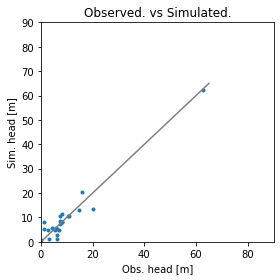

Error is - 2.8606842766391205
Params are - [8.36597324e-01 1.69835738e+01 1.06766569e+01 6.49985051e-01
 9.54675198e-01 3.05755511e-01 2.21406751e-03 5.52615326e-01
 1.67068885e-01 3.99675066e-01 1.90734622e-03 4.95445419e+00]


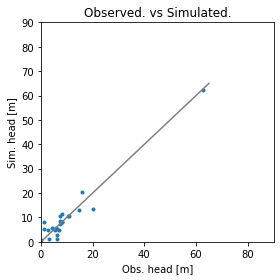

Error is - 2.8607227848817436
Params are - [8.40294549e-01 1.67875023e+01 1.06067597e+01 6.49012105e-01
 9.56496680e-01 3.04925445e-01 2.21737606e-03 5.53617498e-01
 1.65912302e-01 3.99554479e-01 1.92191811e-03 4.98982877e+00]


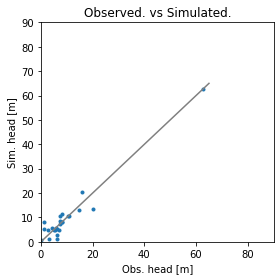

Error is - 2.860808372828205
Params are - [8.60384968e-01 1.71113629e+01 1.04554632e+01 6.51644706e-01
 9.49473415e-01 2.81818879e-01 2.20796535e-03 5.51700969e-01
 1.68160745e-01 4.06915070e-01 1.88611399e-03 5.11199794e+00]


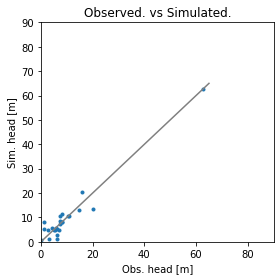

Error is - 2.8607974961301235
Params are - [8.57700232e-01 1.71567913e+01 1.07298229e+01 6.43992481e-01
 9.41161707e-01 2.97537571e-01 2.21569138e-03 5.50752298e-01
 1.67378419e-01 4.04645187e-01 1.88883213e-03 5.11388992e+00]


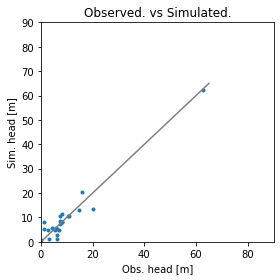

Error is - 2.86063841123351
Params are - [8.31278213e-01 1.71317604e+01 1.09490340e+01 6.46064712e-01
 9.52395271e-01 3.06403041e-01 2.21077902e-03 5.50995075e-01
 1.68157646e-01 4.02001457e-01 1.88614550e-03 4.94460283e+00]


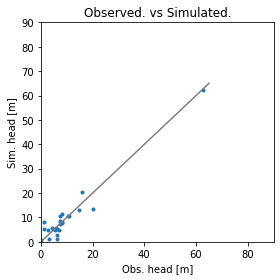

Error is - 2.8606199588034333
Params are - [8.23163236e-01 1.71083809e+01 1.11760365e+01 6.42417923e-01
 9.53809313e-01 3.10293388e-01 2.21028736e-03 5.50472762e-01
 1.68275087e-01 4.02603229e-01 1.88050570e-03 4.91866907e+00]


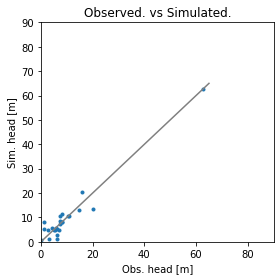

Error is - 2.860638028679075
Params are - [8.54307344e-01 1.74371567e+01 1.08484154e+01 6.48538026e-01
 9.42303881e-01 2.78574603e-01 2.21391221e-03 5.33625231e-01
 1.67830699e-01 4.13136889e-01 1.90550893e-03 5.18556385e+00]


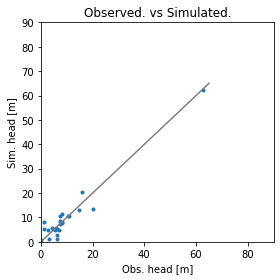

Error is - 2.8607678990583634
Params are - [8.17200501e-01 1.72868243e+01 1.11370046e+01 6.46050939e-01
 9.50458509e-01 3.20357596e-01 2.21580404e-03 5.45615927e-01
 1.67868282e-01 3.98769947e-01 1.90103825e-03 4.86464476e+00]


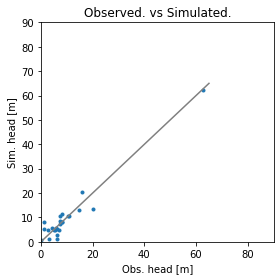

Error is - 2.8606097734421185
Params are - [8.55740881e-01 1.74389393e+01 1.08918420e+01 6.49423573e-01
 9.41689252e-01 2.88754213e-01 2.21888740e-03 5.28575703e-01
 1.67047756e-01 4.10214564e-01 1.89955114e-03 5.21080351e+00]


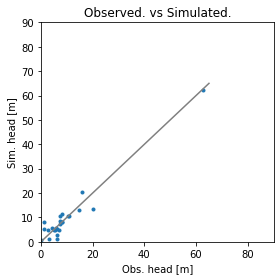

Error is - 2.860614523269329
Params are - [8.73020749e-01 1.76553868e+01 1.09562801e+01 6.50157977e-01
 9.33968553e-01 2.75924807e-01 2.22510995e-03 5.10144762e-01
 1.66160498e-01 4.17350941e-01 1.90456636e-03 5.42622813e+00]


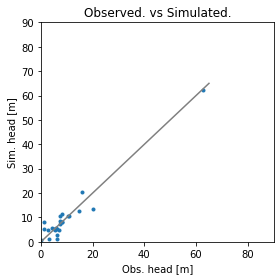

Error is - 2.860740961971161
Params are - [8.18895238e-01 1.73352172e+01 1.09519879e+01 6.54291040e-01
 9.57746118e-01 3.04165773e-01 2.21017097e-03 5.39564889e-01
 1.68436499e-01 4.02439416e-01 1.90202621e-03 4.89302013e+00]


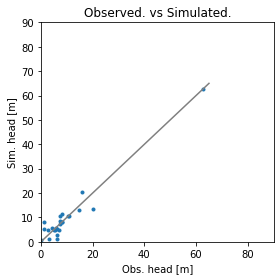

Error is - 2.860731485019977
Params are - [8.59677425e-01 1.72132497e+01 1.05139701e+01 6.53605933e-01
 9.49663917e-01 2.78647111e-01 2.20911947e-03 5.43692754e-01
 1.68041339e-01 4.08926234e-01 1.88998474e-03 5.14699451e+00]


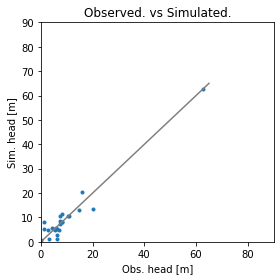

Error is - 2.860612508211352
Params are - [8.46323759e-01 1.73612352e+01 1.08003513e+01 6.55920908e-01
 9.49569464e-01 2.98256299e-01 2.21353912e-03 5.25315308e-01
 1.66896972e-01 4.04609060e-01 1.90063421e-03 5.13024724e+00]


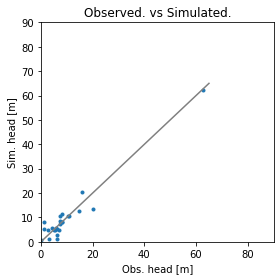

Error is - 2.860632621824102
Params are - [8.48809781e-01 1.72491428e+01 1.10251026e+01 6.40945526e-01
 9.52455316e-01 2.90267754e-01 2.20739796e-03 5.46680810e-01
 1.69216373e-01 4.05763305e-01 1.87980293e-03 5.06213198e+00]


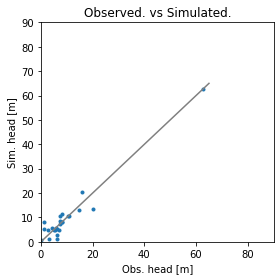

Error is - 2.860784184800015
Params are - [8.69142503e-01 1.71753803e+01 1.06948753e+01 6.43951513e-01
 9.41657410e-01 2.88319080e-01 2.21344354e-03 5.45970765e-01
 1.67513269e-01 4.06908053e-01 1.88373116e-03 5.20514720e+00]


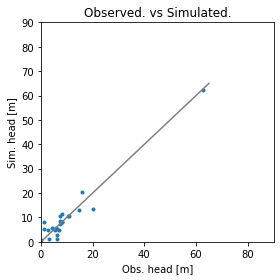

Error is - 2.8606575059192907
Params are - [8.31457054e-01 1.72952580e+01 1.08877098e+01 6.51706158e-01
 9.53723941e-01 3.00204100e-01 2.21098911e-03 5.41166358e-01
 1.68205692e-01 4.03556575e-01 1.89745245e-03 4.97105190e+00]


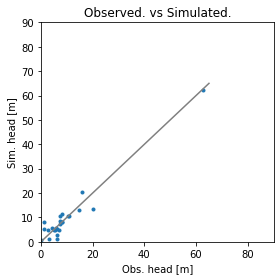

Error is - 2.8606140979456525
Params are - [8.59670660e-01 1.73475756e+01 1.05896186e+01 6.56867823e-01
 9.46559888e-01 2.76441024e-01 2.21361561e-03 5.29303974e-01
 1.67878426e-01 4.10903151e-01 1.90351113e-03 5.24749287e+00]


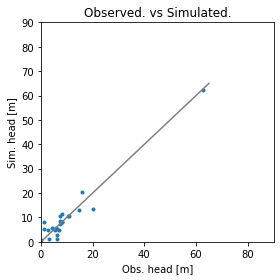

Error is - 2.860551476199973
Params are - [8.43682836e-01 1.73676801e+01 1.08445821e+01 6.55424252e-01
 9.49972407e-01 2.99733544e-01 2.21347632e-03 5.22531236e-01
 1.67777072e-01 4.04875992e-01 1.90300778e-03 5.11319019e+00]


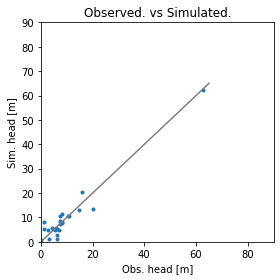

Error is - 2.860540809498457
Params are - [8.42063636e-01 1.74573468e+01 1.08913025e+01 6.60091154e-01
 9.50394242e-01 3.05359460e-01 2.21483637e-03 5.05624185e-01
 1.67592054e-01 4.04305850e-01 1.91072292e-03 5.15117555e+00]


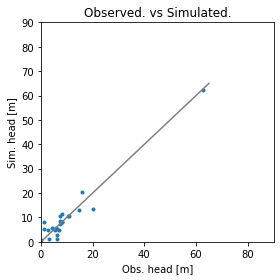

Error is - 2.860532867431999
Params are - [8.46758197e-01 1.71825075e+01 1.05123559e+01 6.57837859e-01
 9.44988992e-01 2.84331809e-01 2.21938080e-03 5.31268231e-01
 1.66813942e-01 4.13169991e-01 1.90637726e-03 5.13789882e+00]


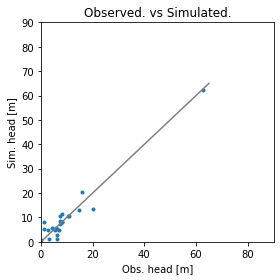

Error is - 2.8605324274996065
Params are - [8.48341662e-01 1.70810139e+01 1.02405690e+01 6.63745918e-01
 9.40692976e-01 2.74450561e-01 2.22593214e-03 5.26097044e-01
 1.65774235e-01 4.20423592e-01 1.91556795e-03 5.19068819e+00]


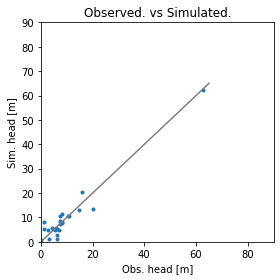

Error is - 2.860604897802038
Params are - [8.28782746e-01 1.73327130e+01 1.10087487e+01 6.51943667e-01
 9.47410940e-01 3.09079577e-01 2.21934156e-03 5.26253463e-01
 1.67288107e-01 4.04822772e-01 1.90865226e-03 5.03050668e+00]


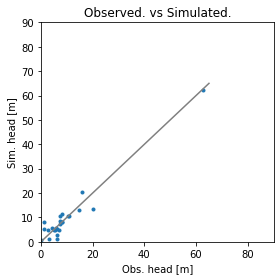

Error is - 2.8604798823597153
Params are - [8.48085386e-01 1.72682828e+01 1.10993712e+01 6.48107532e-01
 9.44586081e-01 2.86020610e-01 2.21866652e-03 5.35227175e-01
 1.66705884e-01 4.10903246e-01 1.90181285e-03 5.08246212e+00]


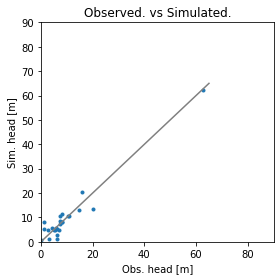

Error is - 2.8604573114152965
Params are - [8.52768689e-01 1.72596533e+01 1.13955686e+01 6.43833007e-01
 9.40997435e-01 2.77651198e-01 2.22242060e-03 5.36085925e-01
 1.65842434e-01 4.14790774e-01 1.90346234e-03 5.08078309e+00]


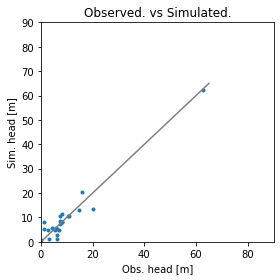

Error is - 2.8604766720248094
Params are - [8.42437552e-01 1.73280539e+01 1.11369217e+01 6.45570833e-01
 9.50901340e-01 2.90604167e-01 2.21472817e-03 5.20278420e-01
 1.67061738e-01 4.11626239e-01 1.90941514e-03 5.23201938e+00]


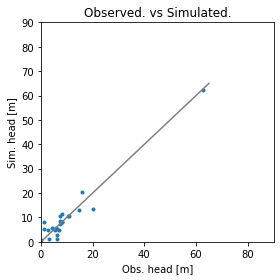

Error is - 2.860459659550402
Params are - [8.52380510e-01 1.76325044e+01 1.11387076e+01 6.51849035e-01
 9.40409467e-01 2.77567213e-01 2.21691375e-03 5.08964538e-01
 1.67749378e-01 4.18117600e-01 1.89511830e-03 5.28073470e+00]


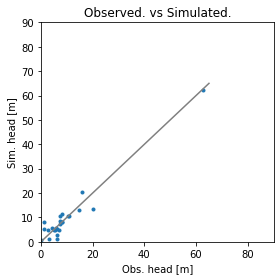

Error is - 2.860389387160985
Params are - [8.61008022e-01 1.73770280e+01 1.09694876e+01 6.50151741e-01
 9.39141645e-01 2.79345810e-01 2.22097959e-03 5.15046536e-01
 1.66536518e-01 4.16662929e-01 1.90462304e-03 5.31575079e+00]


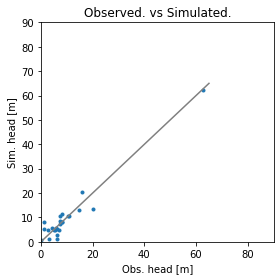

Error is - 2.8603212947523624
Params are - [8.75783506e-01 1.74179130e+01 1.10103765e+01 6.49374532e-01
 9.31850497e-01 2.68916665e-01 2.22597483e-03 5.01986624e-01
 1.65701932e-01 4.23216106e-01 1.90820834e-03 5.48810024e+00]


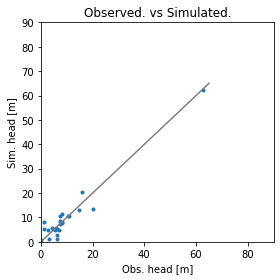

Error is - 2.860413903960159
Params are - [8.41737093e-01 1.72319220e+01 1.10357755e+01 6.53459290e-01
 9.48819475e-01 2.99365651e-01 2.22006693e-03 5.17314562e-01
 1.66556716e-01 4.08762484e-01 1.89701646e-03 5.15166156e+00]


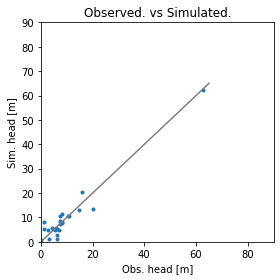

Error is - 2.8604849044864418
Params are - [8.46055874e-01 1.74170657e+01 1.08608671e+01 6.63137418e-01
 9.38062065e-01 2.89188815e-01 2.22869268e-03 4.99364609e-01
 1.64727766e-01 4.16635932e-01 1.92559139e-03 5.29001503e+00]


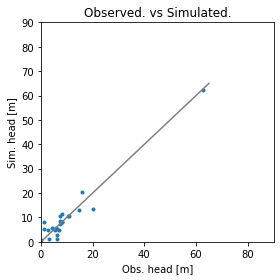

Error is - 2.8604220978919472
Params are - [8.75517859e-01 1.76092752e+01 1.06574050e+01 6.65118270e-01
 9.34083527e-01 2.65645753e-01 2.22887083e-03 4.87054630e-01
 1.65077832e-01 4.22134792e-01 1.93240289e-03 5.49536894e+00]


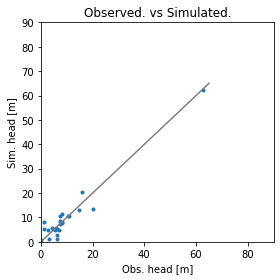

Error is - 2.8605368622640834
Params are - [8.41651635e-01 1.74136970e+01 1.12551207e+01 6.52043445e-01
 9.39253558e-01 2.97698905e-01 2.22808512e-03 5.01181861e-01
 1.65007728e-01 4.15706810e-01 1.91421276e-03 5.20785781e+00]


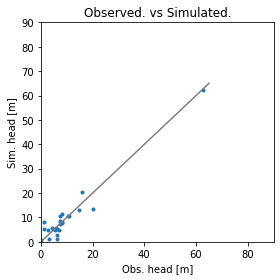

Error is - 2.8603085686585237
Params are - [8.54219849e-01 1.74087811e+01 1.11201828e+01 6.52344115e-01
 9.34524665e-01 2.75790730e-01 2.23058595e-03 5.01148286e-01
 1.65674307e-01 4.23850526e-01 1.91935277e-03 5.33803854e+00]


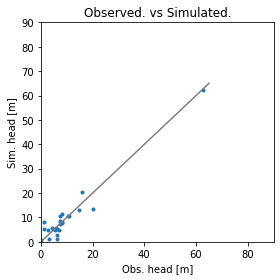

Error is - 2.860263091895478
Params are - [8.58167893e-01 1.74325540e+01 1.12800986e+01 6.50555719e-01
 9.27002266e-01 2.64557946e-01 2.23910936e-03 4.89064776e-01
 1.65062974e-01 4.33471258e-01 1.92871205e-03 5.44193418e+00]


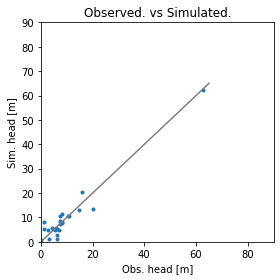

Error is - 2.860277811338375
Params are - [8.45207228e-01 1.73300127e+01 1.10934016e+01 6.59030141e-01
 9.39957046e-01 2.81260106e-01 2.22860799e-03 4.91302737e-01
 1.65192726e-01 4.22121138e-01 1.92529599e-03 5.29600405e+00]


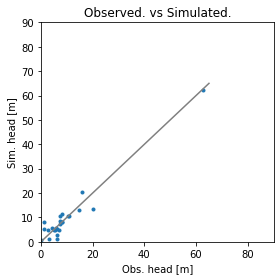

Error is - 2.8601617460593296
Params are - [8.74902777e-01 1.74357890e+01 1.09906037e+01 6.57691127e-01
 9.32993043e-01 2.56298163e-01 2.22969824e-03 4.87799856e-01
 1.64603145e-01 4.30395991e-01 1.91896883e-03 5.52055044e+00]


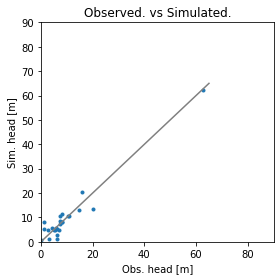

Error is - 2.8600355269112274
Params are - [8.97962792e-01 1.74873270e+01 1.09815312e+01 6.60564857e-01
 9.25784094e-01 2.29907456e-01 2.23487658e-03 4.68573052e-01
 1.63260665e-01 4.43182601e-01 1.92412711e-03 5.76557232e+00]


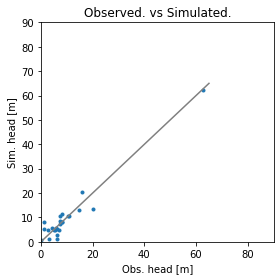

Error is - 2.860208427914443
Params are - [8.70938412e-01 1.73161518e+01 1.11230881e+01 6.49622590e-01
 9.25908049e-01 2.47442946e-01 2.23754347e-03 5.02253945e-01
 1.63577301e-01 4.37392372e-01 1.91913220e-03 5.50228103e+00]


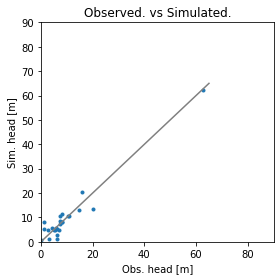

Error is - 2.860265361050065
Params are - [8.76231544e-01 1.73435441e+01 1.07372644e+01 6.57266824e-01
 9.34824481e-01 2.46727508e-01 2.22587110e-03 5.06874950e-01
 1.65923222e-01 4.29605671e-01 1.91646227e-03 5.49466931e+00]


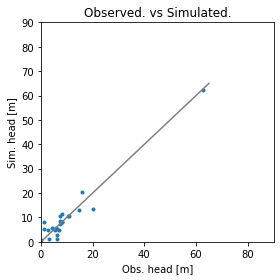

Error is - 2.860319042309211
Params are - [8.74189830e-01 1.77199822e+01 1.18345987e+01 6.44484502e-01
 9.32406981e-01 2.65355343e-01 2.22801391e-03 4.78756083e-01
 1.65181545e-01 4.26419236e-01 1.91525613e-03 5.56250245e+00]


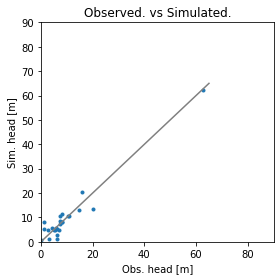

Error is - 2.8601769497814966
Params are - [8.81164610e-01 1.74344165e+01 1.13765892e+01 6.41984182e-01
 9.34095378e-01 2.46644844e-01 2.22514024e-03 5.02053765e-01
 1.66303644e-01 4.31837447e-01 1.90351015e-03 5.50859017e+00]


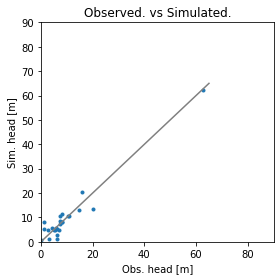

Error is - 2.8601519861382556
Params are - [8.91237442e-01 1.75411555e+01 1.11404791e+01 6.58952992e-01
 9.18455109e-01 2.37902937e-01 2.24084010e-03 4.78102511e-01
 1.63843323e-01 4.40215674e-01 1.91870223e-03 5.61268096e+00]


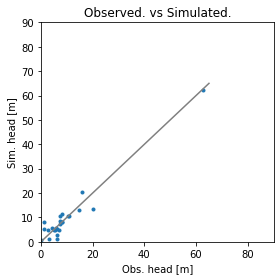

Error is - 2.8601661951266624
Params are - [8.87770640e-01 1.72214801e+01 1.11389885e+01 6.53858783e-01
 9.25287923e-01 2.44329179e-01 2.24264224e-03 4.84272722e-01
 1.62504675e-01 4.37407325e-01 1.93692973e-03 5.61929002e+00]


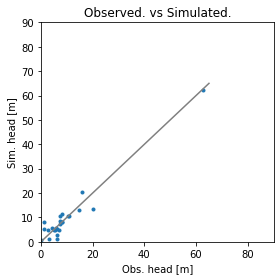

Error is - 2.8600078812829017
Params are - [8.93216119e-01 1.75879691e+01 1.08393641e+01 6.63545773e-01
 9.22081703e-01 2.38691524e-01 2.24050567e-03 4.48515801e-01
 1.63855325e-01 4.44503577e-01 1.93416358e-03 5.90899278e+00]


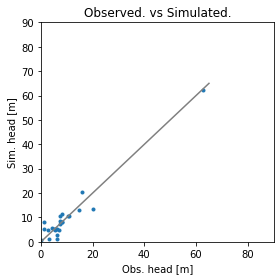

Error is - 2.8599662366811223
Params are - [9.13439834e-01 1.77521270e+01 1.05612619e+01 6.73402156e-01
 9.12623836e-01 2.19211687e-01 2.24954820e-03 4.04730739e-01
 1.62861770e-01 4.59359978e-01 1.94951421e-03 6.32309762e+00]


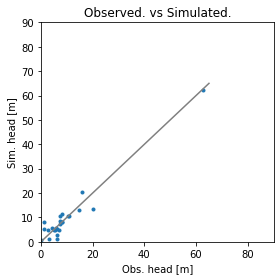

Error is - 2.8599651059010505
Params are - [8.76787279e-01 1.72621559e+01 1.15615039e+01 6.43641158e-01
 9.25418996e-01 2.42957958e-01 2.23750166e-03 4.83826448e-01
 1.64250583e-01 4.43363756e-01 1.90807492e-03 5.63236172e+00]


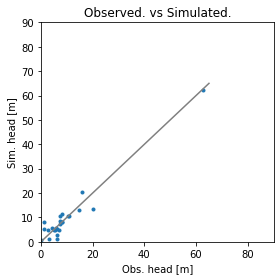

Error is - 2.8599671426465387
Params are - [8.77421989e-01 1.70885962e+01 1.20135534e+01 6.32902602e-01
 9.21086731e-01 2.31614061e-01 2.24181708e-03 4.82212356e-01
 1.63836958e-01 4.53978239e-01 1.89591093e-03 5.70085810e+00]


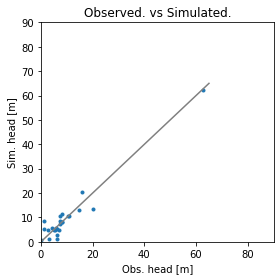

Error is - 2.860228918568381
Params are - [9.16409742e-01 1.76445480e+01 1.12707548e+01 6.53663782e-01
 9.06782968e-01 1.99836779e-01 2.24921135e-03 4.47985163e-01
 1.62387344e-01 4.62502942e-01 1.94530442e-03 6.05618578e+00]


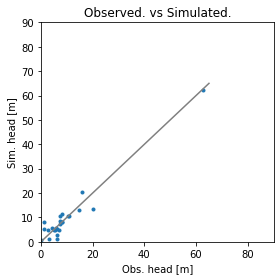

Error is - 2.859859857956603
Params are - [8.89134369e-01 1.74963295e+01 1.13395501e+01 6.58463416e-01
 9.19574025e-01 2.18772450e-01 2.24717620e-03 4.54312858e-01
 1.62689697e-01 4.54597126e-01 1.94029523e-03 5.81442803e+00]


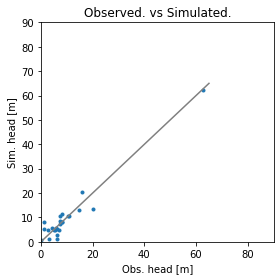

Error is - 2.85981351045726
Params are - [8.95809800e-01 1.75355377e+01 1.15041369e+01 6.63007858e-01
 9.13435789e-01 1.93700342e-01 2.25777688e-03 4.30475974e-01
 1.61183580e-01 4.70287636e-01 1.95633868e-03 5.97759193e+00]


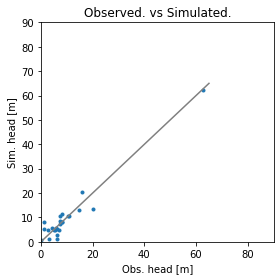

Error is - 2.859955390288218
Params are - [8.94331373e-01 1.71635195e+01 1.04602510e+01 6.66440672e-01
 9.15855675e-01 2.10391271e-01 2.25009762e-03 4.69496713e-01
 1.62543756e-01 4.58705397e-01 1.94009453e-03 5.80920740e+00]


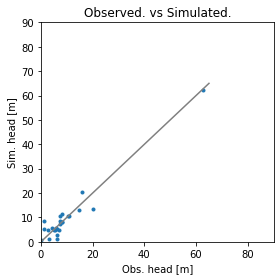

Error is - 2.860342119236599
Params are - [9.31501332e-01 1.75257401e+01 1.10959230e+01 6.53130121e-01
 9.04288714e-01 1.82675036e-01 2.25308514e-03 4.53315723e-01
 1.62091080e-01 4.69100872e-01 1.93252109e-03 6.16123969e+00]


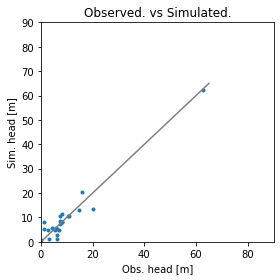

Error is - 2.8600837533990107
Params are - [8.66780754e-01 1.73789446e+01 1.10940320e+01 6.57555136e-01
 9.31039963e-01 2.56613839e-01 2.23472728e-03 4.81805983e-01
 1.64417315e-01 4.33866071e-01 1.92710227e-03 5.51231296e+00]


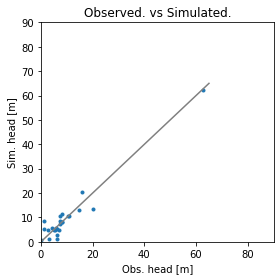

Error is - 2.860494358889525
Params are - [8.98901885e-01 1.75181088e+01 1.15115214e+01 6.54941490e-01
 9.08790527e-01 2.18855356e-01 2.25729806e-03 4.33565349e-01
 1.61109600e-01 4.62326405e-01 1.94312815e-03 5.96551504e+00]


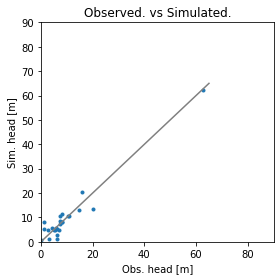

Error is - 2.860071360292549
Params are - [8.81899129e-01 1.73871853e+01 1.09308287e+01 6.56685491e-01
 9.28315993e-01 2.39759470e-01 2.23372784e-03 4.88547549e-01
 1.64719816e-01 4.37785855e-01 1.92312874e-03 5.61238074e+00]


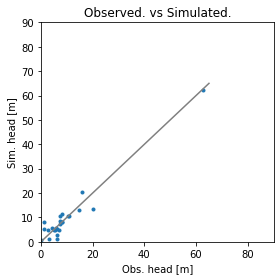

Error is - 2.8599389041495518
Params are - [9.20920741e-01 1.74215375e+01 1.09104756e+01 6.62674224e-01
 9.16831696e-01 1.96891839e-01 2.24316288e-03 4.51289318e-01
 1.61912654e-01 4.59179918e-01 1.92994781e-03 6.04665793e+00]


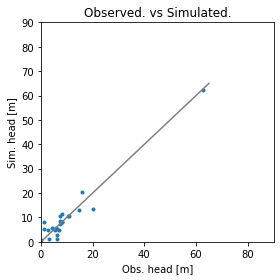

Error is - 2.860158004826332
Params are - [8.63430726e-01 1.71723751e+01 1.08597729e+01 6.61067901e-01
 9.38725782e-01 2.61122183e-01 2.23205282e-03 4.92919624e-01
 1.64509170e-01 4.29594396e-01 1.91079600e-03 5.43081835e+00]


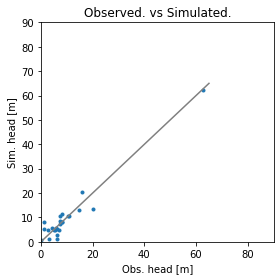

Error is - 2.8597343584486326
Params are - [9.07650774e-01 1.74768084e+01 1.09635538e+01 6.67016645e-01
 9.21736990e-01 2.15795888e-01 2.24280559e-03 4.37095122e-01
 1.63474525e-01 4.53405304e-01 1.93557886e-03 5.97281265e+00]


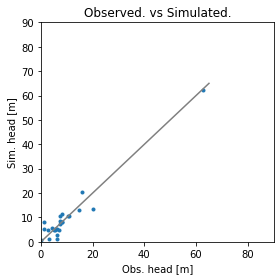

Error is - 2.859640202039942
Params are - [9.26006955e-01 1.75571367e+01 1.08837866e+01 6.75713672e-01
 9.19651460e-01 1.99972359e-01 2.24543665e-03 4.04515711e-01
 1.63423136e-01 4.61411770e-01 1.94380220e-03 6.20807846e+00]


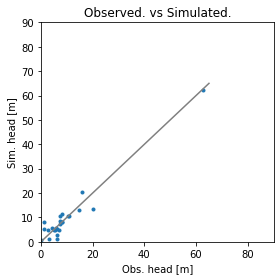

Error is - 2.8603854554594657
Params are - [9.04898301e-01 1.73789971e+01 1.06279189e+01 6.80276635e-01
 9.11142342e-01 2.08815243e-01 2.25859155e-03 4.21038959e-01
 1.60268096e-01 4.63889283e-01 1.95791626e-03 6.08308489e+00]


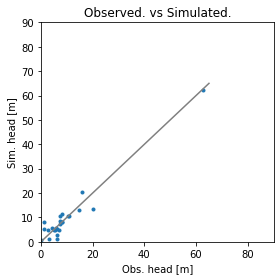

Error is - 2.8599958900118856
Params are - [8.87098033e-01 1.74205617e+01 1.11894216e+01 6.51557295e-01
 9.28357119e-01 2.37187443e-01 2.23350307e-03 4.81800064e-01
 1.64794757e-01 4.39850406e-01 1.91711167e-03 5.65221385e+00]


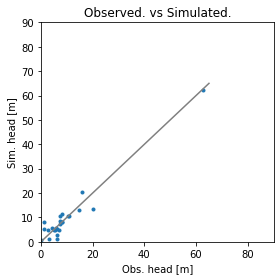

Error is - 2.8597623747114524
Params are - [8.98180170e-01 1.76251137e+01 1.08739250e+01 6.68018453e-01
 9.20461330e-01 2.09940619e-01 2.23956636e-03 4.38407893e-01
 1.64448746e-01 4.58726584e-01 1.92119366e-03 5.97787235e+00]


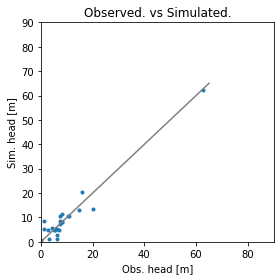

Error is - 2.8597855777850563
Params are - [9.28311658e-01 1.77496753e+01 1.11554994e+01 6.61967760e-01
 9.03979395e-01 1.84617354e-01 2.25140804e-03 4.20675702e-01
 1.62434180e-01 4.71394879e-01 1.94906033e-03 6.25751969e+00]


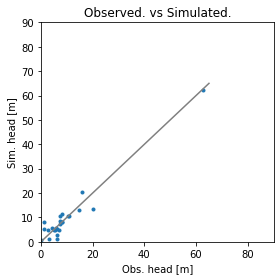

Error is - 2.859765872917363
Params are - [9.06683978e-01 1.74156481e+01 1.08772965e+01 6.64585130e-01
 9.21837448e-01 1.98955669e-01 2.24438208e-03 4.25921680e-01
 1.62865170e-01 4.65970134e-01 1.94621379e-03 6.18313020e+00]


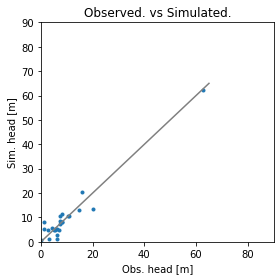

Error is - 2.8597608381328725
Params are - [9.37791203e-01 1.75839763e+01 1.08876211e+01 6.67154651e-01
 9.07718842e-01 1.70635073e-01 2.25210403e-03 4.12904157e-01
 1.62032488e-01 4.77670414e-01 1.94099901e-03 6.39530107e+00]


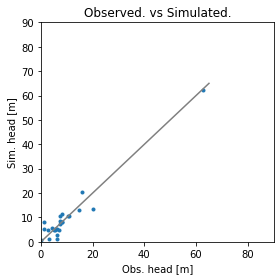

Error is - 2.859509123046309
Params are - [9.31988173e-01 1.76085341e+01 1.10436231e+01 6.69769157e-01
 9.07009954e-01 1.75968708e-01 2.25616617e-03 3.93555359e-01
 1.61282098e-01 4.80398058e-01 1.94795092e-03 6.42572002e+00]


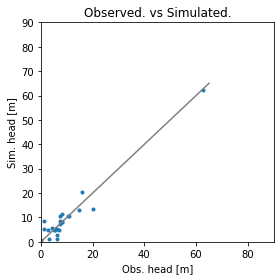

Error is - 2.8595760188935104
Params are - [9.57032696e-01 1.77192084e+01 1.11000203e+01 6.76310990e-01
 8.96356935e-01 1.44073328e-01 2.26738533e-03 3.46059264e-01
 1.59563239e-01 5.01704159e-01 1.96036200e-03 6.83238965e+00]


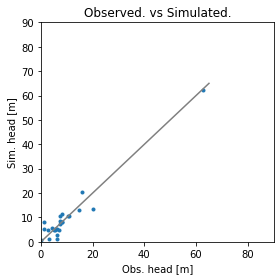

Error is - 2.859561340612957
Params are - [9.21595407e-01 1.75285936e+01 1.10032692e+01 6.67423840e-01
 9.06412829e-01 1.76830931e-01 2.25856569e-03 4.01026908e-01
 1.62411489e-01 4.81203888e-01 1.95092318e-03 6.38255306e+00]


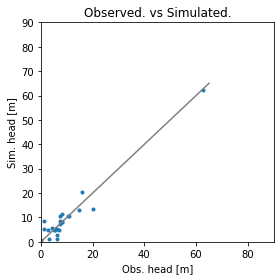

Error is - 2.859545730383255
Params are - [9.38209729e-01 1.76133642e+01 1.07643535e+01 6.79075827e-01
 9.00182423e-01 1.59491525e-01 2.26411631e-03 3.74337704e-01
 1.60480184e-01 4.91428330e-01 1.96357386e-03 6.61763472e+00]


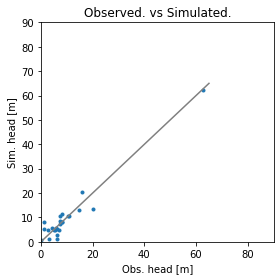

Error is - 2.85985382977723
Params are - [9.15996244e-01 1.72586718e+01 1.14263618e+01 6.58176578e-01
 9.13842136e-01 1.67513922e-01 2.25049919e-03 4.46341522e-01
 1.62016240e-01 4.77263483e-01 1.93351461e-03 5.99584047e+00]


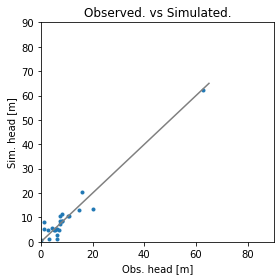

Error is - 2.8606784388166835
Params are - [9.59183626e-01 1.77480622e+01 1.04035960e+01 6.90360146e-01
 8.99117500e-01 1.31193643e-01 2.26471199e-03 3.60998326e-01
 1.60255037e-01 4.98909659e-01 1.97919384e-03 6.74715617e+00]


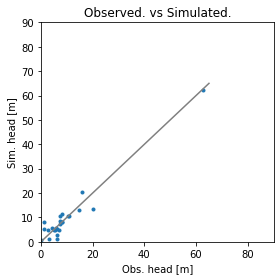

Error is - 2.8597169911885043
Params are - [8.97386366e-01 1.73836324e+01 1.12720269e+01 6.55320905e-01
 9.18843622e-01 2.15016880e-01 2.24430424e-03 4.53119417e-01
 1.63251697e-01 4.57250232e-01 1.92585465e-03 5.91106033e+00]


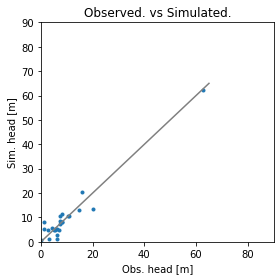

Error is - 2.8596397333396406
Params are - [9.42148697e-01 1.78833841e+01 1.16401449e+01 6.65707337e-01
 9.09178812e-01 1.64531265e-01 2.25115047e-03 3.72598511e-01
 1.62079855e-01 4.83325491e-01 1.94480092e-03 6.58728597e+00]


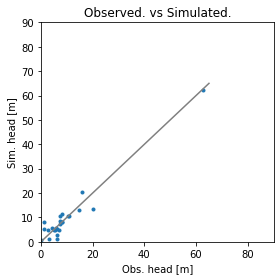

Error is - 2.8595905738646716
Params are - [9.19097322e-01 1.77023405e+01 1.13115319e+01 6.69979304e-01
 9.06927310e-01 1.72637269e-01 2.25941647e-03 3.77690771e-01
 1.62738823e-01 4.86875232e-01 1.95742315e-03 6.43994012e+00]


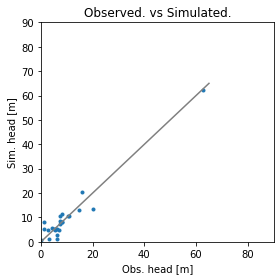

Error is - 2.8598552466109175
Params are - [9.24538666e-01 1.79391510e+01 1.07765074e+01 6.76444071e-01
 9.08764399e-01 2.02869078e-01 2.25356637e-03 3.71196776e-01
 1.62755667e-01 4.70393625e-01 1.95784112e-03 6.56477419e+00]


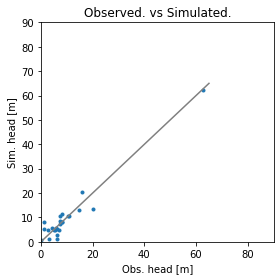

Error is - 2.85963982021959
Params are - [9.18131849e-01 1.74287916e+01 1.12638982e+01 6.62743451e-01
 9.12572702e-01 1.76352711e-01 2.25126599e-03 4.27555335e-01
 1.62201097e-01 4.75546018e-01 1.93959623e-03 6.13807390e+00]


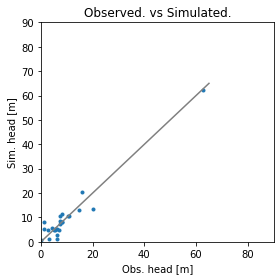

Error is - 2.859598249431813
Params are - [9.48445451e-01 1.76444941e+01 1.06586925e+01 6.71568723e-01
 9.09026899e-01 1.73791385e-01 2.24520353e-03 3.86575550e-01
 1.63757914e-01 4.78245869e-01 1.93222664e-03 6.60976972e+00]


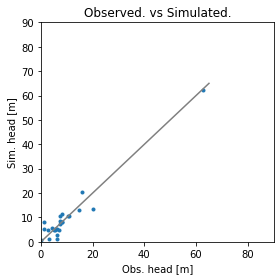

Error is - 2.859705671191395
Params are - [9.19299226e-01 1.74128263e+01 1.09245289e+01 6.74208982e-01
 9.19324544e-01 1.81070045e-01 2.25053829e-03 3.90692464e-01
 1.62727936e-01 4.78280458e-01 1.93669937e-03 6.38855030e+00]


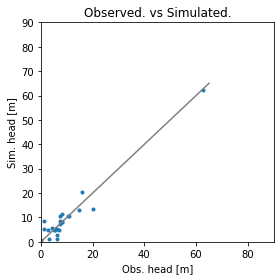

Error is - 2.8594454105670635
Params are - [9.43029447e-01 1.77463832e+01 1.12106038e+01 6.73195587e-01
 9.01047673e-01 1.63750793e-01 2.25859029e-03 3.79574950e-01
 1.62274074e-01 4.85756923e-01 1.93796018e-03 6.49717647e+00]


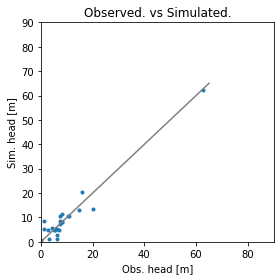

Error is - 2.8597323686415232
Params are - [9.61202182e-01 1.79117507e+01 1.13772574e+01 6.77500816e-01
 8.90652785e-01 1.46148355e-01 2.26569439e-03 3.56401584e-01
 1.61978526e-01 4.95650317e-01 1.93383337e-03 6.65419961e+00]


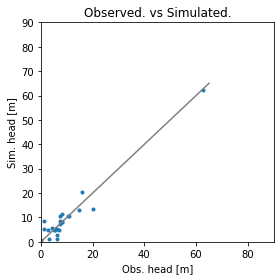

Error is - 2.8596267667378874
Params are - [9.59008135e-01 1.75571291e+01 1.12700884e+01 6.70625120e-01
 8.99188182e-01 1.45067539e-01 2.26657666e-03 3.57283247e-01
 1.60328052e-01 4.97505529e-01 1.96577472e-03 6.78898500e+00]


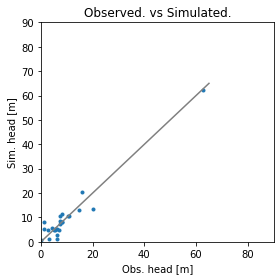

Error is - 2.859444636544216
Params are - [9.22933257e-01 1.75937920e+01 1.13201369e+01 6.72067333e-01
 9.10508893e-01 1.80111829e-01 2.25645110e-03 3.73516830e-01
 1.62460238e-01 4.81867552e-01 1.95009866e-03 6.43717027e+00]


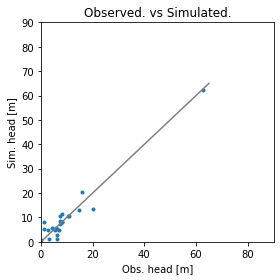

Error is - 2.8595799188701267
Params are - [9.15504284e-01 1.75986998e+01 1.15363948e+01 6.74523674e-01
 9.11903919e-01 1.84850207e-01 2.25862463e-03 3.53823167e-01
 1.62674113e-01 4.83966121e-01 1.95464849e-03 6.45810486e+00]


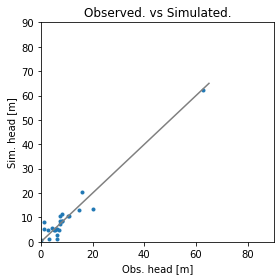

Error is - 2.8600880691112467
Params are - [9.67595909e-01 1.78291624e+01 1.09437494e+01 6.86692151e-01
 8.97994992e-01 1.29912513e-01 2.26627536e-03 3.20034473e-01
 1.61109119e-01 5.06390621e-01 1.96928369e-03 7.00909600e+00]


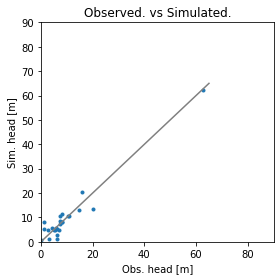

Error is - 2.8595493539939025
Params are - [9.14938752e-01 1.74950149e+01 1.11899575e+01 6.63163716e-01
 9.13631464e-01 1.93740788e-01 2.24979702e-03 4.19848181e-01
 1.62716052e-01 4.69535329e-01 1.93671191e-03 6.18556925e+00]


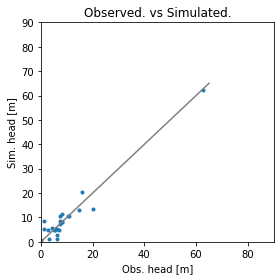

Error is - 2.8599034839354247
Params are - [9.44956304e-01 1.78136667e+01 1.13354855e+01 6.65963196e-01
 8.96565223e-01 1.65971139e-01 2.25991776e-03 3.87320713e-01
 1.61630900e-01 4.83902873e-01 1.95844106e-03 6.49777586e+00]


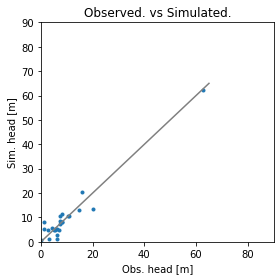

Error is - 2.8595637388402446
Params are - [9.25713495e-01 1.75130364e+01 1.10272680e+01 6.72147536e-01
 9.13634714e-01 1.77295318e-01 2.25288316e-03 3.89849526e-01
 1.62453677e-01 4.79686062e-01 1.94213479e-03 6.41585669e+00]


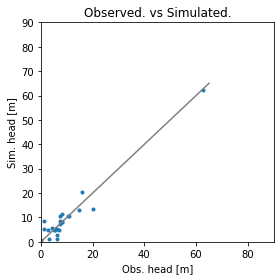

Error is - 2.8594598052558937
Params are - [9.38199664e-01 1.76620062e+01 1.14001414e+01 6.63864150e-01
 8.95235516e-01 1.43289317e-01 2.26626049e-03 3.71053101e-01
 1.60774122e-01 5.03817277e-01 1.95106033e-03 6.71287740e+00]


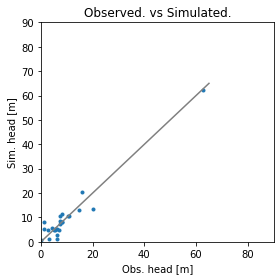

Error is - 2.8594330399428176
Params are - [9.49419406e-01 1.78292205e+01 1.10427370e+01 6.77021154e-01
 8.99424743e-01 1.61398401e-01 2.26293024e-03 3.38596438e-01
 1.61758333e-01 4.94394905e-01 1.95717698e-03 6.87868255e+00]


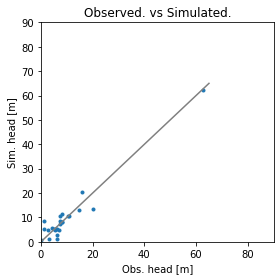

Error is - 2.8595477026547496
Params are - [9.65063184e-01 1.80294349e+01 1.09321564e+01 6.84160005e-01
 8.92850763e-01 1.53921246e-01 2.26876237e-03 2.94116989e-01
 1.61536950e-01 5.03819348e-01 1.96596735e-03 7.24898688e+00]


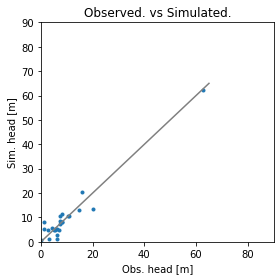

Error is - 2.8595066159876503
Params are - [9.26614342e-01 1.73656007e+01 1.05669223e+01 6.75942904e-01
 9.01192955e-01 1.72697702e-01 2.26500905e-03 3.87886250e-01
 1.61825988e-01 4.88460335e-01 1.95403496e-03 6.47803657e+00]


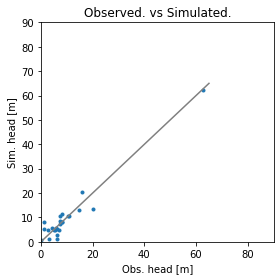

Error is - 2.8596213259263306
Params are - [9.04355939e-01 1.76599343e+01 1.08197845e+01 6.71911418e-01
 9.11517713e-01 1.96766456e-01 2.24932159e-03 4.08302015e-01
 1.63827446e-01 4.72772764e-01 1.93110454e-03 6.22451280e+00]


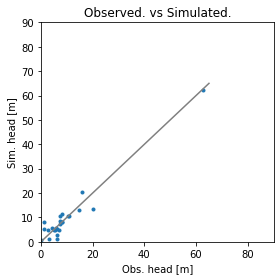

Error is - 2.8595033160945484
Params are - [9.18018988e-01 1.76342330e+01 1.09323604e+01 6.71589844e-01
 9.08435331e-01 1.83841726e-01 2.25363536e-03 3.95547323e-01
 1.62952598e-01 4.78955955e-01 1.93977208e-03 6.36563085e+00]


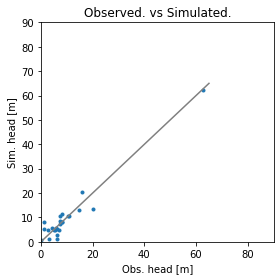

Error is - 2.8596291927180837
Params are - [9.09847546e-01 1.75708591e+01 1.14767917e+01 6.70971336e-01
 9.01580401e-01 1.69717666e-01 2.27210003e-03 3.80505006e-01
 1.60263365e-01 4.92150772e-01 1.96591019e-03 6.36303827e+00]


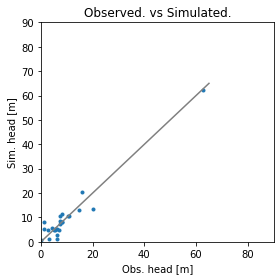

Error is - 2.859481422342905
Params are - [9.38795975e-01 1.76260853e+01 1.08632173e+01 6.71419376e-01
 9.07165275e-01 1.72772955e-01 2.25192766e-03 3.85057914e-01
 1.62884277e-01 4.81722094e-01 1.94064753e-03 6.54808686e+00]


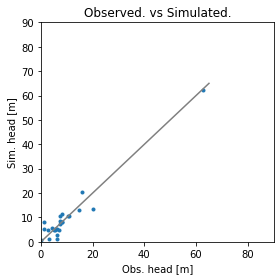

Error is - 2.8594674152340405
Params are - [9.42478784e-01 1.75003035e+01 1.07492332e+01 6.72800766e-01
 9.03719651e-01 1.70894396e-01 2.25663895e-03 3.90617643e-01
 1.61306699e-01 4.82662552e-01 1.93791774e-03 6.55089233e+00]


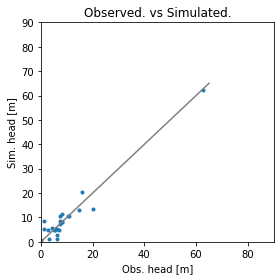

Error is - 2.8595782456786383
Params are - [9.38656826e-01 1.76874855e+01 1.09871579e+01 6.70741407e-01
 8.95359737e-01 1.65169527e-01 2.26379823e-03 3.78586908e-01
 1.61400682e-01 4.90347804e-01 1.95250326e-03 6.59748170e+00]


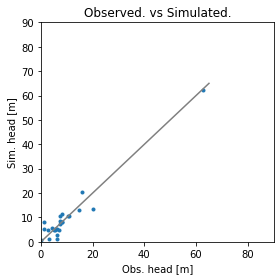

Error is - 2.859489686160733
Params are - [9.28949328e-01 1.75566487e+01 1.10172405e+01 6.71796003e-01
 9.09065970e-01 1.74263870e-01 2.25561193e-03 3.87033871e-01
 1.62190428e-01 4.82351497e-01 1.94472691e-03 6.46126294e+00]


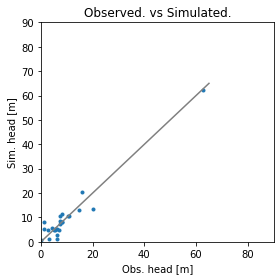

Error is - 2.859323413236444
Params are - [9.44000567e-01 1.76766041e+01 1.10134853e+01 6.76193796e-01
 9.03023812e-01 1.65206071e-01 2.25762340e-03 3.65077353e-01
 1.61406027e-01 4.89021247e-01 1.94268217e-03 6.64390365e+00]


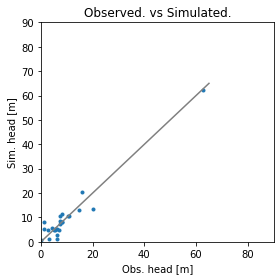

Error is - 2.8592603437162087
Params are - [9.55203147e-01 1.77506094e+01 1.10185933e+01 6.80578774e-01
 9.01329304e-01 1.59393641e-01 2.25715226e-03 3.47102575e-01
 1.60903296e-01 4.92929926e-01 1.93856166e-03 6.77457894e+00]


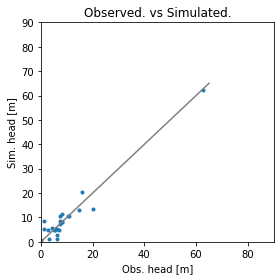

Error is - 2.8594586263448285
Params are - [9.57367955e-01 1.77527819e+01 1.07982362e+01 6.83356430e-01
 8.93754817e-01 1.42571689e-01 2.26761794e-03 3.34131812e-01
 1.60799337e-01 5.04588905e-01 1.95720173e-03 6.93905574e+00]


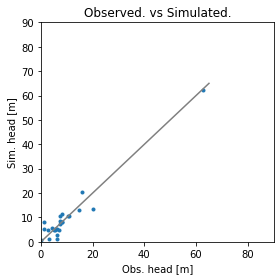

Error is - 2.8593198225730694
Params are - [9.37290015e-01 1.76576689e+01 1.12294874e+01 6.68157753e-01
 9.06132591e-01 1.74000980e-01 2.25388226e-03 3.72941308e-01
 1.63088397e-01 4.84889333e-01 1.92927775e-03 6.56056044e+00]


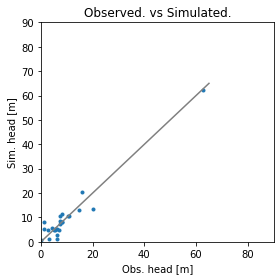

Error is - 2.8593242104944347
Params are - [9.44395211e-01 1.76706882e+01 1.09811952e+01 6.77195855e-01
 8.99158832e-01 1.57195842e-01 2.26145175e-03 3.50287977e-01
 1.62587533e-01 4.96668151e-01 1.94178850e-03 6.77494854e+00]


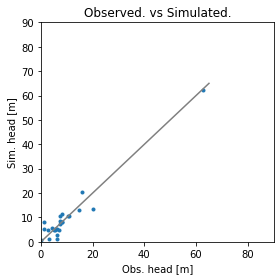

Error is - 2.859477682208905
Params are - [9.52732520e-01 1.79644694e+01 1.15269415e+01 6.71230934e-01
 9.04636811e-01 1.57883205e-01 2.25201599e-03 3.49690707e-01
 1.62170567e-01 4.89973844e-01 1.93366338e-03 6.77211732e+00]


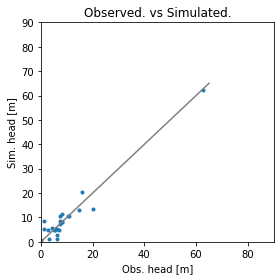

Error is - 2.859422495878921
Params are - [9.67113463e-01 1.77508765e+01 1.12606001e+01 6.75524176e-01
 8.96761349e-01 1.42412760e-01 2.26311978e-03 3.34386865e-01
 1.60913619e-01 5.01314538e-01 1.94690814e-03 6.95227078e+00]


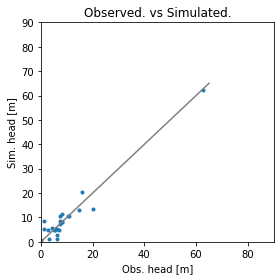

Error is - 2.8592883859805083
Params are - [9.62543813e-01 1.78608322e+01 1.12162800e+01 6.75939378e-01
 8.94079939e-01 1.46682098e-01 2.26239452e-03 3.34125815e-01
 1.61462987e-01 5.01079503e-01 1.94231685e-03 6.93847333e+00]


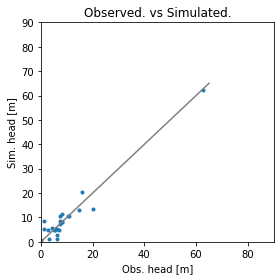

Error is - 2.8592738452996866
Params are - [9.56655139e-01 1.78305200e+01 1.14291470e+01 6.77069339e-01
 8.93799745e-01 1.43824537e-01 2.26782327e-03 3.27613089e-01
 1.60532256e-01 5.04935140e-01 1.94667446e-03 6.91671383e+00]


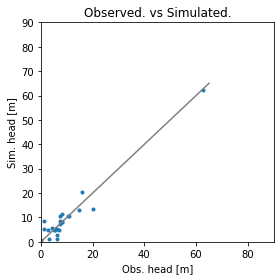

Error is - 2.8593110654500715
Params are - [9.43372363e-01 1.74698110e+01 1.07491238e+01 6.78230849e-01
 8.94522031e-01 1.56371176e-01 2.27036949e-03 3.59300694e-01
 1.60972915e-01 4.99176940e-01 1.95582712e-03 6.71678279e+00]


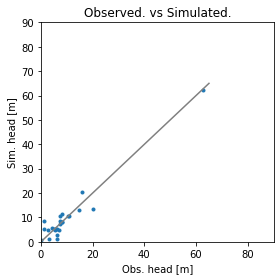

Error is - 2.8593988393162277
Params are - [9.53775030e-01 1.79288948e+01 1.15268139e+01 6.77566030e-01
 8.93906254e-01 1.40939447e-01 2.26803495e-03 3.13154266e-01
 1.61781152e-01 5.09240630e-01 1.95455765e-03 6.96565618e+00]


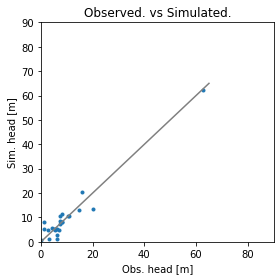

Error is - 2.8592976926173126
Params are - [9.60650043e-01 1.78116735e+01 1.08970177e+01 6.88786293e-01
 9.02168846e-01 1.68152881e-01 2.25870915e-03 3.23069002e-01
 1.62481567e-01 4.88989798e-01 1.94199795e-03 6.84580091e+00]


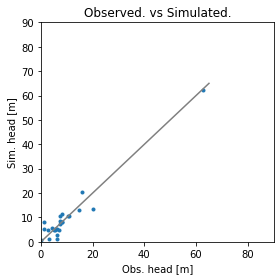

Error is - 2.8592563128319792
Params are - [9.42028767e-01 1.77307131e+01 1.15153865e+01 6.70198991e-01
 9.05051883e-01 1.73134041e-01 2.25586690e-03 3.58146490e-01
 1.62736724e-01 4.85618319e-01 1.93332259e-03 6.60408010e+00]


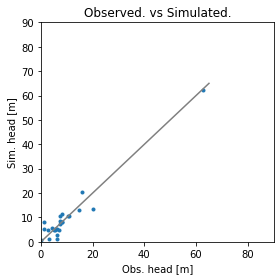

Error is - 2.8593260257372197
Params are - [9.34359173e-01 1.77196788e+01 1.18739616e+01 6.63620271e-01
 9.10700416e-01 1.88415217e-01 2.24999138e-03 3.70153828e-01
 1.63705418e-01 4.76133026e-01 1.92138302e-03 6.43659228e+00]


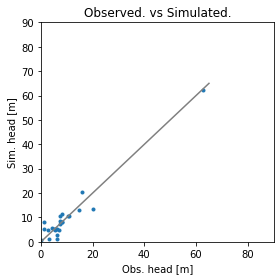

Error is - 2.8592213220763485
Params are - [9.56200495e-01 1.77345001e+01 1.11538160e+01 6.79860400e-01
 8.98426395e-01 1.53518813e-01 2.26444066e-03 3.09131942e-01
 1.61339096e-01 5.04427200e-01 1.95179121e-03 7.06377664e+00]


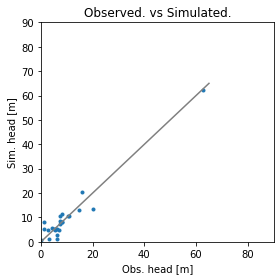

Error is - 2.859304842336703
Params are - [9.62786019e-01 1.77285586e+01 1.11254221e+01 6.83192806e-01
 8.97115757e-01 1.48402822e-01 2.26736585e-03 2.73910438e-01
 1.60871606e-01 5.13762338e-01 1.95870672e-03 7.34707672e+00]


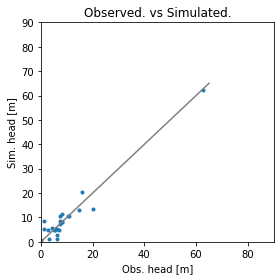

Error is - 2.8593418547163747
Params are - [9.81841225e-01 1.79105427e+01 1.10165628e+01 6.82287499e-01
 8.86951425e-01 1.32725607e-01 2.26791145e-03 3.04459246e-01
 1.60966074e-01 5.12076512e-01 1.93993481e-03 7.22821724e+00]


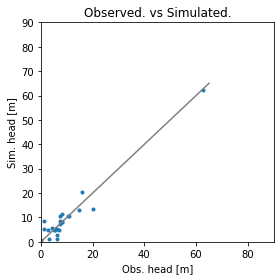

Error is - 2.859074997567109
Params are - [9.60758713e-01 1.76886679e+01 1.12896003e+01 6.78211402e-01
 8.95956689e-01 1.46660236e-01 2.26226250e-03 3.33690107e-01
 1.61535937e-01 5.02496094e-01 1.92998281e-03 6.84496074e+00]


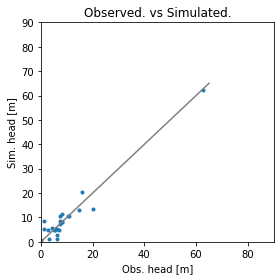

Error is - 2.8589676720584736
Params are - [9.66428367e-01 1.76183916e+01 1.14130319e+01 6.78806526e-01
 8.94222663e-01 1.39291154e-01 2.26192864e-03 3.31236942e-01
 1.61424738e-01 5.06546688e-01 1.91638572e-03 6.82809983e+00]


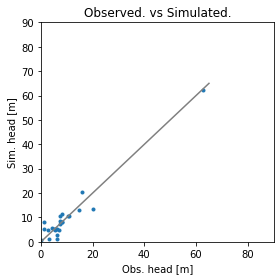

Error is - 2.8591602358418755
Params are - [9.42950473e-01 1.77449310e+01 1.10971424e+01 6.80255439e-01
 8.98196970e-01 1.65125609e-01 2.26187444e-03 3.37374693e-01
 1.62465837e-01 4.96448485e-01 1.93516457e-03 6.75067735e+00]


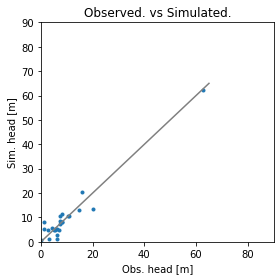

Error is - 2.8591914121588196
Params are - [9.54484813e-01 1.75362522e+01 1.07593168e+01 6.78661820e-01
 9.01767183e-01 1.70629949e-01 2.25593252e-03 3.62644029e-01
 1.61712418e-01 4.86390369e-01 1.92428288e-03 6.70146214e+00]


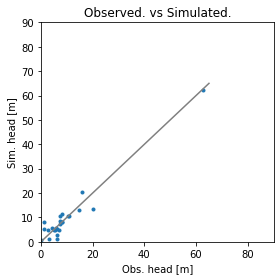

Error is - 2.85931629594695
Params are - [9.21859216e-01 1.74922225e+01 1.12266936e+01 6.73336071e-01
 9.11191305e-01 1.85161180e-01 2.25405953e-03 3.81036513e-01
 1.62651886e-01 4.79273464e-01 1.93629706e-03 6.35110857e+00]


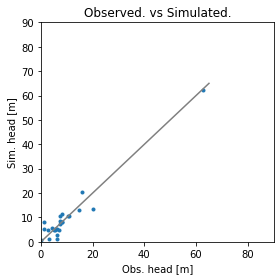

Error is - 2.8590832003313618
Params are - [9.55549231e-01 1.77023328e+01 1.13029776e+01 6.77784417e-01
 9.00989310e-01 1.65351835e-01 2.25928719e-03 3.40332538e-01
 1.61041153e-01 4.91782710e-01 1.93352813e-03 6.73373726e+00]


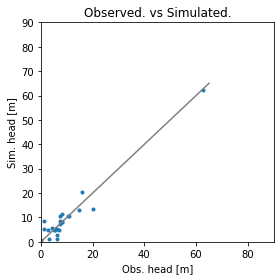

Error is - 2.8590595675694157
Params are - [9.65697629e-01 1.77227960e+01 1.10669337e+01 6.88426963e-01
 8.93158338e-01 1.47105172e-01 2.26775750e-03 3.12244413e-01
 1.60199082e-01 5.04710424e-01 1.94674728e-03 6.97698818e+00]


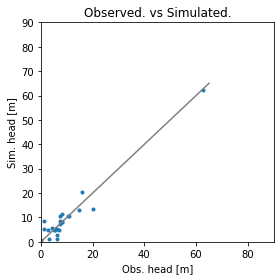

Error is - 2.8595381949968335
Params are - [9.88434831e-01 1.79266713e+01 1.10431009e+01 6.85763794e-01
 8.85094130e-01 1.29602305e-01 2.26986322e-03 2.92683857e-01
 1.60226792e-01 5.14565787e-01 1.94146967e-03 7.29075331e+00]


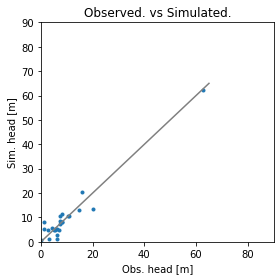

Error is - 2.8591938086077535
Params are - [9.38503120e-01 1.76008347e+01 1.11807954e+01 6.76443001e-01
 9.04667011e-01 1.71271461e-01 2.25801046e-03 3.58948349e-01
 1.62045613e-01 4.88096544e-01 1.93759022e-03 6.58601976e+00]


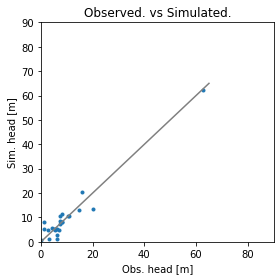

Error is - 2.8591316222404966
Params are - [9.66110143e-01 1.79709201e+01 1.15926160e+01 6.80571041e-01
 9.03454234e-01 1.60875690e-01 2.25149342e-03 3.14360952e-01
 1.62084546e-01 4.92815577e-01 1.91890014e-03 6.90328526e+00]


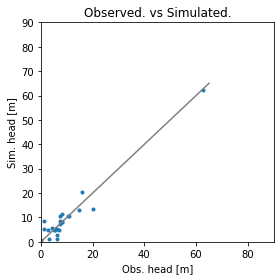

Error is - 2.859048524370726
Params are - [9.49742479e-01 1.76555987e+01 1.15606551e+01 6.68646388e-01
 8.96021650e-01 1.47881119e-01 2.26195114e-03 3.49141303e-01
 1.60509724e-01 5.03640350e-01 1.92887967e-03 6.78384786e+00]


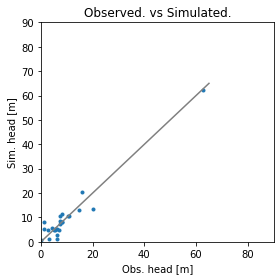

Error is - 2.859019551979543
Params are - [9.45715154e-01 1.75722345e+01 1.12987886e+01 6.80277805e-01
 9.04434175e-01 1.69551739e-01 2.25819187e-03 3.40587070e-01
 1.61369427e-01 4.91977453e-01 1.92632124e-03 6.66540452e+00]


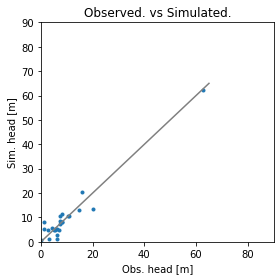

Error is - 2.859009663493648
Params are - [9.49780498e-01 1.75594991e+01 1.10641952e+01 6.79682589e-01
 9.06486775e-01 1.76697167e-01 2.25115789e-03 3.49262127e-01
 1.62439686e-01 4.85962201e-01 1.91857143e-03 6.64527914e+00]


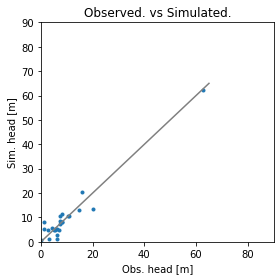

Error is - 2.8589550536173847
Params are - [9.50328715e-01 1.76075579e+01 1.14823492e+01 6.76023789e-01
 8.99816794e-01 1.64011983e-01 2.26082985e-03 3.30132566e-01
 1.62324712e-01 4.96806127e-01 1.92335252e-03 6.76586406e+00]


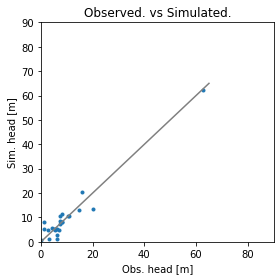

Error is - 2.858975952076206
Params are - [9.47891499e-01 1.75360322e+01 1.17142272e+01 6.73746296e-01
 8.99060539e-01 1.66321155e-01 2.26266864e-03 3.21647561e-01
 1.63035420e-01 4.98744227e-01 1.91574795e-03 6.76150663e+00]


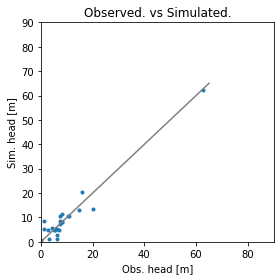

Error is - 2.8588529672764675
Params are - [9.64886419e-01 1.76069283e+01 1.09800498e+01 6.87374373e-01
 8.95221700e-01 1.48751240e-01 2.26294236e-03 3.14419664e-01
 1.60422615e-01 5.05982369e-01 1.92692991e-03 6.96332690e+00]


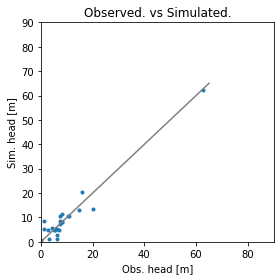

Error is - 2.85877357842352
Params are - [9.76315245e-01 1.75450359e+01 1.07123815e+01 6.95962064e-01
 8.90306608e-01 1.36559840e-01 2.26648009e-03 2.92556252e-01
 1.59265560e-01 5.16164395e-01 1.92373357e-03 7.14295030e+00]


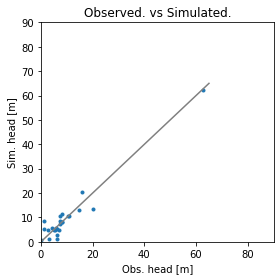

Error is - 2.8589185718783243
Params are - [9.54067149e-01 1.75715639e+01 1.12680479e+01 6.80396574e-01
 9.00493890e-01 1.65539974e-01 2.25470850e-03 3.60671597e-01
 1.61474654e-01 4.89129687e-01 1.90378502e-03 6.51682597e+00]


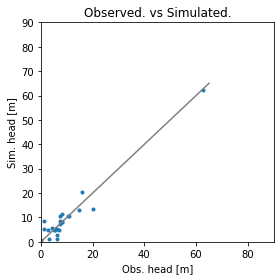

Error is - 2.85877231017249
Params are - [9.74358530e-01 1.77003509e+01 1.12556106e+01 6.84472901e-01
 8.93557754e-01 1.46832078e-01 2.26058838e-03 3.11142398e-01
 1.60672977e-01 5.05632533e-01 1.91235181e-03 6.98305056e+00]


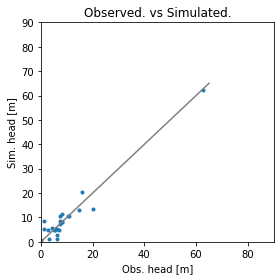

Error is - 2.8587514576830775
Params are - [9.92286235e-01 1.77501090e+01 1.12930182e+01 6.88487851e-01
 8.88003125e-01 1.34612386e-01 2.26187735e-03 2.87239422e-01
 1.59986659e-01 5.14400528e-01 1.89973261e-03 7.18156596e+00]


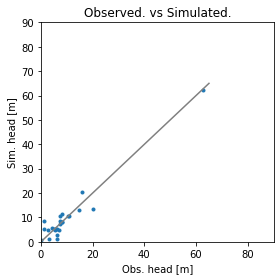

Error is - 2.858784748210966
Params are - [9.64677073e-01 1.78005762e+01 1.17660394e+01 6.83891755e-01
 8.94163572e-01 1.41470662e-01 2.26365713e-03 2.94879284e-01
 1.60718545e-01 5.12007068e-01 1.92156743e-03 6.94762548e+00]


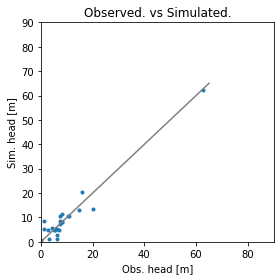

Error is - 2.8588735038505697
Params are - [9.79832513e-01 1.76011716e+01 1.15396966e+01 6.82904188e-01
 8.97061553e-01 1.43032511e-01 2.25801233e-03 3.13066052e-01
 1.59673911e-01 5.04542049e-01 1.90841956e-03 6.93123496e+00]


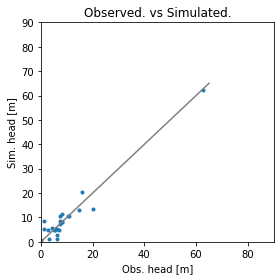

Error is - 2.8588634438392817
Params are - [9.58959905e-01 1.73135578e+01 1.10354032e+01 6.82977443e-01
 8.90738842e-01 1.44308567e-01 2.26947982e-03 3.35863975e-01
 1.59653429e-01 5.10129369e-01 1.92293723e-03 6.78328533e+00]


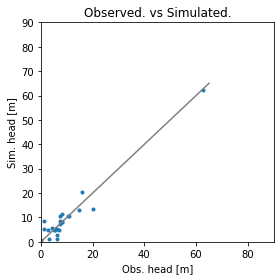

Error is - 2.8586160450666513
Params are - [9.70089263e-01 1.75173493e+01 1.12804458e+01 6.86629572e-01
 8.91495354e-01 1.36325211e-01 2.26338483e-03 3.09147629e-01
 1.60465535e-01 5.14220013e-01 1.90654408e-03 6.96109134e+00]


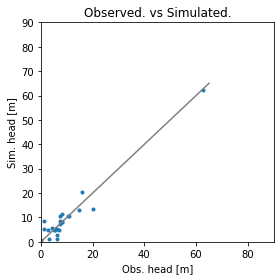

Error is - 2.8585807164918915
Params are - [9.77359279e-01 1.74248576e+01 1.12691799e+01 6.91052150e-01
 8.86748375e-01 1.21811899e-01 2.26543365e-03 2.93555174e-01
 1.60177725e-01 5.25438665e-01 1.89305205e-03 7.07476837e+00]


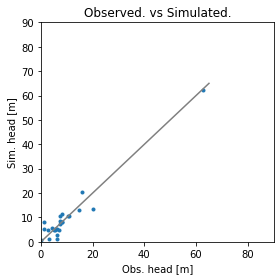

Error is - 2.858658295755535
Params are - [9.61884473e-01 1.74472296e+01 1.15501974e+01 6.76424557e-01
 8.98257998e-01 1.50356328e-01 2.25452721e-03 3.34120881e-01
 1.61304046e-01 5.04747006e-01 1.88437572e-03 6.73413712e+00]


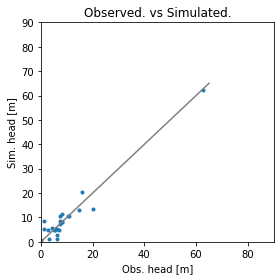

Error is - 2.858506766606268
Params are - [9.79863288e-01 1.74796987e+01 1.10547331e+01 6.97501493e-01
 8.95767412e-01 1.49992917e-01 2.25909624e-03 2.94720588e-01
 1.61125791e-01 5.06001523e-01 1.89482601e-03 6.91899232e+00]


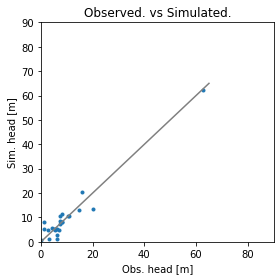

Error is - 2.8583918938894257
Params are - [9.94923692e-01 1.73917487e+01 1.08017721e+01 7.11929046e-01
 8.95640292e-01 1.51048816e-01 2.25766879e-03 2.67510230e-01
 1.61433825e-01 5.07182110e-01 1.87779919e-03 6.98656455e+00]


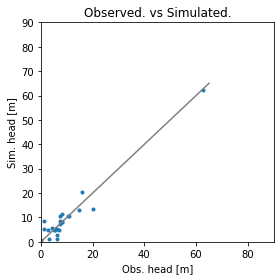

Error is - 2.8586433560477524
Params are - [9.92092036e-01 1.75329820e+01 1.12337635e+01 6.91145283e-01
 8.85889239e-01 1.25238476e-01 2.26276834e-03 2.91095346e-01
 1.60276821e-01 5.20198529e-01 1.88929744e-03 7.09096232e+00]


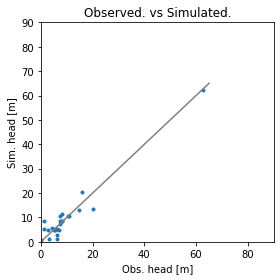

Error is - 2.8591065647390725
Params are - [9.95078616e-01 1.75412979e+01 1.14966183e+01 6.93650949e-01
 8.80403717e-01 1.09516599e-01 2.27173739e-03 2.72725827e-01
 1.58846085e-01 5.31919836e-01 1.89216825e-03 7.18536823e+00]


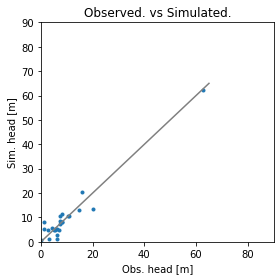

Error is - 2.8587697794988713
Params are - [9.61105027e-01 1.75549488e+01 1.11723009e+01 6.83174679e-01
 8.99966010e-01 1.59902025e-01 2.25630277e-03 3.30128052e-01
 1.61541286e-01 4.97451610e-01 1.91197063e-03 6.78030142e+00]


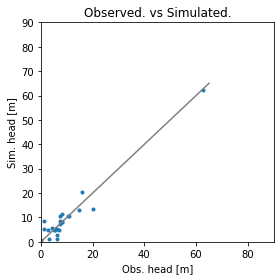

Error is - 2.858483326673252
Params are - [9.77543524e-01 1.74718316e+01 1.11076597e+01 6.95255037e-01
 8.93625054e-01 1.50357757e-01 2.26002900e-03 2.90566196e-01
 1.59880457e-01 5.09819502e-01 1.89361811e-03 6.99458114e+00]


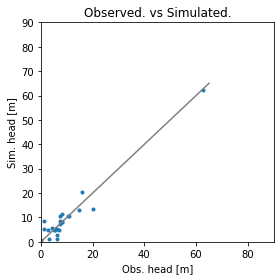

Error is - 2.858916984416201
Params are - [9.98178977e-01 1.74600442e+01 1.09758941e+01 7.01242982e-01
 8.86998966e-01 1.23361223e-01 2.26099432e-03 2.85076178e-01
 1.58573108e-01 5.21728959e-01 1.88169558e-03 7.09493642e+00]


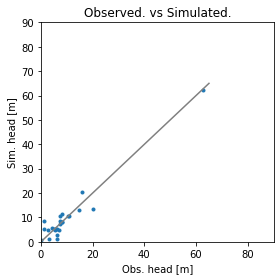

Error is - 2.858494740444844
Params are - [1.00179251e+00 1.74774516e+01 1.11415032e+01 7.00344599e-01
 8.84072716e-01 1.14803441e-01 2.26816330e-03 2.41937910e-01
 1.58939575e-01 5.34838611e-01 1.89758150e-03 7.44032626e+00]


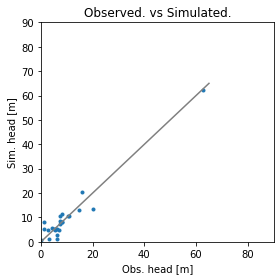

Error is - 2.8588344455289834
Params are - [9.58282942e-01 1.75918725e+01 1.14612585e+01 6.79348460e-01
 8.97079932e-01 1.55555895e-01 2.26307231e-03 3.10343618e-01
 1.61902199e-01 5.04424281e-01 1.92231860e-03 6.91978078e+00]


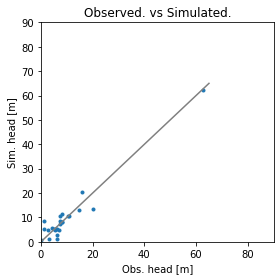

Error is - 2.8583964636034502
Params are - [9.73037810e-01 1.74491953e+01 1.08843830e+01 6.97094633e-01
 8.87020408e-01 1.37971838e-01 2.26689763e-03 2.81900005e-01
 1.61172777e-01 5.21591563e-01 1.89791113e-03 7.08157321e+00]


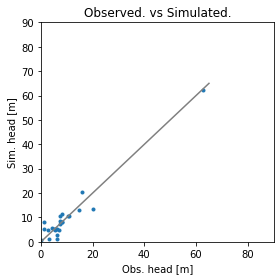

Error is - 2.8585229874377873
Params are - [9.96256737e-01 1.77594154e+01 1.13635064e+01 6.99374242e-01
 8.92723380e-01 1.35639660e-01 2.25499977e-03 2.50108087e-01
 1.61446484e-01 5.17914609e-01 1.87922244e-03 7.27923749e+00]


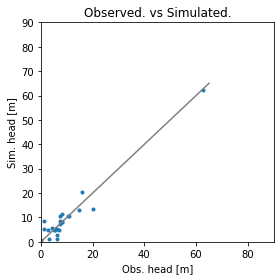

Error is - 2.858646414524309
Params are - [1.00326267e+00 1.75090244e+01 1.09213591e+01 7.06340856e-01
 8.85656198e-01 1.21072960e-01 2.26006186e-03 2.65589189e-01
 1.59121761e-01 5.25868085e-01 1.87265837e-03 7.20265149e+00]


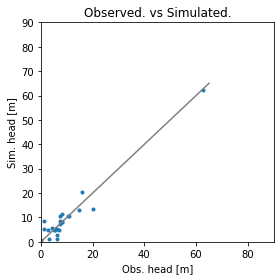

Error is - 2.8585341897474055
Params are - [1.00329947e+00 1.72517288e+01 1.04757981e+01 7.05539078e-01
 8.87154662e-01 1.31758576e-01 2.25887783e-03 2.76171840e-01
 1.60039284e-01 5.20595467e-01 1.86525803e-03 7.21731113e+00]


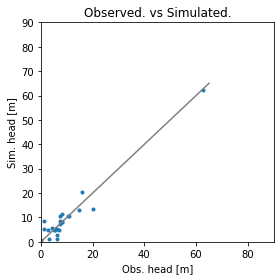

Error is - 2.8583002988386097
Params are - [9.96158665e-01 1.74583846e+01 1.14900254e+01 6.95064938e-01
 8.90486302e-01 1.35869187e-01 2.25478783e-03 2.75764137e-01
 1.61621224e-01 5.17176653e-01 1.85334596e-03 7.03437977e+00]


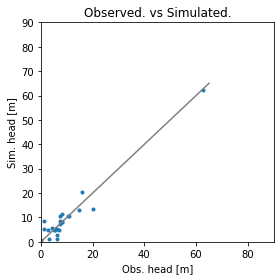

Error is - 2.858260485887168
Params are - [1.00608038e+00 1.74150589e+01 1.18788473e+01 6.94616375e-01
 8.90576149e-01 1.35523860e-01 2.24894170e-03 2.67368080e-01
 1.62799056e-01 5.17682782e-01 1.81815216e-03 6.98009451e+00]


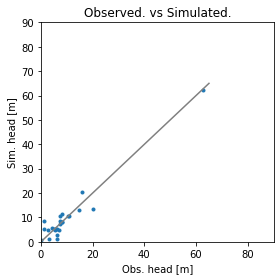

Error is - 2.8584086057765647
Params are - [1.01886477e+00 1.74251567e+01 1.11478637e+01 7.09759272e-01
 8.79261923e-01 1.08463974e-01 2.26373831e-03 2.27732342e-01
 1.59555126e-01 5.39261300e-01 1.84947249e-03 7.43032751e+00]


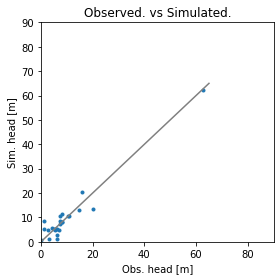

Error is - 2.8581177704013148
Params are - [9.92113323e-01 1.71758378e+01 1.10029541e+01 7.07991337e-01
 8.89767941e-01 1.29395545e-01 2.25847388e-03 2.60703124e-01
 1.61037831e-01 5.26455844e-01 1.85333383e-03 7.07052322e+00]


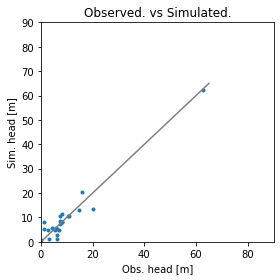

Error is - 2.8580032934104893
Params are - [9.92026867e-01 1.68887021e+01 1.08579220e+01 7.17743081e-01
 8.90650349e-01 1.26787125e-01 2.25677215e-03 2.47434975e-01
 1.61563416e-01 5.32483502e-01 1.83013443e-03 7.01500186e+00]


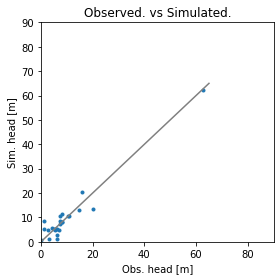

Error is - 2.8583457380887825
Params are - [1.02753882e+00 1.73856292e+01 1.06303956e+01 7.26941051e-01
 8.78245126e-01 1.09723402e-01 2.26619818e-03 1.99374014e-01
 1.59763672e-01 5.40732115e-01 1.85965050e-03 7.56476285e+00]


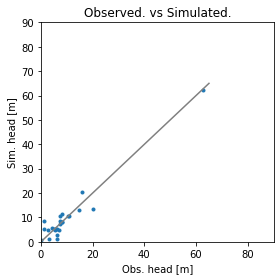

Error is - 2.858215327987156
Params are - [9.90206650e-01 1.73032686e+01 1.12107400e+01 7.00458119e-01
 8.89611747e-01 1.37115177e-01 2.26168625e-03 2.56869845e-01
 1.62052941e-01 5.22088374e-01 1.86919987e-03 7.15660038e+00]


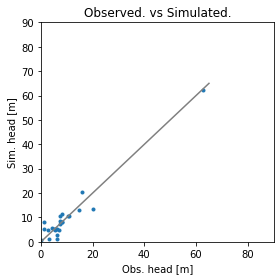

Error is - 2.8581214978919025
Params are - [1.00106305e+00 1.72410254e+01 1.08944983e+01 7.17205831e-01
 8.89999124e-01 1.34929112e-01 2.25879943e-03 2.25659436e-01
 1.61193902e-01 5.28072904e-01 1.84921121e-03 7.27922922e+00]


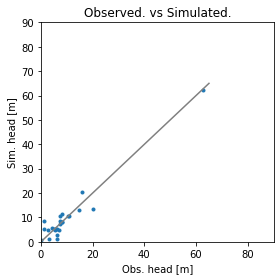

Error is - 2.8581392818523446
Params are - [1.01974643e+00 1.73185112e+01 1.07966350e+01 7.21657910e-01
 8.89681780e-01 1.40541890e-01 2.25502840e-03 2.11883653e-01
 1.61462360e-01 5.23271808e-01 1.83814979e-03 7.32949998e+00]


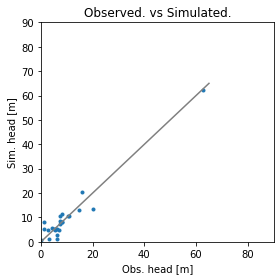

Error is - 2.858188630820935
Params are - [9.96547407e-01 1.75027704e+01 1.16434896e+01 7.09857455e-01
 8.89696679e-01 1.32059100e-01 2.26094266e-03 2.18552288e-01
 1.61837981e-01 5.28561063e-01 1.86142577e-03 7.20565536e+00]


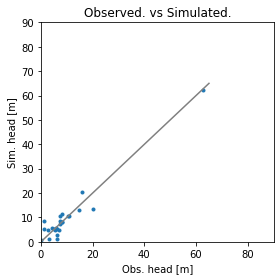

Error is - 2.857919394392424
Params are - [1.00363858e+00 1.69523095e+01 1.08024452e+01 7.17769493e-01
 8.83623511e-01 1.27581256e-01 2.26581119e-03 2.39356742e-01
 1.60496031e-01 5.33016330e-01 1.84449525e-03 7.13146532e+00]


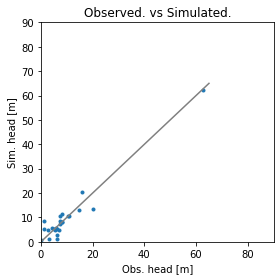

Error is - 2.857893291785468
Params are - [1.00732950e+00 1.65487566e+01 1.05219147e+01 7.26967118e-01
 8.79073577e-01 1.23552054e-01 2.27121690e-03 2.33981070e-01
 1.60020805e-01 5.40567191e-01 1.82713166e-03 7.05757924e+00]


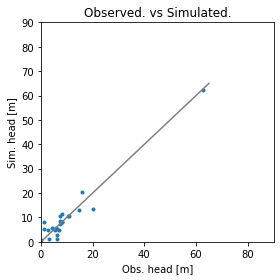

Error is - 2.8581125455969483
Params are - [9.99025637e-01 1.70794909e+01 1.09211837e+01 7.21236222e-01
 8.91440985e-01 1.49875576e-01 2.25315661e-03 2.46200779e-01
 1.63183145e-01 5.17047091e-01 1.81439455e-03 6.90658538e+00]


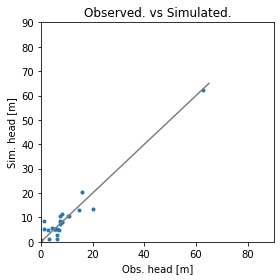

Error is - 2.8580167797507157
Params are - [1.02685498e+00 1.70197207e+01 1.09239478e+01 7.30655982e-01
 8.81524636e-01 1.14240897e-01 2.26014550e-03 1.90178256e-01
 1.62792710e-01 5.43270798e-01 1.80515402e-03 7.33766453e+00]


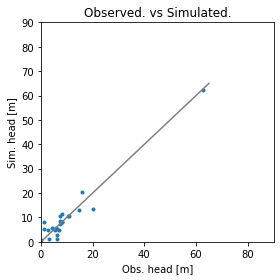

Error is - 2.858397781092867
Params are - [9.86865430e-01 1.69988229e+01 1.08464245e+01 7.19634531e-01
 8.96264886e-01 1.57097500e-01 2.25583739e-03 2.46753097e-01
 1.63657639e-01 5.14497250e-01 1.84191322e-03 6.88647433e+00]


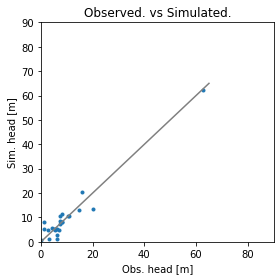

Error is - 2.8581434216917194
Params are - [9.94865266e-01 1.71054064e+01 1.09217843e+01 7.17165717e-01
 8.92014145e-01 1.44939119e-01 2.25781262e-03 2.41997908e-01
 1.62632011e-01 5.20688263e-01 1.84380304e-03 7.02243763e+00]


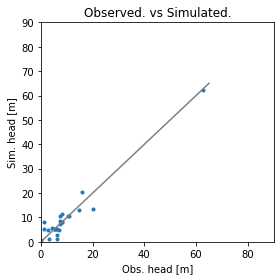

Error is - 2.857885288410314
Params are - [1.03633030e+00 1.69174862e+01 1.11161388e+01 7.35644352e-01
 8.89338690e-01 1.28750850e-01 2.25116390e-03 1.85935084e-01
 1.62283193e-01 5.32016437e-01 1.78445657e-03 7.22537270e+00]


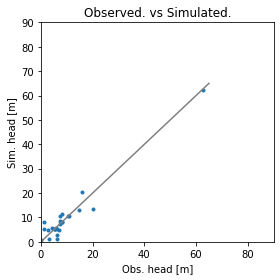

Error is - 2.8579780427045223
Params are - [1.06797655e+00 1.66516316e+01 1.12320167e+01 7.54919211e-01
 8.90497831e-01 1.24140356e-01 2.24329703e-03 1.37952624e-01
 1.62838402e-01 5.37228874e-01 1.72772930e-03 7.29727244e+00]


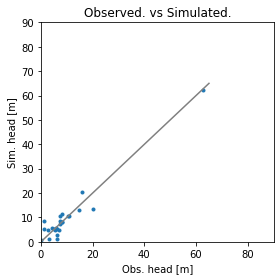

Error is - 2.857803652074249
Params are - [1.02134552e+00 1.68958890e+01 1.12511441e+01 7.24762490e-01
 8.79668539e-01 1.11957545e-01 2.25930859e-03 1.86729002e-01
 1.62163707e-01 5.50564945e-01 1.78901141e-03 7.36018272e+00]


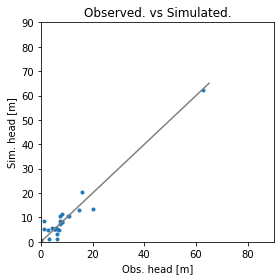

Error is - 2.857962059148752
Params are - [1.03455644e+00 1.66479591e+01 1.14758301e+01 7.31179211e-01
 8.71682662e-01 9.24119094e-02 2.26012849e-03 1.46338387e-01
 1.62528648e-01 5.72256363e-01 1.74461752e-03 7.54699181e+00]


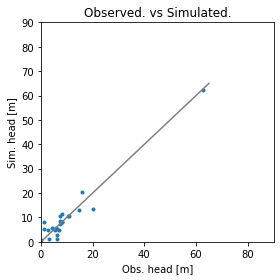

Error is - 2.858331685745688
Params are - [9.87698181e-01 1.68203851e+01 1.15259787e+01 7.09387390e-01
 8.97300941e-01 1.53655315e-01 2.24963094e-03 2.52757715e-01
 1.64233866e-01 5.18653745e-01 1.79538692e-03 6.74788773e+00]


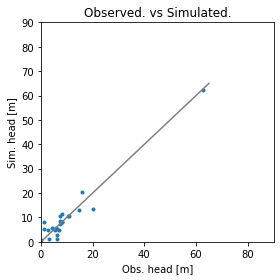

Error is - 2.858049620032175
Params are - [9.97658340e-01 1.69616962e+01 1.13020829e+01 7.13775806e-01
 8.92536987e-01 1.42672337e-01 2.25377275e-03 2.39411790e-01
 1.63116318e-01 5.24173337e-01 1.81145281e-03 6.95210651e+00]


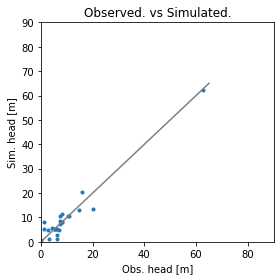

Error is - 2.8583336823696484
Params are - [1.00775295e+00 1.67153950e+01 1.01813995e+01 7.44905305e-01
 8.85296724e-01 1.29046270e-01 2.26769259e-03 1.80104268e-01
 1.61251359e-01 5.42784837e-01 1.83576870e-03 7.32789141e+00]


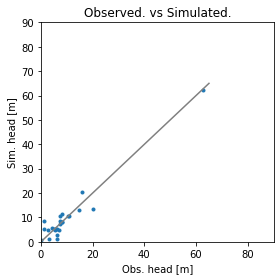

Error is - 2.8580059931939465
Params are - [1.00649852e+00 1.72401429e+01 1.14544854e+01 7.07188608e-01
 8.89256293e-01 1.33904463e-01 2.25362942e-03 2.45552127e-01
 1.62412131e-01 5.23958296e-01 1.82255629e-03 7.06704374e+00]


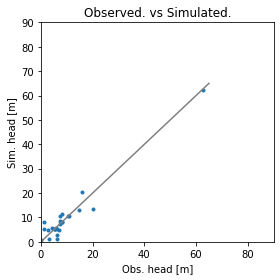

Error is - 2.857879326801255
Params are - [1.02634199e+00 1.68166644e+01 1.08901311e+01 7.40185310e-01
 8.86201883e-01 1.26919834e-01 2.25360524e-03 1.88716217e-01
 1.62057338e-01 5.38690898e-01 1.77694706e-03 7.13645944e+00]


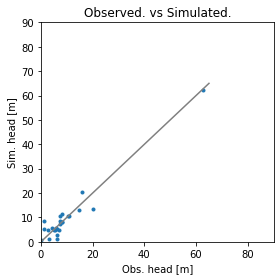

Error is - 2.8581541802184223
Params are - [1.02496699e+00 1.65028116e+01 1.03318217e+01 7.35840616e-01
 8.85534485e-01 1.31119367e-01 2.25312593e-03 2.22061095e-01
 1.62308858e-01 5.33906516e-01 1.77064137e-03 7.07587179e+00]


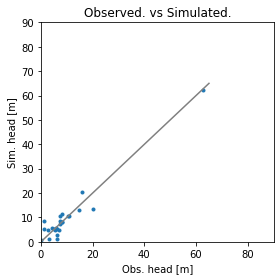

Error is - 2.8579724476513473
Params are - [1.01786210e+00 1.67528013e+01 1.06597387e+01 7.29344826e-01
 8.86575034e-01 1.31354300e-01 2.25508011e-03 2.21183893e-01
 1.62191139e-01 5.32570152e-01 1.79333747e-03 7.10831769e+00]


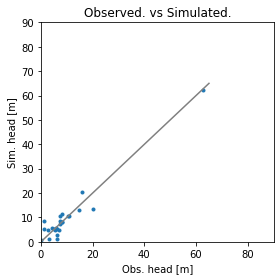

Error is - 2.857843705178851
Params are - [1.03048194e+00 1.68414081e+01 1.10098528e+01 7.30562206e-01
 8.82310501e-01 1.15975212e-01 2.25580055e-03 1.95146472e-01
 1.61441350e-01 5.43759631e-01 1.77985317e-03 7.27340287e+00]


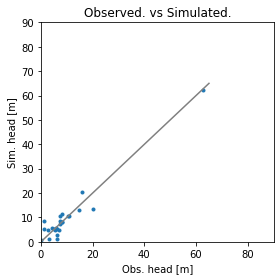

Error is - 2.857959313461788
Params are - [1.00739002e+00 1.65487861e+01 1.11705384e+01 7.27554061e-01
 8.83414320e-01 1.16277994e-01 2.25871346e-03 2.22471198e-01
 1.62607499e-01 5.44590723e-01 1.77579032e-03 6.95699100e+00]


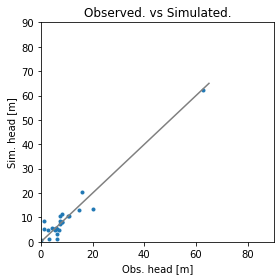

Error is - 2.857922187683439
Params are - [1.02712791e+00 1.65108987e+01 1.11186817e+01 7.33730846e-01
 8.81999508e-01 1.18782252e-01 2.25492810e-03 2.08164041e-01
 1.63111557e-01 5.42542596e-01 1.75249209e-03 6.95355539e+00]


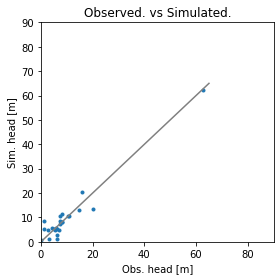

Error is - 2.8579810845378515
Params are - [1.03384903e+00 1.65776679e+01 1.11249127e+01 7.31782892e-01
 8.78984068e-01 9.86535673e-02 2.26086617e-03 1.81283242e-01
 1.61110383e-01 5.57817660e-01 1.77699167e-03 7.33402757e+00]


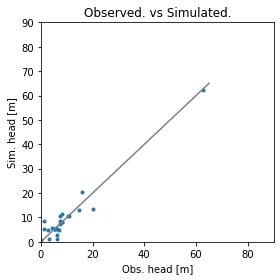

Error is - 2.858071469946263
Params are - [1.04124811e+00 1.66314579e+01 1.07144851e+01 7.42244489e-01
 8.75629246e-01 9.85203449e-02 2.26143227e-03 1.78384140e-01
 1.60842887e-01 5.56298801e-01 1.77418988e-03 7.35215994e+00]


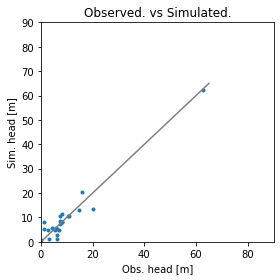

Error is - 2.857909018767516
Params are - [1.00855578e+00 1.68791366e+01 1.11551835e+01 7.20892977e-01
 8.88310052e-01 1.31634339e-01 2.25568763e-03 2.24154877e-01
 1.62547960e-01 5.32204703e-01 1.80213708e-03 7.05211987e+00]


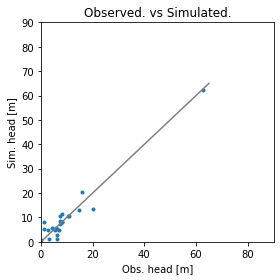

Error is - 2.8578848148617015
Params are - [1.00900160e+00 1.65500026e+01 1.11311595e+01 7.23737145e-01
 8.87772499e-01 1.29850692e-01 2.25431654e-03 2.33280443e-01
 1.61125703e-01 5.35356991e-01 1.77998586e-03 6.91901115e+00]


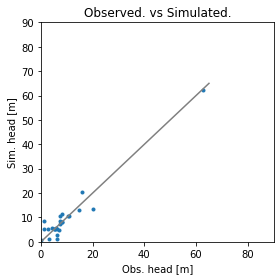

Error is - 2.8580191900852747
Params are - [1.02977524e+00 1.62145570e+01 1.05467343e+01 7.49962609e-01
 8.79793544e-01 1.09511498e-01 2.26094713e-03 1.75861292e-01
 1.61291877e-01 5.56569276e-01 1.75548850e-03 7.16495985e+00]


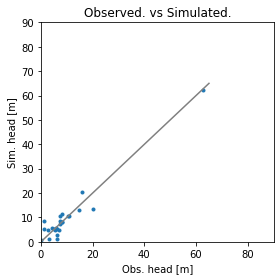

Error is - 2.857872985796537
Params are - [1.01231770e+00 1.69837464e+01 1.12275476e+01 7.17882108e-01
 8.86890605e-01 1.27806222e-01 2.25545885e-03 2.28129418e-01
 1.62132068e-01 5.32111041e-01 1.80578935e-03 7.09152276e+00]


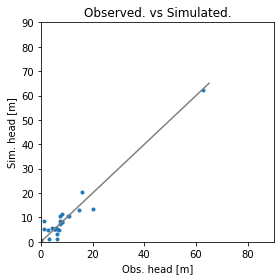

Error is - 2.8577635712189964
Params are - [1.04762870e+00 1.65818385e+01 1.12049019e+01 7.39431308e-01
 8.77772864e-01 1.16798685e-01 2.25758552e-03 1.70760851e-01
 1.62235367e-01 5.47981992e-01 1.74385285e-03 7.22975521e+00]


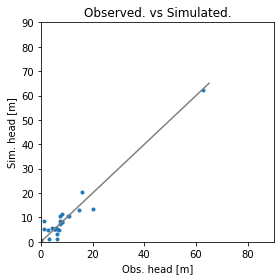

Error is - 2.8578156606262652
Params are - [1.07542961e+00 1.64284068e+01 1.13783918e+01 7.50275421e-01
 8.71334121e-01 1.11804466e-01 2.25799221e-03 1.32423789e-01
 1.62571343e-01 5.55731237e-01 1.70071206e-03 7.33713188e+00]


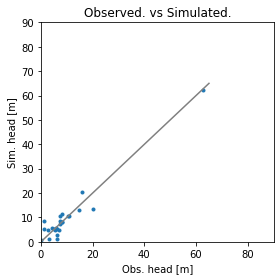

Error is - 2.8580540591631416
Params are - [1.00810315e+00 1.68935679e+01 1.09512427e+01 7.26666233e-01
 8.89237278e-01 1.47956429e-01 2.25294472e-03 2.35158853e-01
 1.62875898e-01 5.21008557e-01 1.79147248e-03 6.89335077e+00]


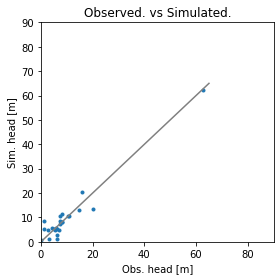

Error is - 2.857825803081682
Params are - [1.02741256e+00 1.66566429e+01 1.10814952e+01 7.30503727e-01
 8.81547370e-01 1.10979283e-01 2.25888581e-03 1.94752144e-01
 1.61551762e-01 5.48615384e-01 1.78061187e-03 7.22385837e+00]


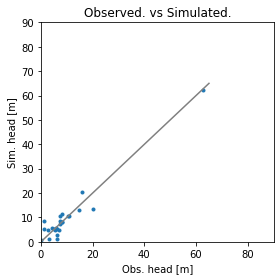

Error is - 2.8577568298530815
Params are - [1.02568182e+00 1.67024081e+01 1.14867095e+01 7.29297449e-01
 8.80808368e-01 1.11859860e-01 2.25936507e-03 1.90852910e-01
 1.61688579e-01 5.48930269e-01 1.77300575e-03 7.13831743e+00]


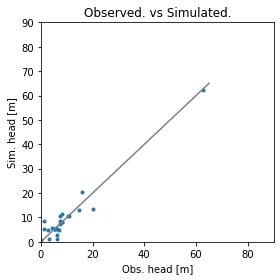

Error is - 2.8578338122181246
Params are - [1.02959169e+00 1.66772114e+01 1.19001949e+01 7.29273760e-01
 8.77925034e-01 1.02112640e-01 2.26150755e-03 1.75687418e-01
 1.61437299e-01 5.57110328e-01 1.76283988e-03 7.15331731e+00]


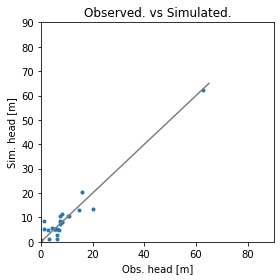

Error is - 2.857794826869137
Params are - [1.03920253e+00 1.69320269e+01 1.10286050e+01 7.31378778e-01
 8.83534756e-01 1.26199811e-01 2.25584033e-03 1.84295891e-01
 1.61119066e-01 5.37632957e-01 1.79008880e-03 7.31986519e+00]


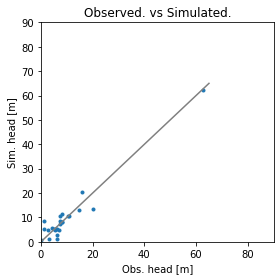

Error is - 2.8578469632781474
Params are - [1.02147709e+00 1.70401023e+01 1.10654489e+01 7.24809981e-01
 8.85205443e-01 1.24931812e-01 2.25977772e-03 1.94625023e-01
 1.60282926e-01 5.38862810e-01 1.81965315e-03 7.38435243e+00]


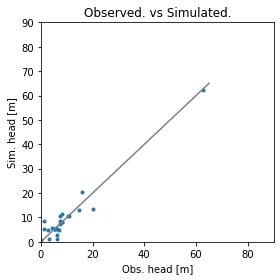

Error is - 2.8577360206389724
Params are - [1.04220276e+00 1.66986921e+01 1.10139914e+01 7.38300685e-01
 8.78377464e-01 1.10962637e-01 2.25969987e-03 1.73712544e-01
 1.60469017e-01 5.50310388e-01 1.77292750e-03 7.34116005e+00]


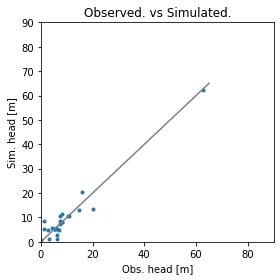

Error is - 2.85782476915941
Params are - [1.05902625e+00 1.66084698e+01 1.09433953e+01 7.47004539e-01
 8.73411170e-01 1.00626787e-01 2.26170600e-03 1.48491377e-01
 1.59429546e-01 5.59363230e-01 1.75832271e-03 7.48568014e+00]


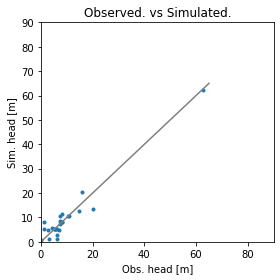

Error is - 2.85804704330867
Params are - [1.04924125e+00 1.70540613e+01 1.17292729e+01 7.34115472e-01
 8.87497920e-01 1.16946687e-01 2.24225109e-03 1.53841596e-01
 1.63070875e-01 5.43571766e-01 1.73889889e-03 7.38296415e+00]


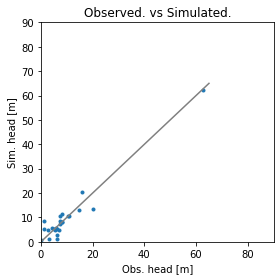

Error is - 2.8577828518957835
Params are - [1.01780744e+00 1.66750828e+01 1.08237543e+01 7.28754206e-01
 8.81179663e-01 1.21900712e-01 2.26397545e-03 2.13946202e-01
 1.60783322e-01 5.41318335e-01 1.80507347e-03 7.13892546e+00]


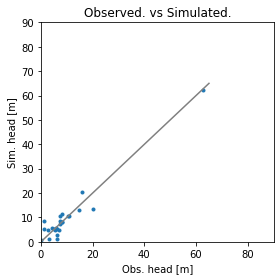

Error is - 2.857695906883178
Params are - [1.01715331e+00 1.66449312e+01 1.10863181e+01 7.24289880e-01
 8.75872969e-01 1.10606201e-01 2.26443936e-03 2.06556102e-01
 1.60558508e-01 5.53672837e-01 1.78501013e-03 7.20076281e+00]


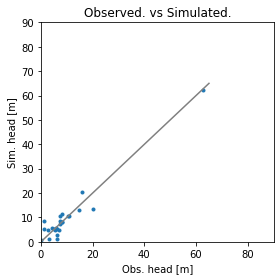

Error is - 2.8576953452595224
Params are - [1.00756481e+00 1.65086537e+01 1.10714077e+01 7.18612644e-01
 8.69140108e-01 1.01533876e-01 2.27107709e-03 2.16866611e-01
 1.59696165e-01 5.64501036e-01 1.78528691e-03 7.18845787e+00]


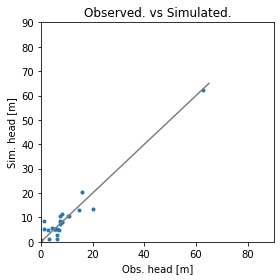

Error is - 2.857839114516806
Params are - [1.04424254e+00 1.70055233e+01 1.10613388e+01 7.35343003e-01
 8.74333761e-01 1.04786889e-01 2.26408014e-03 1.56475104e-01
 1.61477742e-01 5.55189624e-01 1.79036436e-03 7.55203215e+00]


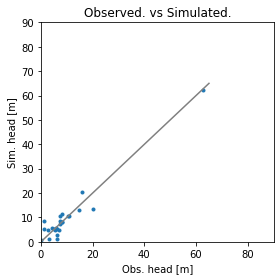

Error is - 2.8577484579699335
Params are - [1.02988558e+00 1.67703379e+01 1.13309018e+01 7.18087788e-01
 8.73926357e-01 1.04028924e-01 2.26653726e-03 1.95665812e-01
 1.60449507e-01 5.54605504e-01 1.79563937e-03 7.40384599e+00]


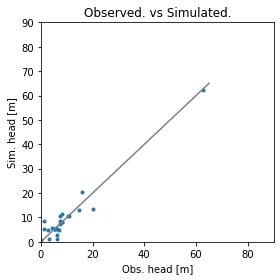

Error is - 2.8577010206775193
Params are - [1.04683785e+00 1.65676878e+01 1.10107109e+01 7.40425269e-01
 8.71076927e-01 9.91796528e-02 2.26653005e-03 1.50842009e-01
 1.60094351e-01 5.64934439e-01 1.76510542e-03 7.50083653e+00]


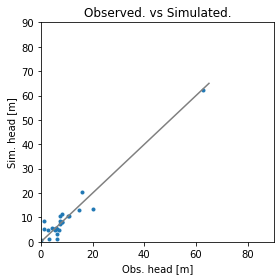

Error is - 2.8579083388030897
Params are - [1.04190526e+00 1.64325962e+01 1.11636867e+01 7.36099944e-01
 8.70407337e-01 9.77620358e-02 2.26333657e-03 1.77049236e-01
 1.61912063e-01 5.62527940e-01 1.74215033e-03 7.22742087e+00]


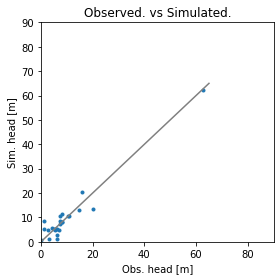

Error is - 2.8577472926702128
Params are - [1.02658413e+00 1.68882258e+01 1.10900083e+01 7.27632472e-01
 8.81505916e-01 1.18139368e-01 2.26066743e-03 1.90231076e-01
 1.60690210e-01 5.44779093e-01 1.80027744e-03 7.34511954e+00]


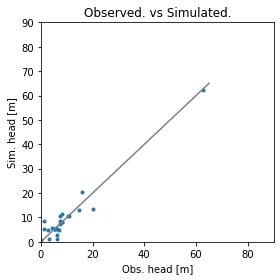

Error is - 2.8576115088386302
Params are - [1.03225077e+00 1.66390934e+01 1.12326420e+01 7.29859431e-01
 8.73168181e-01 1.07079329e-01 2.26812489e-03 1.75708554e-01
 1.60628449e-01 5.57801030e-01 1.78535435e-03 7.35032322e+00]


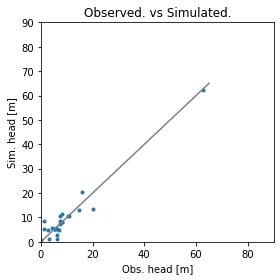

Error is - 2.85755123615554
Params are - [1.03313518e+00 1.65379360e+01 1.13440367e+01 7.29508043e-01
 8.68597022e-01 1.02631387e-01 2.27428706e-03 1.65989594e-01
 1.60221999e-01 5.64821730e-01 1.78810494e-03 7.38878339e+00]


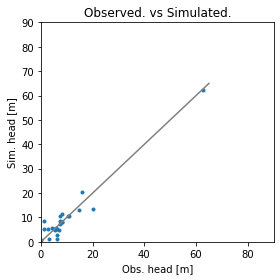

Error is - 2.8577515640918656
Params are - [1.01663894e+00 1.63970470e+01 1.12282724e+01 7.24106140e-01
 8.80188798e-01 1.17908401e-01 2.26154644e-03 2.15965670e-01
 1.60382767e-01 5.47976388e-01 1.77446660e-03 7.04448581e+00]


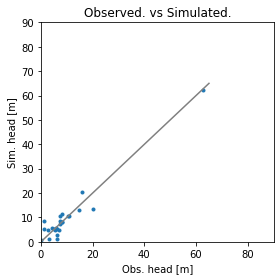

Error is - 2.8575724451565234
Params are - [1.03167332e+00 1.67026614e+01 1.12325788e+01 7.27879152e-01
 8.72748760e-01 1.12870860e-01 2.26718422e-03 1.81224217e-01
 1.60113915e-01 5.54444129e-01 1.78319487e-03 7.34276416e+00]


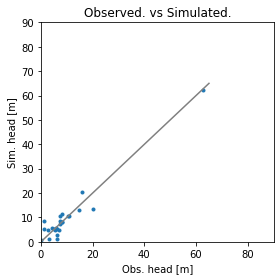

Error is - 2.8576601860721835
Params are - [1.03946165e+00 1.64312107e+01 1.10598357e+01 7.34139833e-01
 8.73474295e-01 1.12044818e-01 2.26807404e-03 1.88329896e-01
 1.59160337e-01 5.53141098e-01 1.77382591e-03 7.20353672e+00]


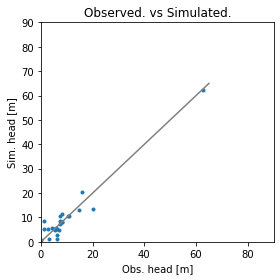

Error is - 2.8577744619109255
Params are - [1.02164783e+00 1.63116034e+01 1.12875798e+01 7.27983720e-01
 8.67931334e-01 9.54433860e-02 2.27358126e-03 1.91435341e-01
 1.59878523e-01 5.68657776e-01 1.77003804e-03 7.22446617e+00]


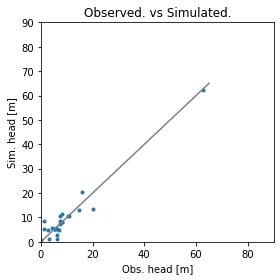

Error is - 2.857648458773361
Params are - [1.04368299e+00 1.65079676e+01 1.15697349e+01 7.30479877e-01
 8.68078373e-01 9.53329306e-02 2.26704710e-03 1.58033220e-01
 1.60063467e-01 5.69528972e-01 1.74921413e-03 7.41966268e+00]


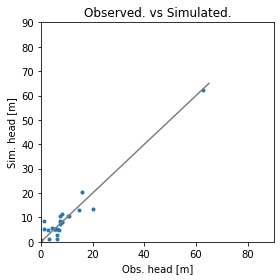

Error is - 2.8577460922292706
Params are - [1.04351512e+00 1.69041744e+01 1.11529351e+01 7.31666390e-01
 8.81351208e-01 1.21771847e-01 2.25635227e-03 1.74977061e-01
 1.60999090e-01 5.42334730e-01 1.78077891e-03 7.36665473e+00]


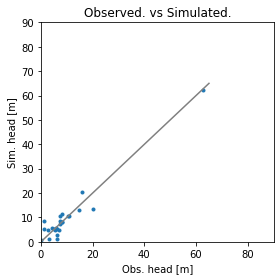

Error is - 2.8576409038767654
Params are - [1.01684866e+00 1.66876618e+01 1.12269520e+01 7.18924649e-01
 8.72106069e-01 1.01245408e-01 2.27214246e-03 1.96354252e-01
 1.58436200e-01 5.62069304e-01 1.81311844e-03 7.38418227e+00]


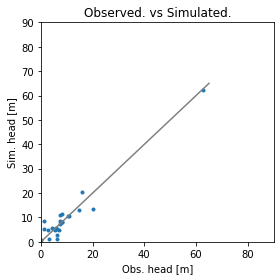

Error is - 2.857601344942934
Params are - [1.03732334e+00 1.65646346e+01 1.09018514e+01 7.27329708e-01
 8.67620182e-01 1.04415158e-01 2.27249248e-03 1.77179084e-01
 1.58440925e-01 5.63310866e-01 1.79065100e-03 7.51659752e+00]


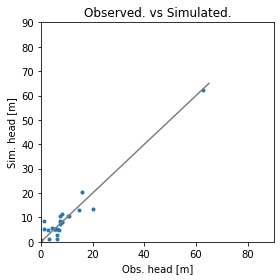

Error is - 2.8576744455683145
Params are - [1.04981363e+00 1.68979270e+01 1.11058851e+01 7.33058278e-01
 8.66144982e-01 9.61177439e-02 2.27213544e-03 1.45601892e-01
 1.59423097e-01 5.66820493e-01 1.79188754e-03 7.68911444e+00]


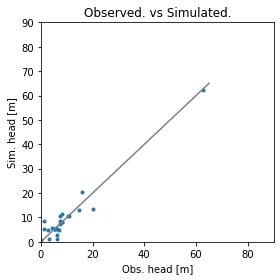

Error is - 2.8575872557001607
Params are - [1.03988832e+00 1.65459009e+01 1.09657529e+01 7.41571712e-01
 8.71110527e-01 1.08678691e-01 2.26807766e-03 1.57557764e-01
 1.59185289e-01 5.62227209e-01 1.77008946e-03 7.37729900e+00]


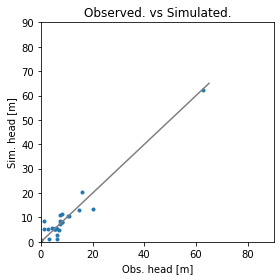

Error is - 2.857566491910287
Params are - [1.04540714e+00 1.63709588e+01 1.11859371e+01 7.34350235e-01
 8.61798403e-01 9.29914673e-02 2.27518252e-03 1.57546948e-01
 1.58693765e-01 5.74961639e-01 1.76042006e-03 7.44138868e+00]


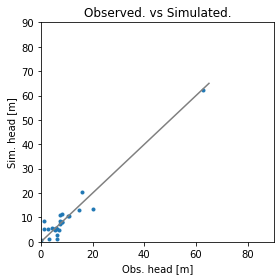

Error is - 2.8577996464047786
Params are - [1.02879149e+00 1.62661410e+01 1.11285106e+01 7.30763625e-01
 8.58694311e-01 8.45622579e-02 2.28263606e-03 1.69895945e-01
 1.58000664e-01 5.82843820e-01 1.77652546e-03 7.43230916e+00]


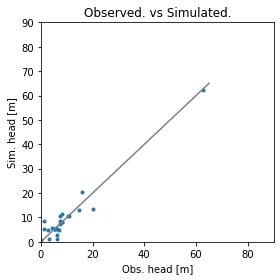

Error is - 2.8576299475581948
Params are - [1.03983421e+00 1.67446660e+01 1.11468290e+01 7.31440698e-01
 8.75686983e-01 1.12469450e-01 2.26292322e-03 1.73706782e-01
 1.60249484e-01 5.52462003e-01 1.77971554e-03 7.38306833e+00]


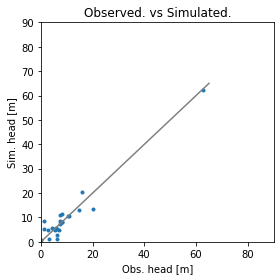

Error is - 2.8574659599593675
Params are - [1.02970909e+00 1.64792856e+01 1.12895940e+01 7.22985998e-01
 8.61219641e-01 9.56226032e-02 2.27982568e-03 1.71159501e-01
 1.58494148e-01 5.75226765e-01 1.78550821e-03 7.46478855e+00]


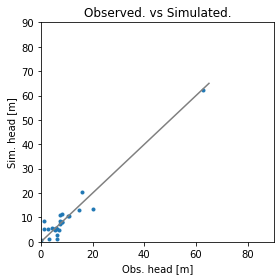

Error is - 2.8580146728725
Params are - [1.02346225e+00 1.63695824e+01 1.14273953e+01 7.15328655e-01
 8.52640729e-01 8.79525861e-02 2.28988859e-03 1.69882980e-01
 1.57506713e-01 5.87684954e-01 1.79179856e-03 7.52660280e+00]


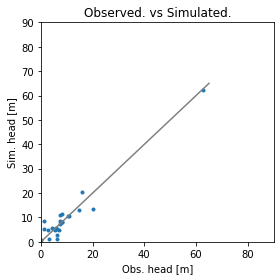

Error is - 2.8575418630437044
Params are - [1.02221921e+00 1.65955562e+01 1.13393549e+01 7.17954869e-01
 8.66877297e-01 1.06812746e-01 2.27521145e-03 1.97416284e-01
 1.58602114e-01 5.62318102e-01 1.79673075e-03 7.29910407e+00]


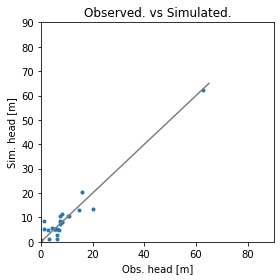

Error is - 2.8575051158548304
Params are - [1.06393465e+00 1.66690741e+01 1.13233160e+01 7.39657865e-01
 8.68436980e-01 1.05338335e-01 2.27135347e-03 1.28149962e-01
 1.58817958e-01 5.62387682e-01 1.77845657e-03 7.62992377e+00]


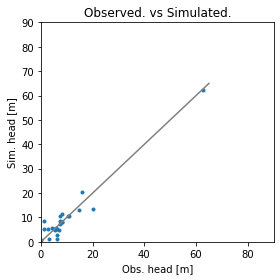

Error is - 2.857652871458103
Params are - [1.02403933e+00 1.62416587e+01 1.13250771e+01 7.26312161e-01
 8.71814106e-01 1.12291232e-01 2.27016478e-03 1.96506025e-01
 1.58990170e-01 5.59329423e-01 1.76961744e-03 7.11940209e+00]


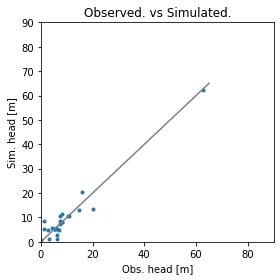

Error is - 2.857449548695692
Params are - [1.03182092e+00 1.66767830e+01 1.14153334e+01 7.23925995e-01
 8.64208096e-01 9.64052273e-02 2.27457464e-03 1.55140710e-01
 1.59224568e-01 5.74040206e-01 1.78697766e-03 7.59095737e+00]


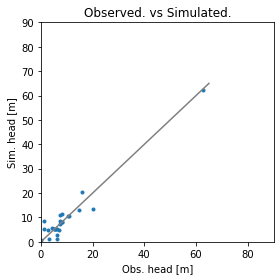

Error is - 2.8574625452851254
Params are - [1.02800055e+00 1.67995691e+01 1.15930823e+01 7.18819077e-01
 8.59574996e-01 8.85854321e-02 2.27782494e-03 1.38546116e-01
 1.59256684e-01 5.84489759e-01 1.79355353e-03 7.78466770e+00]


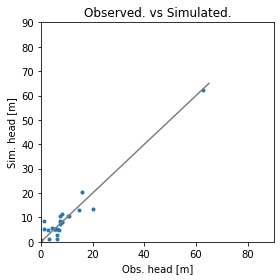

Error is - 2.857678612762742
Params are - [1.04854017e+00 1.69388557e+01 1.11651347e+01 7.31355972e-01
 8.64600616e-01 9.35111455e-02 2.27321888e-03 1.40070361e-01
 1.59433802e-01 5.70303678e-01 1.79407950e-03 7.75368455e+00]


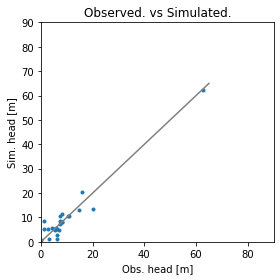

Error is - 2.857544804767315
Params are - [1.03016454e+00 1.64159579e+01 1.12850915e+01 7.27573114e-01
 8.70010734e-01 1.07596210e-01 2.27092831e-03 1.82397109e-01
 1.59101078e-01 5.62072987e-01 1.77573295e-03 7.27797270e+00]


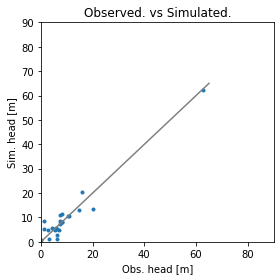

Error is - 2.857719731985584
Params are - [1.02664344e+00 1.66572118e+01 1.08730364e+01 7.26703796e-01
 8.68658410e-01 1.12513327e-01 2.27698343e-03 1.82603815e-01
 1.58200106e-01 5.58861464e-01 1.81890261e-03 7.42980896e+00]


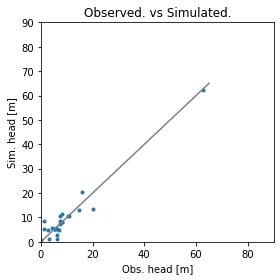

Error is - 2.857553862211292
Params are - [1.03942310e+00 1.65452786e+01 1.13955603e+01 7.29535857e-01
 8.68223382e-01 9.96280296e-02 2.26953118e-03 1.64175869e-01
 1.59597627e-01 5.66862095e-01 1.76663625e-03 7.42219925e+00]


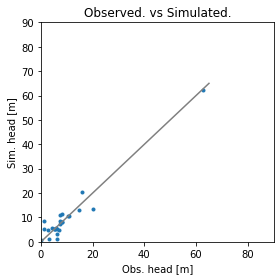

Error is - 2.8575139960505904
Params are - [1.05724018e+00 1.64537870e+01 1.12439207e+01 7.40027558e-01
 8.63983599e-01 1.06331286e-01 2.27145285e-03 1.38919719e-01
 1.60020945e-01 5.67119932e-01 1.74725127e-03 7.47162553e+00]


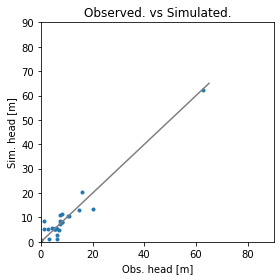

Error is - 2.8576276138972085
Params are - [1.03715562e+00 1.63483030e+01 1.13402256e+01 7.28942653e-01
 8.58452120e-01 9.40842171e-02 2.28209370e-03 1.55769345e-01
 1.58169571e-01 5.79170221e-01 1.77524345e-03 7.48749900e+00]


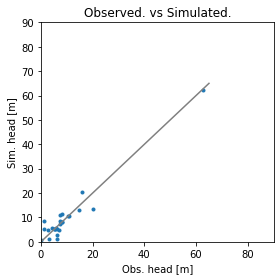

Error is - 2.8574474115554866
Params are - [1.03782527e+00 1.64473938e+01 1.12918765e+01 7.29567164e-01
 8.62760836e-01 9.86805253e-02 2.27730108e-03 1.60253704e-01
 1.58689549e-01 5.72493166e-01 1.77636148e-03 7.46139133e+00]


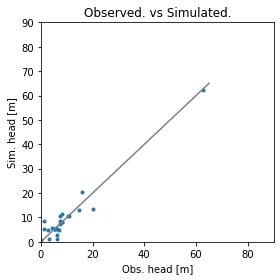

Error is - 2.857487779364736
Params are - [1.03975015e+00 1.65087943e+01 1.16502073e+01 7.33426552e-01
 8.65709031e-01 1.01182736e-01 2.27332588e-03 1.49476147e-01
 1.60019568e-01 5.69851741e-01 1.76192642e-03 7.34476878e+00]


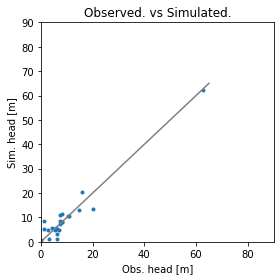

Error is - 2.857479519075879
Params are - [1.03716213e+00 1.65213436e+01 1.17003816e+01 7.17827021e-01
 8.61318436e-01 9.56698779e-02 2.27861540e-03 1.67750530e-01
 1.59414250e-01 5.72206153e-01 1.78112744e-03 7.47864560e+00]


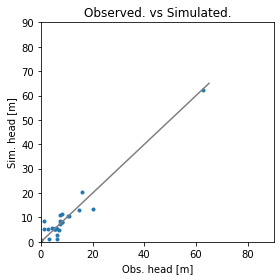

Error is - 2.8574731632571884
Params are - [1.04629194e+00 1.63343635e+01 1.15115229e+01 7.29844227e-01
 8.57775150e-01 8.86108782e-02 2.28141404e-03 1.41838462e-01
 1.58369014e-01 5.82949571e-01 1.76767746e-03 7.53582734e+00]


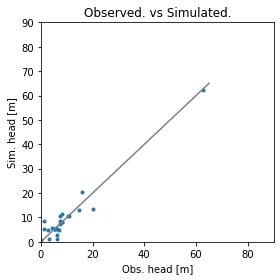

Error is - 2.857466947371205
Params are - [1.03270558e+00 1.66599667e+01 1.16124289e+01 7.22622143e-01
 8.68054964e-01 1.07760173e-01 2.27445431e-03 1.62897650e-01
 1.59735038e-01 5.63763382e-01 1.79166184e-03 7.45294260e+00]


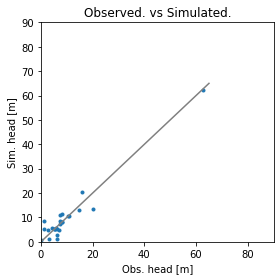

Error is - 2.8574524440888336
Params are - [1.03757004e+00 1.65047616e+01 1.14389505e+01 7.26284235e-01
 8.61601916e-01 1.02478968e-01 2.28092618e-03 1.56055694e-01
 1.58854078e-01 5.71346474e-01 1.78961658e-03 7.47725592e+00]


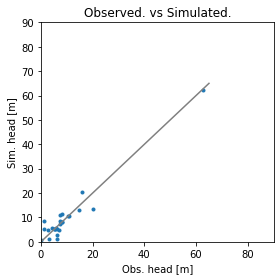

Error is - 2.8576973858429775
Params are - [1.04459711e+00 1.65065752e+01 1.15062930e+01 7.25774747e-01
 8.60062425e-01 9.94502071e-02 2.27727682e-03 1.52586318e-01
 1.58001719e-01 5.74474297e-01 1.76839983e-03 7.52541720e+00]


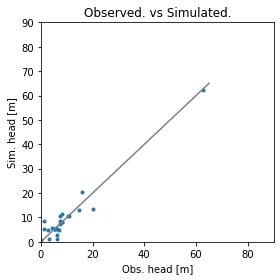

Error is - 2.8574801952063624
Params are - [1.03600066e+00 1.65300958e+01 1.13846007e+01 7.28574719e-01
 8.66463372e-01 1.01836092e-01 2.27503450e-03 1.62638775e-01
 1.59666929e-01 5.67234872e-01 1.78317866e-03 7.42294184e+00]


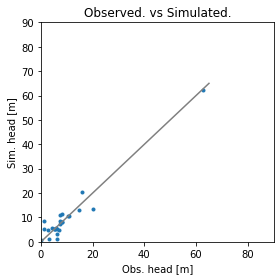

Error is - 2.8573993698223323
Params are - [1.04854043e+00 1.66475763e+01 1.15818230e+01 7.27876610e-01
 8.58057486e-01 9.35253645e-02 2.28131994e-03 1.32885747e-01
 1.59216949e-01 5.78083354e-01 1.78201277e-03 7.66038941e+00]


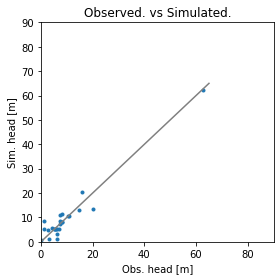

Error is - 2.857621011689118
Params are - [1.05772837e+00 1.67633855e+01 1.17301888e+01 7.28028358e-01
 8.52080862e-01 8.64899415e-02 2.28651576e-03 1.08130066e-01
 1.59274884e-01 5.86088538e-01 1.78515267e-03 7.85159777e+00]


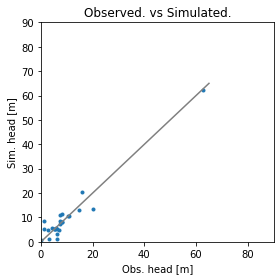

Error is - 2.857508871489838
Params are - [1.06087263e+00 1.64766480e+01 1.15679710e+01 7.39148479e-01
 8.59720954e-01 9.20942649e-02 2.27805488e-03 1.07111482e-01
 1.59818385e-01 5.80465781e-01 1.75856197e-03 7.69947227e+00]


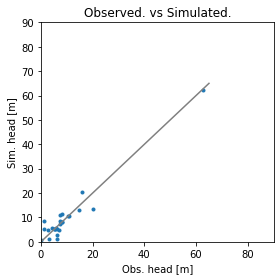

Error is - 2.857501457874403
Params are - [1.02645707e+00 1.66222273e+01 1.17174136e+01 7.16929276e-01
 8.61904211e-01 9.02028881e-02 2.28291381e-03 1.60306675e-01
 1.58365794e-01 5.77888260e-01 1.80992657e-03 7.56492527e+00]


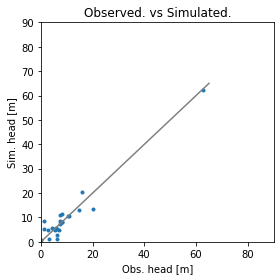

Error is - 2.8575777201083485
Params are - [1.01708869e+00 1.66236296e+01 1.14182704e+01 7.14105155e-01
 8.66530733e-01 1.04124680e-01 2.27712161e-03 2.00980777e-01
 1.58326256e-01 5.64112824e-01 1.80717663e-03 7.31465403e+00]


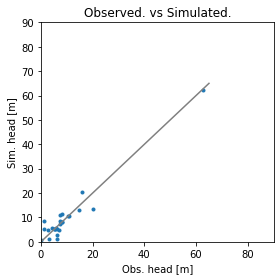

Error is - 2.8574464406136317
Params are - [1.04992665e+00 1.65133934e+01 1.15305459e+01 7.32887648e-01
 8.61423399e-01 9.51018687e-02 2.27782156e-03 1.30578806e-01
 1.59445353e-01 5.76377542e-01 1.77071564e-03 7.60326771e+00]


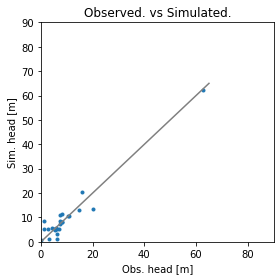

Error is - 2.8575378256740405
Params are - [1.01169201e+00 1.64052567e+01 1.16974637e+01 7.12467400e-01
 8.56645776e-01 8.91745325e-02 2.28490103e-03 1.80347105e-01
 1.59431248e-01 5.84522566e-01 1.78599188e-03 7.37975986e+00]


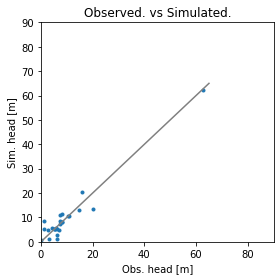

Error is - 2.8574402992128785
Params are - [1.05087399e+00 1.66031198e+01 1.14168529e+01 7.32860249e-01
 8.65489179e-01 1.01297384e-01 2.27474036e-03 1.41199248e-01
 1.58971281e-01 5.67921403e-01 1.78034040e-03 7.56738279e+00]


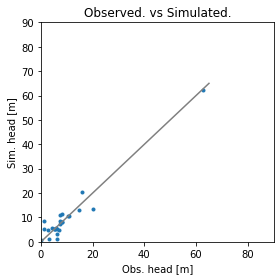

Error is - 2.857508099475225
Params are - [1.05323907e+00 1.64489189e+01 1.12532727e+01 7.37851151e-01
 8.63776040e-01 1.06159062e-01 2.27197845e-03 1.45005820e-01
 1.59984327e-01 5.67360845e-01 1.74959085e-03 7.44516794e+00]


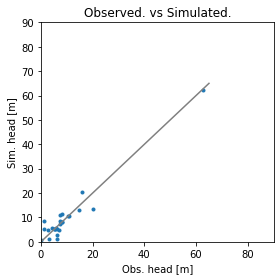

Error is - 2.8574400533284408
Params are - [1.03315257e+00 1.65789002e+01 1.16013784e+01 7.22159745e-01
 8.62372168e-01 9.41919315e-02 2.28017997e-03 1.56481462e-01
 1.58770427e-01 5.75256406e-01 1.79484264e-03 7.53498594e+00]


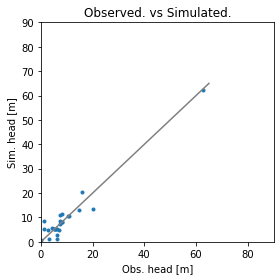

Error is - 2.857682913868733
Params are - [1.03884640e+00 1.65740363e+01 1.13123408e+01 7.19476074e-01
 8.59415076e-01 9.40140793e-02 2.28270874e-03 1.57003901e-01
 1.58122363e-01 5.76298141e-01 1.80307704e-03 7.69702729e+00]


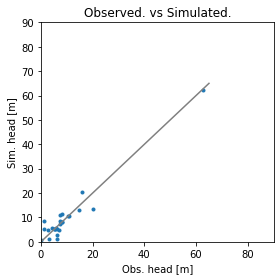

Error is - 2.8574459235252645
Params are - [1.03952421e+00 1.65251048e+01 1.15657407e+01 7.29938932e-01
 8.64135542e-01 9.93905721e-02 2.27567159e-03 1.51358085e-01
 1.59545266e-01 5.71463341e-01 1.77221407e-03 7.43283341e+00]


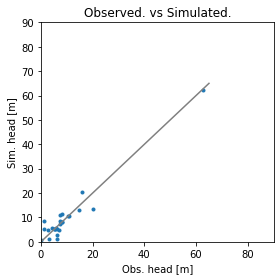

Error is - 2.8574671841850923
Params are - [1.04318314e+00 1.65519029e+01 1.16081374e+01 7.24555276e-01
 8.58272763e-01 9.29531367e-02 2.28110629e-03 1.41961158e-01
 1.58454725e-01 5.79619756e-01 1.77999737e-03 7.62050282e+00]


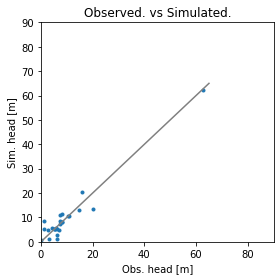

Error is - 2.857415350602366
Params are - [1.04302517e+00 1.65657483e+01 1.12769825e+01 7.36424349e-01
 8.62910087e-01 9.86665609e-02 2.27794055e-03 1.32551175e-01
 1.58547482e-01 5.75884075e-01 1.78186024e-03 7.58844193e+00]


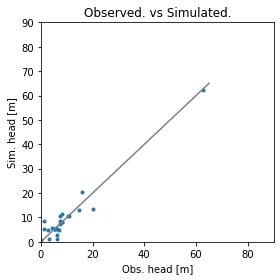

Error is - 2.8574701789871515
Params are - [1.03335090e+00 1.67912926e+01 1.14267511e+01 7.25503830e-01
 8.67309197e-01 1.07401508e-01 2.27456299e-03 1.56915361e-01
 1.59622464e-01 5.63963074e-01 1.79767402e-03 7.54002929e+00]


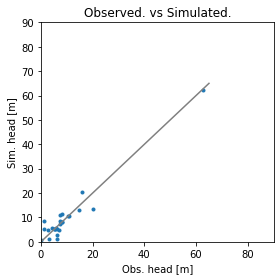

Error is - 2.857427249820078
Params are - [1.03658616e+00 1.66770603e+01 1.14479440e+01 7.26588929e-01
 8.64925685e-01 1.02703850e-01 2.27627575e-03 1.53146136e-01
 1.59309101e-01 5.68709698e-01 1.79017488e-03 7.53897880e+00]


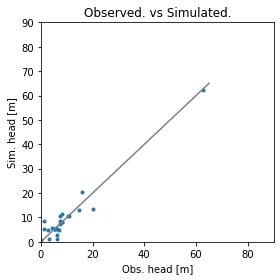

Error is - 2.8574822242238014
Params are - [1.03536020e+00 1.65946127e+01 1.13034377e+01 7.31131724e-01
 8.67920403e-01 1.04684368e-01 2.27406564e-03 1.58656828e-01
 1.59679149e-01 5.65474546e-01 1.78705037e-03 7.44176648e+00]


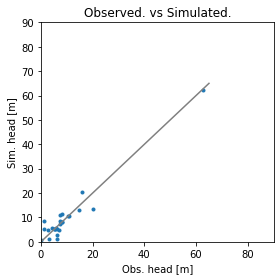

Error is - 2.8573893189319532
Params are - [1.04122741e+00 1.65625804e+01 1.15319625e+01 7.26199388e-01
 8.60684673e-01 9.58859446e-02 2.27934613e-03 1.46135076e-01
 1.58760831e-01 5.76083453e-01 1.78176062e-03 7.57581873e+00]


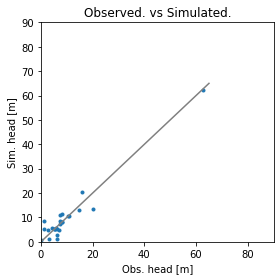

Error is - 2.857559124989011
Params are - [1.04725807e+00 1.64703178e+01 1.12857352e+01 7.33661065e-01
 8.56909820e-01 8.78982936e-02 2.28153293e-03 1.34926574e-01
 1.58236467e-01 5.83384265e-01 1.77373569e-03 7.62980605e+00]


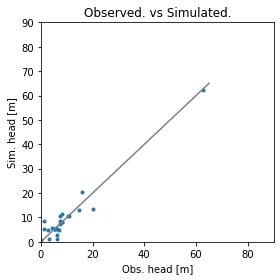

Error is - 2.8574279913532097
Params are - [1.03634371e+00 1.66125545e+01 1.15307554e+01 7.25381873e-01
 8.65268678e-01 1.02794703e-01 2.27622397e-03 1.55904881e-01
 1.59360396e-01 5.68668603e-01 1.78718030e-03 7.49715846e+00]


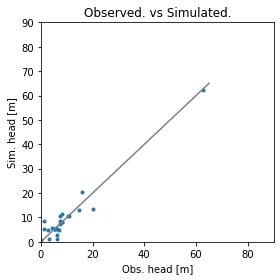

Error is - 2.857434298598226
Params are - [1.05136033e+00 1.66732104e+01 1.16487636e+01 7.33696521e-01
 8.64419983e-01 1.01231214e-01 2.27556127e-03 1.24122286e-01
 1.59621732e-01 5.70827855e-01 1.78016801e-03 7.62335508e+00]


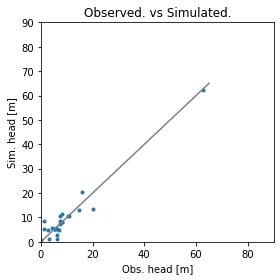

Error is - 2.857508463171114
Params are - [1.04579776e+00 1.66758092e+01 1.15343760e+01 7.31633666e-01
 8.64507386e-01 9.41668896e-02 2.27356662e-03 1.33903859e-01
 1.59389745e-01 5.74621710e-01 1.77448487e-03 7.63523757e+00]


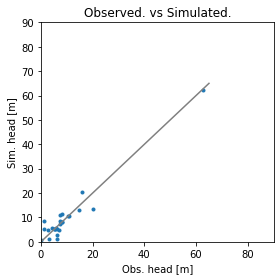

Error is - 2.857389028496918
Params are - [1.03962697e+00 1.65475235e+01 1.14628069e+01 7.27621593e-01
 8.62328283e-01 1.00400948e-01 2.27908629e-03 1.50517735e-01
 1.58987995e-01 5.72165283e-01 1.78583365e-03 7.51675133e+00]


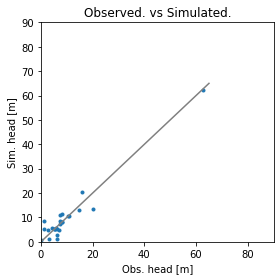

Error is - 2.8574188432813163
Params are - [1.05284789e+00 1.64822446e+01 1.15659053e+01 7.34607838e-01
 8.61587905e-01 1.00906584e-01 2.28067010e-03 1.34048347e-01
 1.58979825e-01 5.71615491e-01 1.77693312e-03 7.50916845e+00]


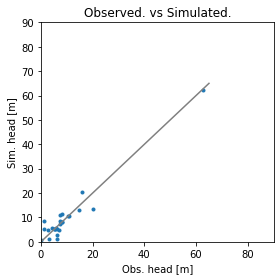

Error is - 2.857437665562434
Params are - [1.04934731e+00 1.67174423e+01 1.17350337e+01 7.29806782e-01
 8.62839676e-01 9.90022957e-02 2.27850517e-03 1.24567793e-01
 1.59563224e-01 5.73016251e-01 1.78764458e-03 7.64669734e+00]


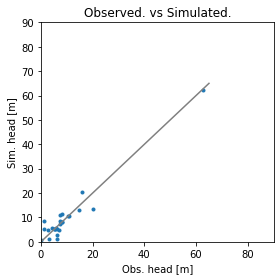

Error is - 2.857390242664677
Params are - [1.03714938e+00 1.66854508e+01 1.15304456e+01 7.25972820e-01
 8.64413159e-01 1.03231023e-01 2.27809862e-03 1.53240856e-01
 1.58827066e-01 5.68571661e-01 1.79611191e-03 7.51205924e+00]


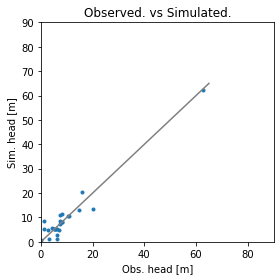

Error is - 2.8574133144492833
Params are - [1.04715601e+00 1.67004638e+01 1.14893683e+01 7.28260517e-01
 8.61747285e-01 9.95823953e-02 2.28065310e-03 1.32775372e-01
 1.58607452e-01 5.73003914e-01 1.79859644e-03 7.69569785e+00]


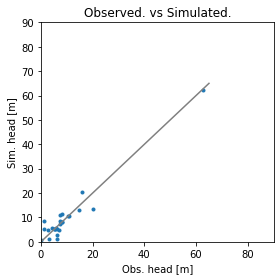

Error is - 2.8573805965392713
Params are - [1.03518657e+00 1.66386728e+01 1.16503419e+01 7.24572579e-01
 8.59769999e-01 9.73897518e-02 2.28256978e-03 1.41530230e-01
 1.59120799e-01 5.77392938e-01 1.79351280e-03 7.58253431e+00]


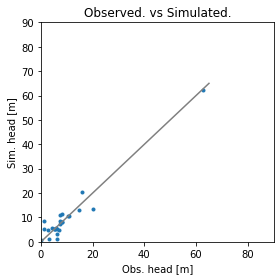

Error is - 2.8573965774222247
Params are - [1.02734286e+00 1.66564494e+01 1.17670864e+01 7.20428744e-01
 8.56910409e-01 9.54359356e-02 2.28648449e-03 1.41695721e-01
 1.59195558e-01 5.82128705e-01 1.80009899e-03 7.59011007e+00]


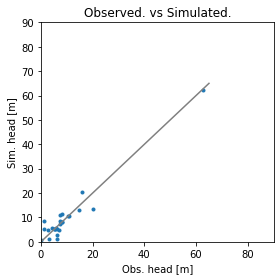

Error is - 2.8574234206901203
Params are - [1.05324698e+00 1.66728545e+01 1.14739771e+01 7.35675222e-01
 8.62453315e-01 1.05028174e-01 2.27752847e-03 1.23756144e-01
 1.59380048e-01 5.70414023e-01 1.77878891e-03 7.62285589e+00]


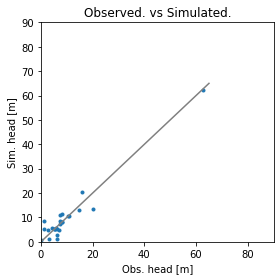

Error is - 2.8574620168116445
Params are - [1.03770219e+00 1.65268811e+01 1.12968123e+01 7.29006258e-01
 8.61921414e-01 1.01222123e-01 2.27904049e-03 1.55534538e-01
 1.58556722e-01 5.72220474e-01 1.78451103e-03 7.50717091e+00]


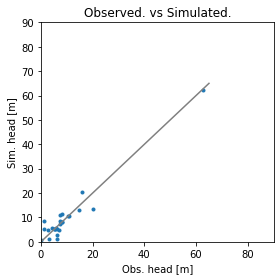

Error is - 2.8574067976807647
Params are - [1.04643603e+00 1.66698020e+01 1.16254784e+01 7.29606651e-01
 8.62610110e-01 9.95572526e-02 2.27863900e-03 1.32309479e-01
 1.59311598e-01 5.72817307e-01 1.78686119e-03 7.61181573e+00]


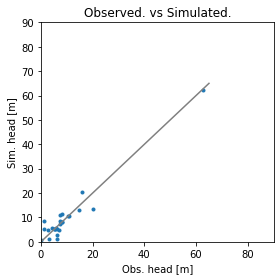

Error is - 2.8575582742288805
Params are - [1.03486845e+00 1.65705449e+01 1.13792015e+01 7.24434873e-01
 8.60039461e-01 9.87142120e-02 2.28249734e-03 1.57344577e-01
 1.58446524e-01 5.74740445e-01 1.79310313e-03 7.52858994e+00]


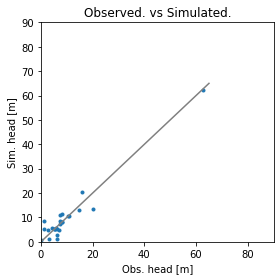

Error is - 2.8574071355577124
Params are - [1.04723736e+00 1.66475440e+01 1.15813731e+01 7.31381109e-01
 8.63324853e-01 1.00601963e-01 2.27729529e-03 1.32427859e-01
 1.59327930e-01 5.71806003e-01 1.78340179e-03 7.59966380e+00]


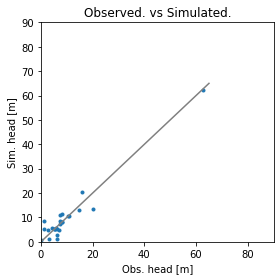

Error is - 2.8574300982301764
Params are - [1.05170069e+00 1.66370324e+01 1.15056460e+01 7.33749394e-01
 8.58866795e-01 9.67852656e-02 2.28201320e-03 1.21649145e-01
 1.58702450e-01 5.77422597e-01 1.78546109e-03 7.67187078e+00]


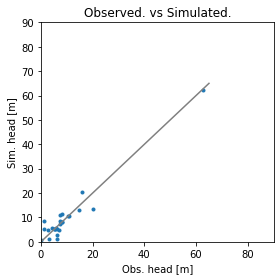

Error is - 2.857405839586103
Params are - [1.04018295e+00 1.66186740e+01 1.15244781e+01 7.27473753e-01
 8.63668207e-01 1.01292344e-01 2.27767128e-03 1.47340947e-01
 1.59195909e-01 5.70857102e-01 1.78675050e-03 7.54083654e+00]


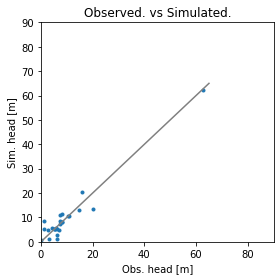

Error is - 2.8573972668280567
Params are - [1.05205770e+00 1.65627955e+01 1.16012130e+01 7.32689809e-01
 8.59000209e-01 9.66408675e-02 2.28219401e-03 1.23440358e-01
 1.58734879e-01 5.77739402e-01 1.78189577e-03 7.63036007e+00]


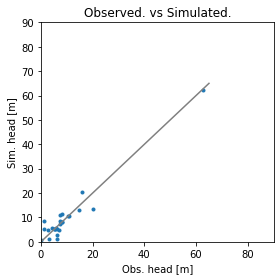

Error is - 2.8574236911942203
Params are - [1.03519866e+00 1.65486582e+01 1.15963860e+01 7.23105948e-01
 8.60897061e-01 9.29186589e-02 2.28171887e-03 1.52777719e-01
 1.58556405e-01 5.77255974e-01 1.79379956e-03 7.54773368e+00]


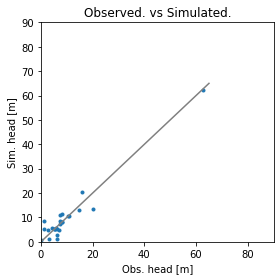

Error is - 2.857393292861185
Params are - [1.04873490e+00 1.66418054e+01 1.15045793e+01 7.32532903e-01
 8.62064251e-01 1.02000796e-01 2.27857607e-03 1.31011538e-01
 1.59174137e-01 5.72124511e-01 1.78254157e-03 7.60407533e+00]


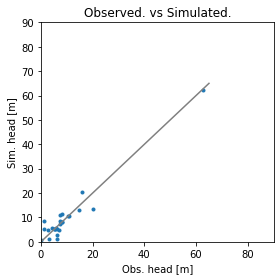

Error is - 2.8573885243891035
Params are - [1.03491226e+00 1.67658615e+01 1.14942368e+01 7.23827509e-01
 8.61841863e-01 9.72226180e-02 2.27822824e-03 1.41979381e-01
 1.58989013e-01 5.76139343e-01 1.79659009e-03 7.67723893e+00]


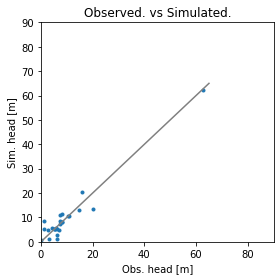

Error is - 2.8573983812269454
Params are - [1.04338282e+00 1.67157100e+01 1.18193687e+01 7.19911525e-01
 8.60341643e-01 9.92219839e-02 2.28100574e-03 1.45047921e-01
 1.59494944e-01 5.71913304e-01 1.79411794e-03 7.61276495e+00]


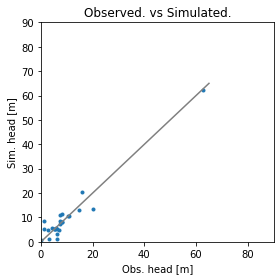

Error is - 2.857407928164332
Params are - [1.03862312e+00 1.65835356e+01 1.16619830e+01 7.26683858e-01
 8.61270171e-01 9.82460809e-02 2.27835197e-03 1.46869150e-01
 1.59582890e-01 5.74611696e-01 1.77663532e-03 7.49168688e+00]


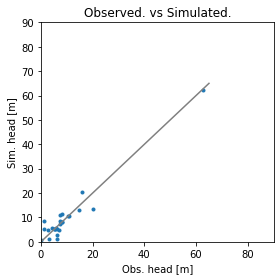

Error is - 2.8573914455448772
Params are - [1.04075634e+00 1.66127676e+01 1.16188293e+01 7.27078023e-01
 8.61389450e-01 9.85801595e-02 2.27892725e-03 1.43345705e-01
 1.59339030e-01 5.74209750e-01 1.78212560e-03 7.54268962e+00]


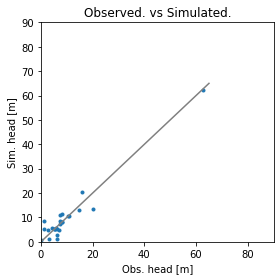

Error is - 2.8574010405039783
Params are - [1.03746160e+00 1.66306593e+01 1.15762208e+01 7.22846084e-01
 8.59370036e-01 9.68895458e-02 2.28198177e-03 1.49036303e-01
 1.58864261e-01 5.76210232e-01 1.79161728e-03 7.57822524e+00]


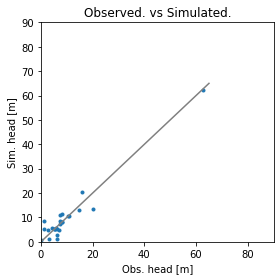

Error is - 2.8574150404638083
Params are - [1.03676719e+00 1.66018775e+01 1.15239060e+01 7.23493782e-01
 8.59544766e-01 9.74896385e-02 2.28119519e-03 1.51942487e-01
 1.58806037e-01 5.75764415e-01 1.78895056e-03 7.56047489e+00]


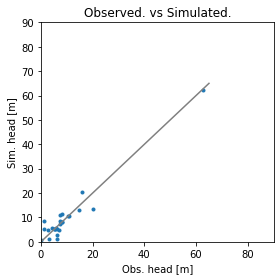

Error is - 2.857390181003898
Params are - [1.04401882e+00 1.66528209e+01 1.16000853e+01 7.28078434e-01
 8.61843774e-01 9.90403491e-02 2.27927805e-03 1.37217731e-01
 1.59185208e-01 5.73554084e-01 1.78738353e-03 7.59898052e+00]


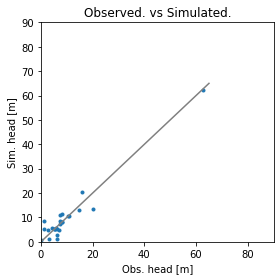

Error is - 2.8573919328230093
Params are - [1.04365958e+00 1.66586967e+01 1.16375075e+01 7.25727459e-01
 8.58182597e-01 9.53792148e-02 2.28243071e-03 1.35223816e-01
 1.58919943e-01 5.78174118e-01 1.78916676e-03 7.64114474e+00]


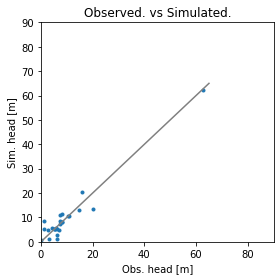

Error is - 2.8573951818228407
Params are - [1.04741393e+00 1.66513843e+01 1.15959791e+01 7.30835358e-01
 8.62282862e-01 9.95302911e-02 2.27819504e-03 1.31226379e-01
 1.59260871e-01 5.73148302e-01 1.78389155e-03 7.61424263e+00]


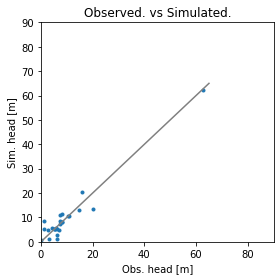

Error is - 2.857391253268374
Params are - [1.03614735e+00 1.66351020e+01 1.15927363e+01 7.26297956e-01
 8.64299641e-01 1.03895293e-01 2.27833605e-03 1.47100374e-01
 1.58915504e-01 5.70452671e-01 1.79380920e-03 7.52438732e+00]


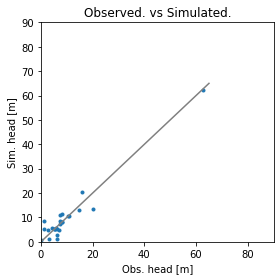

Error is - 2.857403262750357
Params are - [1.04009905e+00 1.65535336e+01 1.13174185e+01 7.35327447e-01
 8.62675151e-01 9.89775590e-02 2.27820529e-03 1.35280275e-01
 1.58540935e-01 5.76379282e-01 1.78165257e-03 7.55728218e+00]


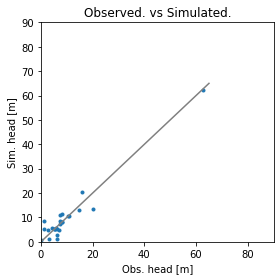

Error is - 2.8573805580311453
Params are - [1.04256188e+00 1.66751659e+01 1.16938812e+01 7.23765505e-01
 8.60925020e-01 9.91608776e-02 2.28030563e-03 1.42606010e-01
 1.59256442e-01 5.73029799e-01 1.79100160e-03 7.59889426e+00]


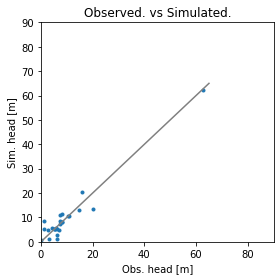

Error is - 2.85741441448414
Params are - [1.02984153e+00 1.67251765e+01 1.15510189e+01 7.21061779e-01
 8.64337387e-01 1.01978677e-01 2.27670230e-03 1.60082114e-01
 1.59387927e-01 5.69768250e-01 1.79539237e-03 7.53444276e+00]


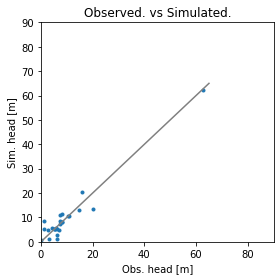

Error is - 2.8573647202219172
Params are - [1.04650366e+00 1.66033908e+01 1.15886645e+01 7.29782801e-01
 8.60334503e-01 9.79753199e-02 2.28082108e-03 1.32600797e-01
 1.58898141e-01 5.75746614e-01 1.78526992e-03 7.60638074e+00]


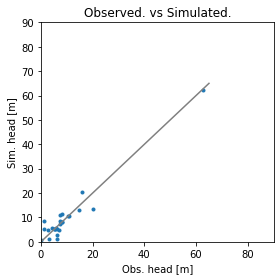

Error is - 2.8573620344088084
Params are - [1.03433359e+00 1.66285888e+01 1.15550337e+01 7.22740804e-01
 8.60730007e-01 9.88300916e-02 2.28113895e-03 1.52525162e-01
 1.58801480e-01 5.74792403e-01 1.79362632e-03 7.54924989e+00]


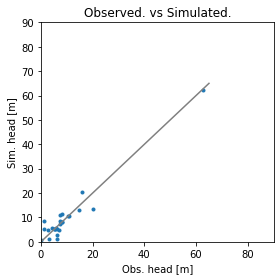

Error is - 2.8574668081567776
Params are - [1.02779342e+00 1.66171910e+01 1.15345609e+01 7.18693527e-01
 8.59953580e-01 9.84799919e-02 2.28261090e-03 1.63174554e-01
 1.58571785e-01 5.75614453e-01 1.79849370e-03 7.51675351e+00]


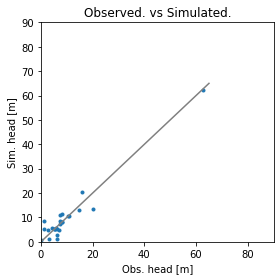

Error is - 2.857376285491255
Params are - [1.03061240e+00 1.66359649e+01 1.16548426e+01 7.19411242e-01
 8.60726244e-01 9.58311365e-02 2.28118506e-03 1.56325608e-01
 1.58826105e-01 5.76260842e-01 1.79682376e-03 7.55027960e+00]


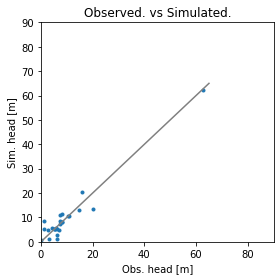

Error is - 2.857410726544182
Params are - [1.03351319e+00 1.66152849e+01 1.15248036e+01 7.25163983e-01
 8.65031839e-01 1.02528038e-01 2.27712281e-03 1.55630294e-01
 1.59064659e-01 5.69892356e-01 1.79147474e-03 7.49806601e+00]


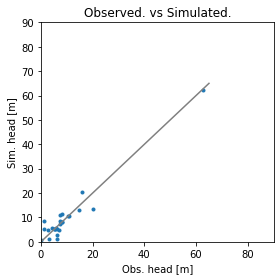

Error is - 2.857361199365633
Params are - [1.04112298e+00 1.66478438e+01 1.16093315e+01 7.25586590e-01
 8.59894907e-01 9.71664205e-02 2.28110373e-03 1.40325436e-01
 1.58956122e-01 5.76103677e-01 1.78974375e-03 7.60537506e+00]


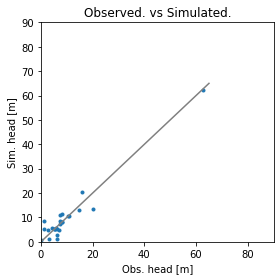

Error is - 2.8573655804883407
Params are - [1.03647753e+00 1.66670600e+01 1.15418988e+01 7.23564847e-01
 8.61575896e-01 9.90914696e-02 2.28098902e-03 1.47005027e-01
 1.58581754e-01 5.74172377e-01 1.79978559e-03 7.60696870e+00]


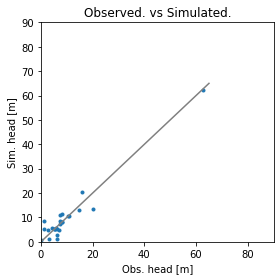

Error is - 2.8573968748879257
Params are - [1.04114155e+00 1.66500520e+01 1.15595189e+01 7.23889396e-01
 8.58211747e-01 9.29756984e-02 2.28202238e-03 1.43234468e-01
 1.58949655e-01 5.78549408e-01 1.78909806e-03 7.63903456e+00]


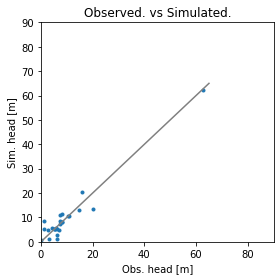

Error is - 2.8573765524179002
Params are - [1.03739590e+00 1.66388395e+01 1.15844319e+01 7.25695816e-01
 8.62777668e-01 1.01165395e-01 2.27925763e-03 1.46133897e-01
 1.58924042e-01 5.72476855e-01 1.79263141e-03 7.55304913e+00]


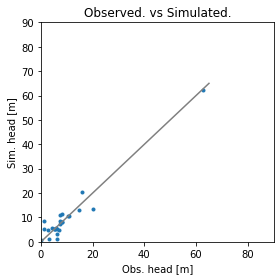

Error is - 2.85737240633903
Params are - [1.04018062e+00 1.65919346e+01 1.16308073e+01 7.24168364e-01
 8.57825647e-01 9.32956969e-02 2.28245298e-03 1.35909493e-01
 1.59054256e-01 5.81081284e-01 1.78621526e-03 7.65819429e+00]


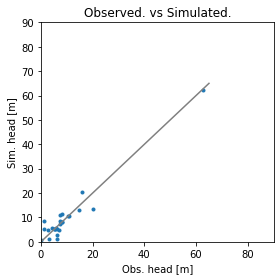

Error is - 2.8573550610755905
Params are - [1.03267147e+00 1.66144169e+01 1.15662880e+01 7.21411073e-01
 8.59725344e-01 9.65289293e-02 2.28180271e-03 1.51714577e-01
 1.58674288e-01 5.77353394e-01 1.79474893e-03 7.58114197e+00]


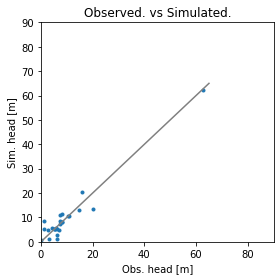

Error is - 2.857439101724574
Params are - [1.02699780e+00 1.65952148e+01 1.15493894e+01 7.18077392e-01
 8.58666129e-01 9.52732194e-02 2.28306504e-03 1.58963001e-01
 1.58418829e-01 5.79253049e-01 1.79843163e-03 7.57222270e+00]


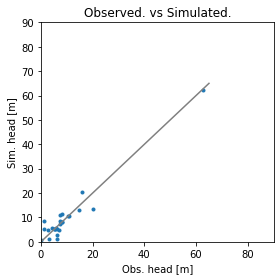

Error is - 2.857367268760629
Params are - [1.03403689e+00 1.67132968e+01 1.16401317e+01 7.22492066e-01
 8.60724557e-01 9.97904979e-02 2.28214405e-03 1.43727150e-01
 1.59084242e-01 5.75035681e-01 1.80253656e-03 7.60519097e+00]


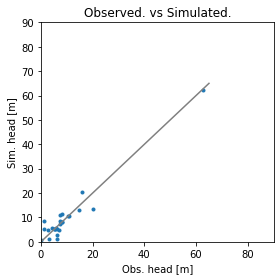

Error is - 2.857360847189395
Params are - [1.03470565e+00 1.67559825e+01 1.17388415e+01 7.20214940e-01
 8.58813659e-01 9.51737523e-02 2.28291352e-03 1.38212726e-01
 1.58873119e-01 5.79432251e-01 1.80124735e-03 7.67899831e+00]


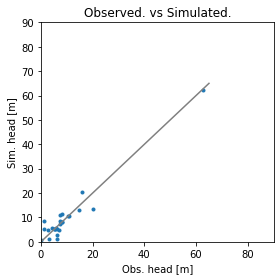

Error is - 2.8575105793130913
Params are - [1.03938593e+00 1.65359980e+01 1.17481789e+01 7.23406929e-01
 8.58795379e-01 9.80106051e-02 2.28455245e-03 1.46123304e-01
 1.58852786e-01 5.76007010e-01 1.79126712e-03 7.51880394e+00]


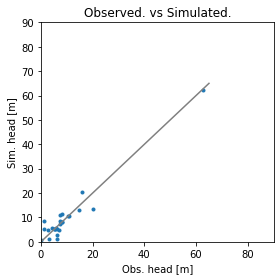

Error is - 2.857371259889651
Params are - [1.03603068e+00 1.67083957e+01 1.15577224e+01 7.23722364e-01
 8.61080242e-01 9.74196148e-02 2.27980929e-03 1.43015362e-01
 1.58954956e-01 5.76106259e-01 1.79525934e-03 7.63763018e+00]


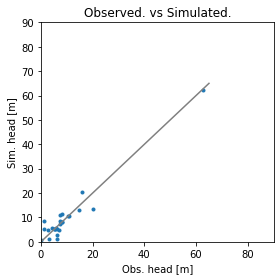

Error is - 2.857357623374945
Params are - [1.03925231e+00 1.66748072e+01 1.15766372e+01 7.22520156e-01
 8.61085617e-01 9.78484485e-02 2.27975082e-03 1.46819978e-01
 1.58693359e-01 5.74538968e-01 1.79463550e-03 7.62269121e+00]


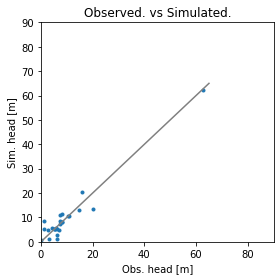

Error is - 2.8573452265823795
Params are - [1.03132540e+00 1.66382543e+01 1.15135574e+01 7.23119672e-01
 8.59957362e-01 9.58585844e-02 2.28192251e-03 1.46446526e-01
 1.58463869e-01 5.79153636e-01 1.79775235e-03 7.61029742e+00]


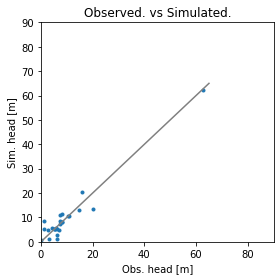

Error is - 2.8573390627707353
Params are - [1.02570716e+00 1.66197985e+01 1.14233954e+01 7.22796756e-01
 8.59473533e-01 9.42074378e-02 2.28273094e-03 1.48366784e-01
 1.58067582e-01 5.82215555e-01 1.80112773e-03 7.61599900e+00]


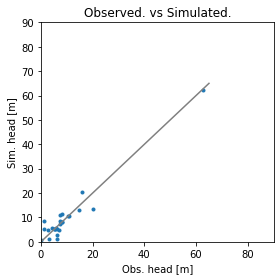

Error is - 2.85737954311169
Params are - [1.03454325e+00 1.66714072e+01 1.15961672e+01 7.20706185e-01
 8.57554025e-01 9.26944079e-02 2.28354939e-03 1.43290786e-01
 1.58653526e-01 5.81329696e-01 1.79753859e-03 7.66663419e+00]


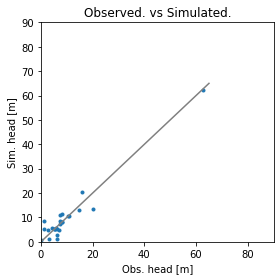

Error is - 2.8573644593898675
Params are - [1.03668274e+00 1.66469814e+01 1.15873657e+01 7.24448408e-01
 8.61471757e-01 9.90476480e-02 2.28033057e-03 1.45423119e-01
 1.58856413e-01 5.74690065e-01 1.79385821e-03 7.58144540e+00]


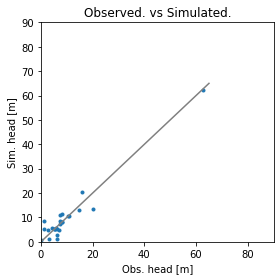

Error is - 2.857354600900054
Params are - [1.04233848e+00 1.66761179e+01 1.15145104e+01 7.27830287e-01
 8.59729701e-01 9.85647514e-02 2.28147955e-03 1.31281994e-01
 1.58756514e-01 5.77283913e-01 1.79285199e-03 7.67459801e+00]


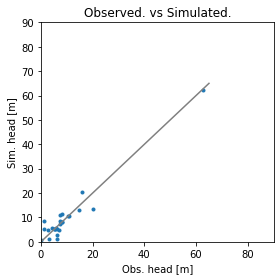

Error is - 2.8573737213725576
Params are - [1.03312991e+00 1.67341788e+01 1.15191629e+01 7.23683484e-01
 8.62947640e-01 1.01978367e-01 2.28004939e-03 1.50926860e-01
 1.58478739e-01 5.71830576e-01 1.80456660e-03 7.56941728e+00]


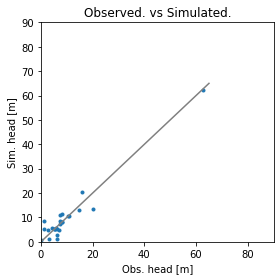

Error is - 2.8573592824204215
Params are - [1.03841794e+00 1.66274957e+01 1.16028962e+01 7.24047144e-01
 8.59106145e-01 9.54663644e-02 2.28185208e-03 1.39663834e-01
 1.58910377e-01 5.78768607e-01 1.79080310e-03 7.63600004e+00]


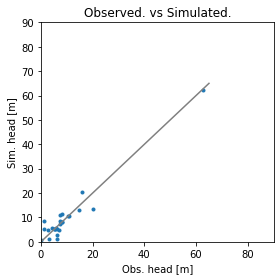

Error is - 2.8574285470617946
Params are - [1.03767773e+00 1.66042344e+01 1.15997768e+01 7.24183615e-01
 8.59364029e-01 9.75289071e-02 2.28303355e-03 1.43262402e-01
 1.58570609e-01 5.77249325e-01 1.79477981e-03 7.58970970e+00]


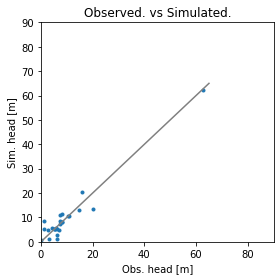

Error is - 2.8573612809653968
Params are - [1.03644244e+00 1.66823553e+01 1.15682360e+01 7.23837677e-01
 8.60651189e-01 9.74469379e-02 2.28061535e-03 1.43077122e-01
 1.58858869e-01 5.76392026e-01 1.79513946e-03 7.62565006e+00]


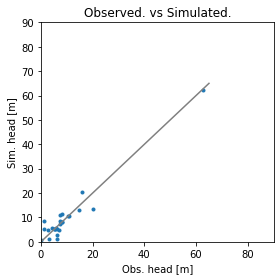

Error is - 2.857377937574105
Params are - [1.04007243e+00 1.65941763e+01 1.15053848e+01 7.25638181e-01
 8.59707486e-01 9.47674306e-02 2.28044400e-03 1.42442277e-01
 1.58403761e-01 5.78545960e-01 1.78626975e-03 7.62555876e+00]


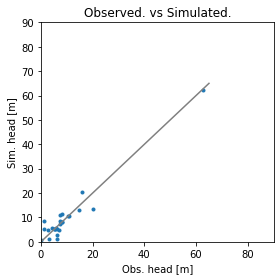

Error is - 2.8573571246514287
Params are - [1.03554578e+00 1.66835167e+01 1.16064450e+01 7.23278595e-01
 8.60470289e-01 9.85347311e-02 2.28171904e-03 1.43405932e-01
 1.58914122e-01 5.75913251e-01 1.79846986e-03 7.61028292e+00]


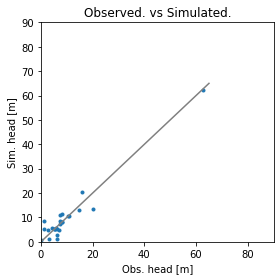

Error is - 2.8573511517022703
Params are - [1.03747650e+00 1.66431559e+01 1.16143754e+01 7.24517691e-01
 8.58671879e-01 9.53736691e-02 2.28172071e-03 1.38564550e-01
 1.58961644e-01 5.79699410e-01 1.78880143e-03 7.62433340e+00]


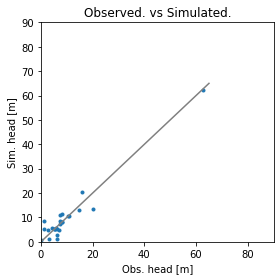

Error is - 2.8573436710099993
Params are - [1.02594585e+00 1.67134527e+01 1.15718948e+01 7.17422219e-01
 8.59636168e-01 9.60562104e-02 2.28203858e-03 1.53962739e-01
 1.58655840e-01 5.78783972e-01 1.80390568e-03 7.62791347e+00]


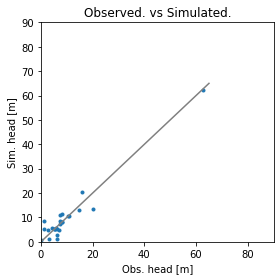

Error is - 2.8573373136047175
Params are - [1.03397729e+00 1.66809405e+01 1.15706151e+01 7.21585581e-01
 8.58192983e-01 9.44853094e-02 2.28281376e-03 1.42563686e-01
 1.58664140e-01 5.80522839e-01 1.79699198e-03 7.66059349e+00]


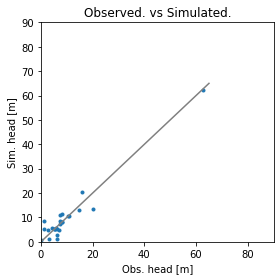

Error is - 2.8573786963241385
Params are - [1.03262456e+00 1.66979201e+01 1.15622398e+01 7.20154167e-01
 8.56553596e-01 9.22041400e-02 2.28405536e-03 1.41133970e-01
 1.58568004e-01 5.83439226e-01 1.79855886e-03 7.70016754e+00]


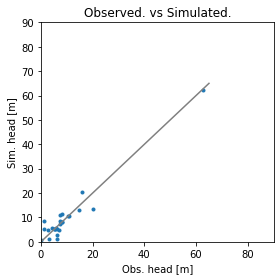

Error is - 2.857344186721593
Params are - [1.03626705e+00 1.67080585e+01 1.16055441e+01 7.23100647e-01
 8.58511895e-01 9.39787354e-02 2.28228452e-03 1.33801397e-01
 1.58696182e-01 5.81375575e-01 1.79778481e-03 7.71134627e+00]


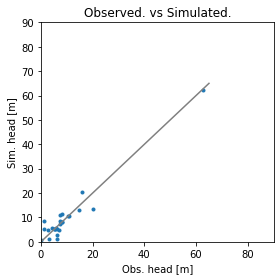

Error is - 2.857344033768876
Params are - [1.03412897e+00 1.66585758e+01 1.15985598e+01 7.21880937e-01
 8.58234165e-01 9.47838554e-02 2.28308631e-03 1.41703484e-01
 1.58611679e-01 5.80606543e-01 1.79671256e-03 7.64922880e+00]


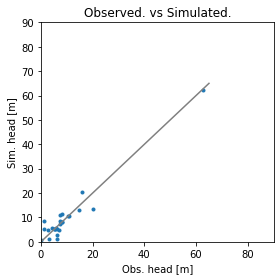

Error is - 2.857329366520946
Params are - [1.02828276e+00 1.66948760e+01 1.15556690e+01 7.19514414e-01
 8.58713656e-01 9.46672786e-02 2.28292836e-03 1.44684844e-01
 1.58457019e-01 5.81645369e-01 1.80326973e-03 7.67681276e+00]


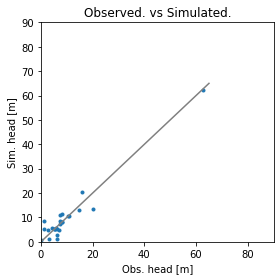

Error is - 2.8573179828496778
Params are - [1.02186265e+00 1.67183921e+01 1.15288377e+01 7.16478326e-01
 8.58123030e-01 9.34177076e-02 2.28384067e-03 1.46864549e-01
 1.58207468e-01 5.84416215e-01 1.81003272e-03 7.71253161e+00]


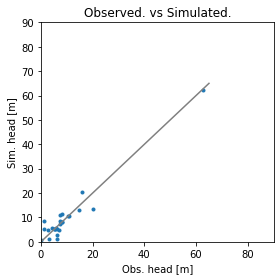

Error is - 2.8573436274351134
Params are - [1.03255959e+00 1.65804722e+01 1.13911584e+01 7.24263295e-01
 8.59679800e-01 9.63672726e-02 2.28127310e-03 1.48239524e-01
 1.58429080e-01 5.79147456e-01 1.79323037e-03 7.60877839e+00]


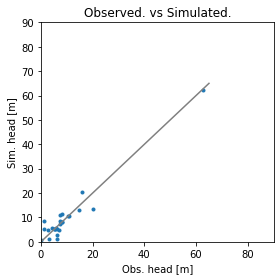

Error is - 2.857333253638526
Params are - [1.02787091e+00 1.67011218e+01 1.14918140e+01 7.20467116e-01
 8.59482922e-01 9.62248120e-02 2.28223804e-03 1.48217698e-01
 1.58311606e-01 5.79874242e-01 1.80407916e-03 7.64723972e+00]


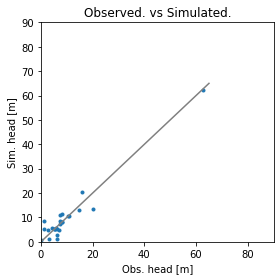

Error is - 2.8573295595170376
Params are - [1.02513965e+00 1.66581961e+01 1.15039358e+01 7.21651931e-01
 8.57236335e-01 9.35721218e-02 2.28475383e-03 1.41294508e-01
 1.58464999e-01 5.84993093e-01 1.80182070e-03 7.66463997e+00]


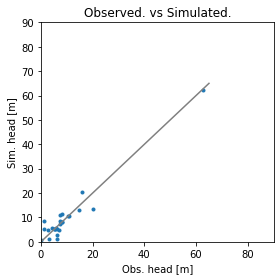

Error is - 2.8573250873046905
Params are - [1.02711182e+00 1.66452664e+01 1.14570431e+01 7.20622381e-01
 8.57312670e-01 9.20587376e-02 2.28329141e-03 1.44356650e-01
 1.58169382e-01 5.85132117e-01 1.79854482e-03 7.68610777e+00]


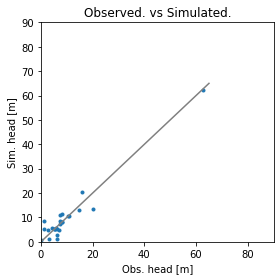

Error is - 2.8573252861196043
Params are - [1.02905952e+00 1.67195079e+01 1.14789927e+01 7.22358455e-01
 8.57655503e-01 9.33195075e-02 2.28345587e-03 1.34821683e-01
 1.58325065e-01 5.84988427e-01 1.80289839e-03 7.73274301e+00]


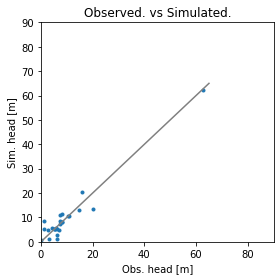

Error is - 2.857322133621126
Params are - [1.01717934e+00 1.66650384e+01 1.15248507e+01 7.15027269e-01
 8.57305446e-01 9.04094781e-02 2.28410840e-03 1.55844214e-01
 1.58170931e-01 5.86341994e-01 1.80646974e-03 7.64897780e+00]


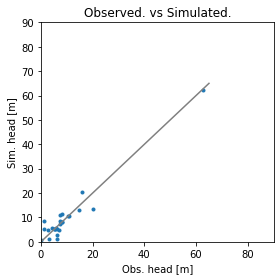

Error is - 2.8573570146791956
Params are - [1.01865847e+00 1.67016476e+01 1.14100649e+01 7.16758128e-01
 8.58135529e-01 9.27731951e-02 2.28426520e-03 1.51441603e-01
 1.57834015e-01 5.85033595e-01 1.81346501e-03 7.70334981e+00]


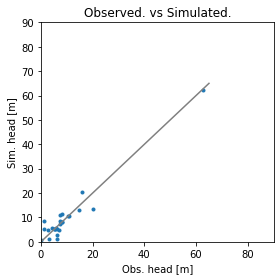

Error is - 2.8573370513496776
Params are - [1.03277199e+00 1.66577788e+01 1.15632977e+01 7.22577800e-01
 8.58537792e-01 9.47235506e-02 2.28235683e-03 1.41783813e-01
 1.58679737e-01 5.81032956e-01 1.79496733e-03 7.64408751e+00]


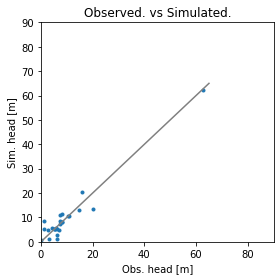

Error is - 2.857353931362439
Params are - [1.01928540e+00 1.66283650e+01 1.14118551e+01 7.18088030e-01
 8.58299829e-01 9.42922648e-02 2.28371344e-03 1.57535158e-01
 1.58096736e-01 5.83300327e-01 1.80401205e-03 7.60512715e+00]


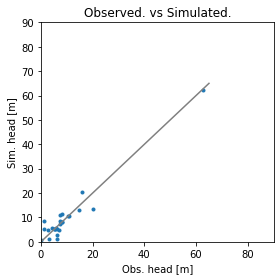

Error is - 2.857333379613283
Params are - [1.03202164e+00 1.66881351e+01 1.15571218e+01 7.21847493e-01
 8.58458879e-01 9.40571177e-02 2.28264175e-03 1.39734837e-01
 1.58546321e-01 5.81856763e-01 1.79934162e-03 7.68479149e+00]


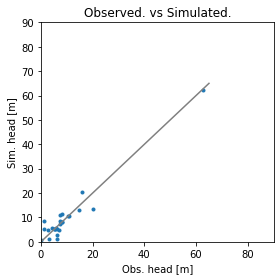

Error is - 2.8573269191270314
Params are - [1.02107226e+00 1.66827743e+01 1.14119331e+01 7.19302167e-01
 8.58615012e-01 9.33660218e-02 2.28283756e-03 1.49304964e-01
 1.58170346e-01 5.84277728e-01 1.80552248e-03 7.67317174e+00]


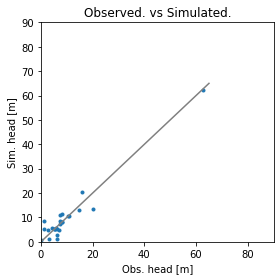

Error is - 2.8573163808296016
Params are - [1.02844312e+00 1.66227844e+01 1.14119378e+01 7.24074209e-01
 8.57042816e-01 9.16453020e-02 2.28401844e-03 1.36269413e-01
 1.58045269e-01 5.87015925e-01 1.79859882e-03 7.70203011e+00]


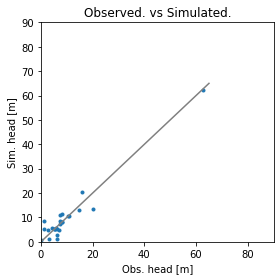

Error is - 2.85732144201424
Params are - [1.02969175e+00 1.65774502e+01 1.13319593e+01 7.27400205e-01
 8.55746140e-01 8.94398478e-02 2.28500838e-03 1.27422750e-01
 1.57739984e-01 5.91131901e-01 1.79594540e-03 7.73908844e+00]


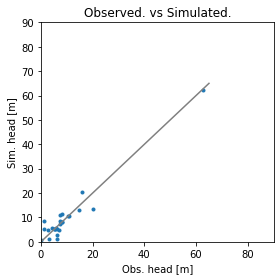

Error is - 2.8573224088822444
Params are - [1.02114330e+00 1.67628169e+01 1.15961375e+01 7.17201619e-01
 8.56559687e-01 9.05472446e-02 2.28524149e-03 1.39997609e-01
 1.58208061e-01 5.87963853e-01 1.81016888e-03 7.73670714e+00]


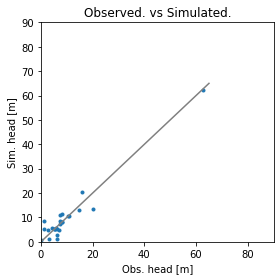

Error is - 2.8573185559559686
Params are - [1.02723508e+00 1.67473270e+01 1.15926907e+01 7.17735636e-01
 8.56280313e-01 9.20970473e-02 2.28420207e-03 1.38475487e-01
 1.58592972e-01 5.85853804e-01 1.80377837e-03 7.74960456e+00]


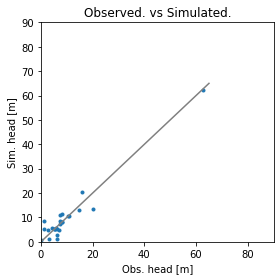

Error is - 2.8573110235190167
Params are - [1.01784126e+00 1.66972493e+01 1.14491503e+01 7.18305153e-01
 8.57242084e-01 9.14211320e-02 2.28435063e-03 1.43597218e-01
 1.57984553e-01 5.88435014e-01 1.80904520e-03 7.71984525e+00]


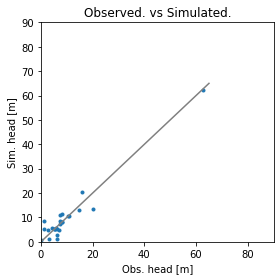

Error is - 2.8573103400862934
Params are - [1.00977325e+00 1.67054038e+01 1.13884180e+01 7.16664940e-01
 8.56766635e-01 8.98890434e-02 2.28511907e-03 1.44113984e-01
 1.57644759e-01 5.92391101e-01 1.81507181e-03 7.74947112e+00]


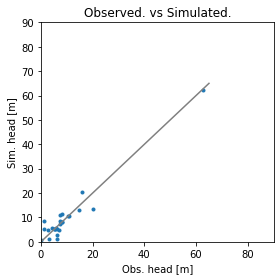

Error is - 2.857305078597993
Params are - [1.01521343e+00 1.67283486e+01 1.14273211e+01 7.16327457e-01
 8.56602083e-01 9.03771396e-02 2.28526794e-03 1.44765453e-01
 1.57796460e-01 5.89817921e-01 1.81442059e-03 7.75391517e+00]


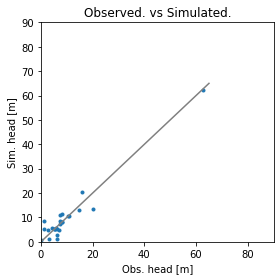

Error is - 2.8573020399091478
Params are - [1.00643415e+00 1.67636334e+01 1.13593327e+01 7.13202285e-01
 8.55634228e-01 8.82039341e-02 2.28672349e-03 1.46256273e-01
 1.57354822e-01 5.94210403e-01 1.82414723e-03 7.80882900e+00]


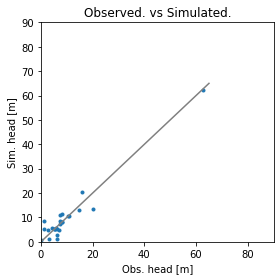

Error is - 2.8572997800672697
Params are - [1.01169920e+00 1.67105753e+01 1.14005321e+01 7.15616896e-01
 8.56210221e-01 9.00680419e-02 2.28566331e-03 1.47901334e-01
 1.57731293e-01 5.91053054e-01 1.81418057e-03 7.73388410e+00]


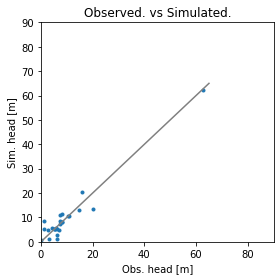

Error is - 2.8572930807235064
Params are - [1.00153798e+00 1.67217954e+01 1.13222373e+01 7.12501597e-01
 8.55085892e-01 8.80735040e-02 2.28717408e-03 1.51984583e-01
 1.57323779e-01 5.95651200e-01 1.82160004e-03 7.75843041e+00]


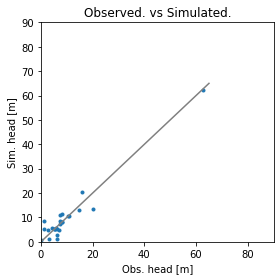

Error is - 2.857307152969139
Params are - [1.01146111e+00 1.67010342e+01 1.14375771e+01 7.15669687e-01
 8.54453339e-01 8.65417963e-02 2.28688969e-03 1.40046288e-01
 1.57801369e-01 5.95665068e-01 1.81236317e-03 7.78996766e+00]


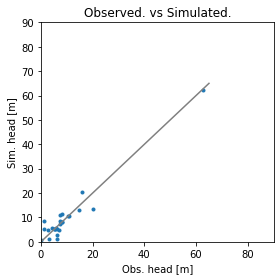

Error is - 2.8573027080909865
Params are - [1.01191262e+00 1.67510996e+01 1.14143956e+01 7.13487831e-01
 8.56236094e-01 8.80227656e-02 2.28472988e-03 1.46761441e-01
 1.57537372e-01 5.92324880e-01 1.81637872e-03 7.79345536e+00]


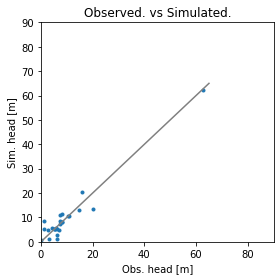

Error is - 2.857291183524852
Params are - [1.01445340e+00 1.67379089e+01 1.15068087e+01 7.14868539e-01
 8.54460930e-01 8.73383229e-02 2.28696153e-03 1.38327065e-01
 1.57726529e-01 5.94381436e-01 1.81448630e-03 7.80497085e+00]


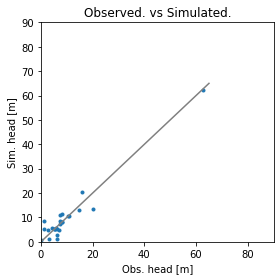

Error is - 2.8573060393453606
Params are - [1.01114396e+00 1.67654762e+01 1.15542465e+01 7.12651725e-01
 8.52383890e-01 8.43244734e-02 2.28902352e-03 1.32838115e-01
 1.57504620e-01 5.99433290e-01 1.81896821e-03 7.87087041e+00]


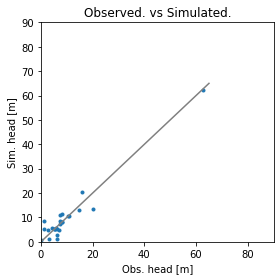

Error is - 2.857289923074477
Params are - [1.00403179e+00 1.67042422e+01 1.14443851e+01 7.10563932e-01
 8.54888010e-01 8.63879731e-02 2.28692751e-03 1.53394576e-01
 1.57472054e-01 5.95236239e-01 1.81904171e-03 7.75743756e+00]


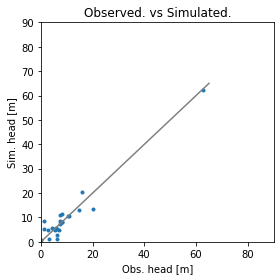

Error is - 2.857297022103523
Params are - [9.91517924e-01 1.66966094e+01 1.14270814e+01 7.04666670e-01
 8.53504264e-01 8.29222059e-02 2.28866333e-03 1.62681023e-01
 1.57045549e-01 6.00360144e-01 1.82711337e-03 7.76978483e+00]


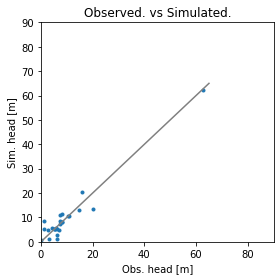

Error is - 2.857300985474132
Params are - [1.00213281e+00 1.67883129e+01 1.14642250e+01 7.10623597e-01
 8.54826733e-01 8.67036155e-02 2.28769797e-03 1.45365930e-01
 1.57511515e-01 5.96776570e-01 1.82681144e-03 7.81596110e+00]


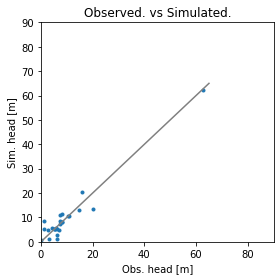

Error is - 2.8572901870008223
Params are - [1.00493292e+00 1.66750118e+01 1.13031453e+01 7.12948022e-01
 8.55290891e-01 8.75745036e-02 2.28615731e-03 1.50619691e-01
 1.57356745e-01 5.95413619e-01 1.81796113e-03 7.77857071e+00]


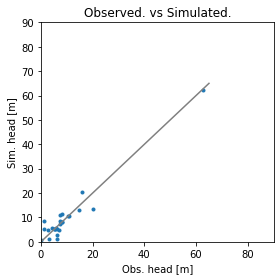

Error is - 2.8573102232190015
Params are - [1.00685580e+00 1.67744525e+01 1.13374812e+01 7.14775831e-01
 8.54209373e-01 8.72397745e-02 2.28763188e-03 1.33902332e-01
 1.57258178e-01 5.98547416e-01 1.82357551e-03 7.88789887e+00]


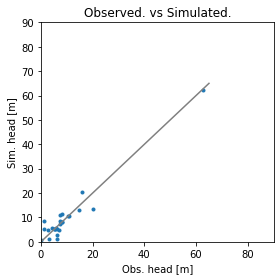

Error is - 2.8573214738911363
Params are - [9.93403516e-01 1.66966849e+01 1.12271062e+01 7.11574164e-01
 8.54889349e-01 8.47426598e-02 2.28810986e-03 1.50508867e-01
 1.56613671e-01 6.01151208e-01 1.82956639e-03 7.81032116e+00]


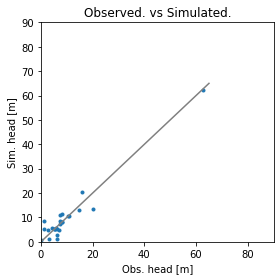

Error is - 2.857302004463927
Params are - [1.01877719e+00 1.67346664e+01 1.15012946e+01 7.16195268e-01
 8.55932572e-01 9.02584504e-02 2.28517901e-03 1.41483832e-01
 1.58098147e-01 5.89678155e-01 1.81022538e-03 7.76478371e+00]


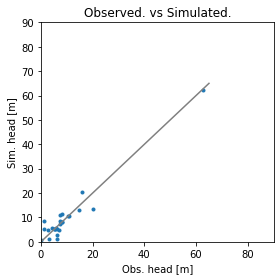

Error is - 2.857293052651171
Params are - [9.98261708e-01 1.67283322e+01 1.12863687e+01 7.12784297e-01
 8.52681555e-01 8.28954566e-02 2.28869431e-03 1.41223020e-01
 1.56980955e-01 6.03465787e-01 1.82334415e-03 7.85610280e+00]


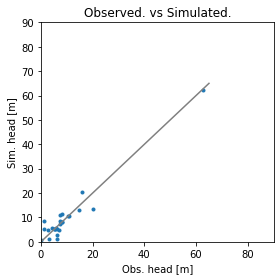

Error is - 2.857293645281213
Params are - [9.86651004e-01 1.68415312e+01 1.13823404e+01 7.03306761e-01
 8.53034893e-01 8.32095547e-02 2.28929585e-03 1.52643756e-01
 1.56965768e-01 6.03607721e-01 1.83890227e-03 7.89228308e+00]


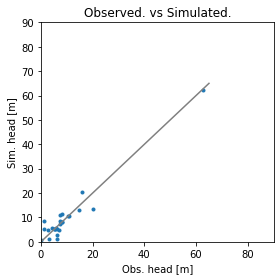

Error is - 2.857312642158295
Params are - [1.00146716e+00 1.67815997e+01 1.14048473e+01 7.08489668e-01
 8.52689116e-01 8.38525652e-02 2.28889135e-03 1.46220814e-01
 1.57253113e-01 6.00101982e-01 1.82640103e-03 7.86864406e+00]


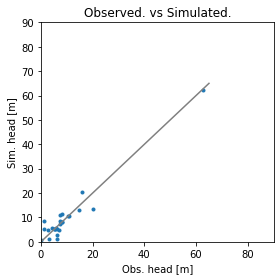

Error is - 2.8573003156093084
Params are - [1.00769673e+00 1.67244527e+01 1.13925253e+01 7.14621122e-01
 8.55747255e-01 8.83799238e-02 2.28606214e-03 1.44640691e-01
 1.57546848e-01 5.94318821e-01 1.81790411e-03 7.77926436e+00]


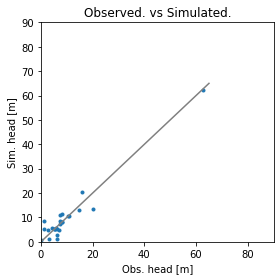

Error is - 2.85730256760355
Params are - [1.00452476e+00 1.67042177e+01 1.14649581e+01 7.10352992e-01
 8.55502693e-01 8.66918589e-02 2.28611691e-03 1.58222192e-01
 1.57687806e-01 5.93240901e-01 1.81695210e-03 7.71211056e+00]


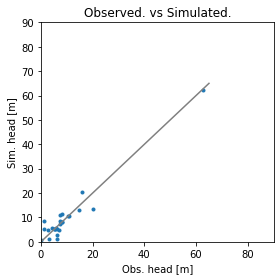

Error is - 2.8572878764933898
Params are - [9.98763403e-01 1.67781666e+01 1.13694257e+01 7.08573021e-01
 8.55433619e-01 8.74148476e-02 2.28673031e-03 1.55107554e-01
 1.57125687e-01 5.95719220e-01 1.82892926e-03 7.79706559e+00]


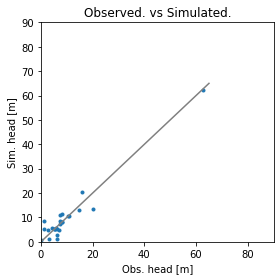

Error is - 2.85734483319394
Params are - [9.92414550e-01 1.68167328e+01 1.13353499e+01 7.05024687e-01
 8.55923759e-01 8.78513732e-02 2.28665061e-03 1.62638187e-01
 1.56787846e-01 5.95746296e-01 1.83721230e-03 7.80061456e+00]


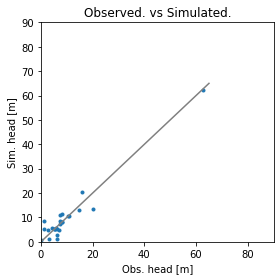

Error is - 2.8572860781191594
Params are - [9.96120355e-01 1.67326123e+01 1.13851122e+01 7.09935741e-01
 8.53517118e-01 8.58325586e-02 2.28922353e-03 1.49783419e-01
 1.57321071e-01 5.99625132e-01 1.82700547e-03 7.79417960e+00]


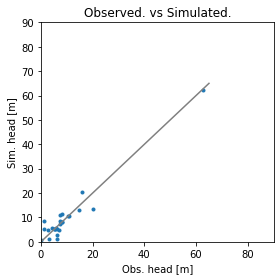

Error is - 2.85729210371459
Params are - [9.88224223e-01 1.67233686e+01 1.13704705e+01 7.08159695e-01
 8.52157631e-01 8.47374551e-02 2.29147035e-03 1.51294408e-01
 1.57212920e-01 6.03275258e-01 1.83231885e-03 7.79454172e+00]


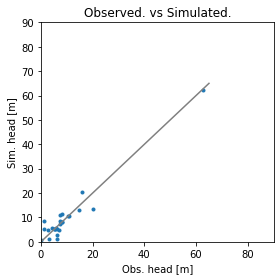

Error is - 2.8573074591731267
Params are - [1.00210748e+00 1.67842267e+01 1.13212420e+01 7.13001038e-01
 8.53919590e-01 8.70202485e-02 2.28835426e-03 1.36916206e-01
 1.57109514e-01 5.99773150e-01 1.82810765e-03 7.88920257e+00]


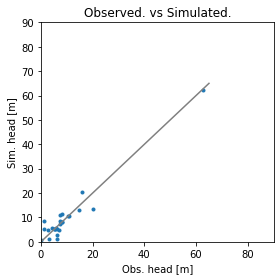

Error is - 2.8572917731560183
Params are - [1.00392044e+00 1.67242199e+01 1.14290291e+01 7.11015003e-01
 8.55106917e-01 8.67739563e-02 2.28667625e-03 1.52895696e-01
 1.57543233e-01 5.94873963e-01 1.81974099e-03 7.75638356e+00]


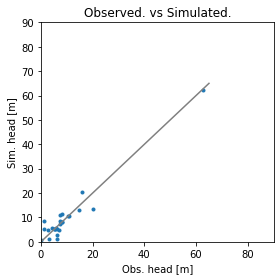

Error is - 2.8572775628534357
Params are - [9.99779135e-01 1.67182420e+01 1.14384835e+01 7.09787198e-01
 8.53700169e-01 8.52698438e-02 2.28773981e-03 1.49988696e-01
 1.57473900e-01 5.98914241e-01 1.82017815e-03 7.78374322e+00]


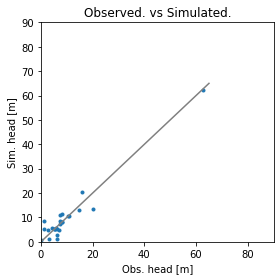

Error is - 2.857270810665287
Params are - [9.96451626e-01 1.66955463e+01 1.14780589e+01 7.08079655e-01
 8.52733140e-01 8.38027987e-02 2.28824798e-03 1.51854907e-01
 1.57533439e-01 6.01266159e-01 1.81819361e-03 7.77120032e+00]


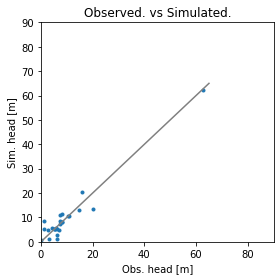

Error is - 2.8572899135017216
Params are - [9.83715168e-01 1.67406890e+01 1.12926490e+01 7.05441613e-01
 8.52868587e-01 8.21393855e-02 2.28979578e-03 1.56489650e-01
 1.56636457e-01 6.05377823e-01 1.83542804e-03 7.82885794e+00]


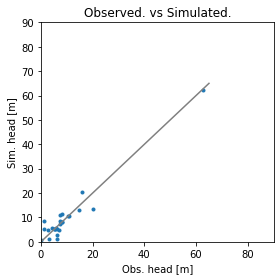

Error is - 2.857282326221379
Params are - [9.97289939e-01 1.66791051e+01 1.13011226e+01 7.10149620e-01
 8.53648068e-01 8.49335153e-02 2.28762646e-03 1.54461505e-01
 1.57077246e-01 5.99712950e-01 1.82027808e-03 7.77983003e+00]


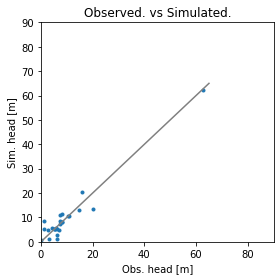

Error is - 2.857281985402893
Params are - [9.89991559e-01 1.67354074e+01 1.13575885e+01 7.05406845e-01
 8.52377681e-01 8.26828057e-02 2.28952301e-03 1.56823546e-01
 1.56963646e-01 6.03069721e-01 1.82958106e-03 7.81662105e+00]


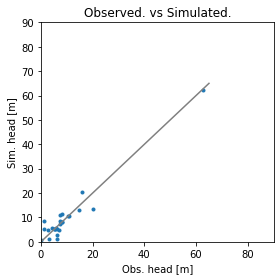

Error is - 2.857314450492598
Params are - [1.01159404e+00 1.66006416e+01 1.13636481e+01 7.17071219e-01
 8.54980509e-01 8.77653833e-02 2.28632716e-03 1.49517112e-01
 1.57544372e-01 5.93691154e-01 1.80702937e-03 7.69099199e+00]


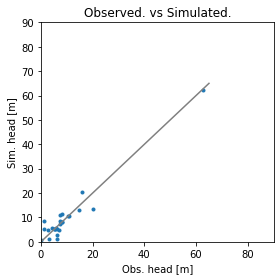

Error is - 2.8572841575575643
Params are - [9.92886764e-01 1.67813088e+01 1.13776673e+01 7.06747876e-01
 8.53521297e-01 8.43485118e-02 2.28855367e-03 1.51862095e-01
 1.57110419e-01 6.01128579e-01 1.83093405e-03 7.84196031e+00]


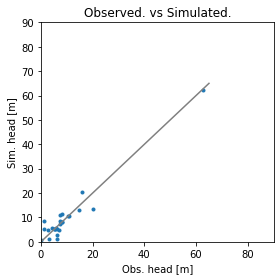

Error is - 2.8572741954412284
Params are - [9.95265196e-01 1.67302964e+01 1.14329896e+01 7.06917430e-01
 8.52668744e-01 8.22806020e-02 2.28867886e-03 1.50155871e-01
 1.57150801e-01 6.02560571e-01 1.82588727e-03 7.83876631e+00]


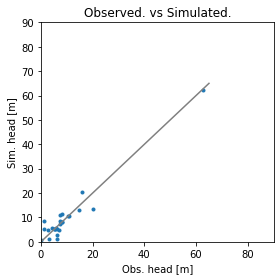

Error is - 2.8572790136835002
Params are - [9.98042051e-01 1.67240870e+01 1.14932950e+01 7.05656919e-01
 8.55070945e-01 8.73561736e-02 2.28715606e-03 1.62406243e-01
 1.57521933e-01 5.94595115e-01 1.82456701e-03 7.73820451e+00]


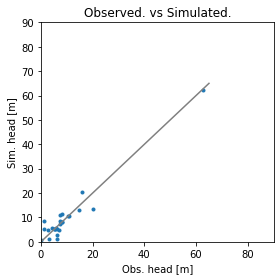

Error is - 2.857266403042292
Params are - [9.91403585e-01 1.67281770e+01 1.13613456e+01 7.06533199e-01
 8.52639588e-01 8.35747100e-02 2.28925408e-03 1.52318658e-01
 1.56956105e-01 6.03140465e-01 1.82897451e-03 7.83489390e+00]


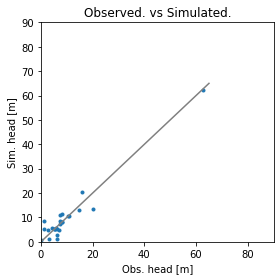

Error is - 2.857263057144669
Params are - [9.85145156e-01 1.67301556e+01 1.13275038e+01 7.04292296e-01
 8.51405923e-01 8.19750869e-02 2.29054300e-03 1.52030139e-01
 1.56662541e-01 6.07273716e-01 1.83359127e-03 7.87414907e+00]


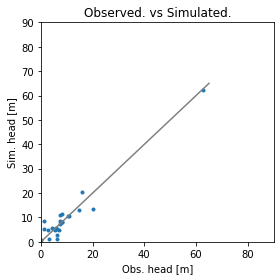

Error is - 2.8572793160504424
Params are - [9.75985924e-01 1.67131958e+01 1.12536818e+01 7.00916956e-01
 8.52776407e-01 8.21164709e-02 2.28956571e-03 1.69171134e-01
 1.56595478e-01 6.05781705e-01 1.83741335e-03 7.79783632e+00]


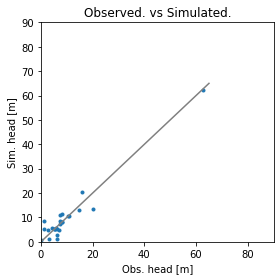

Error is - 2.8572669945048257
Params are - [9.80681904e-01 1.67824569e+01 1.14491014e+01 7.00832295e-01
 8.51527366e-01 8.09706180e-02 2.29093800e-03 1.59970415e-01
 1.56838383e-01 6.06477536e-01 1.83718056e-03 7.82744739e+00]


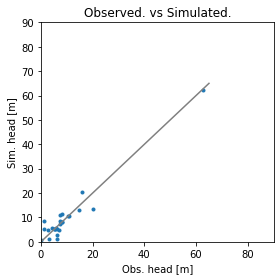

Error is - 2.857264364268996
Params are - [9.77691386e-01 1.67662623e+01 1.13086475e+01 7.01594446e-01
 8.51370139e-01 8.12542560e-02 2.29083622e-03 1.58291503e-01
 1.56617463e-01 6.08528466e-01 1.83912313e-03 7.86024885e+00]


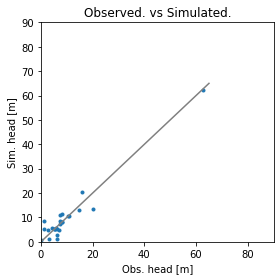

Error is - 2.8572588961783434
Params are - [9.97004042e-01 1.67340778e+01 1.14630500e+01 7.06075570e-01
 8.53139821e-01 8.53553220e-02 2.28814135e-03 1.55496739e-01
 1.57449894e-01 5.98911989e-01 1.82335265e-03 7.79406028e+00]


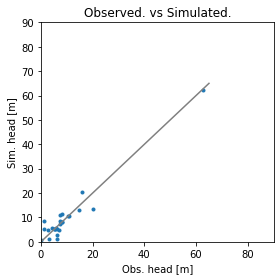

Error is - 2.8572619150188836
Params are - [1.00364848e+00 1.67307722e+01 1.15482505e+01 7.06392548e-01
 8.53275437e-01 8.69632902e-02 2.28731414e-03 1.55000284e-01
 1.57856613e-01 5.95679072e-01 1.81731495e-03 7.77666146e+00]


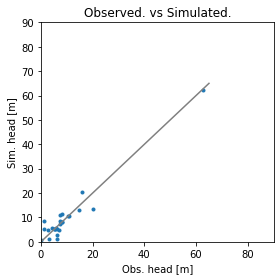

Error is - 2.857262803862843
Params are - [9.81662581e-01 1.66892520e+01 1.14018775e+01 7.02527921e-01
 8.50192489e-01 7.97366057e-02 2.29144200e-03 1.56943699e-01
 1.57014699e-01 6.09102719e-01 1.82892199e-03 7.82535175e+00]


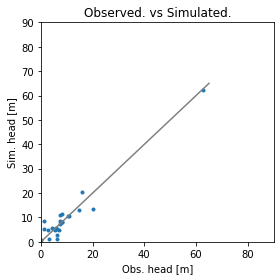

Error is - 2.8572549607684494
Params are - [9.81895999e-01 1.67275796e+01 1.13889851e+01 6.99930564e-01
 8.51554885e-01 8.03029025e-02 2.28931852e-03 1.63461214e-01
 1.56768253e-01 6.06776406e-01 1.83116520e-03 7.83343310e+00]


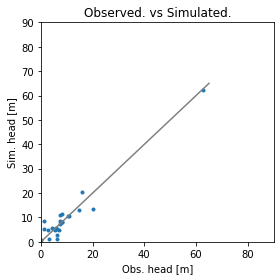

Error is - 2.857256400040381
Params are - [9.74783821e-01 1.67250633e+01 1.13909216e+01 6.94927976e-01
 8.50573768e-01 7.75380744e-02 2.28936602e-03 1.70300111e-01
 1.56491844e-01 6.10352043e-01 1.83324506e-03 7.85305986e+00]


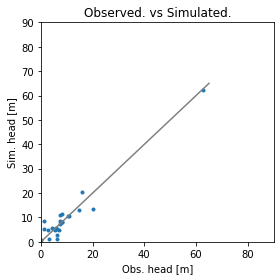

Error is - 2.857248188753607
Params are - [9.83297797e-01 1.66699282e+01 1.13983163e+01 7.01982210e-01
 8.51222971e-01 8.11126810e-02 2.29011585e-03 1.63315724e-01
 1.56921877e-01 6.06214263e-01 1.82727515e-03 7.78423119e+00]


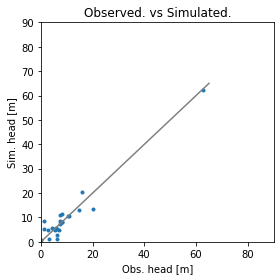

Error is - 2.857264633274882
Params are - [9.78503314e-01 1.66142379e+01 1.14086408e+01 6.99599378e-01
 8.50073808e-01 7.94947656e-02 2.29089694e-03 1.69042538e-01
 1.56827606e-01 6.08757105e-01 1.82544570e-03 7.75536664e+00]


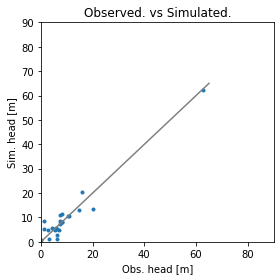

Error is - 2.857255309483723
Params are - [9.76562598e-01 1.67706024e+01 1.14910600e+01 6.97219231e-01
 8.50692017e-01 7.98908718e-02 2.29145797e-03 1.62192018e-01
 1.56929156e-01 6.08713444e-01 1.83909729e-03 7.84709499e+00]


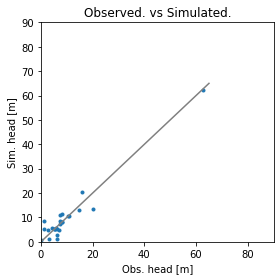

Error is - 2.857252172221123
Params are - [9.81622818e-01 1.67201660e+01 1.14568393e+01 7.00597404e-01
 8.51681460e-01 8.16762592e-02 2.28988391e-03 1.60724722e-01
 1.57037007e-01 6.06297294e-01 1.83138035e-03 7.81538297e+00]


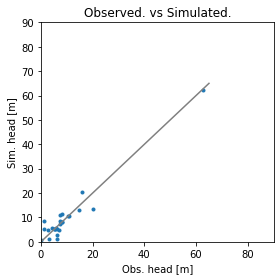

Error is - 2.857258940311684
Params are - [9.96567935e-01 1.67435393e+01 1.15946056e+01 7.05034034e-01
 8.51100243e-01 8.21692253e-02 2.28989424e-03 1.46969398e-01
 1.57478763e-01 6.03671242e-01 1.82254256e-03 7.83709214e+00]


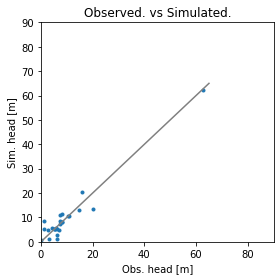

Error is - 2.857250901117291
Params are - [9.74266122e-01 1.67358902e+01 1.13718775e+01 7.00190257e-01
 8.48143921e-01 7.60650312e-02 2.29276026e-03 1.51161482e-01
 1.56545113e-01 6.16370519e-01 1.83505150e-03 7.91320523e+00]


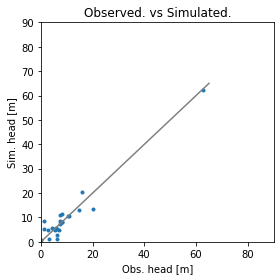

Error is - 2.8572389288248146
Params are - [9.73543131e-01 1.67306130e+01 1.14219975e+01 6.97808551e-01
 8.49791985e-01 8.01046744e-02 2.29191769e-03 1.63579456e-01
 1.56815297e-01 6.10706721e-01 1.83525861e-03 7.82504990e+00]


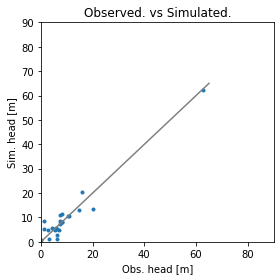

Error is - 2.857231752001243
Params are - [9.62682099e-01 1.67307714e+01 1.14165015e+01 6.93254111e-01
 8.48353606e-01 7.90167106e-02 2.29353711e-03 1.70291248e-01
 1.56647544e-01 6.14779795e-01 1.83994428e-03 7.81819170e+00]


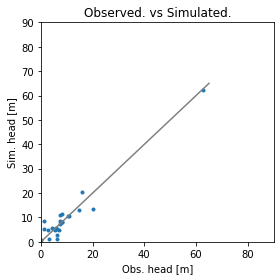

Error is - 2.8572865533383127
Params are - [9.66728447e-01 1.67712340e+01 1.13666687e+01 6.94175402e-01
 8.48997667e-01 7.77847963e-02 2.29323010e-03 1.64953143e-01
 1.56285009e-01 6.14253405e-01 1.84657738e-03 7.90044779e+00]


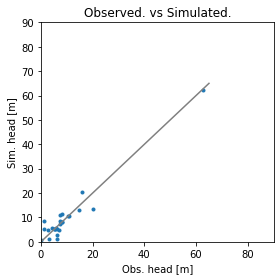

Error is - 2.8572586585694513
Params are - [9.89020831e-01 1.67144682e+01 1.14502113e+01 7.04603592e-01
 8.51799272e-01 8.22982981e-02 2.28949351e-03 1.55129466e-01
 1.57221332e-01 6.04512971e-01 1.82528955e-03 7.80351219e+00]


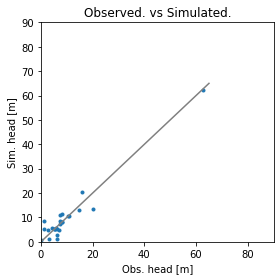

Error is - 2.8572358324838403
Params are - [9.83887990e-01 1.66729919e+01 1.13958112e+01 7.02051311e-01
 8.50248759e-01 8.08382571e-02 2.29029933e-03 1.56030811e-01
 1.57043890e-01 6.08714602e-01 1.82560859e-03 7.84021152e+00]


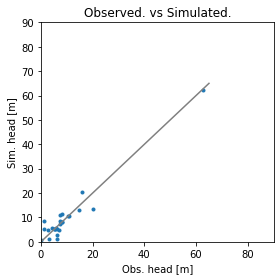

Error is - 2.857246260696893
Params are - [9.87911275e-01 1.66736415e+01 1.15507923e+01 7.01365304e-01
 8.50219089e-01 8.04852859e-02 2.29031162e-03 1.57332940e-01
 1.57335882e-01 6.06694694e-01 1.82141360e-03 7.80407051e+00]


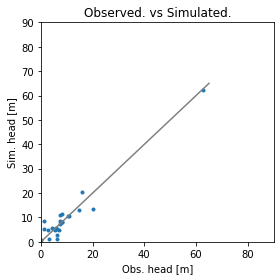

Error is - 2.857254329101525
Params are - [9.80918526e-01 1.67003291e+01 1.15691508e+01 6.98179622e-01
 8.49985499e-01 7.95161548e-02 2.29056628e-03 1.64478105e-01
 1.57403027e-01 6.07852941e-01 1.82491585e-03 7.77849052e+00]


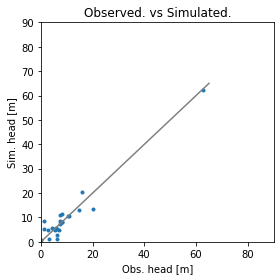

Error is - 2.8572307436905113
Params are - [9.84277091e-01 1.67430789e+01 1.15226560e+01 6.99219281e-01
 8.51164434e-01 8.17178942e-02 2.28952132e-03 1.60820279e-01
 1.57115591e-01 6.05815640e-01 1.82891744e-03 7.81947764e+00]


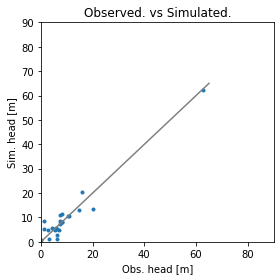

Error is - 2.8572211153254643
Params are - [9.85584347e-01 1.67699923e+01 1.15830453e+01 6.97564961e-01
 8.51650407e-01 8.27085385e-02 2.28856099e-03 1.62758569e-01
 1.57166038e-01 6.04172101e-01 1.82891516e-03 7.81654059e+00]


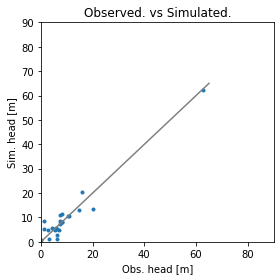

Error is - 2.8572426939025544
Params are - [9.67541139e-01 1.66932005e+01 1.13280012e+01 6.95468322e-01
 8.50348374e-01 7.93751601e-02 2.29084687e-03 1.73426108e-01
 1.56599406e-01 6.11330594e-01 1.83635897e-03 7.80431199e+00]


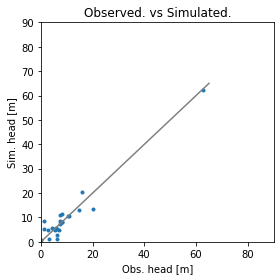

Error is - 2.8572342004697955
Params are - [9.62194548e-01 1.66958491e+01 1.14370486e+01 6.92658912e-01
 8.47843556e-01 7.51923698e-02 2.29305068e-03 1.67886995e-01
 1.56486527e-01 6.18159615e-01 1.83771660e-03 7.84905247e+00]


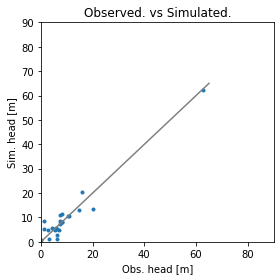

Error is - 2.857220335580885
Params are - [9.65706712e-01 1.67123555e+01 1.14476935e+01 6.92140110e-01
 8.48524819e-01 7.70650723e-02 2.29229139e-03 1.70380523e-01
 1.56592621e-01 6.14833074e-01 1.83785087e-03 7.84719060e+00]


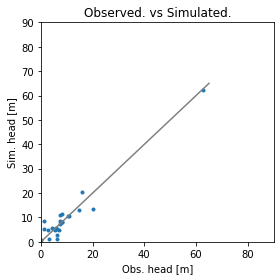

Error is - 2.857211654907271
Params are - [9.54049652e-01 1.67112992e+01 1.14464346e+01 6.85908369e-01
 8.46887593e-01 7.44484594e-02 2.29369033e-03 1.78006051e-01
 1.56278266e-01 6.19993125e-01 1.84413153e-03 7.86902981e+00]


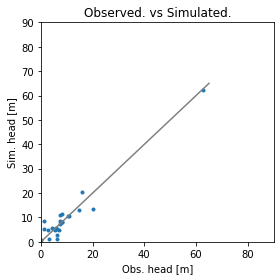

Error is - 2.857220109495132
Params are - [9.74412787e-01 1.66463374e+01 1.13994073e+01 6.97639327e-01
 8.48998003e-01 7.85654299e-02 2.29069899e-03 1.65953644e-01
 1.56776316e-01 6.12512547e-01 1.82488217e-03 7.80726360e+00]


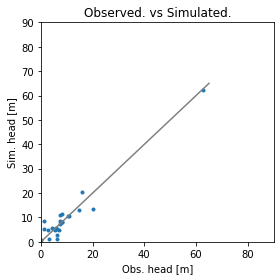

Error is - 2.857221492982377
Params are - [9.67832184e-01 1.66758199e+01 1.15032192e+01 6.94546121e-01
 8.47708988e-01 7.78638204e-02 2.29306851e-03 1.65099853e-01
 1.56938563e-01 6.15405609e-01 1.83176710e-03 7.81656391e+00]


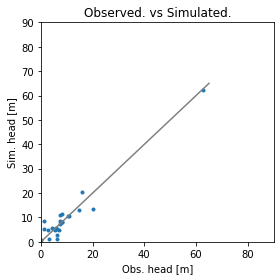

Error is - 2.857226436453861
Params are - [9.66628601e-01 1.66989854e+01 1.13120649e+01 6.95691479e-01
 8.48898956e-01 7.83751791e-02 2.29223780e-03 1.64186587e-01
 1.56226378e-01 6.15587852e-01 1.83915831e-03 7.87785206e+00]


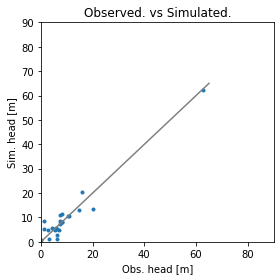

Error is - 2.8572016513677174
Params are - [9.63425272e-01 1.66756185e+01 1.14002474e+01 6.92456043e-01
 8.46739244e-01 7.56648947e-02 2.29331248e-03 1.68516946e-01
 1.56457293e-01 6.18691925e-01 1.83399014e-03 7.85137113e+00]


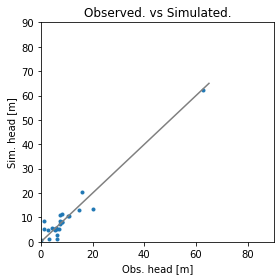

Error is - 2.857230088037386
Params are - [9.54326499e-01 1.66533448e+01 1.13719514e+01 6.88385363e-01
 8.44268136e-01 7.26592124e-02 2.29502677e-03 1.72413058e-01
 1.56167436e-01 6.24889241e-01 1.83529504e-03 7.86936521e+00]


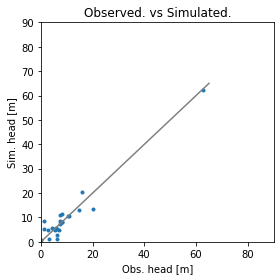

Error is - 2.857219616752974
Params are - [9.68975160e-01 1.66498491e+01 1.14899375e+01 6.91574155e-01
 8.50042670e-01 8.12094332e-02 2.29052817e-03 1.80972764e-01
 1.56934550e-01 6.09005602e-01 1.83014210e-03 7.74324319e+00]


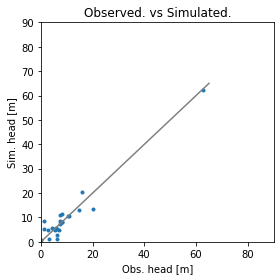

Error is - 2.8571968523736984
Params are - [9.57556379e-01 1.67124645e+01 1.14787689e+01 6.88047525e-01
 8.46766903e-01 7.61779088e-02 2.29324130e-03 1.71761362e-01
 1.56559898e-01 6.19627081e-01 1.83839628e-03 7.86538588e+00]


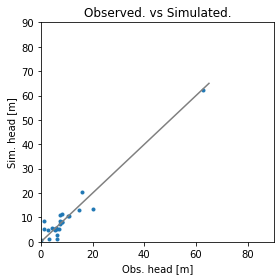

Error is - 2.857185661450885
Params are - [9.44685669e-01 1.67337326e+01 1.15189952e+01 6.81080183e-01
 8.44538869e-01 7.37105226e-02 2.29480402e-03 1.75984181e-01
 1.56378909e-01 6.26333490e-01 1.84395685e-03 7.90596323e+00]


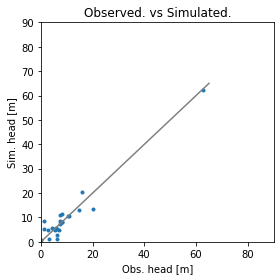

Error is - 2.8572157603183577
Params are - [9.45738632e-01 1.67187664e+01 1.13209933e+01 6.85283578e-01
 8.46824082e-01 7.56761767e-02 2.29379426e-03 1.80852686e-01
 1.55986398e-01 6.22419782e-01 1.84801503e-03 7.86252869e+00]


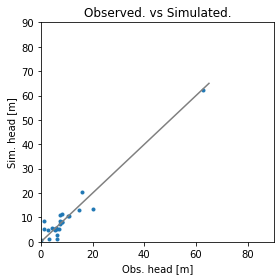

Error is - 2.8571854821260976
Params are - [9.62475018e-01 1.67034684e+01 1.15426165e+01 6.89483103e-01
 8.46107414e-01 7.61698052e-02 2.29375024e-03 1.65997281e-01
 1.56620706e-01 6.19632080e-01 1.83501234e-03 7.87198999e+00]


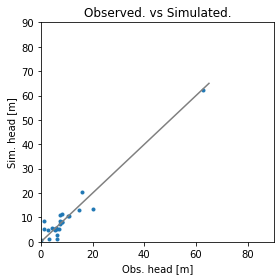

Error is - 2.857169821017065
Params are - [9.59941957e-01 1.67086023e+01 1.16499241e+01 6.86490494e-01
 8.43986934e-01 7.45671278e-02 2.29520192e-03 1.62282867e-01
 1.56631356e-01 6.23782822e-01 1.83433903e-03 7.90582900e+00]


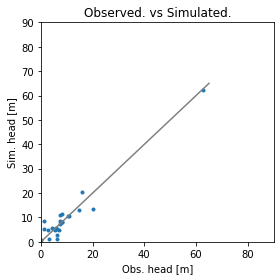

Error is - 2.8571937630655477
Params are - [9.42137161e-01 1.67296120e+01 1.15171586e+01 6.80306644e-01
 8.45163392e-01 7.36615200e-02 2.29511488e-03 1.84434588e-01
 1.56107466e-01 6.24759443e-01 1.84721779e-03 7.84702671e+00]


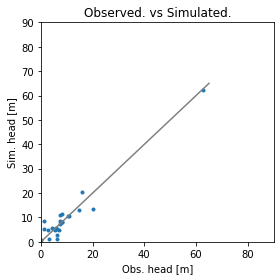

Error is - 2.8572017655626416
Params are - [9.60487706e-01 1.67123820e+01 1.14892729e+01 6.87640333e-01
 8.47121901e-01 7.90522657e-02 2.29270756e-03 1.75336335e-01
 1.56601653e-01 6.16414400e-01 1.83669331e-03 7.83784814e+00]


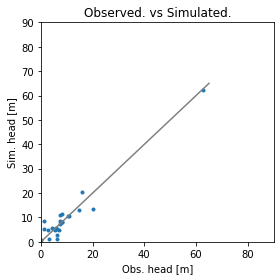

Error is - 2.85716778022494
Params are - [9.59634422e-01 1.66743948e+01 1.15219486e+01 6.86109503e-01
 8.46406567e-01 7.52338508e-02 2.29208288e-03 1.73772930e-01
 1.56432986e-01 6.20066655e-01 1.83392381e-03 7.87198498e+00]


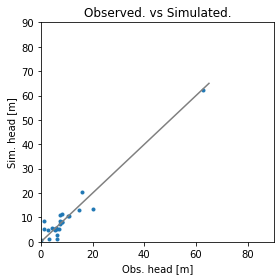

Error is - 2.8571502024100597
Params are - [9.58110583e-01 1.66462065e+01 1.15746721e+01 6.82537200e-01
 8.45433047e-01 7.33424209e-02 2.29135576e-03 1.75513771e-01
 1.56325707e-01 6.22710084e-01 1.83091357e-03 7.89888161e+00]


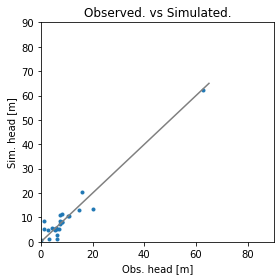

Error is - 2.8571780209338837
Params are - [9.54268251e-01 1.66973842e+01 1.16701530e+01 6.81479755e-01
 8.45283566e-01 7.50365892e-02 2.29323518e-03 1.81765455e-01
 1.56870708e-01 6.20445636e-01 1.83333565e-03 7.81582954e+00]


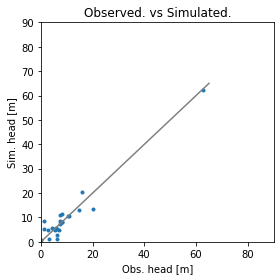

Error is - 2.8571837936276414
Params are - [9.50804012e-01 1.67241439e+01 1.15068210e+01 6.80447386e-01
 8.46069296e-01 7.50767427e-02 2.29243225e-03 1.83629790e-01
 1.56147214e-01 6.21467884e-01 1.84098830e-03 7.87699529e+00]


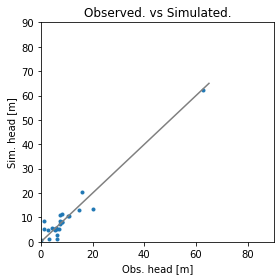

Error is - 2.857173621759379
Params are - [9.27255127e-01 1.66223300e+01 1.14142908e+01 6.74575617e-01
 8.41197692e-01 6.89600586e-02 2.29758498e-03 1.89449611e-01
 1.55749935e-01 6.35584023e-01 1.84585242e-03 7.88709441e+00]


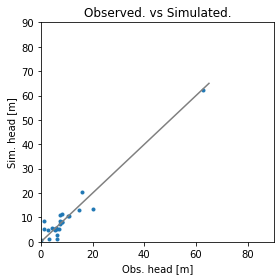

Error is - 2.857172114912456
Params are - [9.30567077e-01 1.67419837e+01 1.16004094e+01 6.70657300e-01
 8.42550045e-01 7.15022720e-02 2.29659465e-03 1.90170530e-01
 1.55968593e-01 6.31088822e-01 1.85338045e-03 7.90967652e+00]


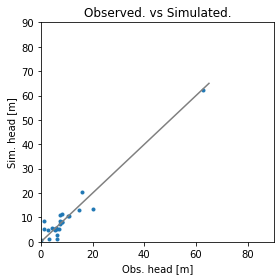

Error is - 2.857154600604841
Params are - [9.29603357e-01 1.67538278e+01 1.15282912e+01 6.73236329e-01
 8.40256607e-01 6.72404085e-02 2.29777655e-03 1.76684372e-01
 1.55649366e-01 6.38276305e-01 1.85199358e-03 8.00143582e+00]


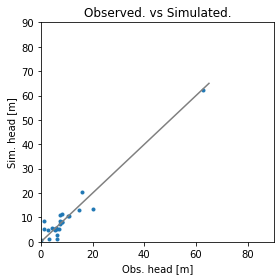

Error is - 2.8571495558937157
Params are - [9.50150672e-01 1.66907540e+01 1.17317851e+01 6.77519031e-01
 8.42380616e-01 7.13677037e-02 2.29517417e-03 1.76109730e-01
 1.56541347e-01 6.27504878e-01 1.83478374e-03 7.90530151e+00]


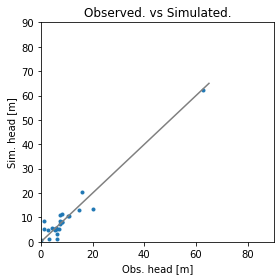

Error is - 2.8571825308924104
Params are - [9.52356691e-01 1.66767478e+01 1.19371809e+01 6.73636757e-01
 8.40158883e-01 6.92134672e-02 2.29586412e-03 1.73738252e-01
 1.56818822e-01 6.30047425e-01 1.82816809e-03 7.92668791e+00]


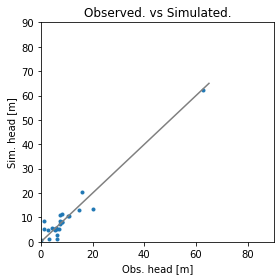

Error is - 2.8571300447877572
Params are - [9.41189823e-01 1.66947971e+01 1.16539022e+01 6.75496016e-01
 8.41565942e-01 7.20819616e-02 2.29552540e-03 1.78640311e-01
 1.56293325e-01 6.31183494e-01 1.83710927e-03 7.90484567e+00]


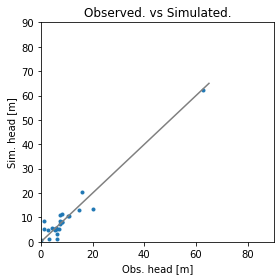

Error is - 2.8571210213799536
Params are - [9.34759908e-01 1.66865461e+01 1.17576360e+01 6.70289840e-01
 8.38905117e-01 7.08987128e-02 2.29644293e-03 1.78957442e-01
 1.56300855e-01 6.36778678e-01 1.83359814e-03 7.92275360e+00]


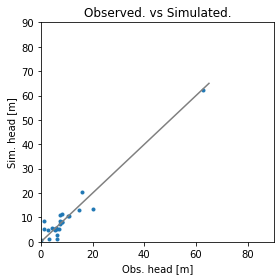

Error is - 2.857146277577086
Params are - [9.30463802e-01 1.66894083e+01 1.16557911e+01 6.70872304e-01
 8.39962170e-01 6.61192299e-02 2.29713073e-03 1.81913545e-01
 1.55919806e-01 6.38156264e-01 1.84403163e-03 7.95017826e+00]


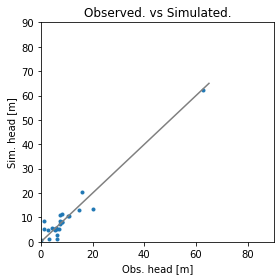

Error is - 2.857130871349769
Params are - [9.22032658e-01 1.67284701e+01 1.17874072e+01 6.62459304e-01
 8.39215314e-01 6.79156568e-02 2.29716219e-03 1.90965701e-01
 1.55974584e-01 6.39122796e-01 1.84840838e-03 7.95312312e+00]


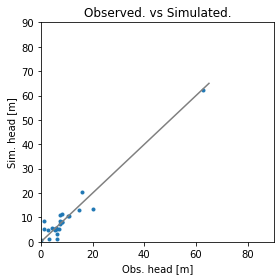

Error is - 2.8571091831913904
Params are - [9.39970018e-01 1.66742862e+01 1.17155374e+01 6.71634146e-01
 8.39799820e-01 6.89613875e-02 2.29570101e-03 1.76136578e-01
 1.56302264e-01 6.35449171e-01 1.83537916e-03 7.97515028e+00]


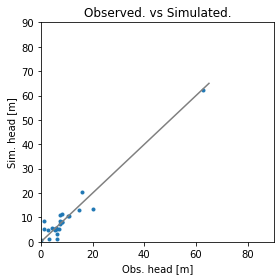

Error is - 2.857089834258291
Params are - [9.38886446e-01 1.66466234e+01 1.18147269e+01 6.67297897e-01
 8.37118033e-01 6.66113213e-02 2.29599407e-03 1.71987573e-01
 1.56399663e-01 6.40794035e-01 1.82945984e-03 8.03921207e+00]


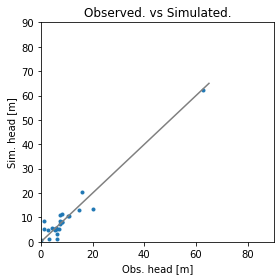

Error is - 2.8571698314664724
Params are - [9.36454972e-01 1.66556474e+01 1.17629895e+01 6.68563560e-01
 8.39187538e-01 6.77291847e-02 2.29621021e-03 1.83920884e-01
 1.56034280e-01 6.36285215e-01 1.83622394e-03 7.93842190e+00]


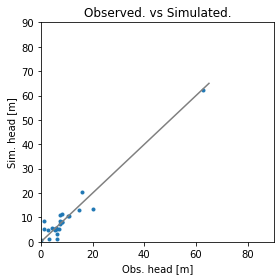

Error is - 2.857126997892501
Params are - [9.27945123e-01 1.66538201e+01 1.18178584e+01 6.67215719e-01
 8.36510150e-01 6.51383717e-02 2.29921165e-03 1.76323790e-01
 1.56247153e-01 6.43620376e-01 1.83839843e-03 7.97762760e+00]


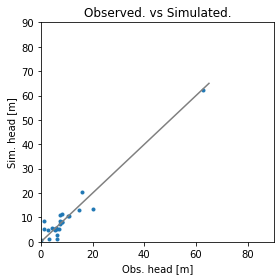

Error is - 2.857128488039951
Params are - [9.20093696e-01 1.66733190e+01 1.16791440e+01 6.63806010e-01
 8.35833645e-01 6.35288222e-02 2.29940479e-03 1.77281180e-01
 1.55419733e-01 6.48505080e-01 1.84689487e-03 8.06575969e+00]


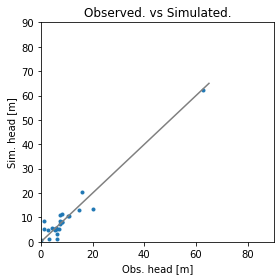

Error is - 2.857105440910747
Params are - [9.45913248e-01 1.67568714e+01 1.19791483e+01 6.68915214e-01
 8.39025510e-01 6.87001468e-02 2.29535828e-03 1.67568953e-01
 1.56485472e-01 6.35520203e-01 1.83455184e-03 8.02427238e+00]


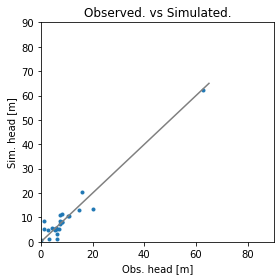

Error is - 2.8571038440506737
Params are - [9.45158993e-01 1.66396991e+01 1.18561529e+01 6.72543184e-01
 8.37085735e-01 6.56909125e-02 2.29614256e-03 1.63081104e-01
 1.56352961e-01 6.40753968e-01 1.82388571e-03 8.02078957e+00]


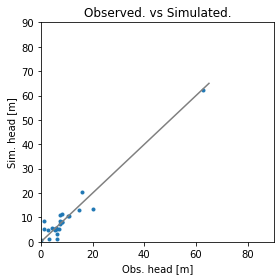

Error is - 2.857139811050557
Params are - [9.40721768e-01 1.67233772e+01 1.17091001e+01 6.75300194e-01
 8.40097942e-01 6.91242877e-02 2.29651572e-03 1.65857454e-01
 1.56340387e-01 6.36302367e-01 1.83898585e-03 8.00577214e+00]


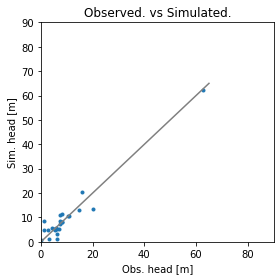

Error is - 2.857081757501777
Params are - [9.14031418e-01 1.66728849e+01 1.18320281e+01 6.55508210e-01
 8.34650381e-01 6.13792047e-02 2.29774298e-03 1.88091236e-01
 1.55694816e-01 6.50891350e-01 1.84164524e-03 8.05502223e+00]


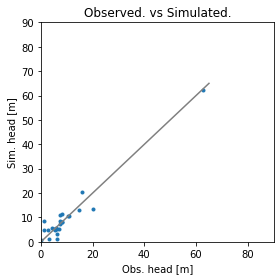

Error is - 2.8570909993776032
Params are - [8.91076149e-01 1.66550262e+01 1.19230801e+01 6.40017068e-01
 8.29982104e-01 5.47852431e-02 2.29901351e-03 2.00995420e-01
 1.55226546e-01 6.64445614e-01 1.84529834e-03 8.12961885e+00]


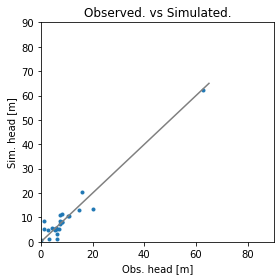

Error is - 2.857119815060657
Params are - [9.41774696e-01 1.66141689e+01 1.20042838e+01 6.65807689e-01
 8.37446336e-01 6.77290566e-02 2.29516276e-03 1.75590875e-01
 1.56684381e-01 6.38500375e-01 1.82226596e-03 7.96834647e+00]


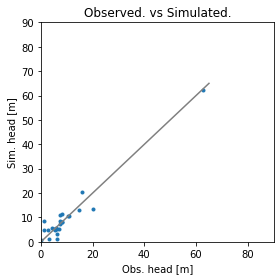

Error is - 2.857121345728496
Params are - [9.10544821e-01 1.67164506e+01 1.20295049e+01 6.53718566e-01
 8.30938778e-01 6.06914835e-02 2.30221804e-03 1.76774327e-01
 1.56067819e-01 6.56698311e-01 1.84190470e-03 8.08247816e+00]


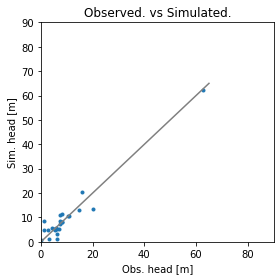

Error is - 2.8570806450579664
Params are - [9.11903758e-01 1.66761858e+01 1.19220119e+01 6.54769991e-01
 8.32084236e-01 6.08868307e-02 2.29957362e-03 1.76289133e-01
 1.55773258e-01 6.56769089e-01 1.83922136e-03 8.10558771e+00]


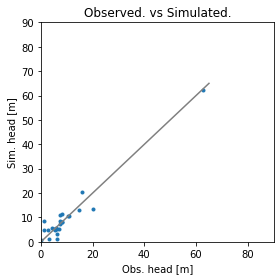

Error is - 2.8570829502421913
Params are - [8.92780301e-01 1.66689017e+01 1.20171253e+01 6.43395471e-01
 8.26936046e-01 5.56463942e-02 2.30177334e-03 1.76378835e-01
 1.55389213e-01 6.71401195e-01 1.84144017e-03 8.20573081e+00]


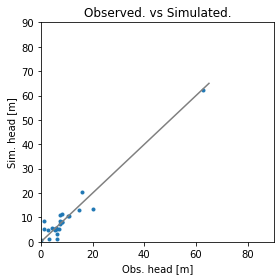

Error is - 2.8571026052737385
Params are - [9.28497286e-01 1.66753278e+01 1.20423760e+01 6.58732998e-01
 8.33189693e-01 6.52632380e-02 2.29802420e-03 1.69547916e-01
 1.56370375e-01 6.49219840e-01 1.82917176e-03 8.08661253e+00]


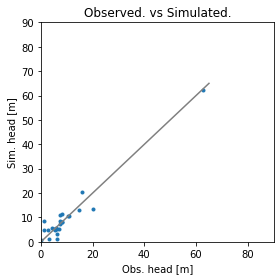

Error is - 2.85713291382359
Params are - [9.16201907e-01 1.66333506e+01 1.20446130e+01 6.51543909e-01
 8.31902546e-01 6.16146718e-02 2.29889062e-03 1.86219084e-01
 1.55954791e-01 6.53226650e-01 1.83258185e-03 8.04449205e+00]


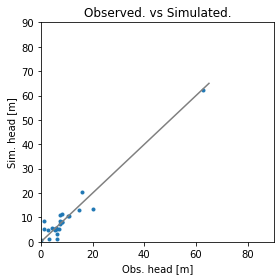

Error is - 2.857089417942244
Params are - [9.22331872e-01 1.66558573e+01 1.19607348e+01 6.57482980e-01
 8.33951395e-01 6.34920758e-02 2.29829690e-03 1.81128677e-01
 1.56051190e-01 6.48995579e-01 1.83418285e-03 8.03481207e+00]


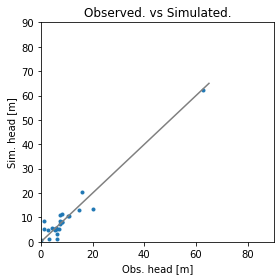

Error is - 2.8570911224914846
Params are - [9.34940887e-01 1.66161557e+01 1.19951938e+01 6.63555413e-01
 8.31907854e-01 6.20860393e-02 2.29843327e-03 1.59471334e-01
 1.56333362e-01 6.52051685e-01 1.82078841e-03 8.11075589e+00]


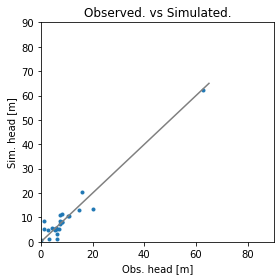

Error is - 2.8571440207396663
Params are - [9.39354380e-01 1.66617794e+01 1.21561319e+01 6.62166940e-01
 8.34635225e-01 6.62324101e-02 2.29602876e-03 1.70187546e-01
 1.57040485e-01 6.43260501e-01 1.81795084e-03 8.00561869e+00]


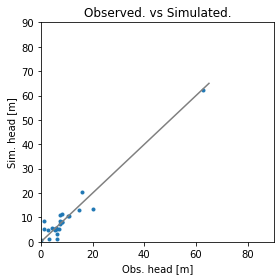

Error is - 2.8570839179465253
Params are - [9.24908867e-01 1.66704341e+01 1.17983910e+01 6.63396243e-01
 8.35534040e-01 6.42047192e-02 2.29856078e-03 1.75507772e-01
 1.55824921e-01 6.47193936e-01 1.83965886e-03 8.05072444e+00]


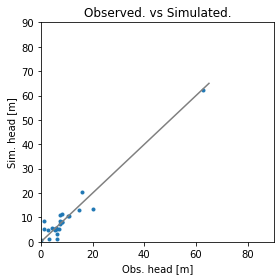

Error is - 2.8570749698255264
Params are - [9.30996911e-01 1.66840474e+01 1.20141730e+01 6.58120652e-01
 8.33796034e-01 6.44672518e-02 2.29611342e-03 1.71008933e-01
 1.56142692e-01 6.48740799e-01 1.82665735e-03 8.10593359e+00]


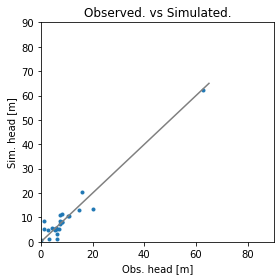

Error is - 2.8570905547040697
Params are - [9.32522805e-01 1.66991610e+01 1.21123303e+01 6.53573119e-01
 8.32438977e-01 6.41316919e-02 2.29456431e-03 1.68351505e-01
 1.56090462e-01 6.51301010e-01 1.82078681e-03 8.17008659e+00]


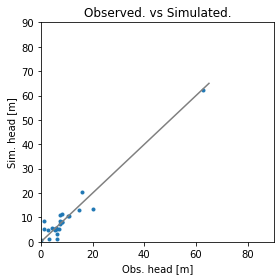

Error is - 2.857086781397392
Params are - [9.51805894e-01 1.66160164e+01 1.17999712e+01 6.72351485e-01
 8.39843616e-01 6.95434347e-02 2.29208959e-03 1.69597498e-01
 1.56334505e-01 6.34336612e-01 1.82060985e-03 8.00499227e+00]


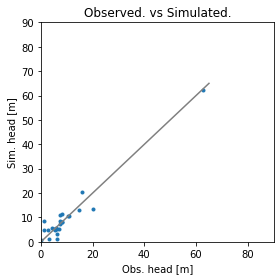

Error is - 2.857086698780377
Params are - [9.30431804e-01 1.66341660e+01 1.20788959e+01 6.56123819e-01
 8.32033694e-01 5.91103258e-02 2.29713914e-03 1.65854392e-01
 1.56107078e-01 6.53849234e-01 1.82675170e-03 8.17842327e+00]


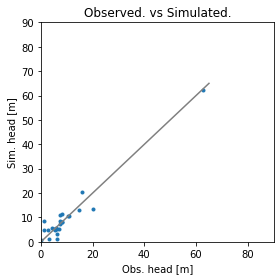

Error is - 2.8570572356819848
Params are - [9.21526535e-01 1.67098760e+01 1.18446835e+01 6.58991992e-01
 8.32590367e-01 6.08435268e-02 2.29874870e-03 1.67598212e-01
 1.55627335e-01 6.54685680e-01 1.83883150e-03 8.16784320e+00]


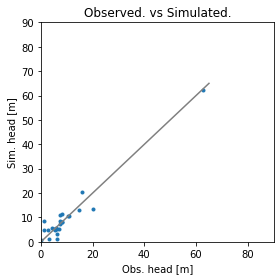

Error is - 2.857089149091267
Params are - [9.11402455e-01 1.67577295e+01 1.17648833e+01 6.55584144e-01
 8.30162383e-01 5.74007619e-02 2.30054168e-03 1.63601880e-01
 1.55098811e-01 6.62778332e-01 1.84711427e-03 8.26759156e+00]


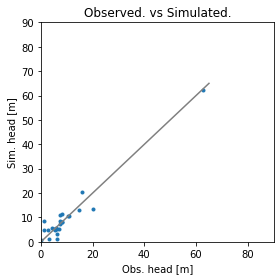

Error is - 2.8570654389598906
Params are - [9.13323531e-01 1.65593408e+01 1.18474081e+01 6.54230597e-01
 8.29938670e-01 5.85630000e-02 2.29911825e-03 1.75625010e-01
 1.55683221e-01 6.60860098e-01 1.82725890e-03 8.13584576e+00]


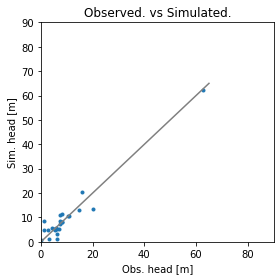

Error is - 2.8570568659071394
Params are - [9.08771875e-01 1.66631202e+01 1.19689461e+01 6.47550529e-01
 8.30687267e-01 6.03842488e-02 2.29882992e-03 1.82203510e-01
 1.55704109e-01 6.58977355e-01 1.83848723e-03 8.15850460e+00]


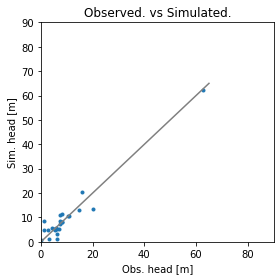

Error is - 2.8570626817754543
Params are - [8.90578316e-01 1.66748307e+01 1.20253427e+01 6.35054202e-01
 8.27488033e-01 5.77309170e-02 2.30017360e-03 1.91764713e-01
 1.55379683e-01 6.68089049e-01 1.84578798e-03 8.22736211e+00]


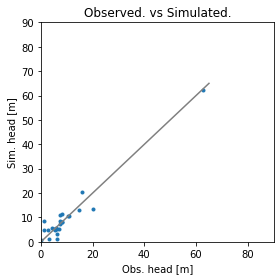

Error is - 2.857073093118383
Params are - [9.22146013e-01 1.66254569e+01 1.17704847e+01 6.59496970e-01
 8.34166238e-01 5.99987585e-02 2.29708257e-03 1.77845964e-01
 1.55575650e-01 6.52137735e-01 1.83475375e-03 8.10466365e+00]


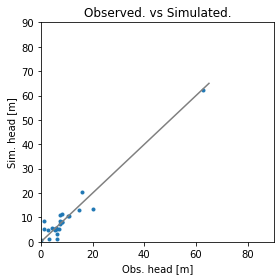

Error is - 2.8570737996400566
Params are - [9.13569934e-01 1.66861792e+01 1.17802154e+01 6.53998149e-01
 8.35824475e-01 6.28280770e-02 2.29644838e-03 1.90984985e-01
 1.55486378e-01 6.49320232e-01 1.84546466e-03 8.07950492e+00]


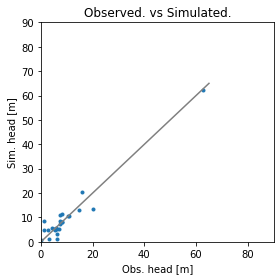

Error is - 2.857060561408233
Params are - [9.05404956e-01 1.66623041e+01 1.19549304e+01 6.48039040e-01
 8.30398702e-01 5.76722543e-02 2.29896331e-03 1.81634980e-01
 1.55267862e-01 6.61998915e-01 1.83946070e-03 8.15776422e+00]


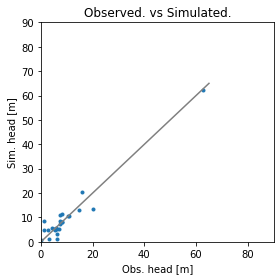

Error is - 2.8570528329457496
Params are - [9.19138377e-01 1.66541447e+01 1.18079551e+01 6.56279966e-01
 8.32973225e-01 5.98215296e-02 2.29677155e-03 1.72578261e-01
 1.55485781e-01 6.55964593e-01 1.83561733e-03 8.18265624e+00]


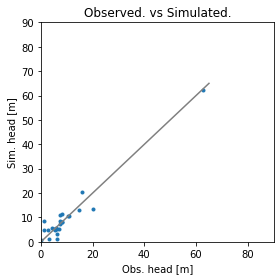

Error is - 2.857056937250596
Params are - [9.17541629e-01 1.66532884e+01 1.17315653e+01 6.55678458e-01
 8.32484140e-01 5.79862564e-02 2.29600887e-03 1.68303053e-01
 1.55203076e-01 6.59449100e-01 1.83633457e-03 8.25657832e+00]


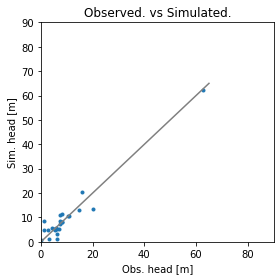

Error is - 2.8570753518395686
Params are - [8.84219770e-01 1.67003403e+01 1.19700494e+01 6.38732874e-01
 8.25935939e-01 5.21498532e-02 2.30375918e-03 1.84606233e-01
 1.55061011e-01 6.74228224e-01 1.85169158e-03 8.24208670e+00]


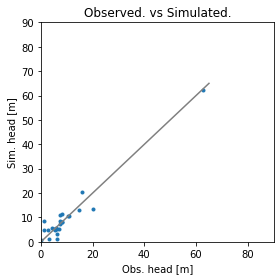

Error is - 2.8570825574396688
Params are - [8.97891853e-01 1.66932198e+01 1.16729835e+01 6.52062050e-01
 8.32729568e-01 6.14228833e-02 2.29981297e-03 1.91474646e-01
 1.55114094e-01 6.58112100e-01 1.84970638e-03 8.07926627e+00]


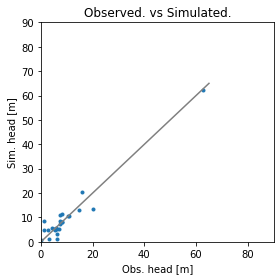

Error is - 2.8570491331548644
Params are - [8.98911955e-01 1.66607492e+01 1.19325872e+01 6.42900594e-01
 8.28761811e-01 5.58648506e-02 2.29860003e-03 1.84482412e-01
 1.55277780e-01 6.66587093e-01 1.83847380e-03 8.21172207e+00]


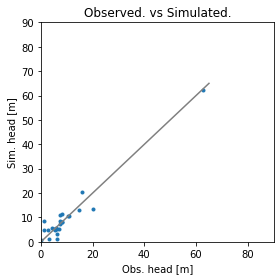

Error is - 2.857062520982051
Params are - [8.85913499e-01 1.66559067e+01 1.19996854e+01 6.32652770e-01
 8.25375696e-01 5.16949164e-02 2.29861966e-03 1.88969732e-01
 1.55004210e-01 6.76283672e-01 1.83788127e-03 8.29222089e+00]


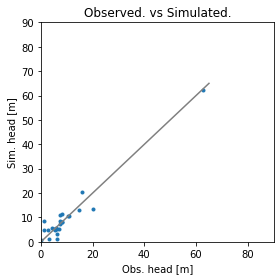

Error is - 2.8570839046930256
Params are - [9.26098986e-01 1.66325518e+01 1.21012619e+01 6.52707878e-01
 8.30904989e-01 5.77203477e-02 2.29714568e-03 1.67350166e-01
 1.56015888e-01 6.57081427e-01 1.82655419e-03 8.20525621e+00]


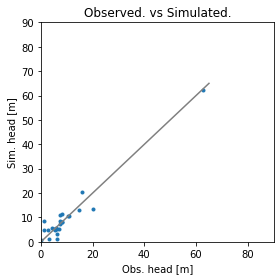

Error is - 2.8570595758583384
Params are - [9.04943636e-01 1.66780528e+01 1.17800531e+01 6.52223507e-01
 8.32273423e-01 6.04972494e-02 2.29914615e-03 1.85443526e-01
 1.55339543e-01 6.57854432e-01 1.84391833e-03 8.11076376e+00]


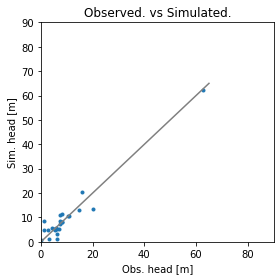

Error is - 2.857047035514019
Params are - [9.08444790e-01 1.66537480e+01 1.19335549e+01 6.48714267e-01
 8.28588017e-01 5.76170338e-02 2.29944954e-03 1.70292291e-01
 1.55375954e-01 6.65462691e-01 1.83499418e-03 8.23879050e+00]


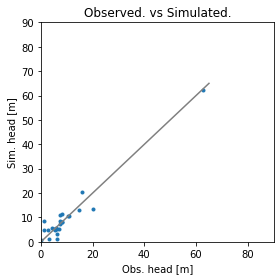

Error is - 2.8570879879830846
Params are - [9.05651476e-01 1.66441796e+01 1.19843183e+01 6.45317295e-01
 8.25556835e-01 5.57359484e-02 2.30030282e-03 1.61392818e-01
 1.55216523e-01 6.72748362e-01 1.83166865e-03 8.33067464e+00]


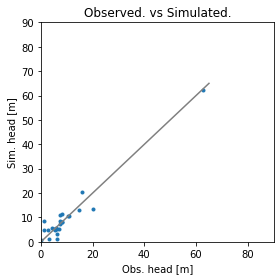

Error is - 2.857072514330484
Params are - [9.09995956e-01 1.66467074e+01 1.18454950e+01 6.48443198e-01
 8.30571459e-01 5.75644416e-02 2.29759822e-03 1.81094920e-01
 1.55231295e-01 6.61033885e-01 1.83671352e-03 8.21042549e+00]


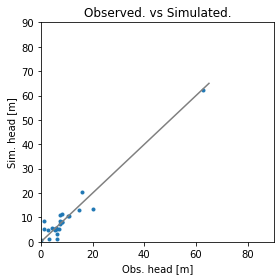

Error is - 2.8570708067485757
Params are - [9.41975975e-01 1.66136142e+01 1.17766984e+01 6.66098703e-01
 8.37492343e-01 6.72038505e-02 2.29238582e-03 1.72192600e-01
 1.55971922e-01 6.41375694e-01 1.82174696e-03 8.06864963e+00]


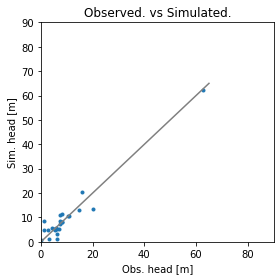

Error is - 2.8570528864091904
Params are - [8.97028678e-01 1.66181682e+01 1.16929957e+01 6.48040600e-01
 8.30248298e-01 5.53425517e-02 2.29941032e-03 1.85987178e-01
 1.54861779e-01 6.65635602e-01 1.84596280e-03 8.19858875e+00]


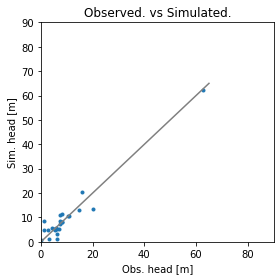

Error is - 2.8570577482963166
Params are - [9.11698779e-01 1.66047012e+01 1.19124166e+01 6.51170178e-01
 8.27290495e-01 5.57341389e-02 2.29956901e-03 1.65178159e-01
 1.55413994e-01 6.67775397e-01 1.82723850e-03 8.24486473e+00]


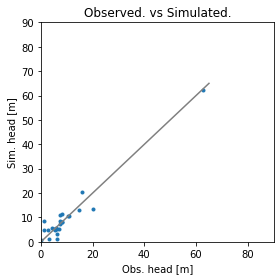

Error is - 2.857057773257209
Params are - [9.01381494e-01 1.66619643e+01 1.19458026e+01 6.44283559e-01
 8.27802775e-01 5.78526875e-02 2.29934923e-03 1.76205879e-01
 1.55297778e-01 6.67564171e-01 1.83669687e-03 8.24307284e+00]


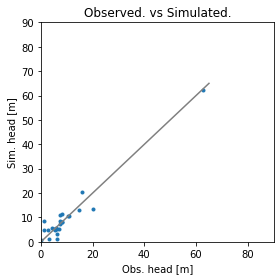

Error is - 2.8570679778170134
Params are - [9.12095808e-01 1.66432565e+01 1.18875103e+01 6.54644057e-01
 8.30936107e-01 6.03350454e-02 2.29912542e-03 1.72142083e-01
 1.55653215e-01 6.59756402e-01 1.83473433e-03 8.14275222e+00]


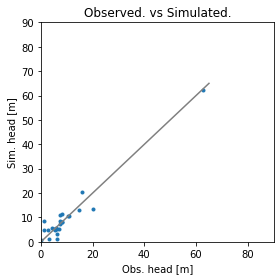

Error is - 2.8570821399334045
Params are - [8.75135760e-01 1.66812902e+01 1.19747756e+01 6.35079445e-01
 8.22922517e-01 4.95508356e-02 2.30546108e-03 1.81035983e-01
 1.54859470e-01 6.82478044e-01 1.85186545e-03 8.29687852e+00]


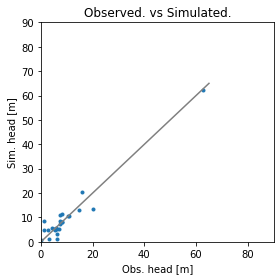

Error is - 2.8570530743632747
Params are - [9.25265921e-01 1.66305332e+01 1.18262177e+01 6.58343888e-01
 8.33849886e-01 6.27905968e-02 2.29565464e-03 1.74403446e-01
 1.55693809e-01 6.51651282e-01 1.82927658e-03 8.12570685e+00]


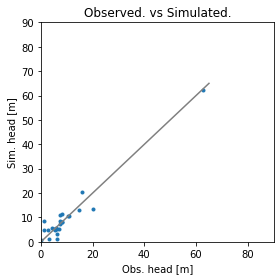

Error is - 2.857072360282717
Params are - [9.07210947e-01 1.66495273e+01 1.18537482e+01 6.47150729e-01
 8.29964383e-01 5.68288993e-02 2.29814302e-03 1.81463394e-01
 1.55184942e-01 6.62746483e-01 1.83796846e-03 8.21993503e+00]


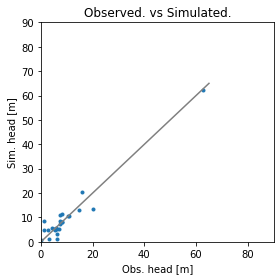

Error is - 2.8570544431386544
Params are - [9.10874592e-01 1.66448242e+01 1.18790698e+01 6.52770725e-01
 8.30693176e-01 5.94585089e-02 2.29887982e-03 1.74472411e-01
 1.55536147e-01 6.60503922e-01 1.83554286e-03 8.16204792e+00]


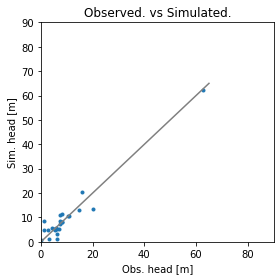

Error is - 2.8570401026580545
Params are - [9.05575067e-01 1.67476901e+01 1.18991273e+01 6.47320877e-01
 8.31087571e-01 5.87501962e-02 2.29811045e-03 1.77788368e-01
 1.55130424e-01 6.61583424e-01 1.84682455e-03 8.23120852e+00]


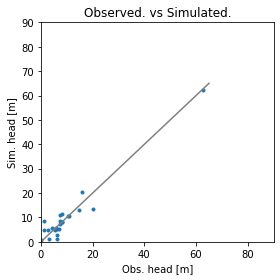

Error is - 2.857070390032769
Params are - [9.01700836e-01 1.68418648e+01 1.19249869e+01 6.43866017e-01
 8.31662021e-01 5.88437944e-02 2.29760655e-03 1.78870046e-01
 1.54854026e-01 6.61945087e-01 1.85660738e-03 8.27888989e+00]


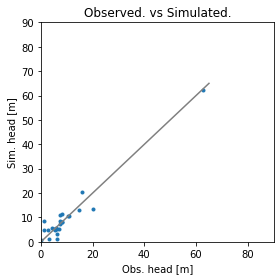

Error is - 2.857041467391909
Params are - [9.13521994e-01 1.66589579e+01 1.17823045e+01 6.53392741e-01
 8.30742350e-01 5.98205989e-02 2.29812325e-03 1.71137295e-01
 1.55522877e-01 6.60375359e-01 1.83585005e-03 8.22153078e+00]


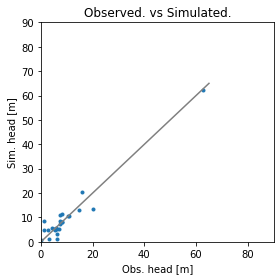

Error is - 2.857041302742021
Params are - [9.15413040e-01 1.66400267e+01 1.19575570e+01 6.49403146e-01
 8.28612449e-01 5.68828287e-02 2.29776993e-03 1.64944378e-01
 1.55481752e-01 6.64939996e-01 1.83004771e-03 8.28699241e+00]


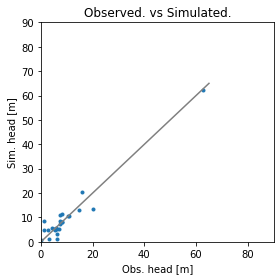

Error is - 2.857057672564096
Params are - [9.21313773e-01 1.66524590e+01 1.17937666e+01 6.58196358e-01
 8.33218044e-01 5.93657474e-02 2.29730363e-03 1.72305107e-01
 1.55554178e-01 6.54792895e-01 1.83616098e-03 8.16200325e+00]


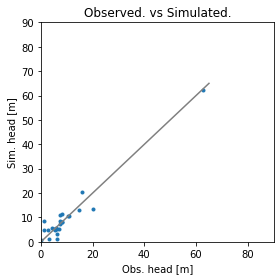

Error is - 2.8570602370634606
Params are - [9.12598987e-01 1.67176817e+01 1.18073776e+01 6.52480769e-01
 8.34718248e-01 6.20895641e-02 2.29670628e-03 1.84520652e-01
 1.55461327e-01 6.52417919e-01 1.84710643e-03 8.14640112e+00]


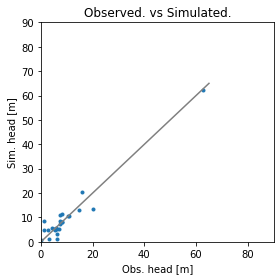

Error is - 2.8570414721770483
Params are - [9.11923831e-01 1.66329463e+01 1.18861569e+01 6.51497826e-01
 8.29147433e-01 5.73229952e-02 2.29885333e-03 1.70013782e-01
 1.55425827e-01 6.63936027e-01 1.83220548e-03 8.22024883e+00]


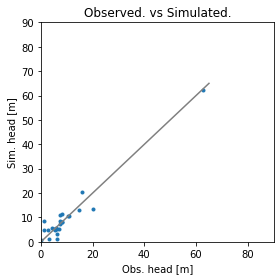

Error is - 2.857053951984531
Params are - [9.01419003e-01 1.66666718e+01 1.19414260e+01 6.44338167e-01
 8.28112265e-01 5.81174969e-02 2.29922995e-03 1.77011817e-01
 1.55299751e-01 6.66924276e-01 1.83752470e-03 8.23897019e+00]


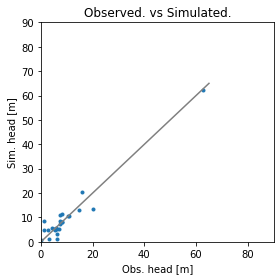

Error is - 2.857054742926173
Params are - [8.97854986e-01 1.66020541e+01 1.19066329e+01 6.41100229e-01
 8.27993591e-01 5.61853792e-02 2.29786508e-03 1.83287646e-01
 1.55171997e-01 6.69071257e-01 1.83463638e-03 8.24498475e+00]


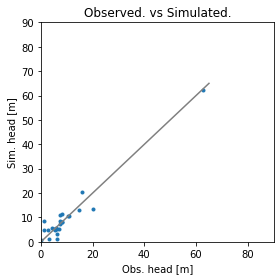

Error is - 2.8570442020254636
Params are - [9.08790164e-01 1.66386322e+01 1.17719848e+01 6.51466641e-01
 8.29447745e-01 5.59448456e-02 2.29762306e-03 1.68863037e-01
 1.55006537e-01 6.66461898e-01 1.83433884e-03 8.26873670e+00]


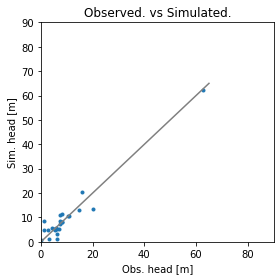

Error is - 2.857051746639453
Params are - [9.21529583e-01 1.67057947e+01 1.18118566e+01 6.59644678e-01
 8.32383780e-01 6.01036263e-02 2.29854756e-03 1.65374800e-01
 1.55511073e-01 6.55933104e-01 1.83814010e-03 8.18621521e+00]


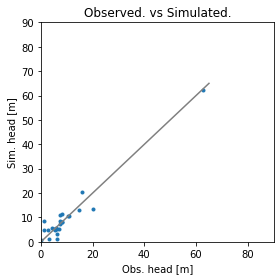

Error is - 2.8570335725026994
Params are - [9.10285808e-01 1.66731863e+01 1.18282175e+01 6.49119840e-01
 8.29965963e-01 5.69380162e-02 2.29747745e-03 1.72673766e-01
 1.55142744e-01 6.63738635e-01 1.83766650e-03 8.27317992e+00]


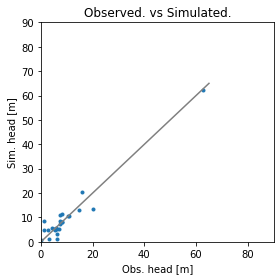

Error is - 2.8570454139617567
Params are - [9.09991416e-01 1.66873674e+01 1.18027913e+01 6.47294397e-01
 8.29602356e-01 5.56777698e-02 2.29677626e-03 1.71774444e-01
 1.54946042e-01 6.65355992e-01 1.83872832e-03 8.32874592e+00]


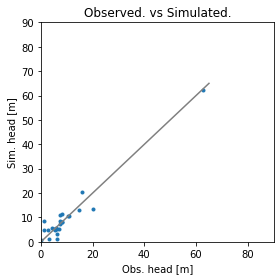

Error is - 2.8570589304820255
Params are - [9.21219199e-01 1.66524245e+01 1.17469932e+01 6.58349344e-01
 8.32855823e-01 5.80824480e-02 2.29683523e-03 1.69411353e-01
 1.55352972e-01 6.56787341e-01 1.83570829e-03 8.20195927e+00]


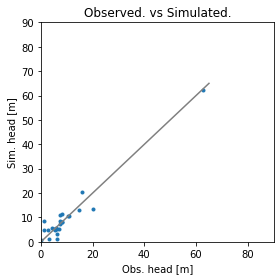

Error is - 2.8570416043339746
Params are - [9.06369052e-01 1.66631100e+01 1.18928178e+01 6.47840961e-01
 8.29298154e-01 5.81087347e-02 2.29863127e-03 1.75111701e-01
 1.55313056e-01 6.64390042e-01 1.83707060e-03 8.22971746e+00]


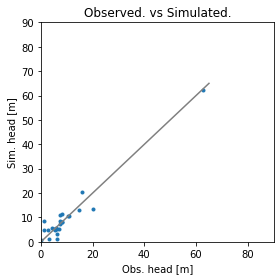

Error is - 2.8570353422664083
Params are - [8.94222802e-01 1.66939926e+01 1.18733015e+01 6.42593134e-01
 8.26359580e-01 5.26290378e-02 2.30090665e-03 1.72137765e-01
 1.54895455e-01 6.74183462e-01 1.84525541e-03 8.33255771e+00]


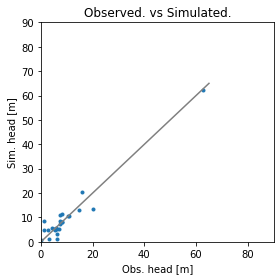

Error is - 2.85706485874857
Params are - [9.21992399e-01 1.67189949e+01 1.20365745e+01 6.51988512e-01
 8.29313048e-01 5.96248305e-02 2.29740036e-03 1.58245798e-01
 1.55733098e-01 6.61623786e-01 1.82845130e-03 8.28200398e+00]


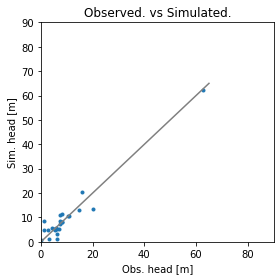

Error is - 2.857039772319156
Params are - [9.03269608e-01 1.66433749e+01 1.17788904e+01 6.49027578e-01
 8.30014486e-01 5.64131214e-02 2.29890783e-03 1.79051833e-01
 1.55079609e-01 6.64632648e-01 1.84158492e-03 8.21944256e+00]


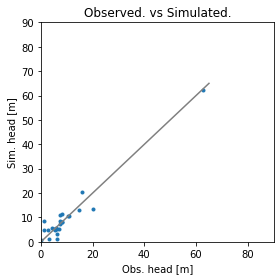

Error is - 2.857056887345992
Params are - [8.97237905e-01 1.66812235e+01 1.19167710e+01 6.42540414e-01
 8.26094998e-01 5.45777847e-02 2.30039518e-03 1.72733644e-01
 1.55041401e-01 6.72739470e-01 1.83979136e-03 8.30406754e+00]


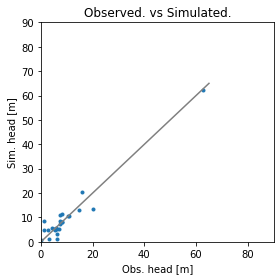

Error is - 2.857043465095521
Params are - [9.13663259e-01 1.66609144e+01 1.18351591e+01 6.52845078e-01
 8.31253668e-01 5.85105933e-02 2.29767745e-03 1.72617107e-01
 1.55374686e-01 6.60158312e-01 1.83666084e-03 8.21300906e+00]


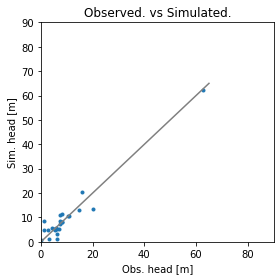

Error is - 2.8570476252922186
Params are - [8.93535645e-01 1.66220934e+01 1.19167532e+01 6.38042436e-01
 8.26496091e-01 5.40301825e-02 2.29847415e-03 1.81144156e-01
 1.54993377e-01 6.73475161e-01 1.83702204e-03 8.30497421e+00]


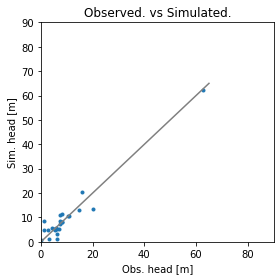

Error is - 2.8570371170297815
Params are - [9.15257222e-01 1.66606963e+01 1.17933836e+01 6.53976827e-01
 8.29740441e-01 5.79631801e-02 2.29840070e-03 1.61480168e-01
 1.55179269e-01 6.63969183e-01 1.83644639e-03 8.29500937e+00]


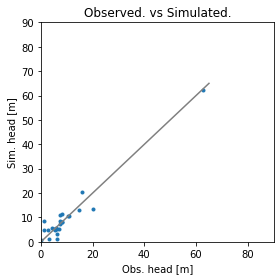

Error is - 2.85706027112408
Params are - [9.24253794e-01 1.67057858e+01 1.17886560e+01 6.61490716e-01
 8.32546885e-01 6.04533478e-02 2.29851434e-03 1.61541092e-01
 1.55494654e-01 6.55496785e-01 1.83780220e-03 8.20009643e+00]


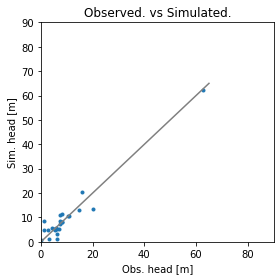

Error is - 2.85703859124965
Params are - [9.01215182e-01 1.66430165e+01 1.18847289e+01 6.43904506e-01
 8.28008789e-01 5.56359738e-02 2.29848419e-03 1.76243390e-01
 1.55118697e-01 6.68980567e-01 1.83721708e-03 8.27875476e+00]


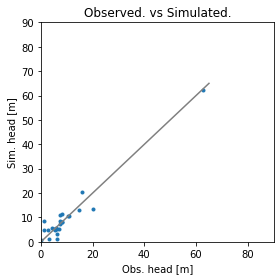

Error is - 2.857035200916097
Params are - [9.08139715e-01 1.66723427e+01 1.17637167e+01 6.50017259e-01
 8.30358421e-01 5.65363198e-02 2.29737806e-03 1.73384808e-01
 1.55069201e-01 6.64095568e-01 1.84020055e-03 8.27294084e+00]


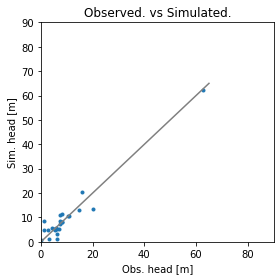

Error is - 2.857034570072047
Params are - [9.07685933e-01 1.66930769e+01 1.19239088e+01 6.47023321e-01
 8.29650472e-01 5.83070871e-02 2.29916370e-03 1.75567689e-01
 1.55449062e-01 6.62701973e-01 1.84183284e-03 8.24369534e+00]


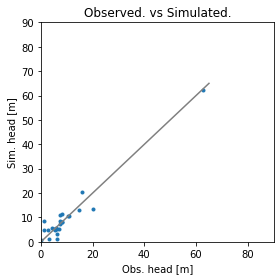

Error is - 2.8570312742196404
Params are - [9.01816617e-01 1.66761552e+01 1.18755261e+01 6.44674591e-01
 8.27577350e-01 5.57074216e-02 2.29935701e-03 1.72305384e-01
 1.55093310e-01 6.69429502e-01 1.84037284e-03 8.30453735e+00]


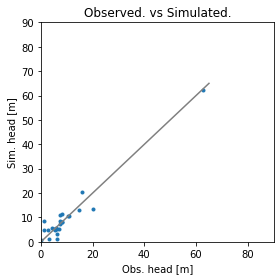

Error is - 2.857052139777357
Params are - [8.95893295e-01 1.66837755e+01 1.18957096e+01 6.40589348e-01
 8.25739191e-01 5.43058358e-02 2.30019679e-03 1.72149523e-01
 1.54952622e-01 6.74065096e-01 1.84222884e-03 8.35030150e+00]


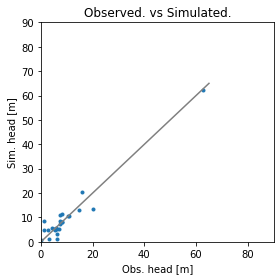

Error is - 2.857030186780717
Params are - [9.08352085e-01 1.66761338e+01 1.18149854e+01 6.49150980e-01
 8.29246063e-01 5.57090614e-02 2.29852415e-03 1.69343071e-01
 1.55118315e-01 6.66037682e-01 1.84051345e-03 8.30029894e+00]


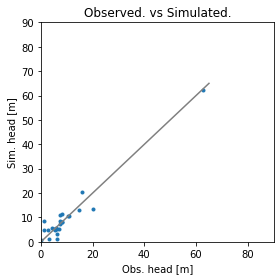

Error is - 2.8570347458989676
Params are - [9.09343601e-01 1.66826457e+01 1.17760692e+01 6.49805989e-01
 8.29220018e-01 5.45092248e-02 2.29847060e-03 1.66458756e-01
 1.55020944e-01 6.66861501e-01 1.84223488e-03 8.33558967e+00]


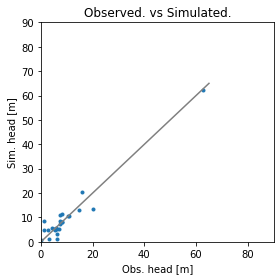

Error is - 2.8570292791638856
Params are - [9.02202014e-01 1.67134953e+01 1.18097844e+01 6.45102974e-01
 8.29413222e-01 5.62258119e-02 2.29824723e-03 1.74329204e-01
 1.54954292e-01 6.66841973e-01 1.84676323e-03 8.32310926e+00]


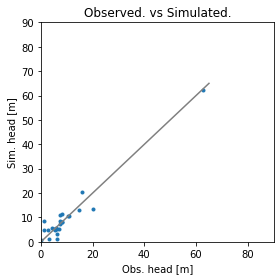

Error is - 2.8570444257563863
Params are - [8.97341106e-01 1.67537698e+01 1.17715982e+01 6.41905548e-01
 8.29546117e-01 5.56772203e-02 2.29794418e-03 1.76486914e-01
 1.54718524e-01 6.68294945e-01 1.85404211e-03 8.37453947e+00]


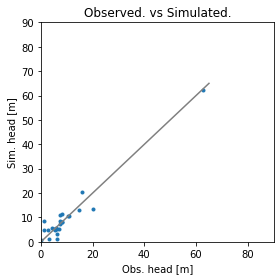

Error is - 2.8570458671420385
Params are - [8.98717189e-01 1.66965733e+01 1.19182167e+01 6.41826432e-01
 8.27596785e-01 5.31290772e-02 2.29899797e-03 1.73737676e-01
 1.54762478e-01 6.71480410e-01 1.84493753e-03 8.33875705e+00]


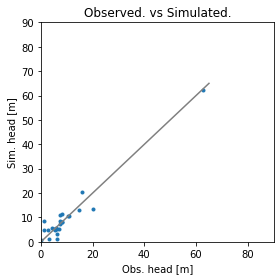

Error is - 2.8570345062870506
Params are - [9.09820792e-01 1.66683618e+01 1.18162826e+01 6.50501163e-01
 8.29955958e-01 5.81477184e-02 2.29834193e-03 1.71787390e-01
 1.55332777e-01 6.63151622e-01 1.83812192e-03 8.25083735e+00]


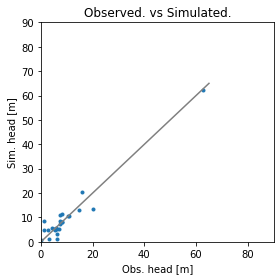

Error is - 2.857042195737077
Params are - [8.95894101e-01 1.67202270e+01 1.17194185e+01 6.45999029e-01
 8.29950603e-01 5.62776623e-02 2.29944663e-03 1.81071095e-01
 1.54778774e-01 6.66617710e-01 1.85208557e-03 8.26726958e+00]


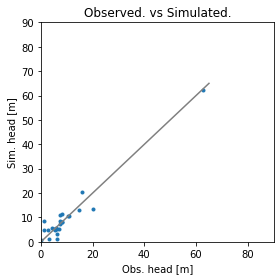

Error is - 2.8570341005945883
Params are - [9.10533305e-01 1.66600768e+01 1.18980224e+01 6.48552117e-01
 8.28946988e-01 5.67315371e-02 2.29818910e-03 1.68976057e-01
 1.55306007e-01 6.65359425e-01 1.83555718e-03 8.28206170e+00]


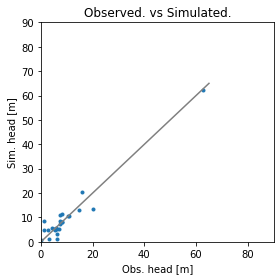

Error is - 2.857033824920494
Params are - [9.06558447e-01 1.65979613e+01 1.17776640e+01 6.48286505e-01
 8.27118718e-01 5.40738515e-02 2.29911922e-03 1.66758387e-01
 1.55159365e-01 6.70603616e-01 1.83343083e-03 8.33152900e+00]


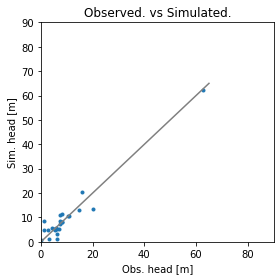

Error is - 2.8570321705723694
Params are - [9.09412045e-01 1.66947077e+01 1.18976966e+01 6.46456292e-01
 8.27709175e-01 5.60210481e-02 2.29835707e-03 1.63446014e-01
 1.55223474e-01 6.68549553e-01 1.83731145e-03 8.36197603e+00]


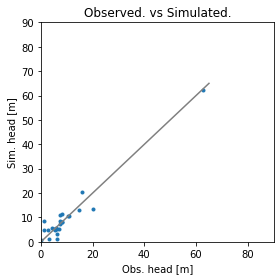

Error is - 2.85702778143458
Params are - [9.12832615e-01 1.67036812e+01 1.17940193e+01 6.52004661e-01
 8.29664936e-01 5.68623747e-02 2.29875952e-03 1.64121560e-01
 1.55201849e-01 6.64129798e-01 1.84169501e-03 8.31653404e+00]


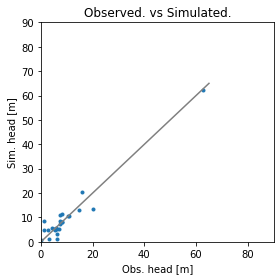

Error is - 2.8570420679611446
Params are - [9.18641331e-01 1.67340136e+01 1.17486646e+01 6.56054738e-01
 8.30493009e-01 5.74755752e-02 2.29889718e-03 1.58060645e-01
 1.55243425e-01 6.61704414e-01 1.84393398e-03 8.33542368e+00]


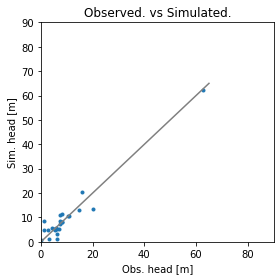

Error is - 2.8570307566257784
Params are - [8.98386474e-01 1.66931656e+01 1.18854706e+01 6.41603646e-01
 8.27920701e-01 5.43517009e-02 2.29890282e-03 1.79325014e-01
 1.55145039e-01 6.69167951e-01 1.84334048e-03 8.30386688e+00]


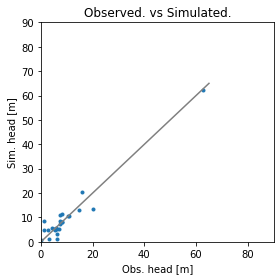

Error is - 2.8570301703565453
Params are - [9.20114840e-01 1.66597315e+01 1.18075809e+01 6.52822424e-01
 8.31561748e-01 5.99729537e-02 2.29606289e-03 1.69865292e-01
 1.55470451e-01 6.58117754e-01 1.83421231e-03 8.26153673e+00]


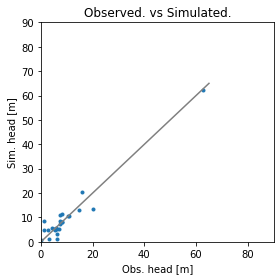

Error is - 2.857033537467411
Params are - [9.08193781e-01 1.66792795e+01 1.19244764e+01 6.45865826e-01
 8.27763461e-01 5.66384440e-02 2.29937229e-03 1.68031664e-01
 1.55363579e-01 6.67209346e-01 1.83826912e-03 8.31925291e+00]


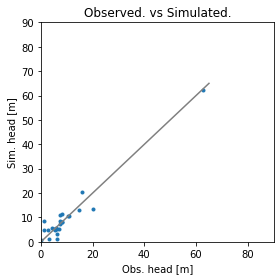

Error is - 2.8570343987410314
Params are - [9.08732205e-01 1.66562458e+01 1.17643789e+01 6.48666849e-01
 8.28156908e-01 5.45895695e-02 2.29762142e-03 1.64592778e-01
 1.54969472e-01 6.69354170e-01 1.83604289e-03 8.36109135e+00]


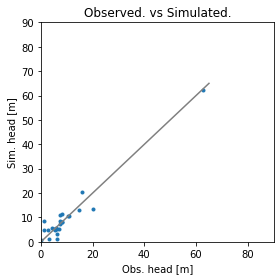

Error is - 2.857026706674979
Params are - [9.06415914e-01 1.66789416e+01 1.18633545e+01 6.44883287e-01
 8.27551581e-01 5.41559133e-02 2.29832310e-03 1.67173975e-01
 1.55025206e-01 6.69938279e-01 1.83940730e-03 8.37232500e+00]


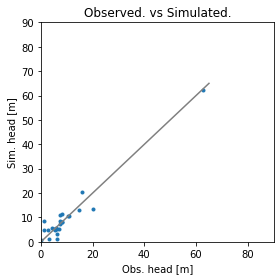

Error is - 2.8570416798668044
Params are - [9.04713474e-01 1.66842315e+01 1.18868905e+01 6.42074349e-01
 8.26349392e-01 5.21600108e-02 2.29831368e-03 1.64867267e-01
 1.54871420e-01 6.73331608e-01 1.84004998e-03 8.43306883e+00]


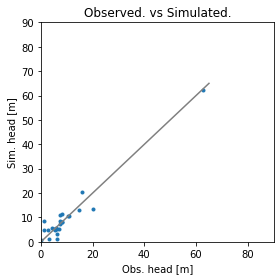

Error is - 2.8570309966084704
Params are - [9.07118453e-01 1.66948402e+01 1.19317541e+01 6.46087008e-01
 8.29249743e-01 5.76417863e-02 2.29916056e-03 1.74798787e-01
 1.55397800e-01 6.63833082e-01 1.84204706e-03 8.26394328e+00]


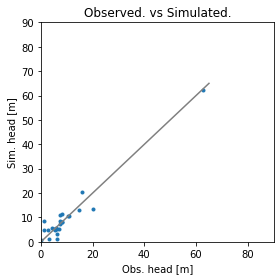

Error is - 2.85702052993344
Params are - [9.04748210e-01 1.66968031e+01 1.18037326e+01 6.45790889e-01
 8.28510122e-01 5.56515269e-02 2.29875478e-03 1.71385962e-01
 1.55076563e-01 6.67573437e-01 1.84361442e-03 8.33995319e+00]


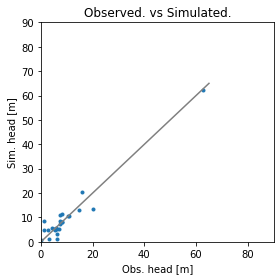

Error is - 2.8570178005909956
Params are - [9.01855663e-01 1.67151663e+01 1.17565877e+01 6.44410275e-01
 8.28291689e-01 5.51115217e-02 2.29903762e-03 1.72590915e-01
 1.54961841e-01 6.68680443e-01 1.84764305e-03 8.36889893e+00]


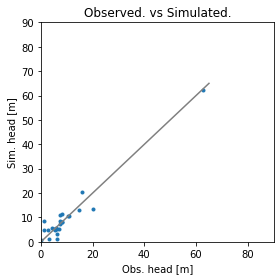

Error is - 2.8570332246289456
Params are - [9.07939272e-01 1.67784527e+01 1.19205782e+01 6.45410463e-01
 8.30533887e-01 5.84821574e-02 2.29781107e-03 1.74575721e-01
 1.55190285e-01 6.62008717e-01 1.84810947e-03 8.29671421e+00]


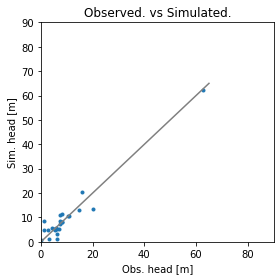

Error is - 2.857020844164456
Params are - [9.03820821e-01 1.67207721e+01 1.18854182e+01 6.43958898e-01
 8.27781297e-01 5.58753497e-02 2.29950844e-03 1.68977334e-01
 1.55214830e-01 6.68585378e-01 1.84561430e-03 8.35898567e+00]


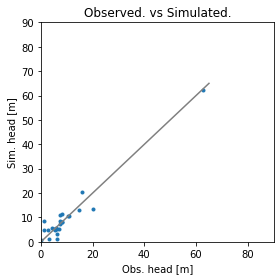

Error is - 2.8570282950096684
Params are - [9.05184021e-01 1.67215943e+01 1.17826496e+01 6.46895090e-01
 8.29986771e-01 5.60477395e-02 2.29763629e-03 1.73777048e-01
 1.54969202e-01 6.65344006e-01 1.84623587e-03 8.31953481e+00]


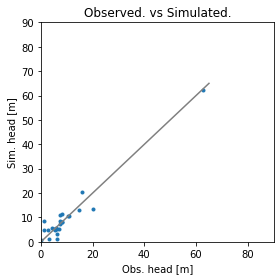

Error is - 2.857030634034165
Params are - [9.04979322e-01 1.66129448e+01 1.17635597e+01 6.47597892e-01
 8.27125159e-01 5.37982897e-02 2.29916838e-03 1.67099879e-01
 1.55105650e-01 6.71100516e-01 1.83608326e-03 8.34587694e+00]


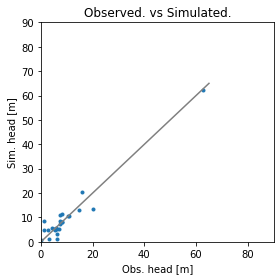

Error is - 2.8570274706677923
Params are - [9.02767761e-01 1.66830626e+01 1.17640852e+01 6.46742329e-01
 8.29852535e-01 5.58889394e-02 2.29875760e-03 1.78838563e-01
 1.55052824e-01 6.64984841e-01 1.84667658e-03 8.27793194e+00]


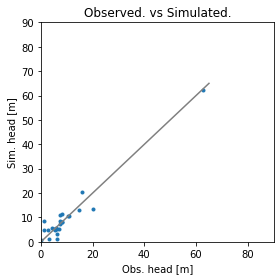

Error is - 2.8570292930164918
Params are - [9.10521714e-01 1.67027664e+01 1.17676822e+01 6.48868653e-01
 8.30363557e-01 5.62328188e-02 2.29765776e-03 1.71068056e-01
 1.55176240e-01 6.63364116e-01 1.84466581e-03 8.33093638e+00]


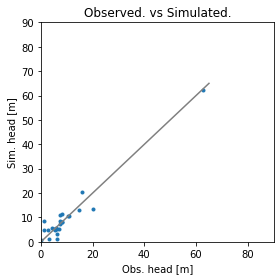

Error is - 2.8570340071857436
Params are - [9.05787088e-01 1.66854024e+01 1.16841089e+01 6.47919843e-01
 8.28876800e-01 5.40636262e-02 2.29760374e-03 1.67952865e-01
 1.54834823e-01 6.68882374e-01 1.84342804e-03 8.38269597e+00]


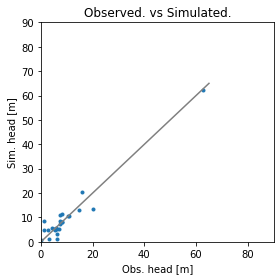

Error is - 2.857025275687605
Params are - [9.06785612e-01 1.66924808e+01 1.18698428e+01 6.46545217e-01
 8.29156507e-01 5.67472462e-02 2.29877136e-03 1.73087306e-01
 1.55257056e-01 6.65095405e-01 1.84239231e-03 8.29363145e+00]


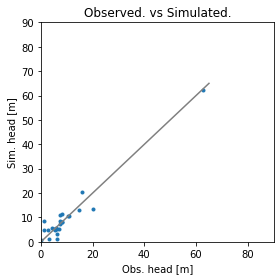

Error is - 2.8570259348191196
Params are - [9.15918922e-01 1.66869628e+01 1.17277877e+01 6.53226801e-01
 8.30411810e-01 5.77529691e-02 2.29783957e-03 1.62387019e-01
 1.55106253e-01 6.62868747e-01 1.84197660e-03 8.34106647e+00]


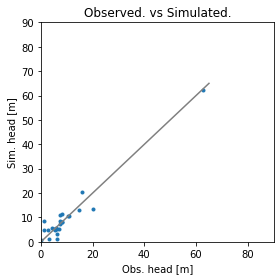

Error is - 2.857034159732689
Params are - [9.11149342e-01 1.67795200e+01 1.18437366e+01 6.48170706e-01
 8.31755127e-01 5.89654935e-02 2.29735254e-03 1.73826678e-01
 1.55145743e-01 6.59564221e-01 1.85021604e-03 8.29825466e+00]


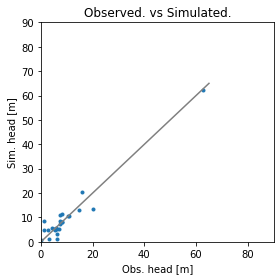

Error is - 2.857025298535331
Params are - [9.06521827e-01 1.66545886e+01 1.17836039e+01 6.47741095e-01
 8.28282651e-01 5.50900907e-02 2.29871442e-03 1.68781579e-01
 1.55115673e-01 6.68216442e-01 1.83961645e-03 8.33397137e+00]


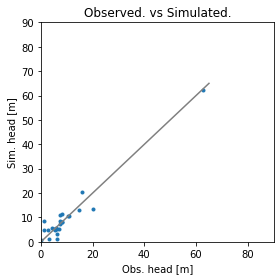

Error is - 2.8570176707041934
Params are - [9.07471536e-01 1.67127402e+01 1.17870807e+01 6.46382637e-01
 8.29473654e-01 5.69515600e-02 2.29802848e-03 1.71489904e-01
 1.55132638e-01 6.64990182e-01 1.84563635e-03 8.34944474e+00]


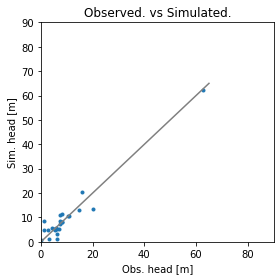

Error is - 2.8570166910448784
Params are - [9.07031261e-01 1.67310433e+01 1.17731283e+01 6.44998466e-01
 8.29587450e-01 5.75728093e-02 2.29778064e-03 1.72563321e-01
 1.55139799e-01 6.64466432e-01 1.84819779e-03 8.37401764e+00]


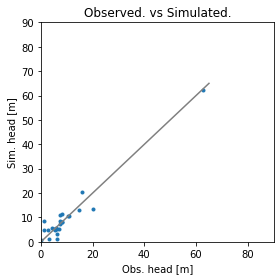

Error is - 2.8570365971399196
Params are - [8.93528184e-01 1.67410277e+01 1.17887431e+01 6.41407201e-01
 8.26828919e-01 5.22876437e-02 2.30077603e-03 1.71417355e-01
 1.54725393e-01 6.73968223e-01 1.85426841e-03 8.40695377e+00]


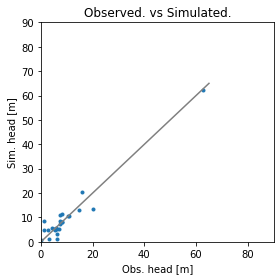

Error is - 2.857024329260677
Params are - [9.13468176e-01 1.66800556e+01 1.18028714e+01 6.49968618e-01
 8.30378541e-01 5.80516262e-02 2.29724118e-03 1.70253308e-01
 1.55284186e-01 6.62080371e-01 1.83922633e-03 8.29789099e+00]


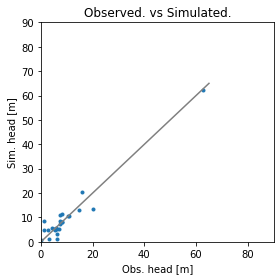

Error is - 2.857036615505182
Params are - [9.03612387e-01 1.66942077e+01 1.18345067e+01 6.45544299e-01
 8.28029607e-01 5.63309132e-02 2.29911174e-03 1.70078799e-01
 1.55037595e-01 6.68507904e-01 1.84290833e-03 8.33204655e+00]


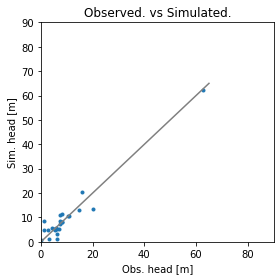

Error is - 2.857024205691308
Params are - [9.08794382e-01 1.67006267e+01 1.17843883e+01 6.48037564e-01
 8.29780070e-01 5.62573424e-02 2.29802125e-03 1.70820742e-01
 1.55141579e-01 6.64650063e-01 1.84422644e-03 8.33121392e+00]


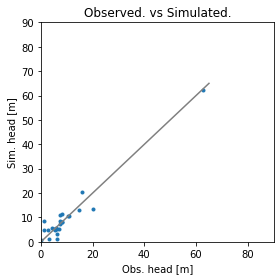

Error is - 2.8570209175555306
Params are - [9.13030815e-01 1.66813340e+01 1.17881717e+01 6.49799076e-01
 8.29041084e-01 5.63431751e-02 2.29848460e-03 1.66232908e-01
 1.55290758e-01 6.64664729e-01 1.84038811e-03 8.34122445e+00]


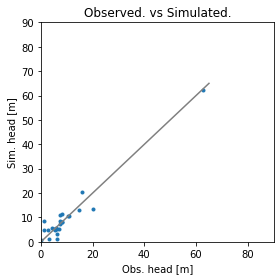

Error is - 2.8570288846971903
Params are - [9.11356607e-01 1.66665250e+01 1.18162270e+01 6.48490958e-01
 8.28309921e-01 5.65704868e-02 2.29923693e-03 1.65527707e-01
 1.55329440e-01 6.66049482e-01 1.83994084e-03 8.34841383e+00]


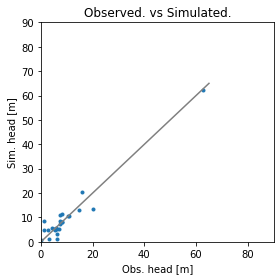

Error is - 2.8570234626322026
Params are - [9.06727168e-01 1.67078270e+01 1.17910439e+01 6.47294057e-01
 8.29567558e-01 5.61784263e-02 2.29803645e-03 1.71714713e-01
 1.55059262e-01 6.65520375e-01 1.84466211e-03 8.32675457e+00]


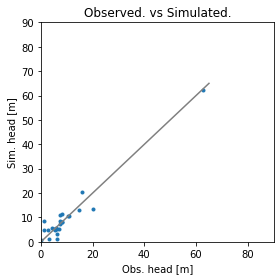

Error is - 2.8570170899354097
Params are - [9.02690438e-01 1.66851290e+01 1.18043613e+01 6.42596287e-01
 8.28615526e-01 5.56418602e-02 2.29799319e-03 1.76448720e-01
 1.55073029e-01 6.67495453e-01 1.84497621e-03 8.35311803e+00]


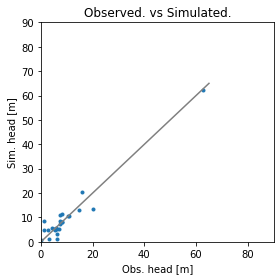

Error is - 2.857023956706427
Params are - [9.12742405e-01 1.67060920e+01 1.18410081e+01 6.47167611e-01
 8.28221759e-01 5.65741157e-02 2.29786770e-03 1.61333410e-01
 1.55225422e-01 6.67058845e-01 1.83971125e-03 8.40425114e+00]


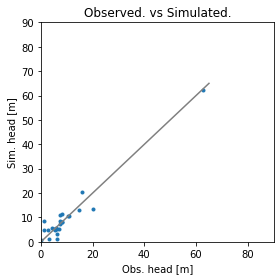

Error is - 2.857020022060283
Params are - [9.10148668e-01 1.67147381e+01 1.17380144e+01 6.49407374e-01
 8.30634410e-01 5.87101755e-02 2.29822631e-03 1.72024571e-01
 1.55286409e-01 6.61625502e-01 1.84703120e-03 8.31517910e+00]


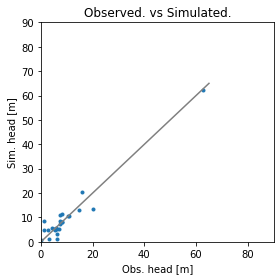

Error is - 2.857019118608526
Params are - [8.99683950e-01 1.67113461e+01 1.18752857e+01 6.40427289e-01
 8.27811280e-01 5.52726540e-02 2.29877429e-03 1.78417785e-01
 1.55235387e-01 6.68487826e-01 1.84530433e-03 8.34212307e+00]


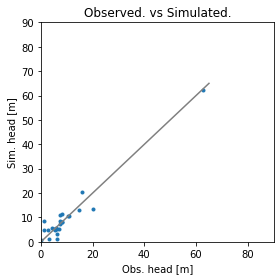

Error is - 2.857019048014777
Params are - [9.07941399e-01 1.67531799e+01 1.18347497e+01 6.44694027e-01
 8.29861878e-01 5.79659597e-02 2.29790942e-03 1.73629260e-01
 1.55245920e-01 6.63185361e-01 1.84861245e-03 8.35057679e+00]


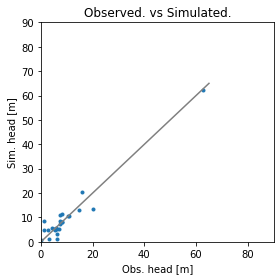

Error is - 2.8570133427399775
Params are - [9.07870246e-01 1.67254043e+01 1.17426620e+01 6.45581373e-01
 8.29105583e-01 5.65119231e-02 2.29770883e-03 1.69413858e-01
 1.55102681e-01 6.65988058e-01 1.84687329e-03 8.40040760e+00]


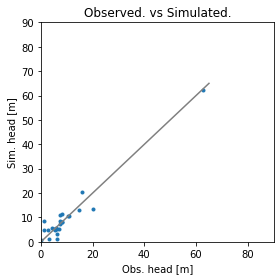

Error is - 2.85701691268645
Params are - [9.08412563e-01 1.67418660e+01 1.16790716e+01 6.45099452e-01
 8.29080121e-01 5.63942615e-02 2.29717756e-03 1.67577134e-01
 1.55025494e-01 6.66434384e-01 1.84911377e-03 8.45379567e+00]


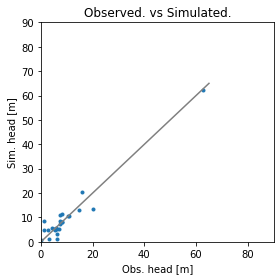

Error is - 2.857016809386533
Params are - [9.00254693e-01 1.67453876e+01 1.17995985e+01 6.41426765e-01
 8.27671390e-01 5.49509259e-02 2.29931694e-03 1.72107948e-01
 1.55045300e-01 6.69654373e-01 1.85131375e-03 8.41323416e+00]


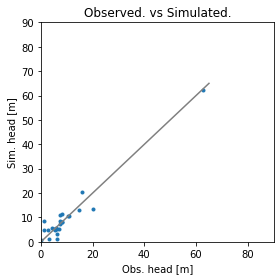

Error is - 2.8570179873624912
Params are - [9.03505206e-01 1.67322766e+01 1.18206166e+01 6.42256019e-01
 8.27918414e-01 5.65274737e-02 2.29875282e-03 1.71755049e-01
 1.55171861e-01 6.67918733e-01 1.84749487e-03 8.39358127e+00]


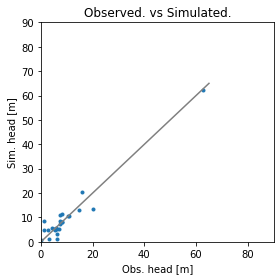

Error is - 2.857027637091657
Params are - [8.98017649e-01 1.67311754e+01 1.17605982e+01 6.42307373e-01
 8.29426167e-01 5.62029267e-02 2.29905389e-03 1.82979320e-01
 1.55079091e-01 6.65653265e-01 1.85330732e-03 8.31876573e+00]


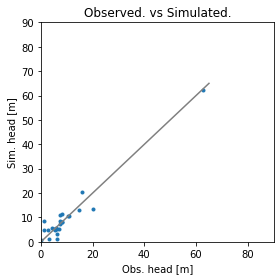

Error is - 2.85701770593932
Params are - [9.09061216e-01 1.67123629e+01 1.18209057e+01 6.45952552e-01
 8.28522861e-01 5.64813184e-02 2.29816425e-03 1.66744887e-01
 1.55188839e-01 6.66707450e-01 1.84311027e-03 8.38287979e+00]


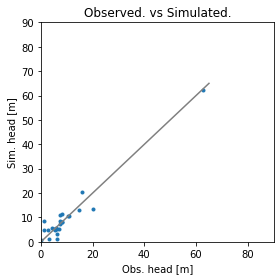

Error is - 2.857014915427564
Params are - [9.04421895e-01 1.67301964e+01 1.18155394e+01 6.41957343e-01
 8.27906252e-01 5.66490981e-02 2.29890644e-03 1.71769713e-01
 1.55266847e-01 6.67389581e-01 1.84809782e-03 8.40561652e+00]


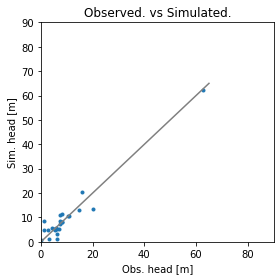

Error is - 2.857031337778553
Params are - [8.96683428e-01 1.67648331e+01 1.18229728e+01 6.38145368e-01
 8.28243588e-01 5.65353365e-02 2.29852860e-03 1.78174319e-01
 1.55031366e-01 6.68699370e-01 1.85365678e-03 8.40187865e+00]


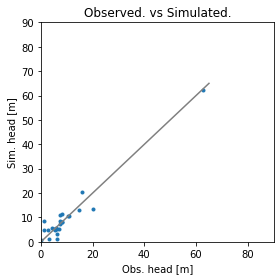

Error is - 2.857013953103889
Params are - [9.08943968e-01 1.67022088e+01 1.17968720e+01 6.46885649e-01
 8.28841710e-01 5.63912154e-02 2.29849560e-03 1.69218261e-01
 1.55225910e-01 6.65673389e-01 1.84370527e-03 8.35638800e+00]


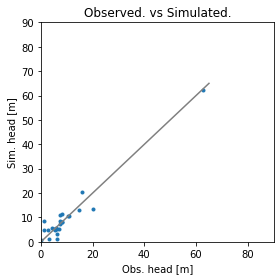

Error is - 2.8570161766557054
Params are - [9.06747280e-01 1.67223011e+01 1.17109686e+01 6.44473338e-01
 8.29680111e-01 5.70891395e-02 2.29733595e-03 1.75470048e-01
 1.55109141e-01 6.64293389e-01 1.84811242e-03 8.38368448e+00]


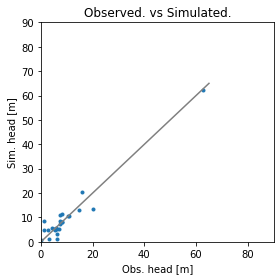

Error is - 2.8570217157503266
Params are - [8.99852535e-01 1.67295956e+01 1.18538649e+01 6.38202524e-01
 8.26667947e-01 5.39841411e-02 2.29846969e-03 1.72997057e-01
 1.55008017e-01 6.71697913e-01 1.84687572e-03 8.43890861e+00]


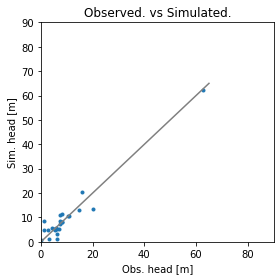

Error is - 2.857015476763293
Params are - [9.07574635e-01 1.67184525e+01 1.17669770e+01 6.46606161e-01
 8.29642794e-01 5.75286669e-02 2.29828715e-03 1.72267692e-01
 1.55216811e-01 6.64143605e-01 1.84699233e-03 8.34611148e+00]


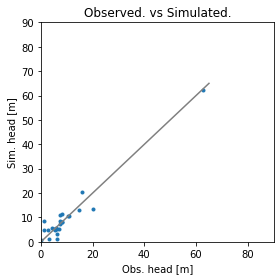

Error is - 2.8570348536119234
Params are - [9.11632367e-01 1.67341720e+01 1.16985421e+01 6.48212420e-01
 8.29796330e-01 5.77976646e-02 2.29784052e-03 1.65578827e-01
 1.55055942e-01 6.64111552e-01 1.84888393e-03 8.41262937e+00]


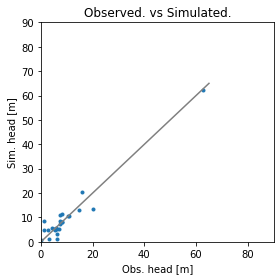

Error is - 2.857014626765204
Params are - [9.02671054e-01 1.67170526e+01 1.18310998e+01 6.42373572e-01
 8.28307543e-01 5.59039067e-02 2.29854085e-03 1.75208046e-01
 1.55190526e-01 6.67393758e-01 1.84619923e-03 8.35974965e+00]


In [33]:
# run optimization 

"""             {-12:Alluvium_Aua, 
               -14:Alluvium_Fagaalu, 
               -15:Alluvium_minor,
               -13:Alluvium_Utulei,
               -11:Alluvium_Vaipito,
               -10:Alluvium_Vatia,
               -50:Dikes,
               -30:Pago_inner_E,
               -40:Pago_inner_W,
               -20:Pago_outer,
               -60:Trachyte,     
               -16:Alluvium_Laulii}}   """

# Start
# params = [4.6, 13.0, 0.1, 5.0, 2.6, 0.4, 0.3, 0.1, 0.5, 0.6, 0.3]
# Better
# params = [2.1, 28.6, 0.05, 7.2, 1.8, 0.7, 0.01, 0.15, 0.4, 1.5, 0.01]
# Better
# params = [2.6, 39, 1, 14, 3.7, 1.2, 0.001, 0.37, 0.9, 0.7, 0.003, 1]

params = [0.7, 16, 16,  0.5, 1.0, 0.5, 0.002, 0.75, 0.17, 0.3, 0.0018, 3.75] 

# The main optimization function
results = opt.minimize(calibrateo, x0= params, method="Nelder-Mead",tol = 0.1)

In [ ]:
bestso far [2.14, 35, 2.41, 1.18, 1.38, 1.16, 0.01 0.3, 0.2, 0.3 0.2, 2.0]

[6.85496496e-01 3.25213077e+01 6.80654543e+00 1.86383679e+00
 1.51808179e+00 5.06743373e+00 1.03195373e-03 9.94528435e-01
 2.66379794e-01 2.22365422e-01 1.67176201e-03 2.62836815e+00]

[0.7, 32, 6.8, 1.9, 1.5, 5.0, 0.001, 1.0, 0.25, 0.2, 0.0015, 2.5] 
[0.4, 55, 9.1, 1.3, 1.4, 1.4, 0.001, 1.0, 0.21, 0.3, 0.0017, 2.6] 
[0.7, 16, 16,  0.5, 1.0, 0.5, 0.002, 0.75, 0.17, 0.3, 0.0018, 3.75] 


In [26]:
calibrateo(results["x"])

Error is - 3.2446989745873096
Params are - [2.66734909e+00 3.88938662e+01 1.35015054e-03 1.44380768e+01
 3.70378031e+00 1.11188899e+00 9.53875900e-04 3.65098285e-01
 8.97305579e-01 7.23140076e-01 3.12300993e-03]


3.2446989745873096

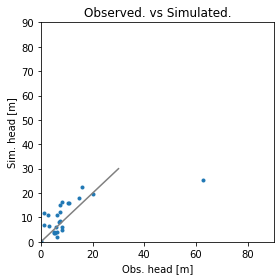

In [30]:
plot_calibrateo(Howd_we_do)